In [1]:
import pandas as pd

# Load the CSV files
natural_disturbance_df = pd.read_csv('/Users/yanlei/Documents/PhD/postdoc_3B/NEON_download/naturalDisturbance.csv')
chemistry_df = pd.read_csv('/Users/yanlei/Documents/PhD/postdoc_3B/NEON_download/slsChemistry_natural_disturbance.csv')

# Preview the datasets to understand their structure
natural_disturbance_df.head(), chemistry_df.head()

# Extract siteID and associated wind disturbance startDates
disturbance_dates_df = natural_disturbance_df[['siteID', 'startDate']].drop_duplicates()

# Convert startDate to datetime for proper handling
disturbance_dates_df['startDate'] = pd.to_datetime(disturbance_dates_df['startDate'], errors='coerce').dt.date

# Group by siteID and aggregate disturbance dates into lists
site_disturbance_dates = disturbance_dates_df.groupby('siteID')['startDate'].apply(list).reset_index()

# Prepare the second dataframe (chemistry data) for plotting
chemistry_df['startDate'] = pd.to_datetime(chemistry_df['startDate'], errors='coerce').dt.date
chemistry_df['organicCPercent'] = pd.to_numeric(chemistry_df['organicCPercent'], errors='coerce')

# Display site-disturbance dates
site_disturbance_dates


/var/folders/vn/9hl_w2d11hl2hq3wmj3lr2f00000gn/T/ipykernel_44472/2054808635.py:14: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  disturbance_dates_df['startDate'] = pd.to_datetime(disturbance_dates_df['startDate'], errors='coerce').dt.date


,siteID,startDate
0,ABBY,"[2016-10-01, 2016-10-31, 2016-11-30, 2016-12-30]"
1,ARIK,"[2017-02-01, 2023-06-23]"
2,BART,"[2019-10-29, 2023-06-01, 2023-07-01, 2023-07-3..."
3,BIGC,[2020-04-05]
4,BLAN,[2018-05-16]
5,BLDE,[2022-06-12]
6,BLUE,"[2017-07-01, 2018-05-02, 2018-05-19, 2018-08-1..."
7,BONA,[2019-04-03]
8,CLBJ,[2017-09-26]
9,COMO,"[2019-05-01, 2019-06-03, 2019-05-31, 2019-06-30]"


In [2]:
site_disturbance_dates.to_csv('/Users/yanlei/Documents/PhD/postdoc_3B/NEON_download/wind_site_disturbance_dates.csv')

In [19]:
import seaborn as sns
# Re-filter sites again
valid_plots = []

for site in site_disturbance_dates['siteID'].unique():
    chemistry_site_df = chemistry_df[chemistry_df['plotID'].str.contains(site, na=False)]

    if chemistry_site_df.empty:
        continue

    disturbance_dates = site_disturbance_dates[site_disturbance_dates['siteID'] == site]['startDate'].values[0]
    for plot in chemistry_site_df['plotID'].unique():
        plot_df = chemistry_site_df[chemistry_site_df['plotID'] == plot]
        min_date = plot_df['startDate'].min()
        max_date = plot_df['startDate'].max()
    # Make sure we only compare valid dates
        if pd.isnull(min_date) or pd.isnull(max_date):
            continue

        if any(min_date <= date <= max_date for date in disturbance_dates if pd.notnull(date)):
            valid_plots.append(plot)

print(valid_plots)

['BART_004', 'BART_023', 'BART_005', 'BART_001', 'BART_002', 'BART_003', 'BART_040', 'BART_071', 'BART_042', 'BART_036', 'BLAN_033', 'BLAN_031', 'BLAN_032', 'BLAN_005', 'BLAN_007', 'BLAN_004', 'BLAN_003', 'BLAN_001', 'DELA_014', 'DELA_002', 'DELA_003', 'DELA_001', 'DELA_038', 'DELA_041', 'DELA_040', 'DELA_037', 'DELA_005', 'DELA_004', 'DSNY_041', 'DSNY_005', 'DSNY_003', 'DSNY_001', 'DSNY_009', 'DSNY_004', 'DSNY_043', 'DSNY_044', 'DSNY_042', 'DSNY_006', 'GUAN_002', 'GUAN_004', 'GUAN_001', 'GUAN_007', 'GUAN_003', 'GUAN_049', 'GUAN_048', 'GUAN_042', 'GUAN_006', 'GUAN_043', 'JERC_003', 'JERC_047', 'JERC_002', 'JERC_006', 'JERC_048', 'JERC_001', 'JERC_005', 'JERC_049', 'LENO_002', 'LENO_061', 'LENO_003', 'LENO_062', 'LENO_063', 'LENO_006', 'LENO_064', 'LENO_004', 'LENO_005', 'LENO_001', 'MLBS_005', 'MLBS_001', 'MLBS_003', 'MLBS_002', 'MLBS_064', 'MLBS_061', 'MLBS_006', 'MLBS_007', 'MLBS_067', 'MLBS_063', 'MOAB_044', 'MOAB_045', 'MOAB_047', 'MOAB_005', 'MOAB_002', 'MOAB_046', 'MOAB_003', 'MO

BART_004


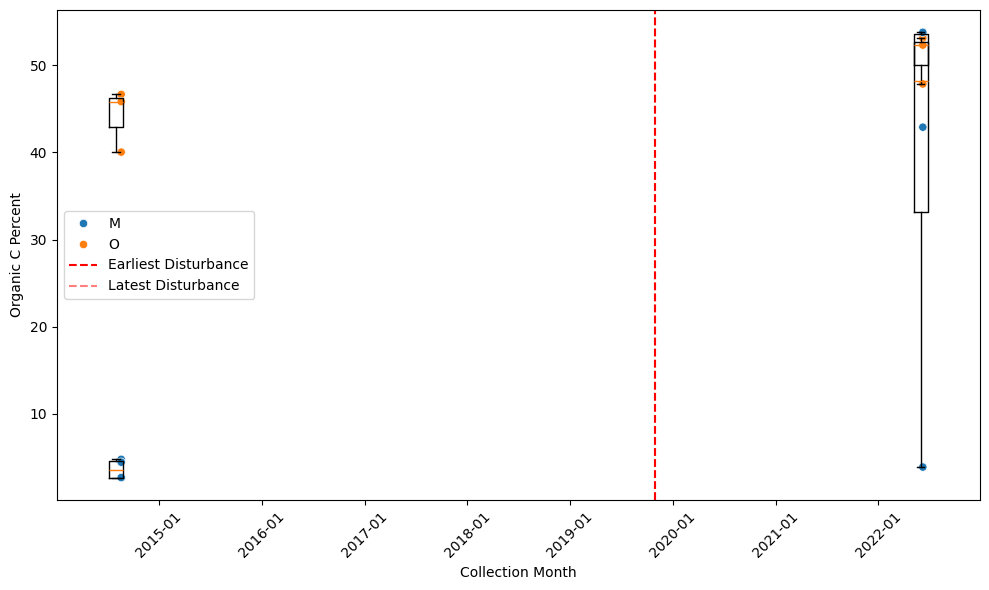


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1         NaN
2         NaN
3     38.4975
4         NaN
5         NaN
6         NaN
7         NaN
8         NaN
9         NaN
10        NaN
11        NaN
12        NaN
13        NaN
14        NaN
15        NaN
16        NaN
17        NaN
18        NaN
19        NaN
20        NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     51.073333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BART_023


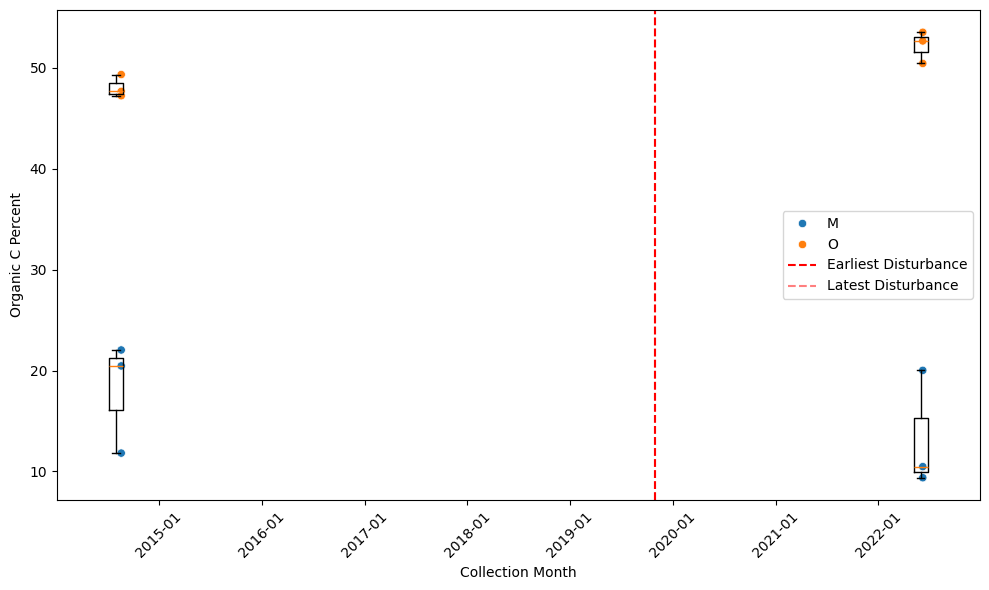


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     13.293333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     52.213333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BART_005


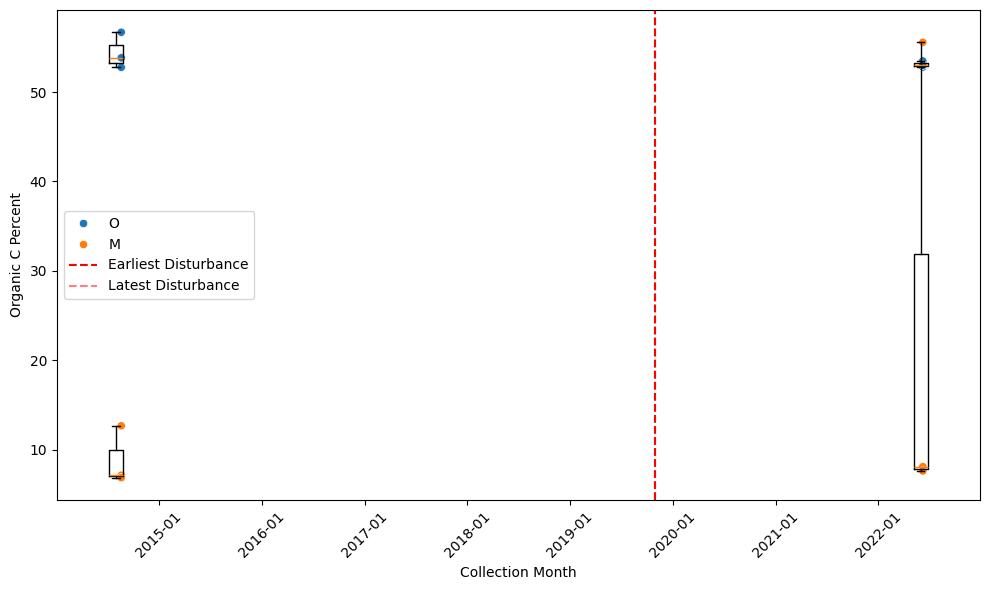


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     23.763333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     53.096667
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BART_001


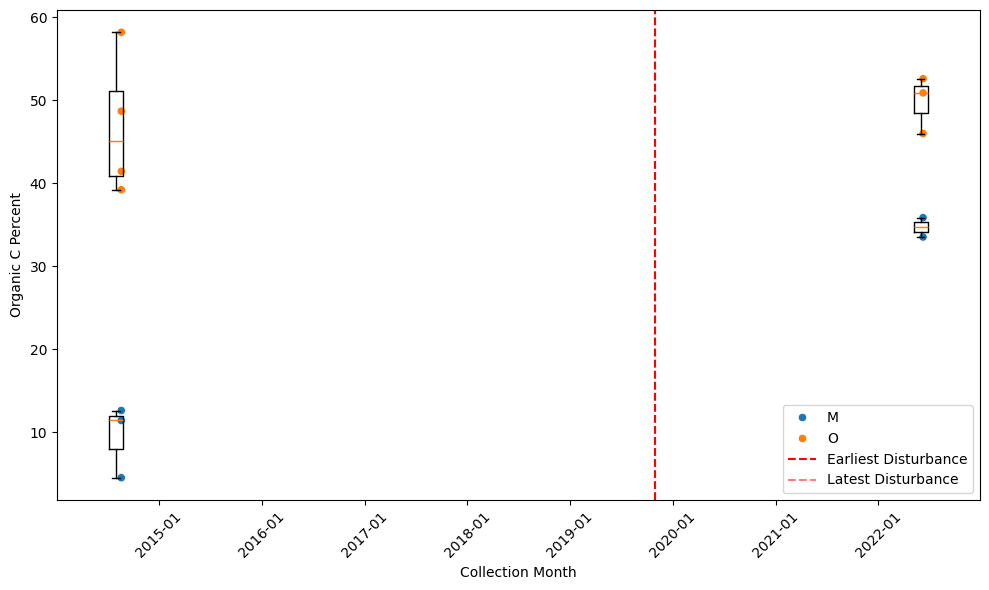


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3     34.675
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     49.816667
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BART_002


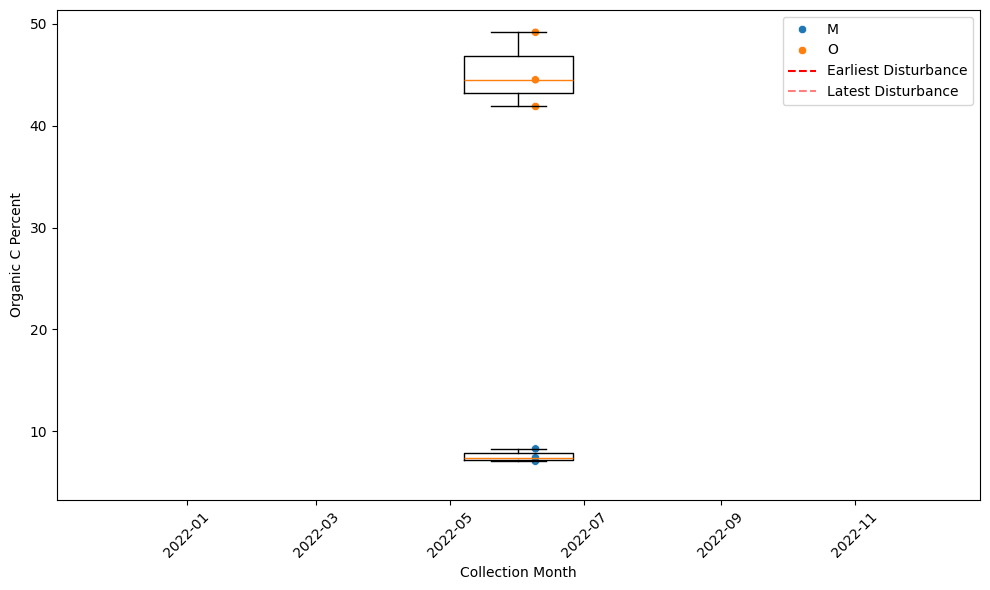


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     7.593333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3     45.18
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
BART_003


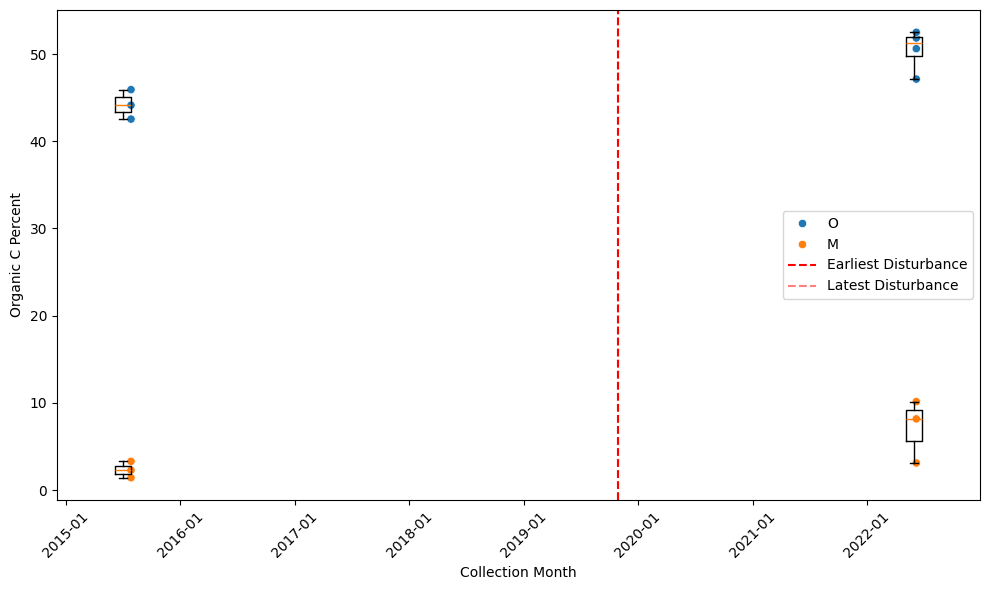


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     7.133333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1         NaN
2         NaN
3     50.5325
4         NaN
5         NaN
6         NaN
7         NaN
8         NaN
9         NaN
10        NaN
11        NaN
12        NaN
13        NaN
14        NaN
15        NaN
16        NaN
17        NaN
18        NaN
19        NaN
20        NaN
Name: organicCPercent, dtype: float64
BART_040


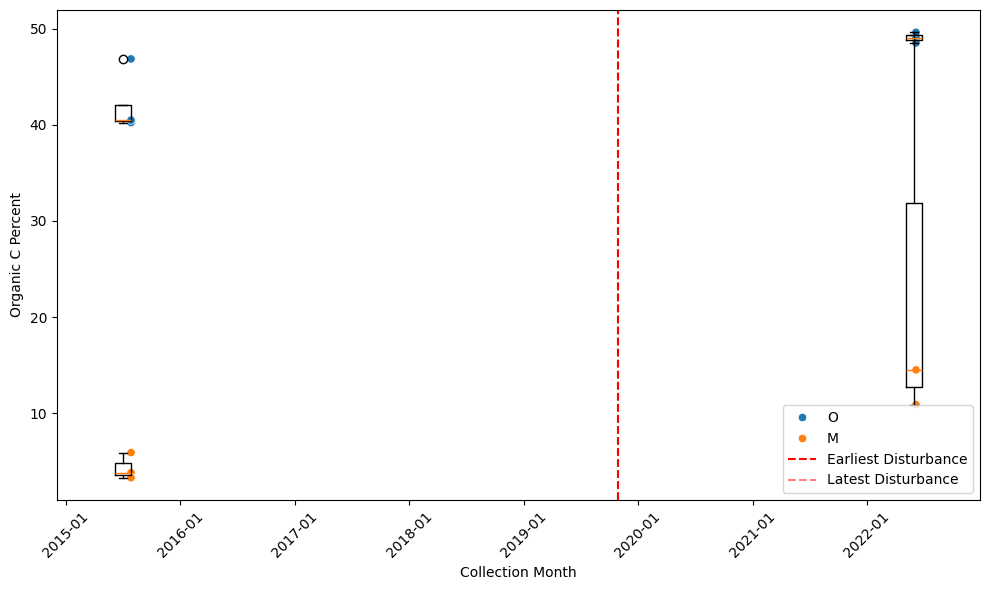


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     24.9
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     49.043333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BART_071


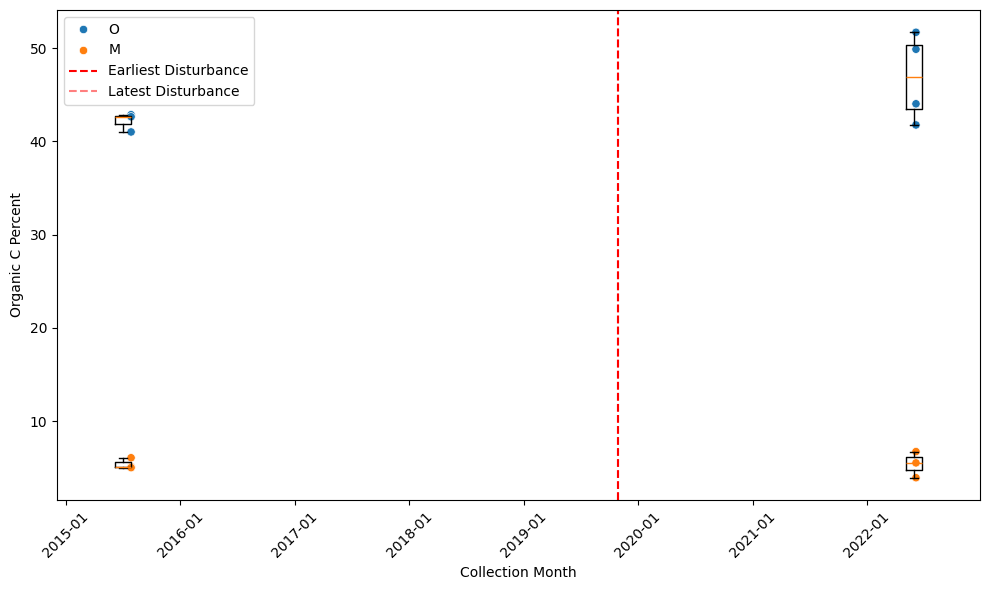


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     5.393333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1         NaN
2         NaN
3     46.8425
4         NaN
5         NaN
6         NaN
7         NaN
8         NaN
9         NaN
10        NaN
11        NaN
12        NaN
13        NaN
14        NaN
15        NaN
16        NaN
17        NaN
18        NaN
19        NaN
20        NaN
Name: organicCPercent, dtype: float64
BART_042


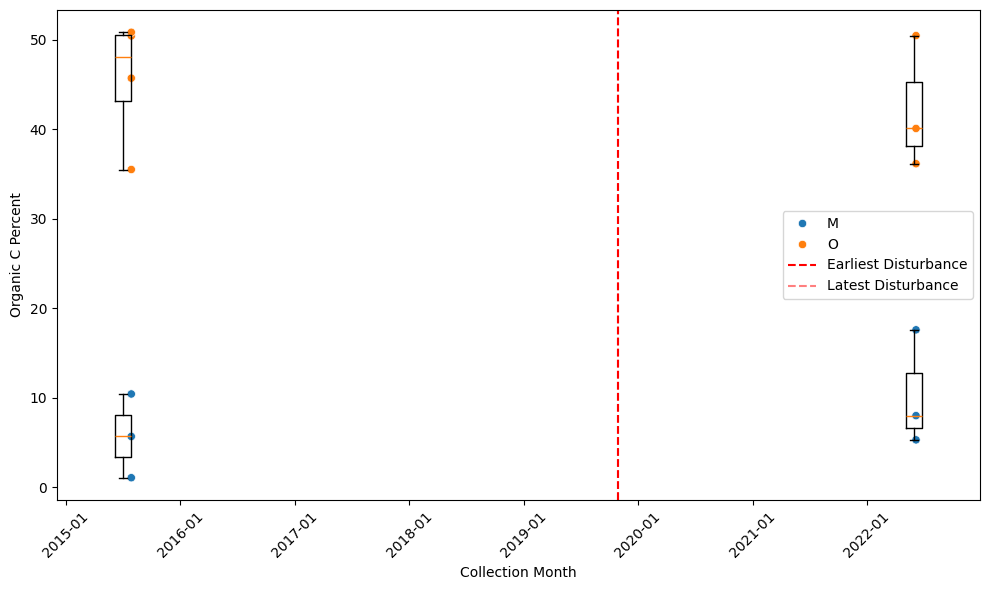


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     10.273333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     42.226667
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BART_036


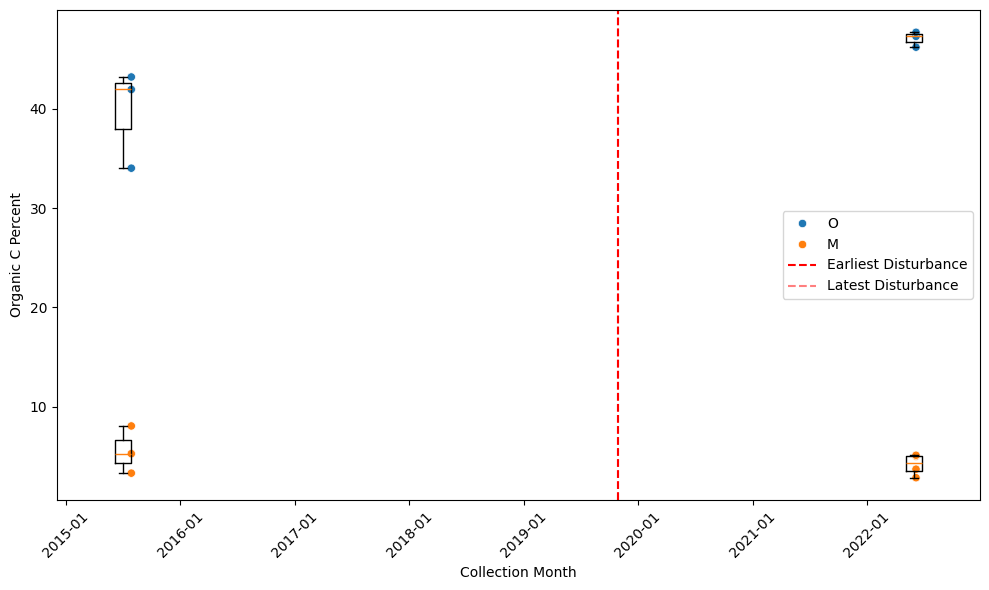


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     4.17
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     47.053333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
BLAN_033


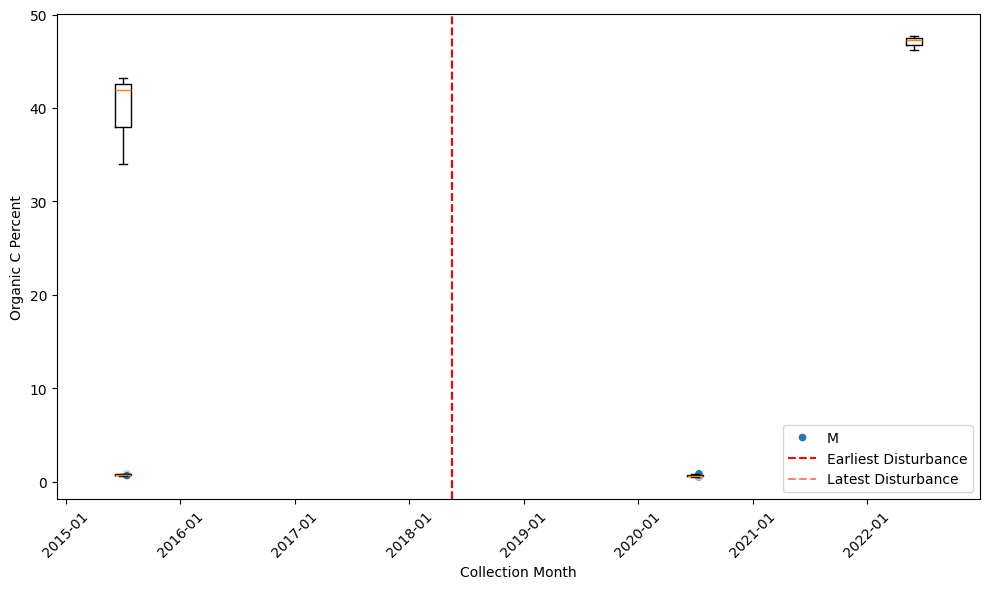


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     0.673333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_031


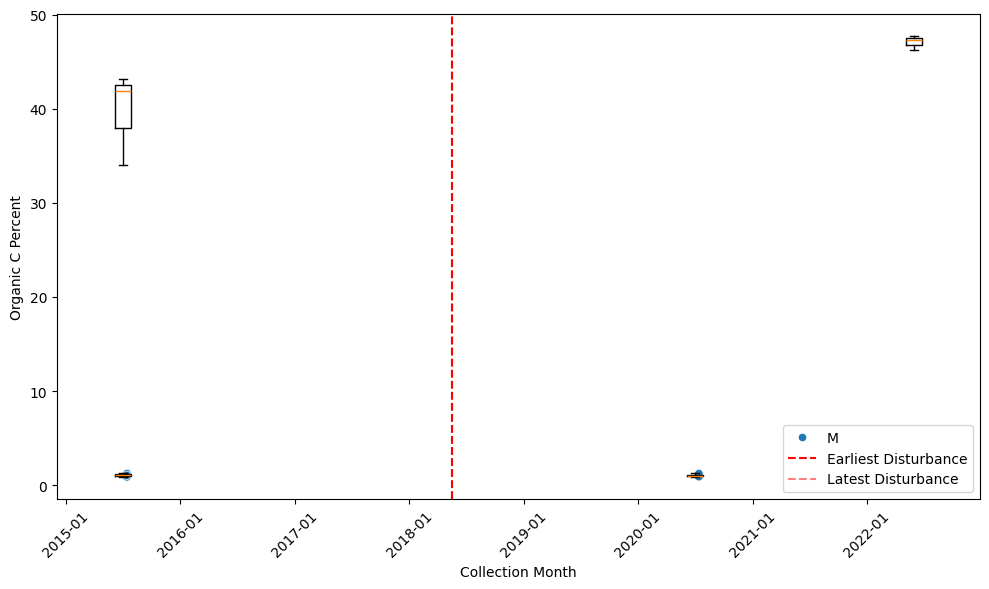


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.056667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_032


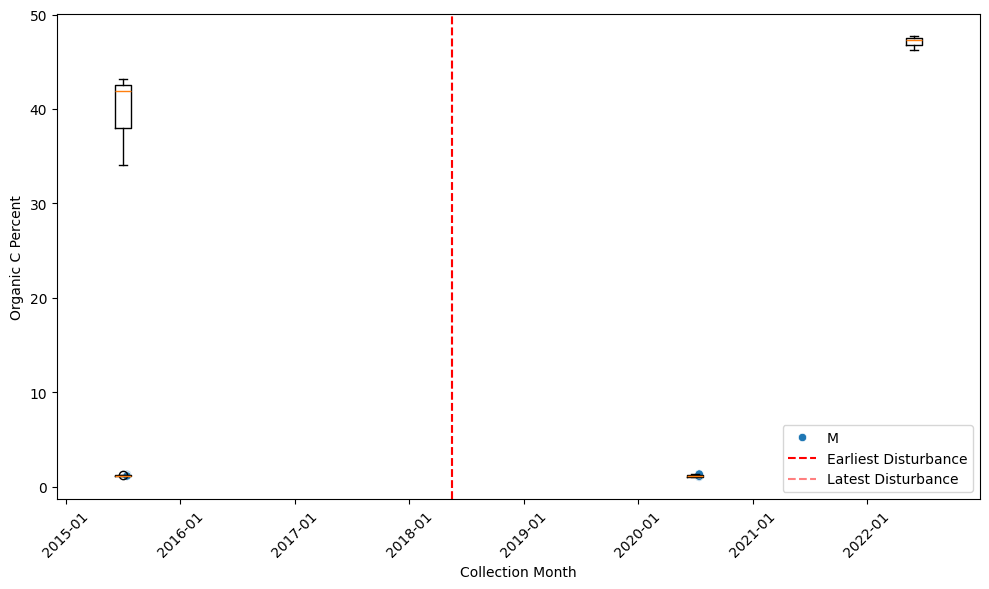


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.146667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_005


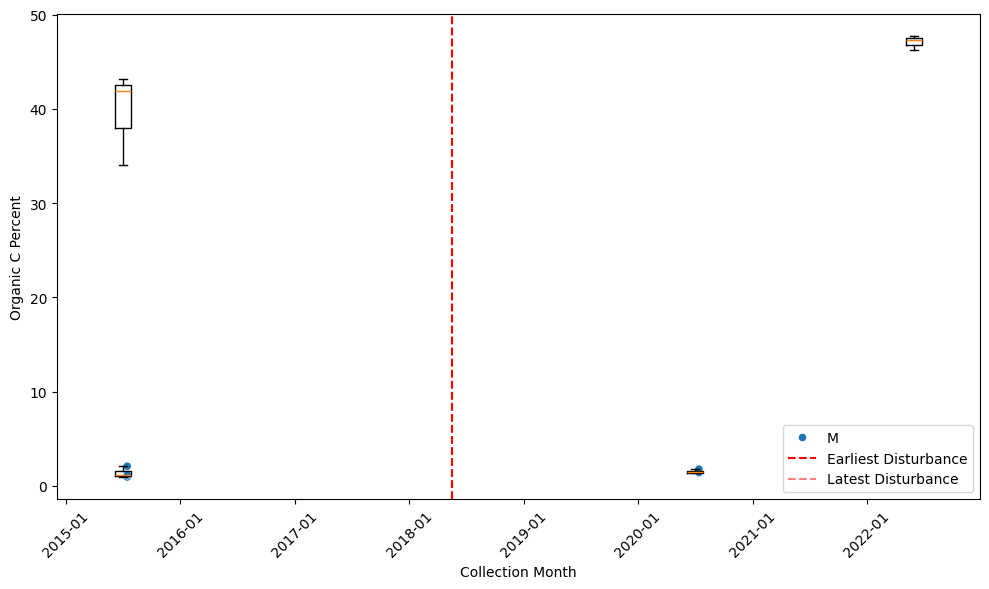


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.526667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_007


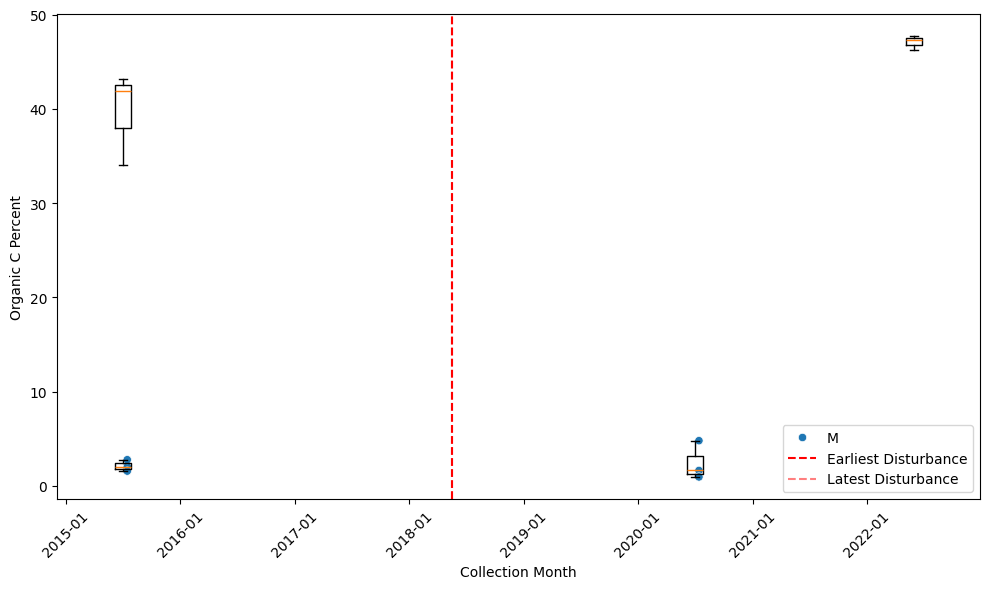


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     2.453333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_004


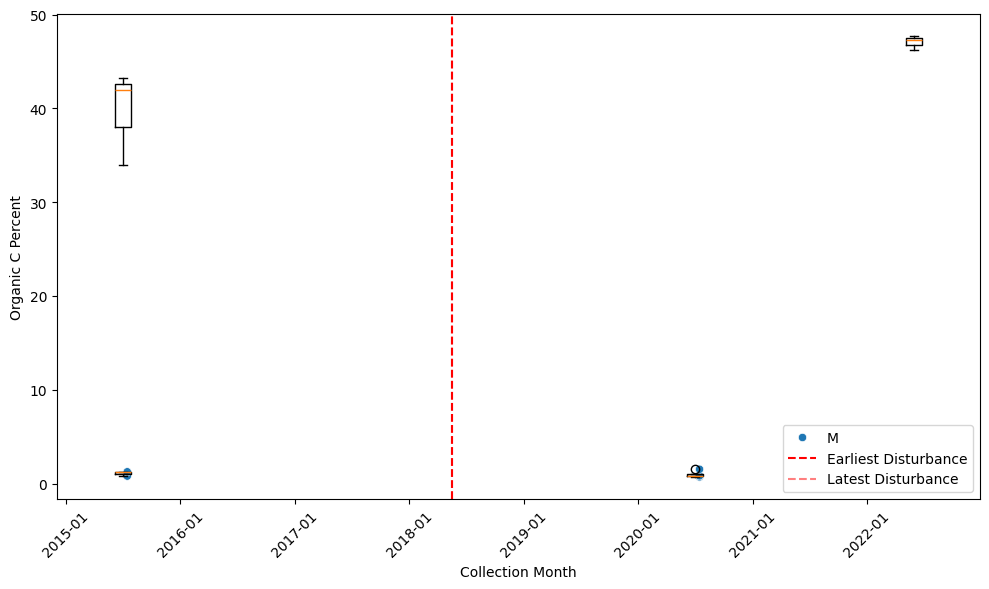


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3     0.9625
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_003


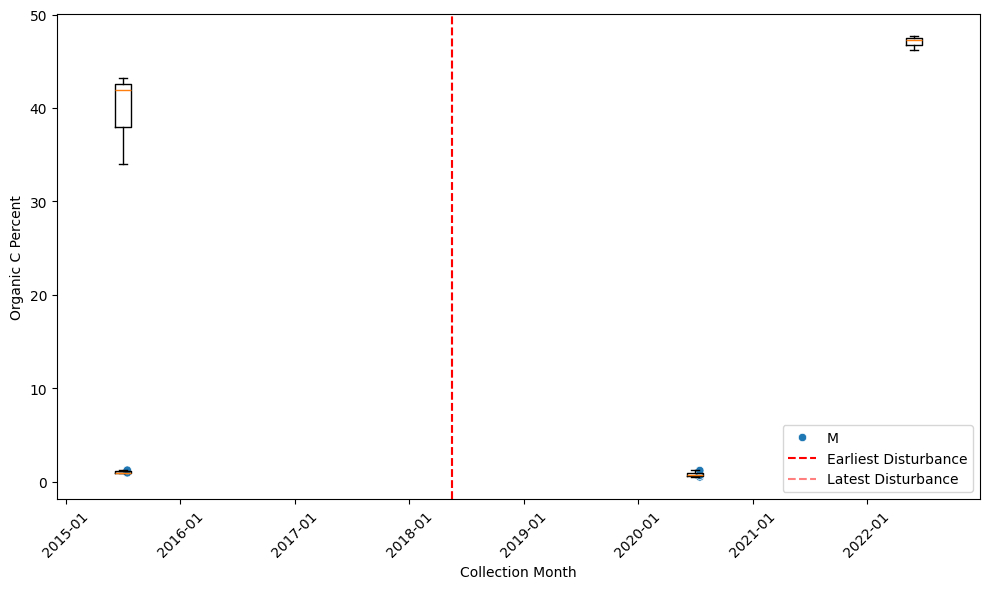


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     0.816667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
BLAN_001


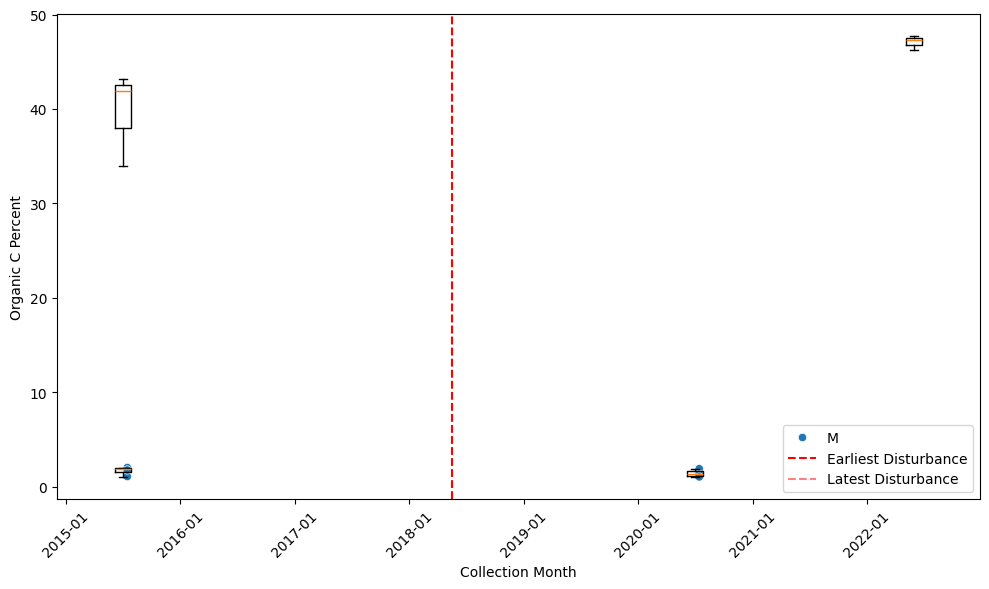


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     1.42
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_014


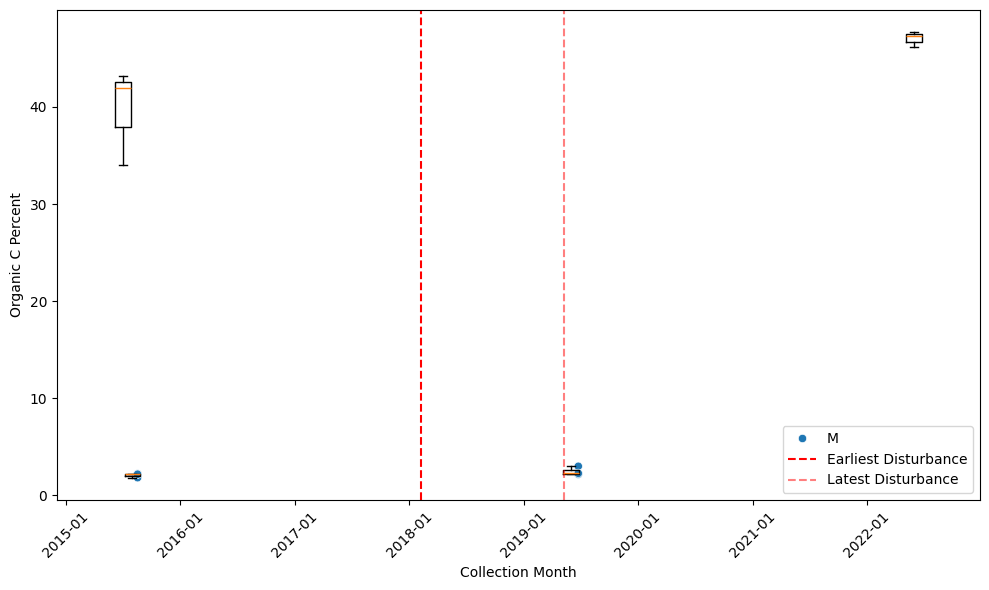


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.48
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_002


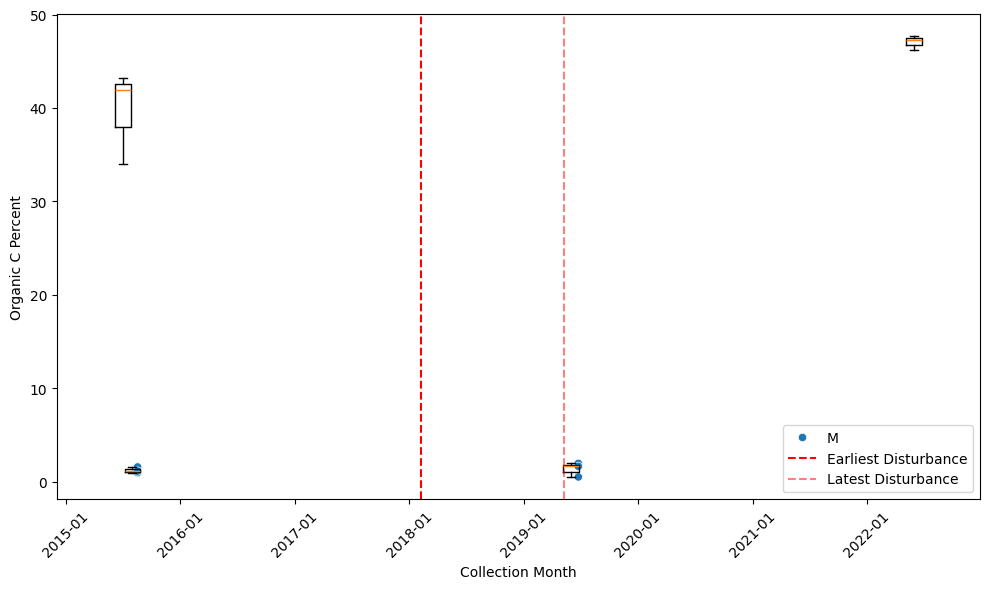


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.383333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_003


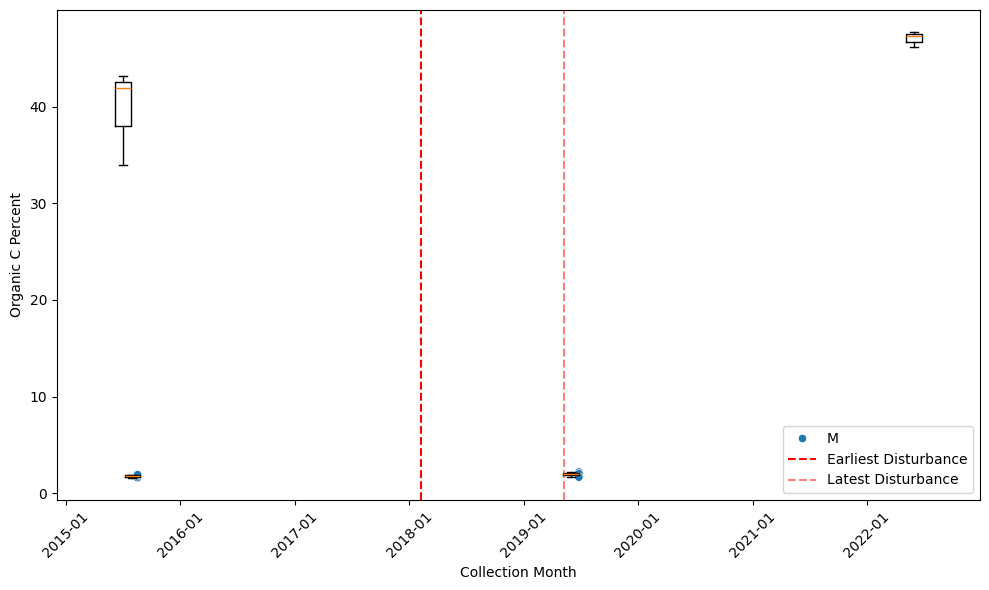


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.963333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_001


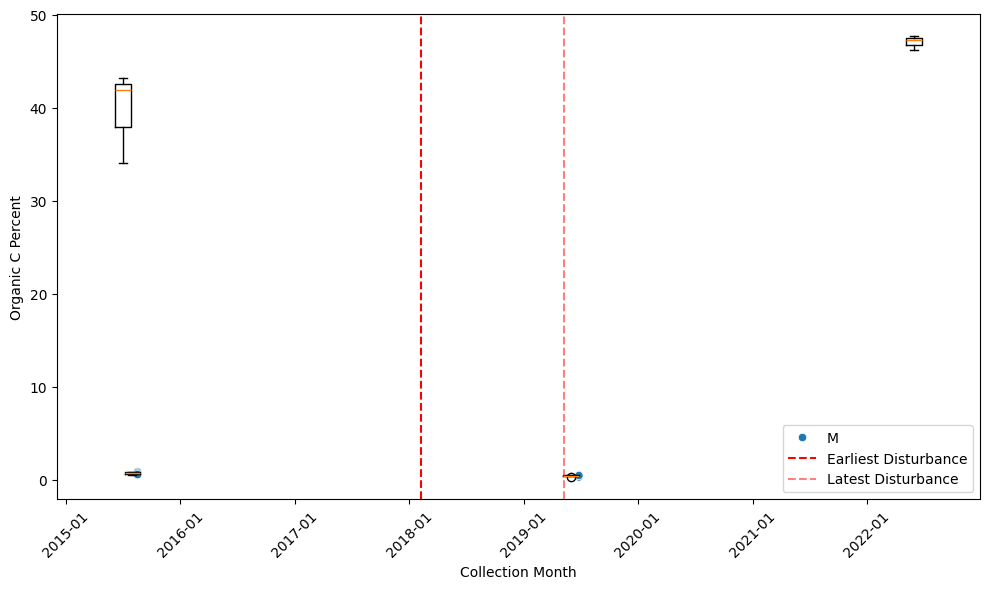


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.4475
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_038


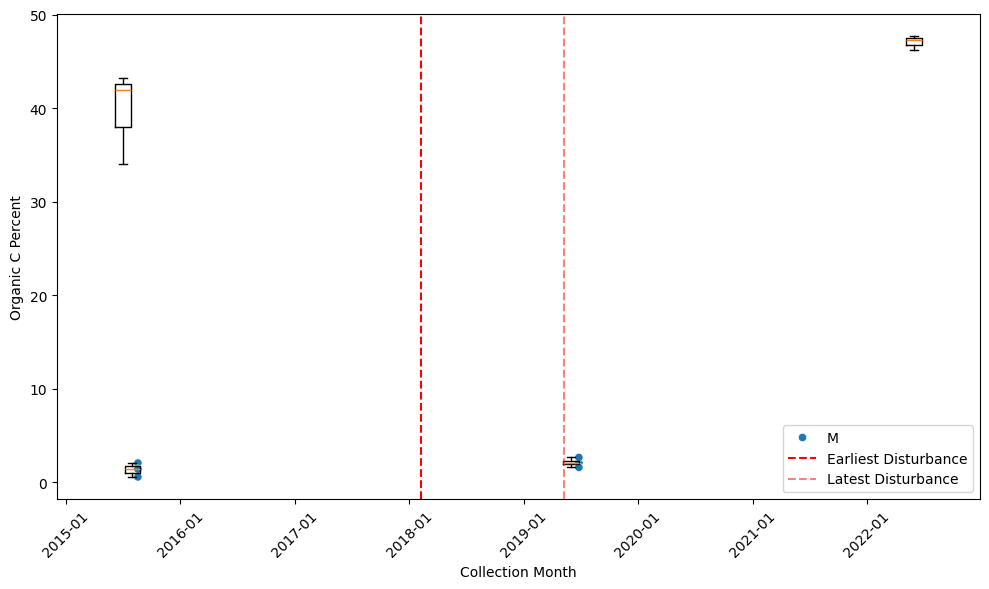


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.0975
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_041


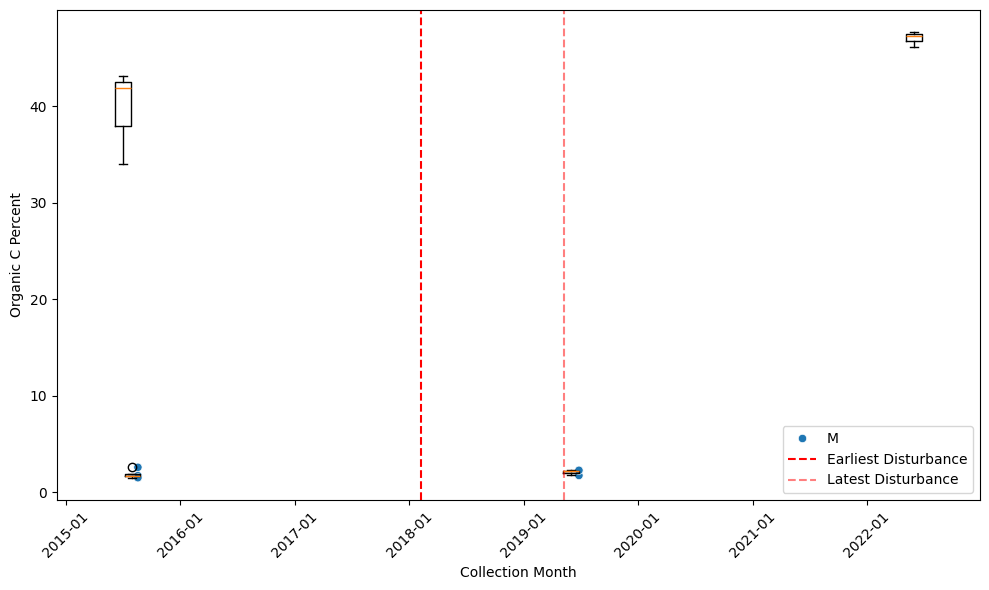


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.073333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_040


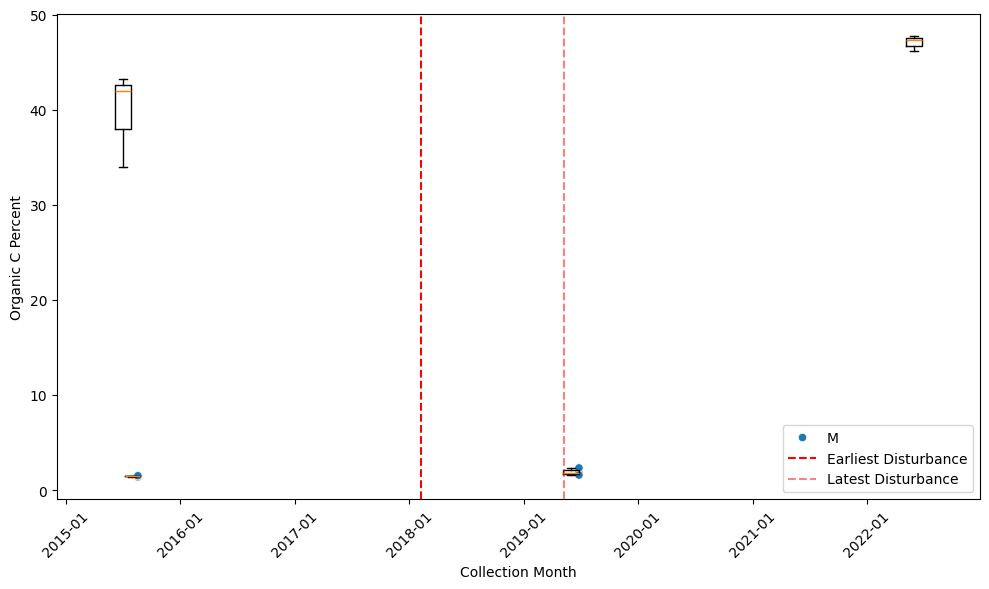


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.903333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_037


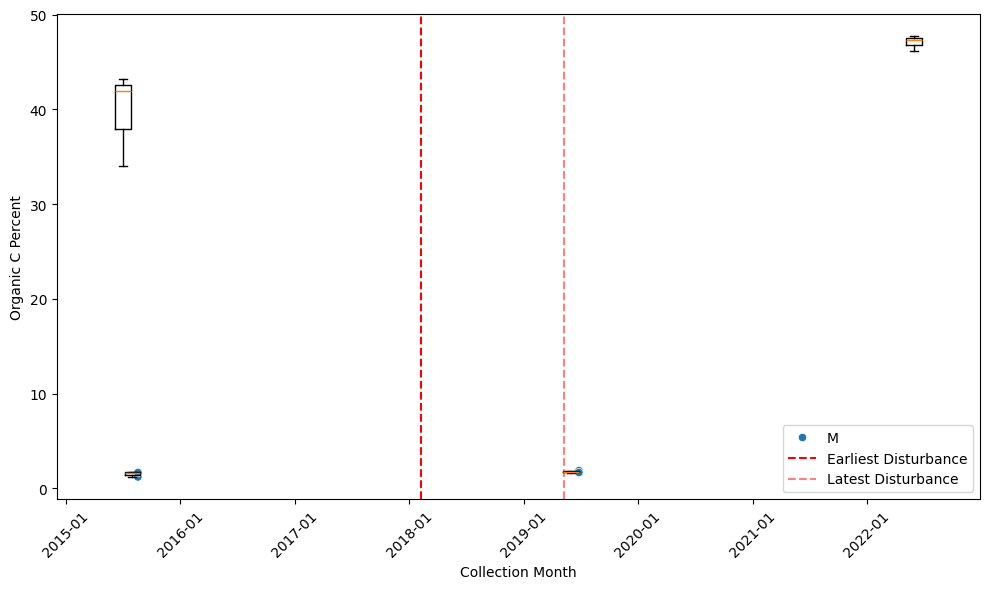


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.75
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_005


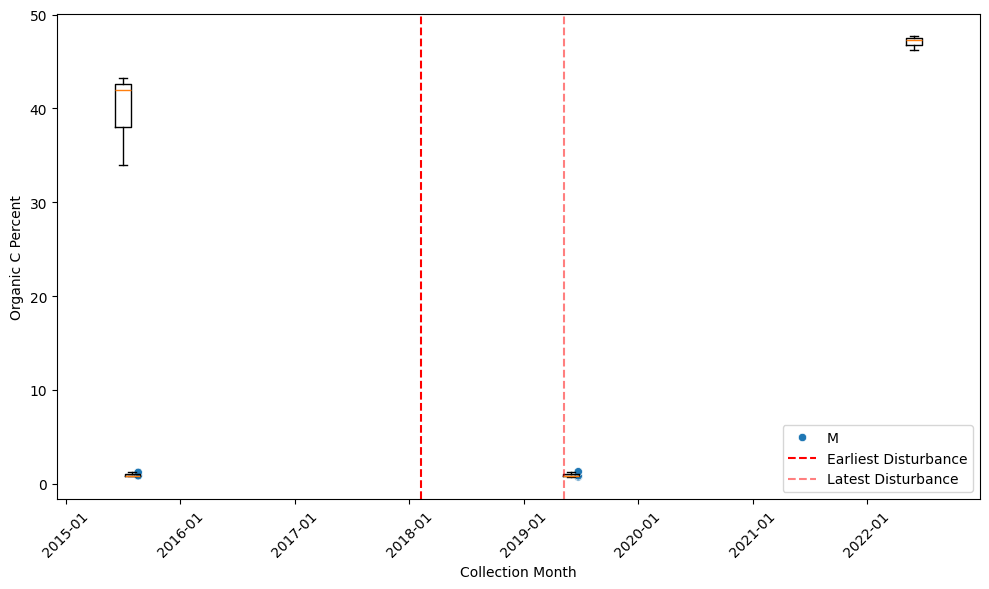


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.956667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DELA_004


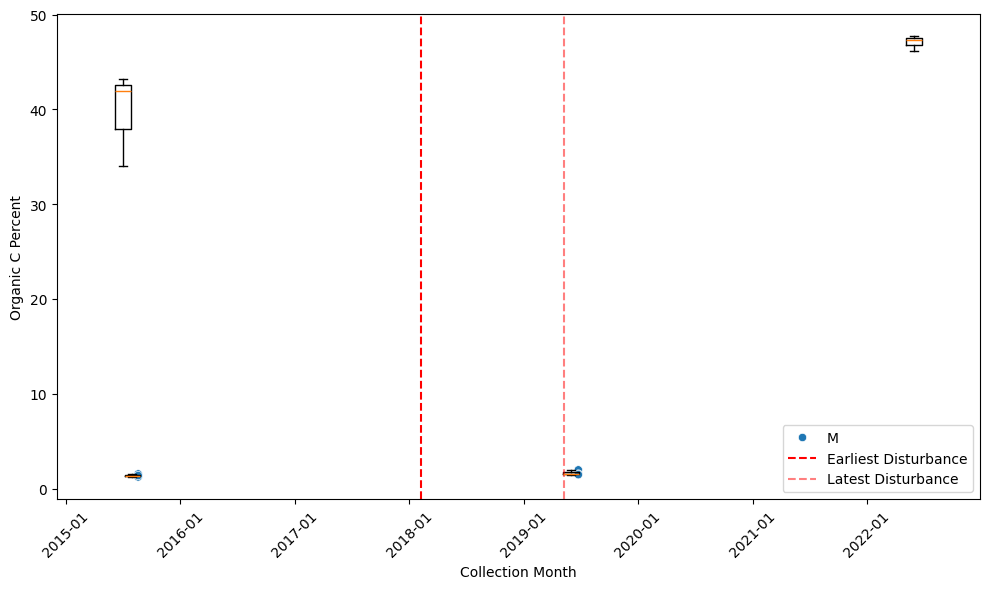


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.663333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_041


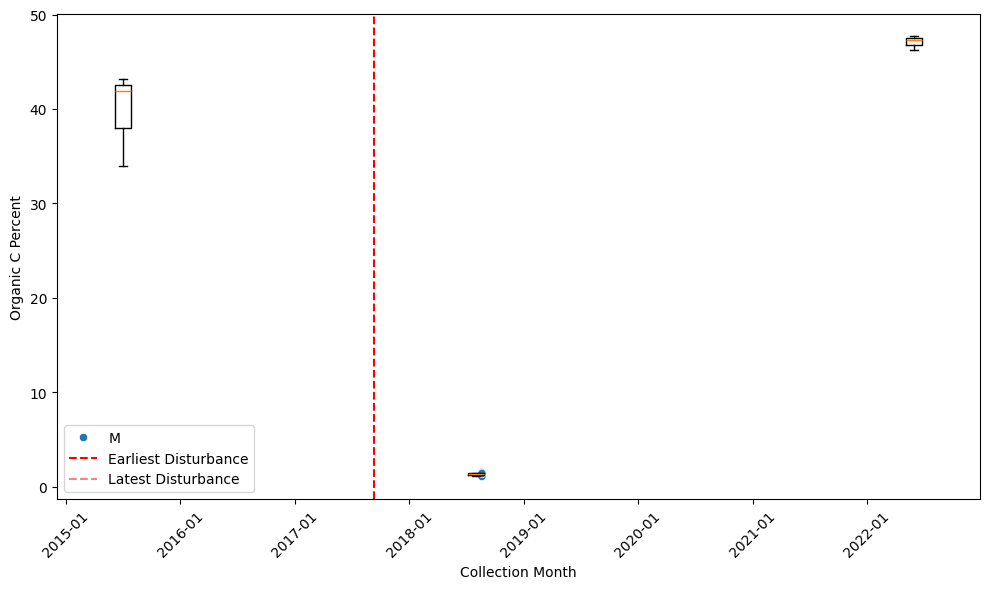


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.106667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_005


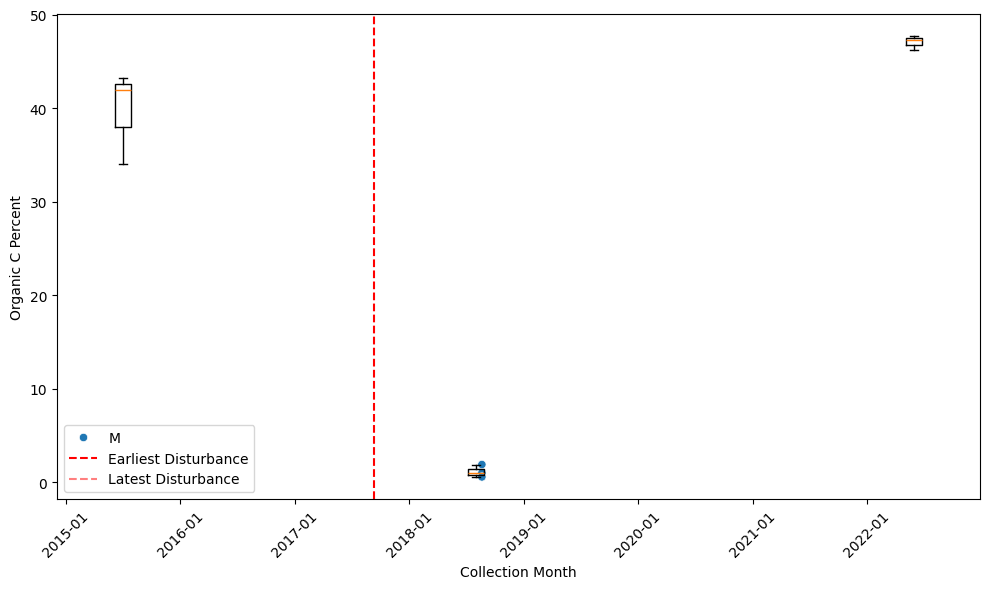


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.976667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_003


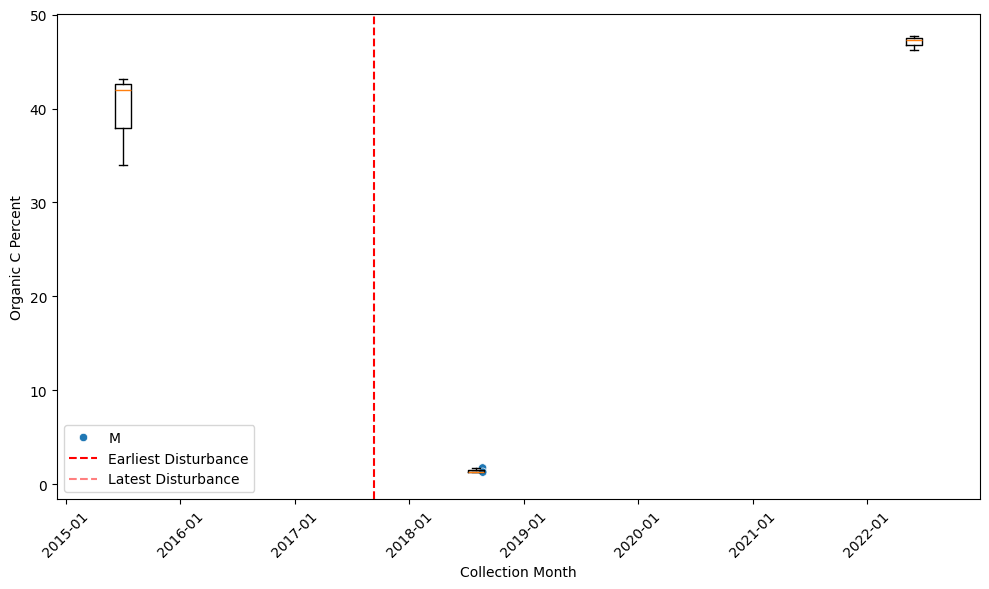


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.18
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_001


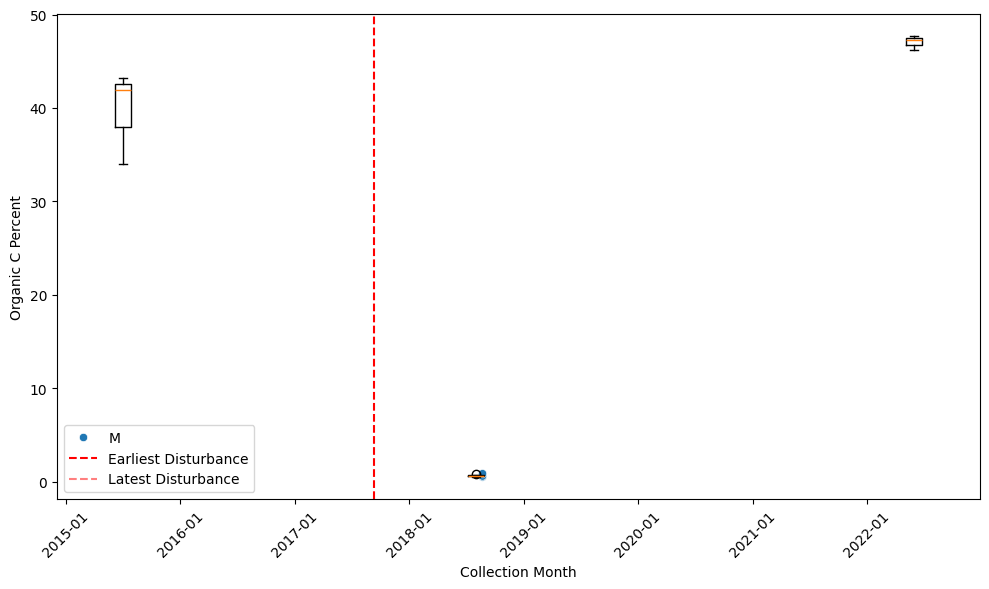


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.665
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_009


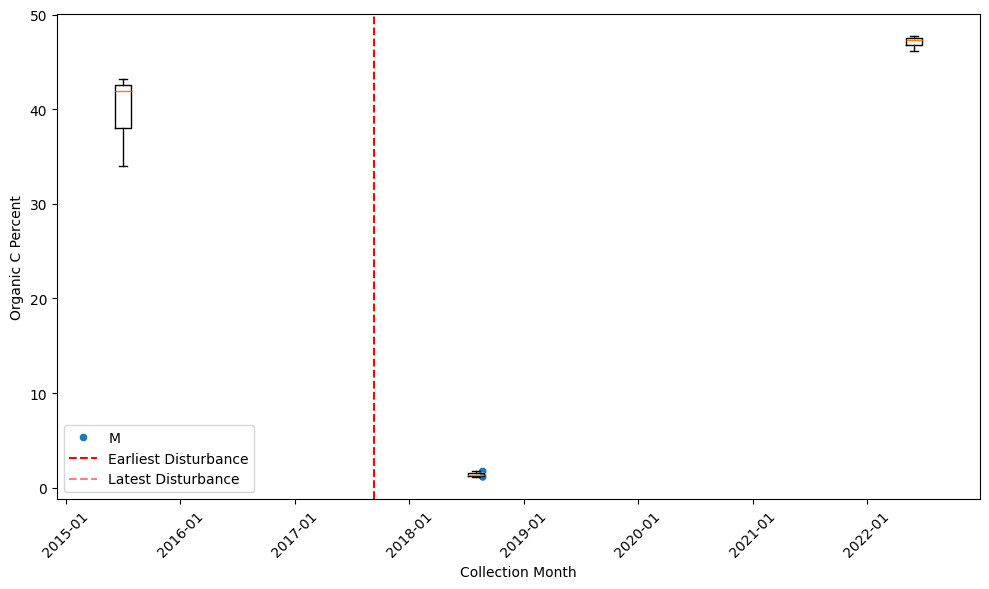


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.823333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_004


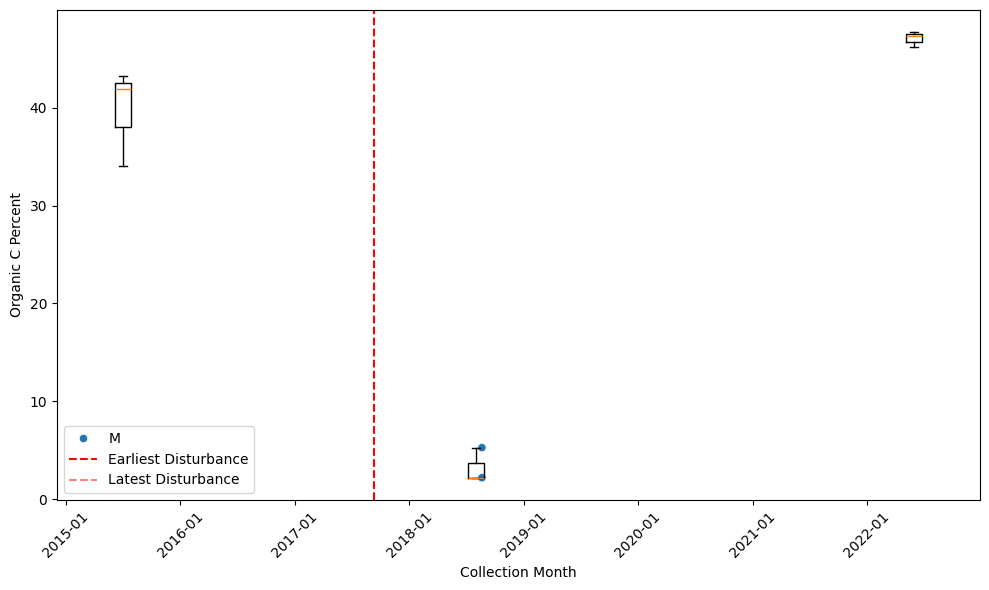


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     3.3
2     NaN
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_043


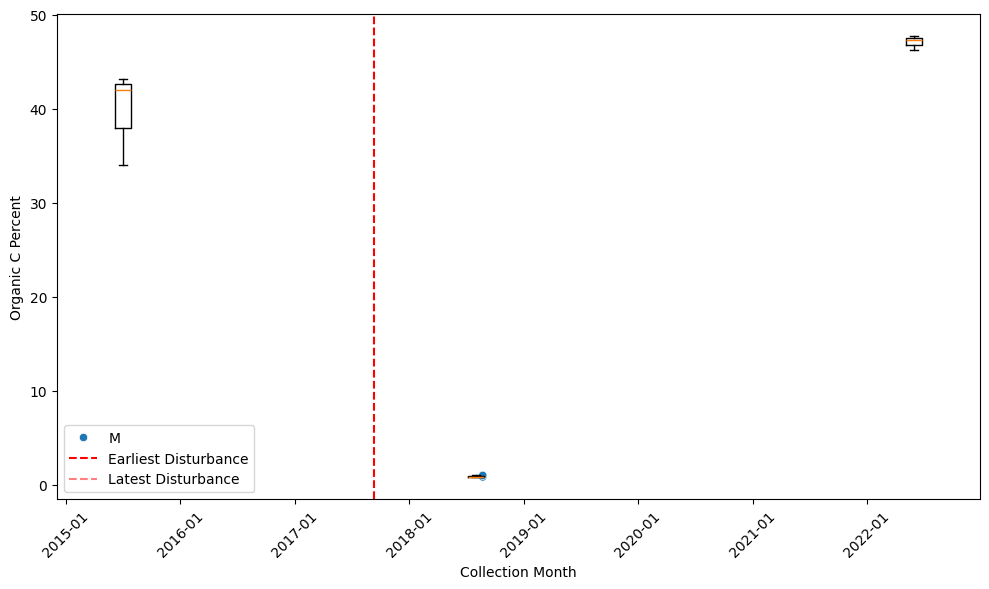


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.5
2     NaN
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_044


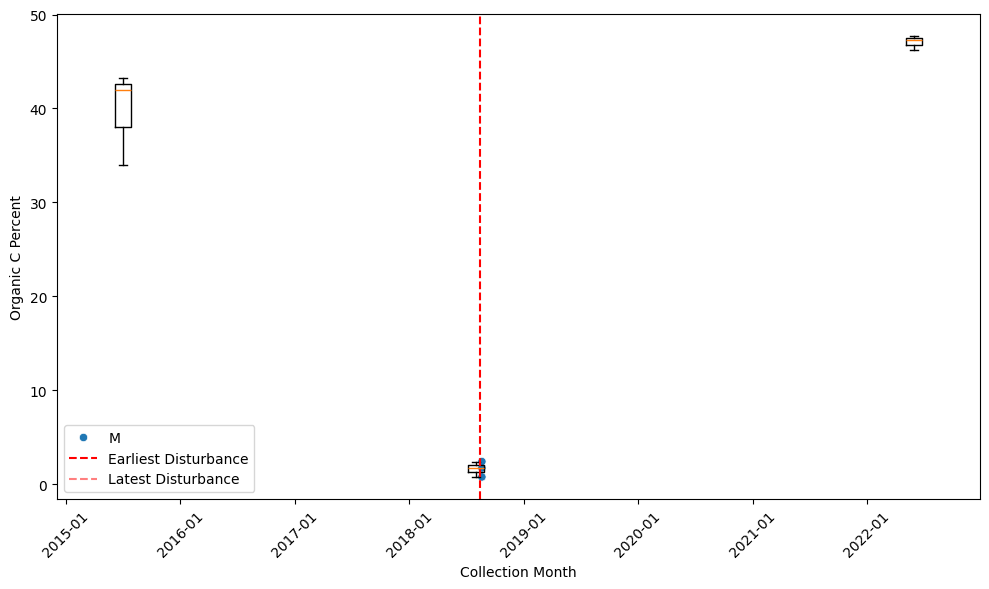


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.966667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_042


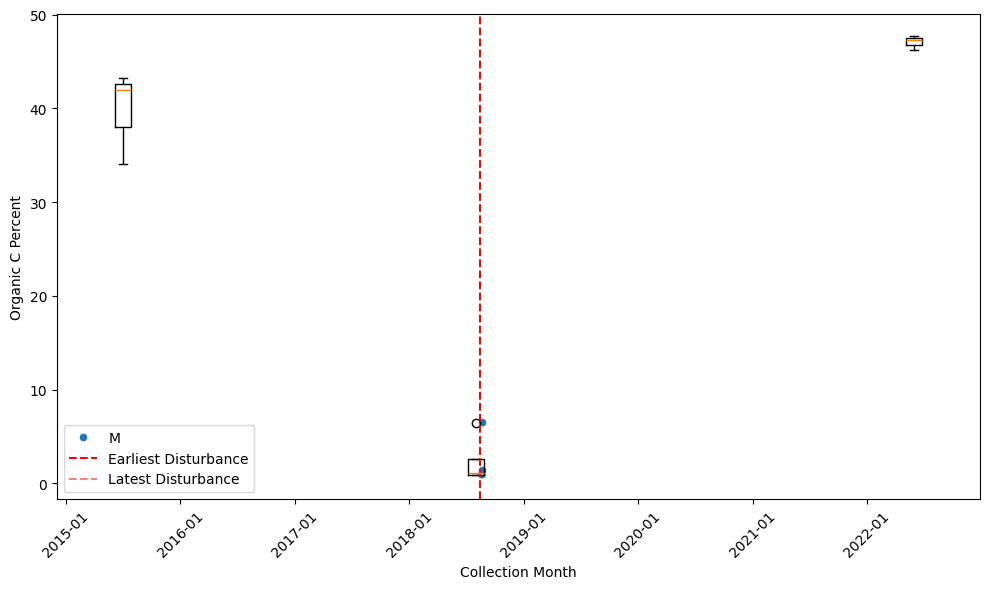


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.0525
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
DSNY_006


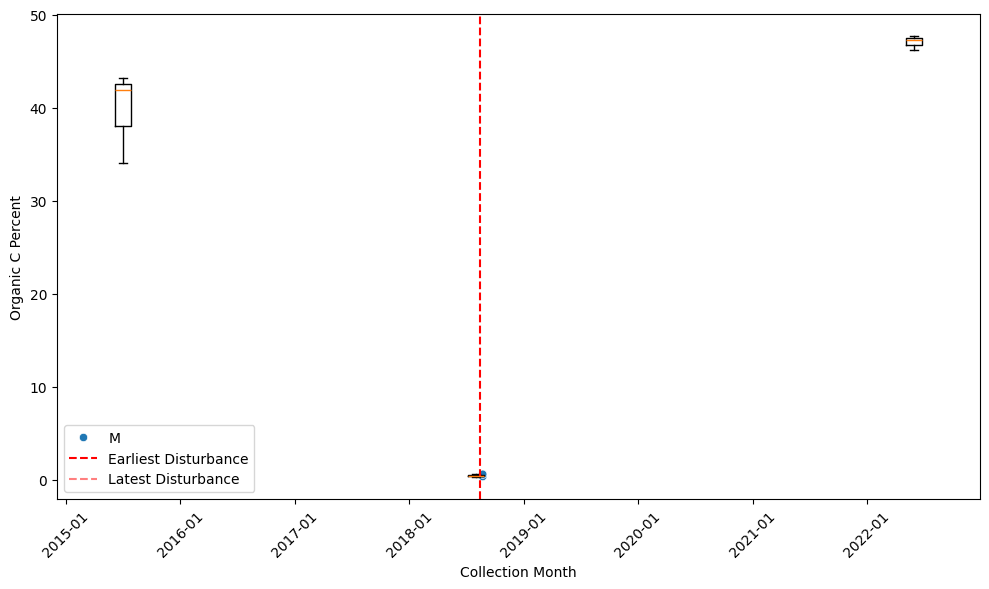


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.485
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_002


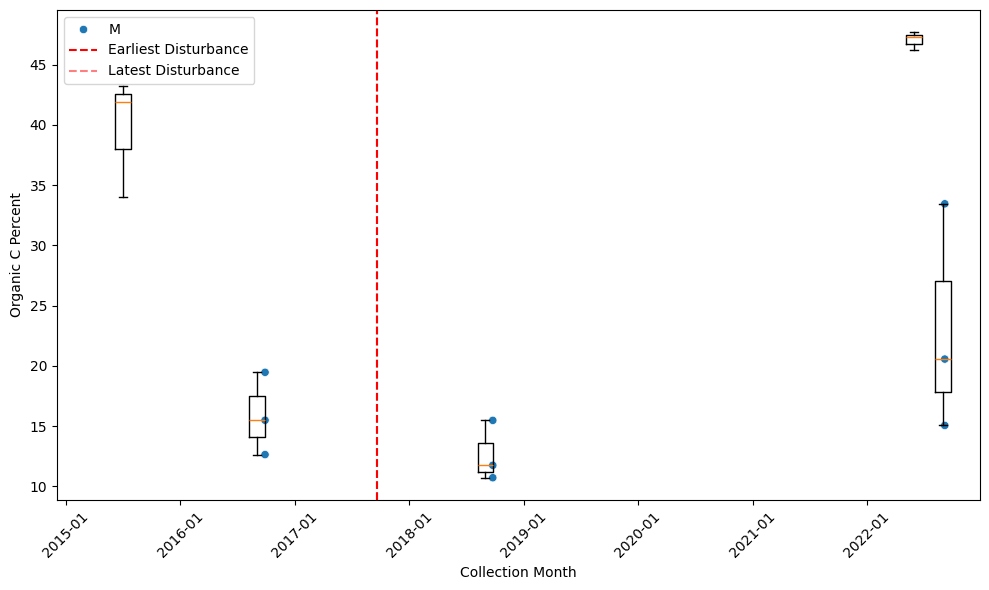


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     12.64
2       NaN
3       NaN
4       NaN
5     23.02
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_004


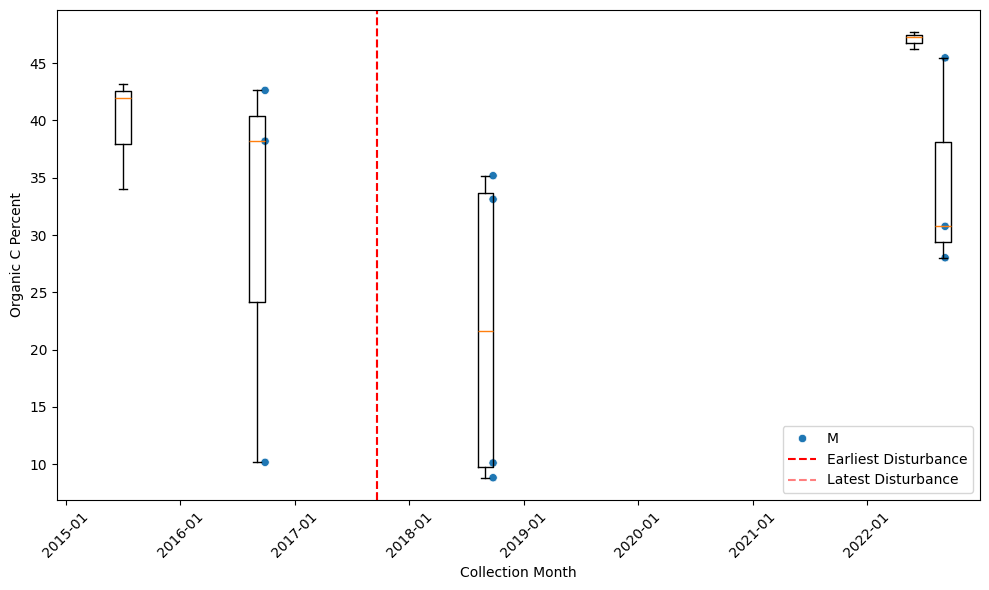


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     21.812500
2           NaN
3           NaN
4           NaN
5     34.746667
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_001


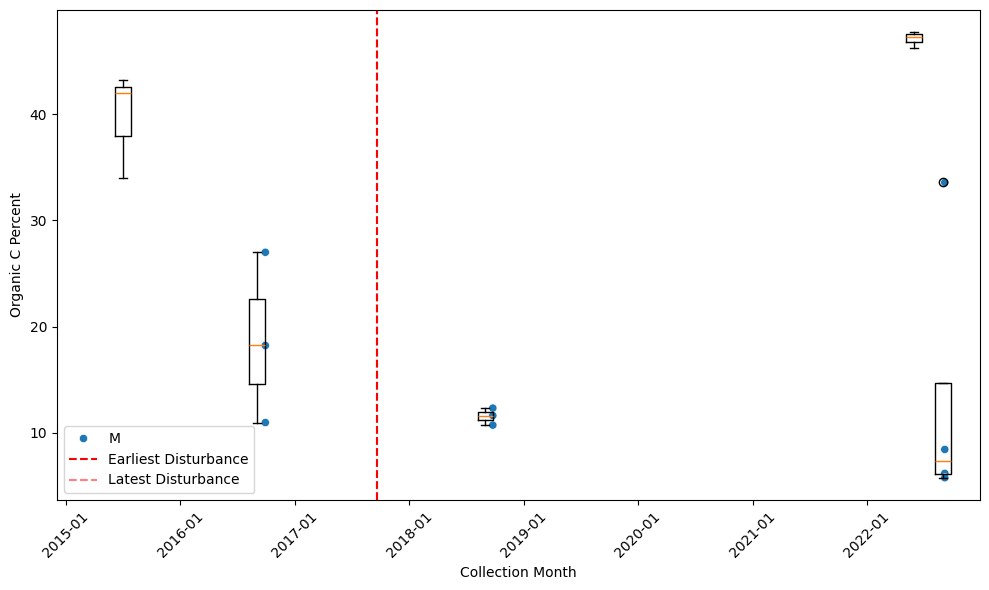


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     11.563333
2           NaN
3           NaN
4           NaN
5     13.492500
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_007


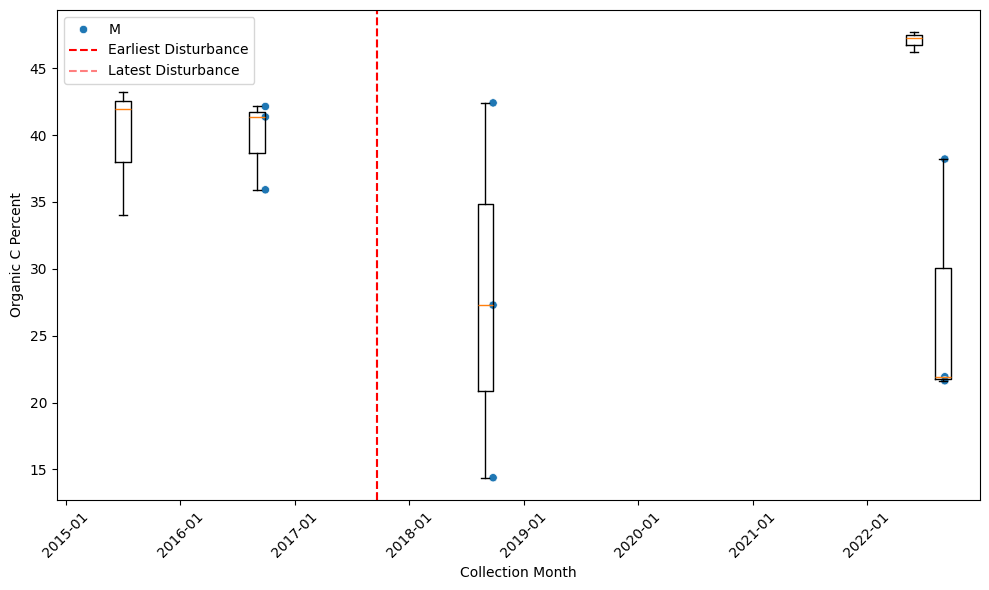


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     28.026667
2           NaN
3           NaN
4           NaN
5     27.256667
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_003


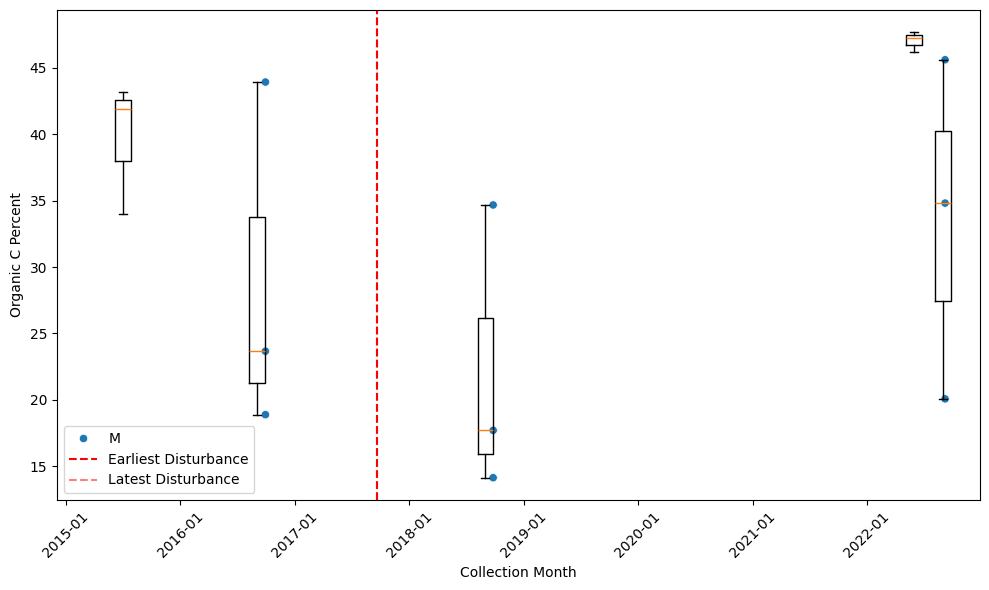


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     22.170000
2           NaN
3           NaN
4           NaN
5     33.503333
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_049


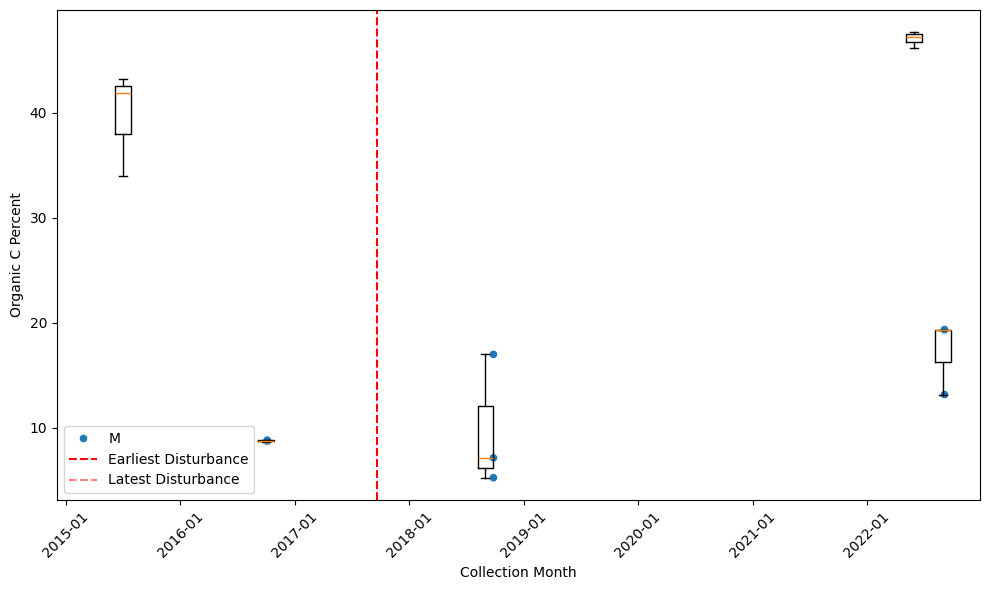


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      9.773333
2           NaN
3           NaN
4           NaN
5     17.253333
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_048


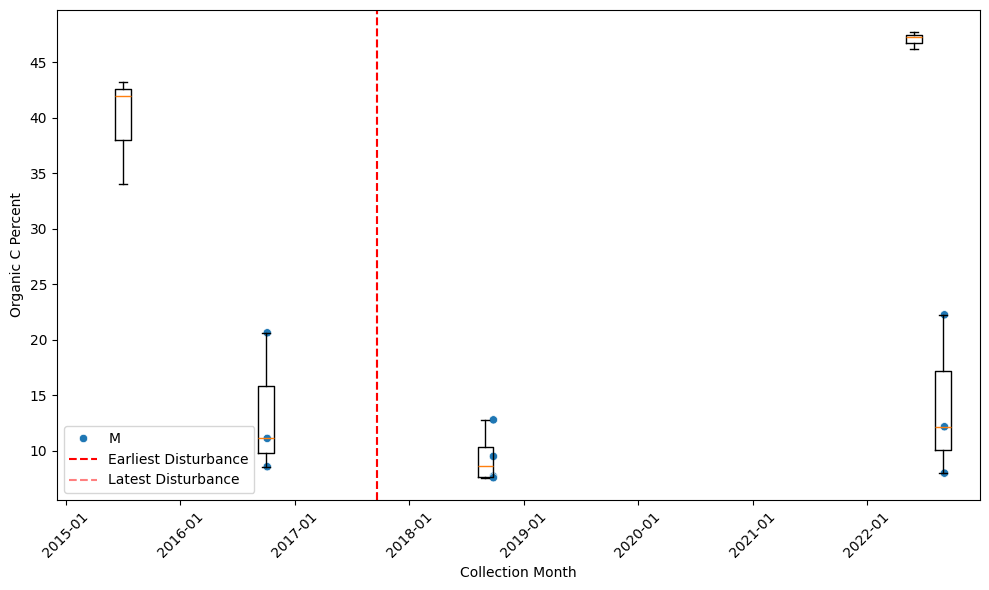


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      9.395000
2           NaN
3           NaN
4           NaN
5     14.136667
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_042


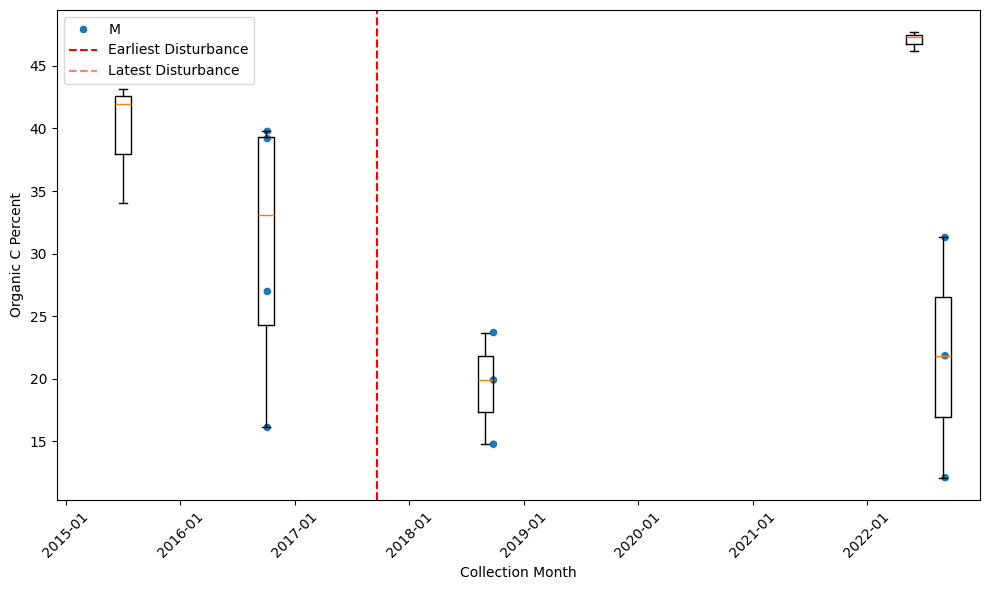


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     19.453333
2           NaN
3           NaN
4           NaN
5     21.740000
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_006


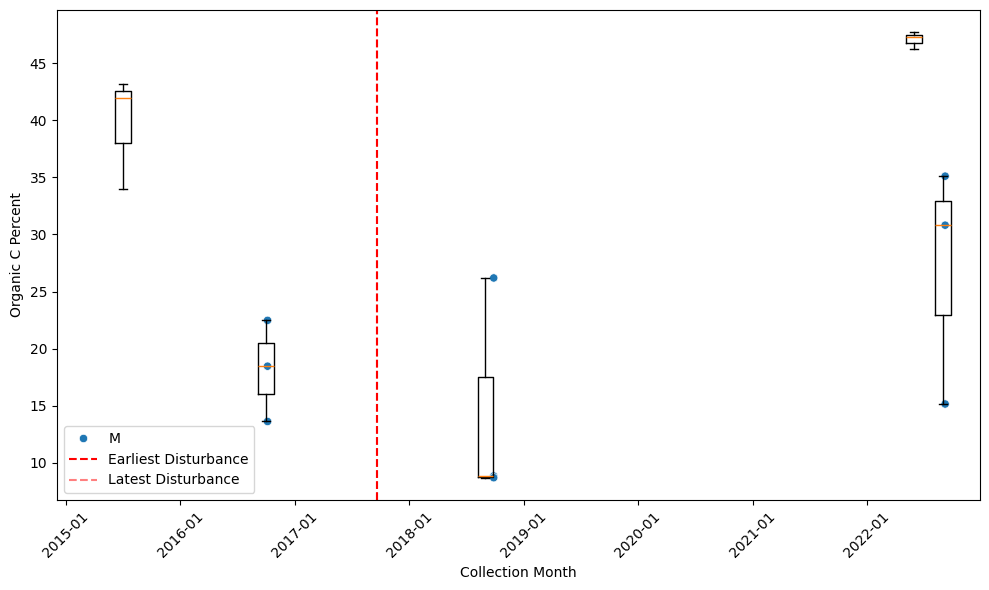


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     14.586667
2           NaN
3           NaN
4           NaN
5     27.023333
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
GUAN_043


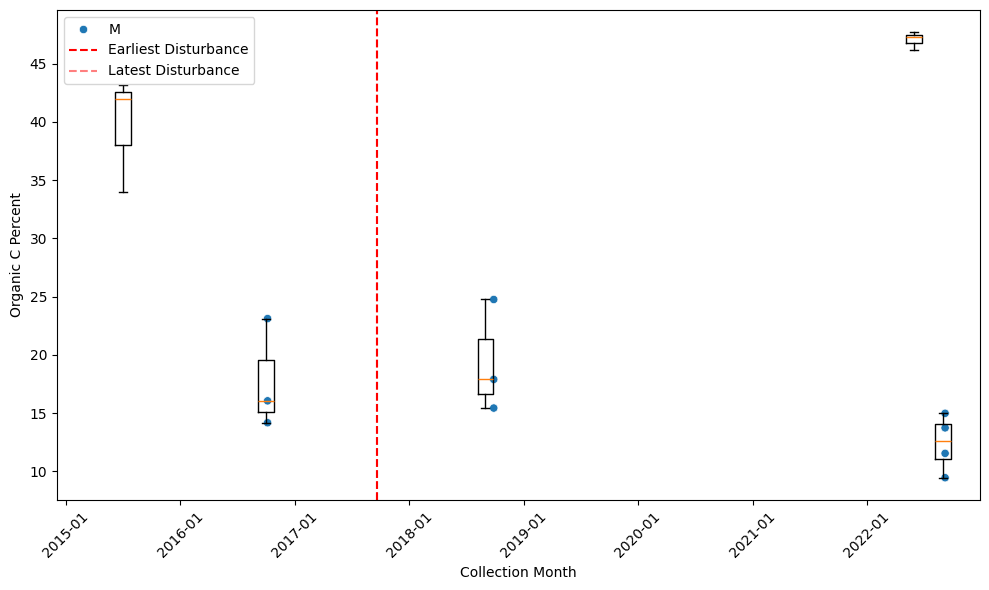


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     19.356667
2           NaN
3           NaN
4           NaN
5     12.425000
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_003


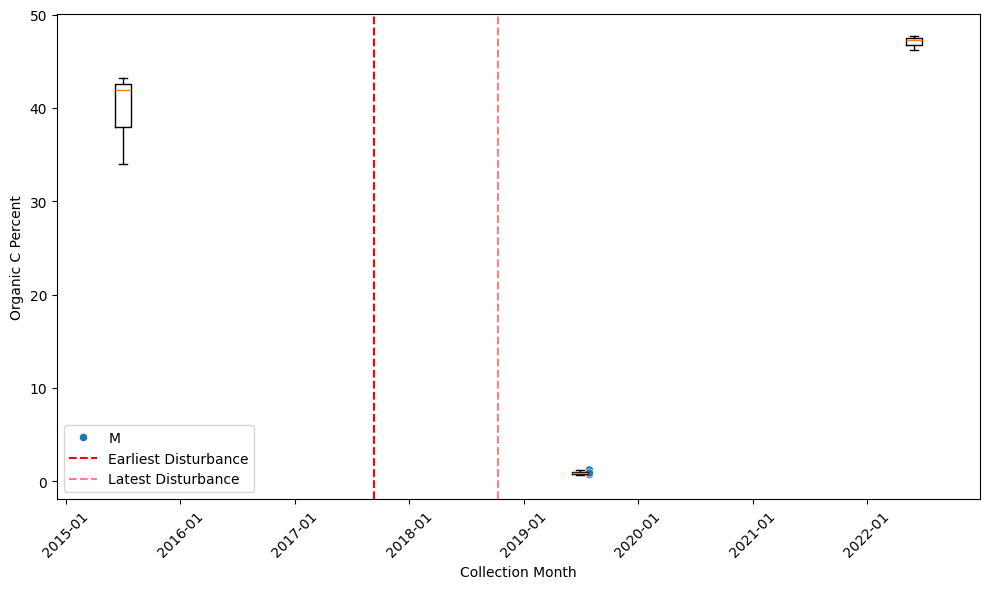


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.94
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_047


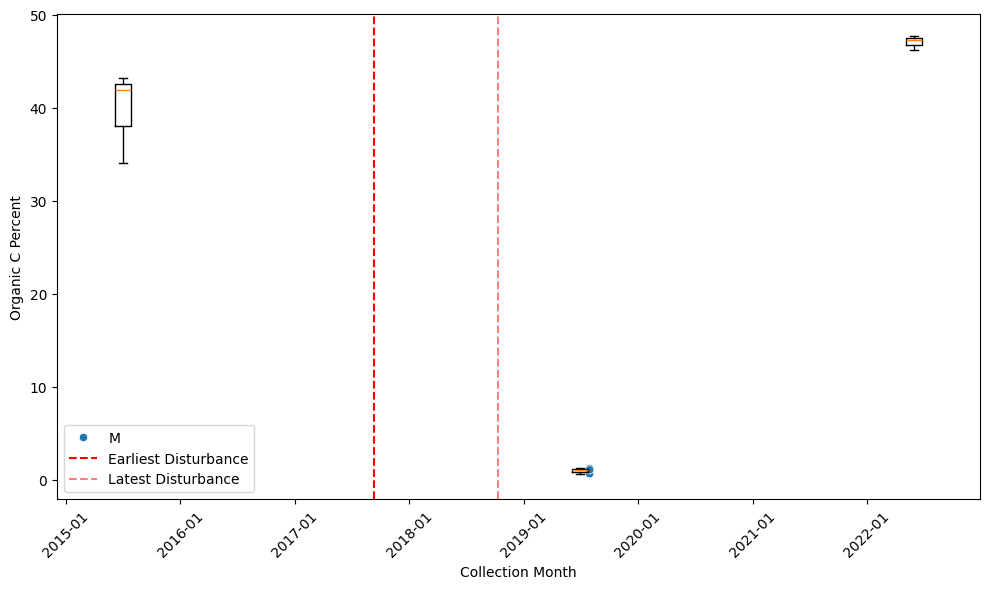


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.986667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_002


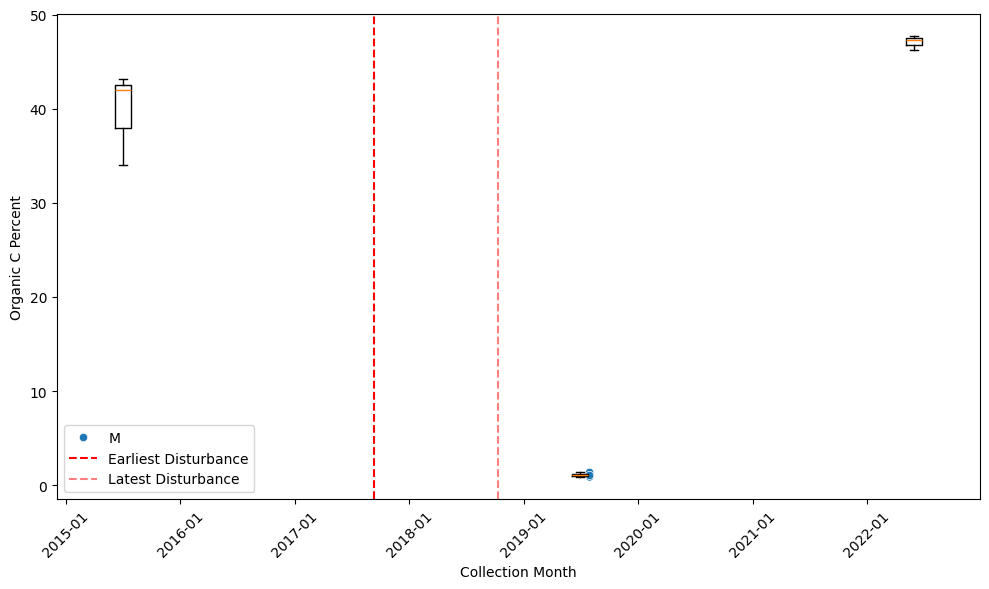


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.083333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_006


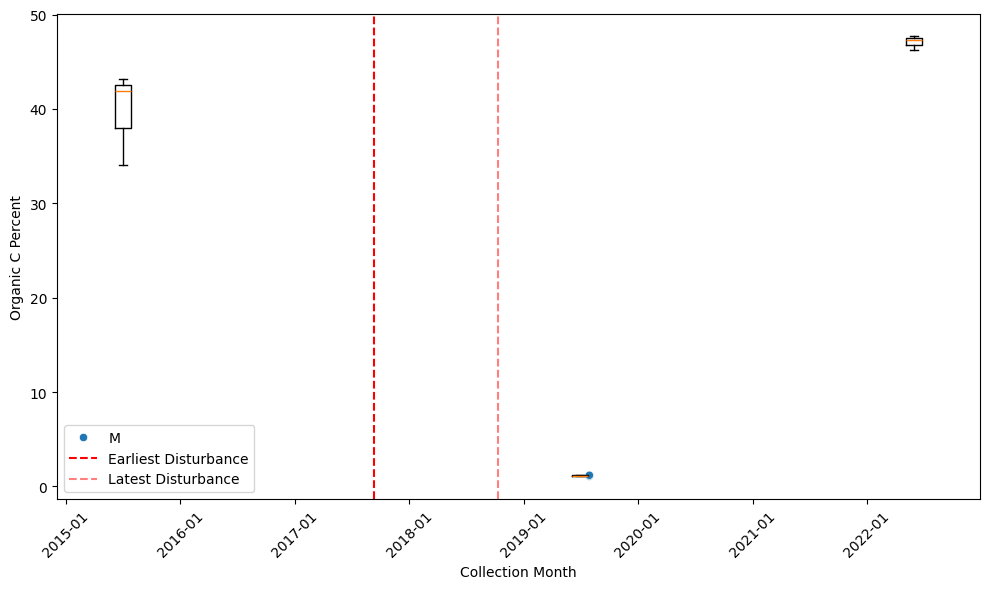


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.133333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_048


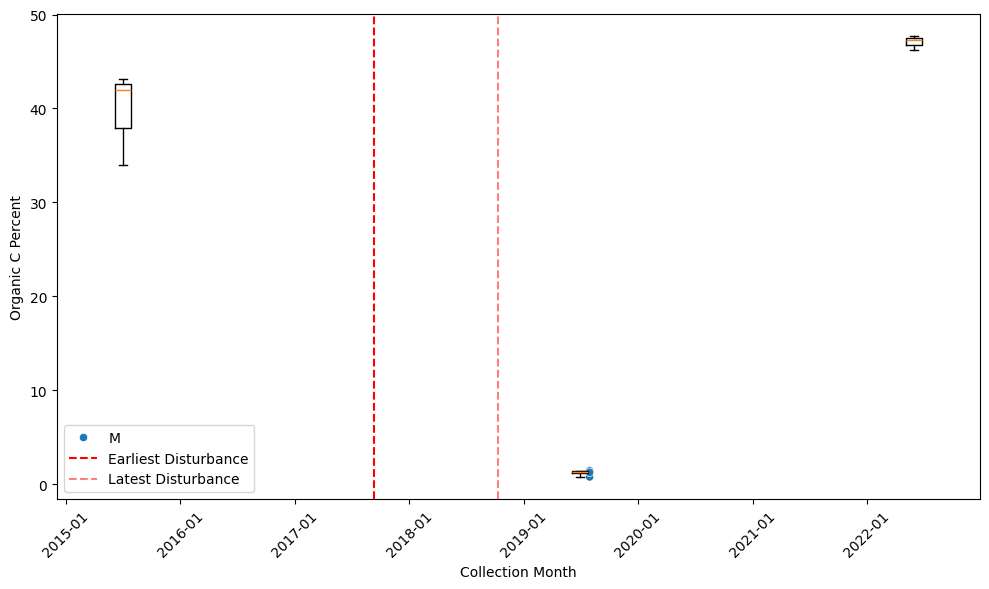


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.2375
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_001


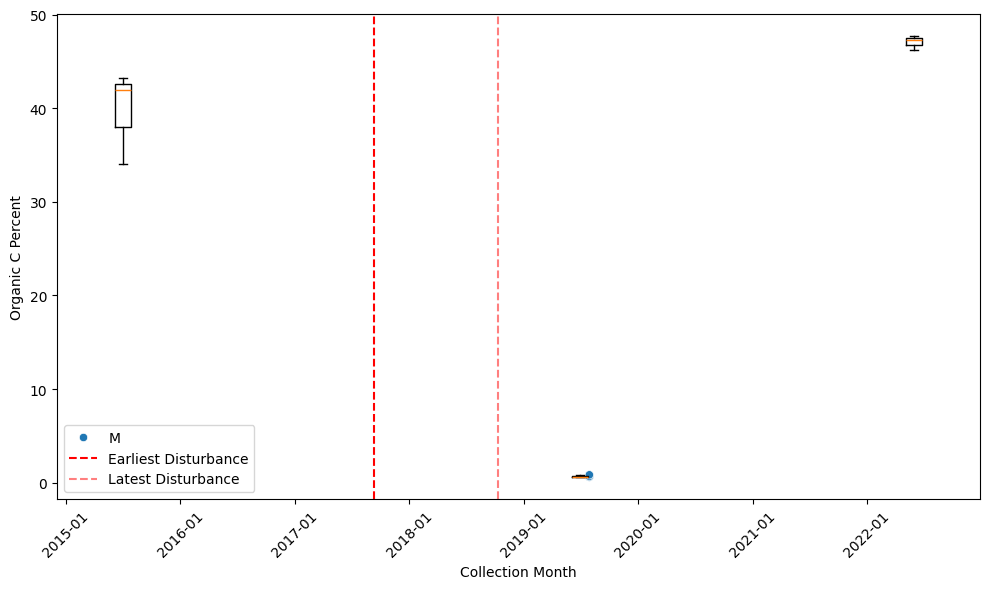


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.685
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_005


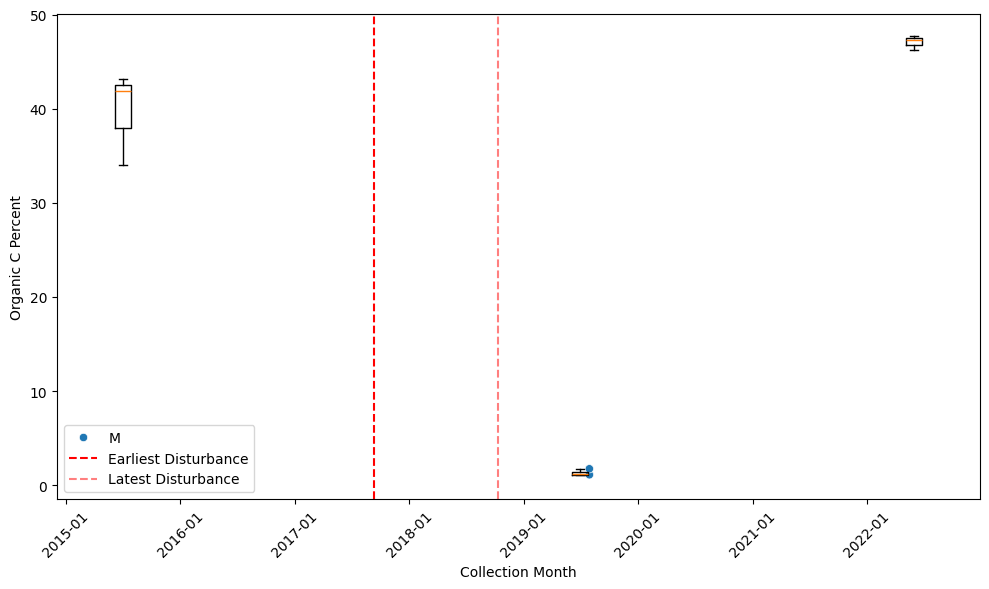


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.35
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
JERC_049


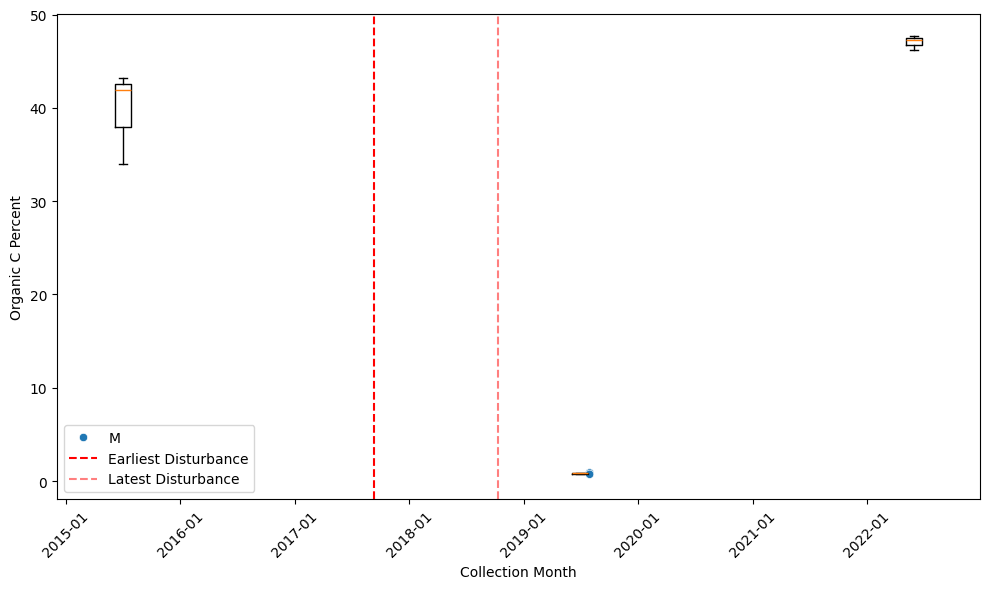


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     0.833333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
LENO_002


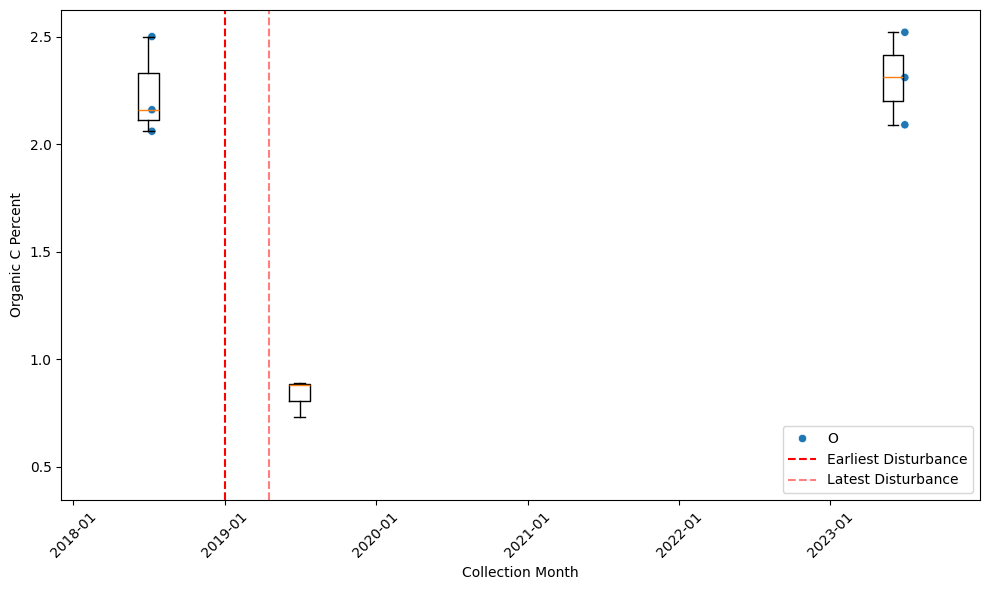


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     2.306667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
LENO_061


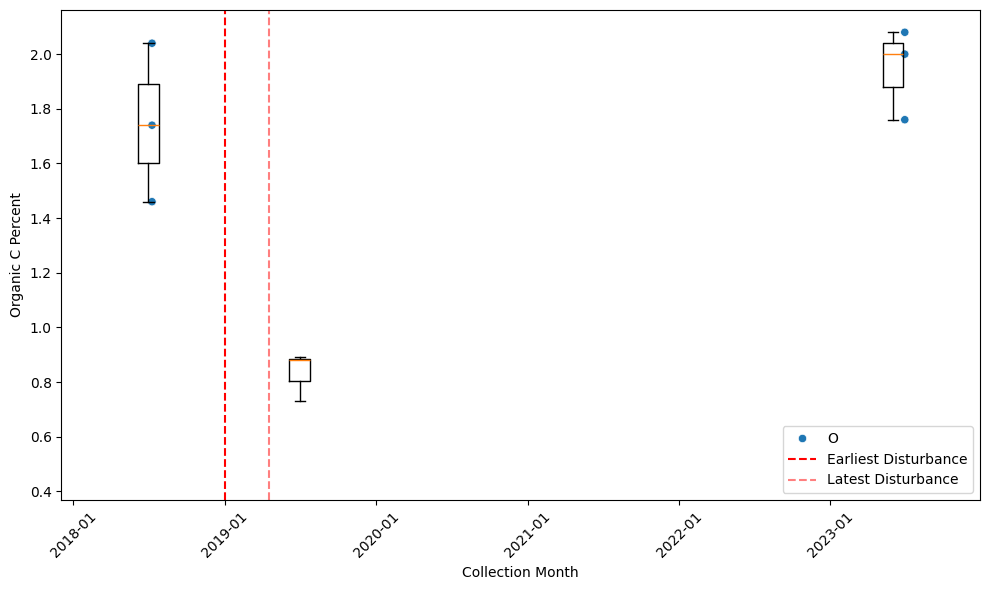


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     1.946667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
LENO_003


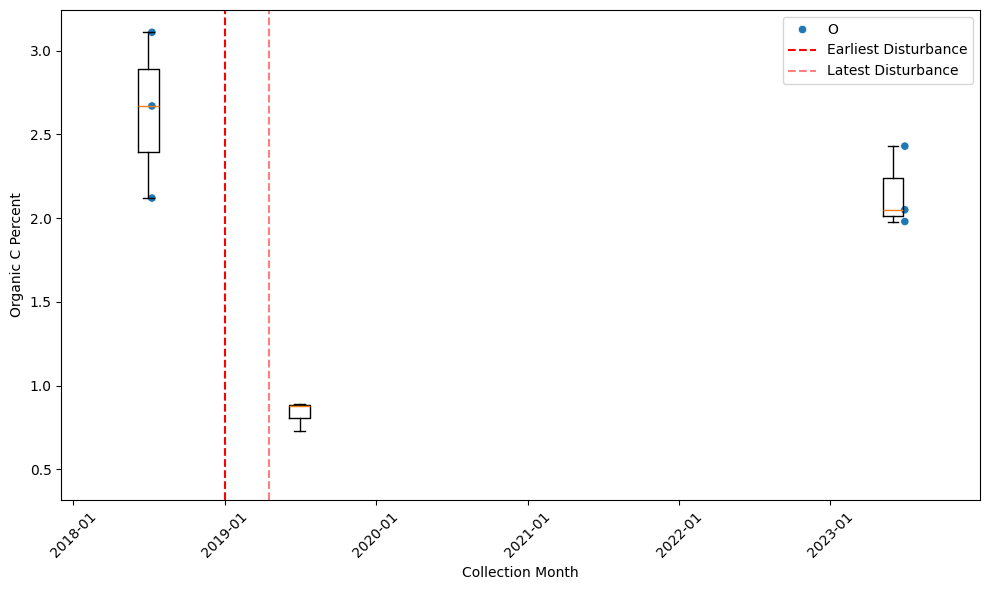


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     2.153333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
LENO_062


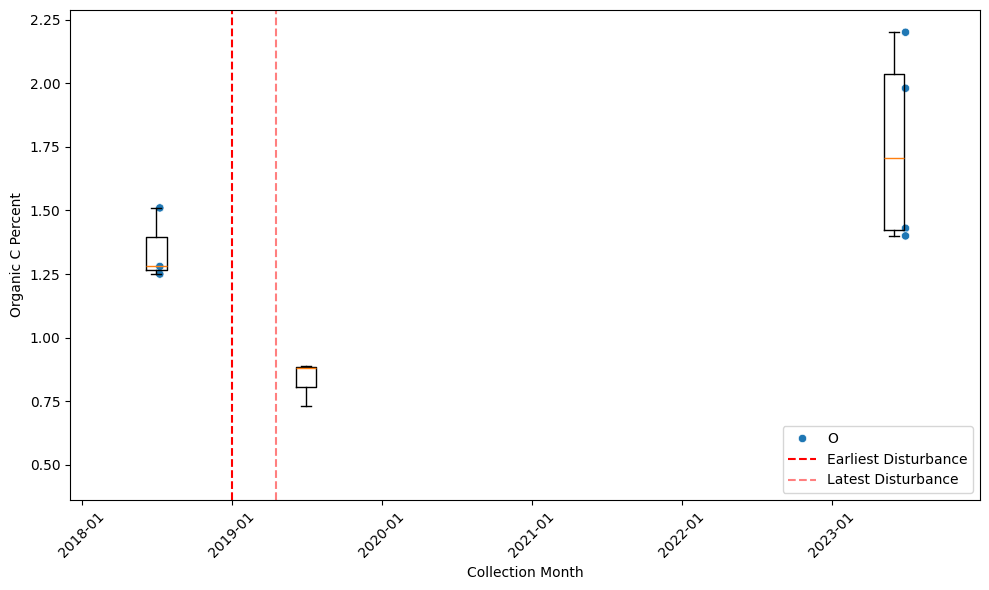


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3        NaN
4        NaN
5     1.7525
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64
LENO_063


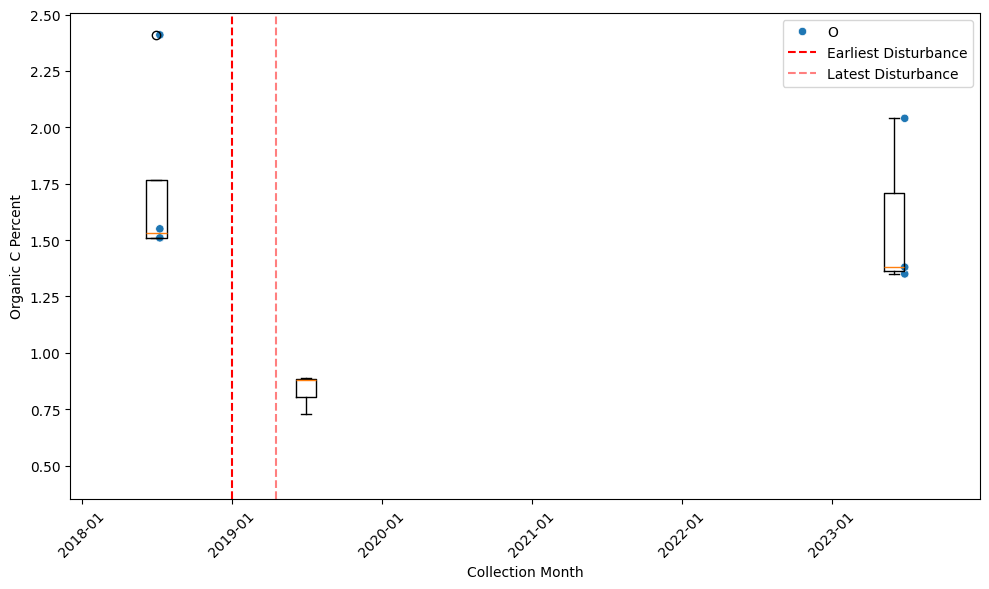


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4      NaN
5     1.59
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64
LENO_006


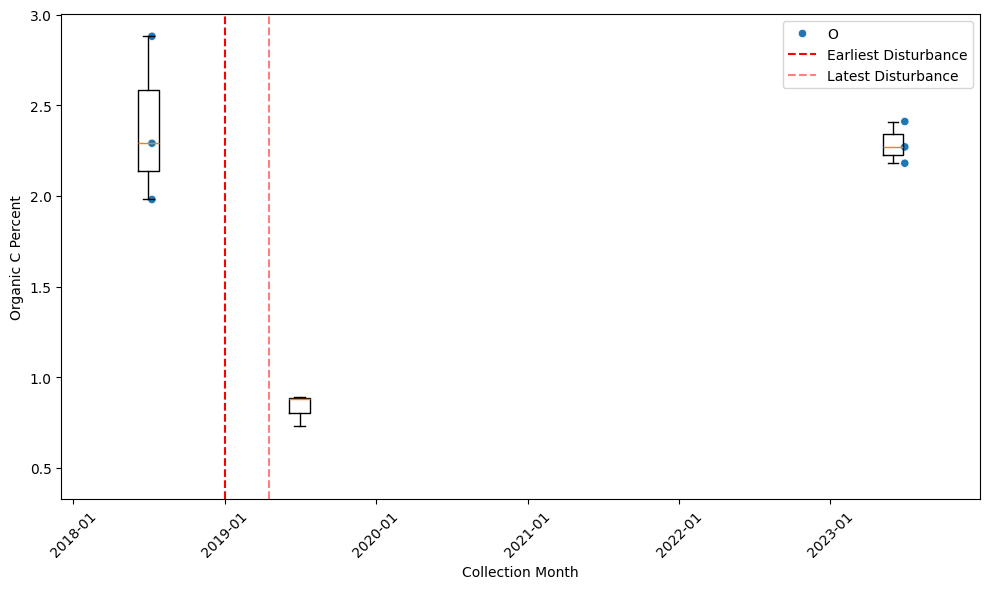


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     2.286667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
LENO_064


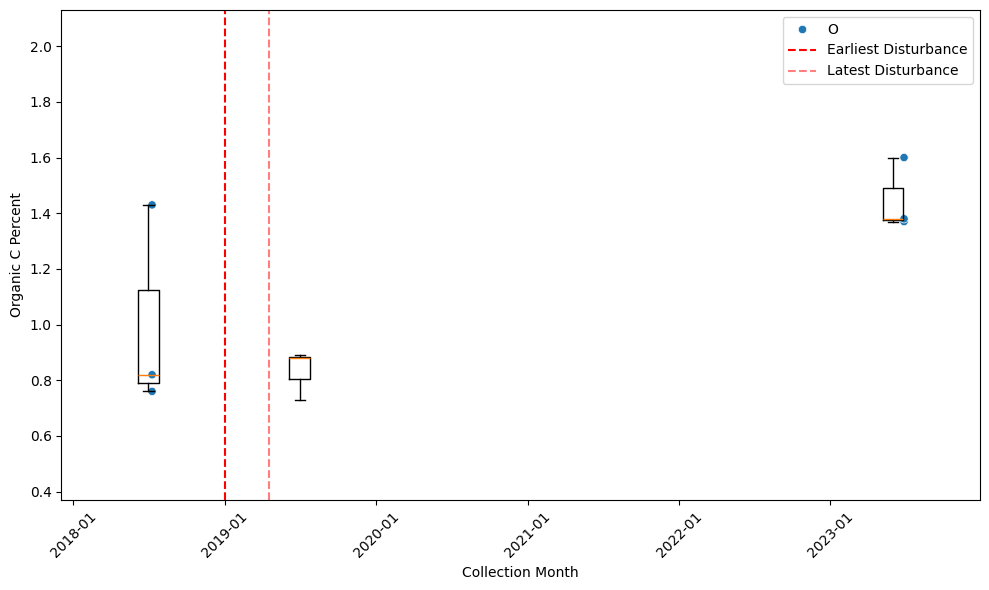


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4      NaN
5     1.45
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64
LENO_004


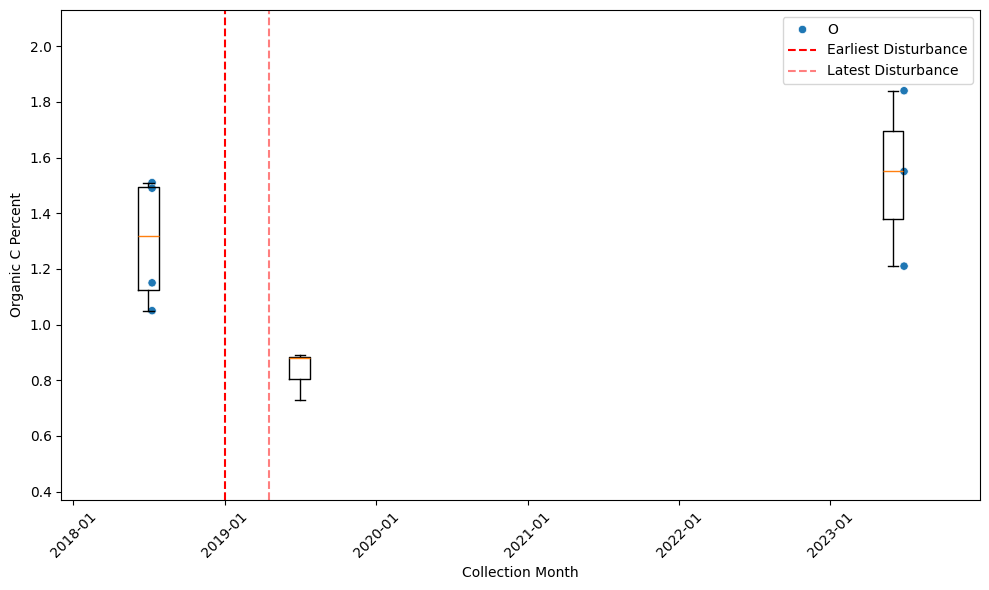


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     1.533333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
LENO_005


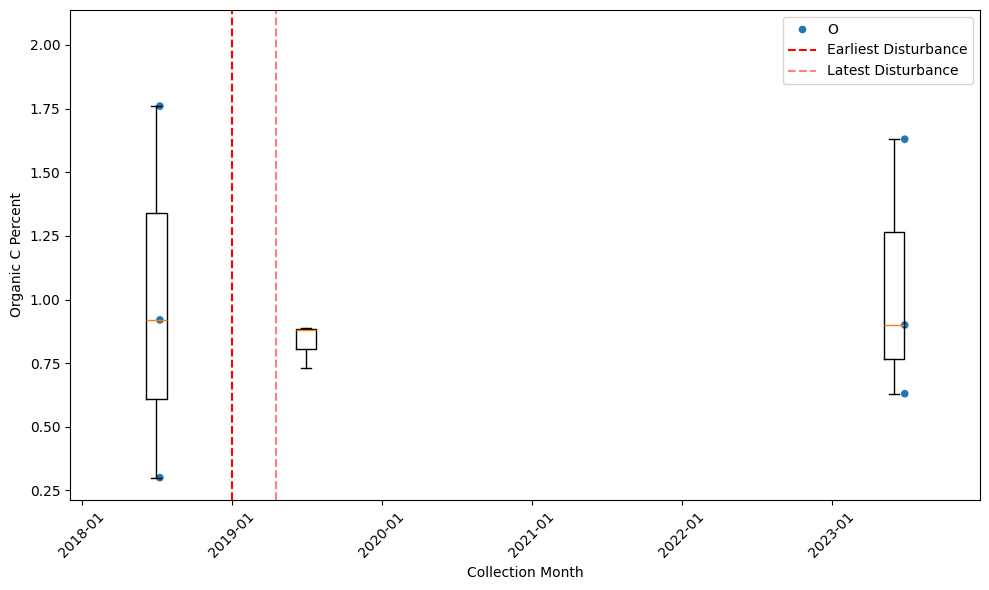


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     1.053333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
LENO_001


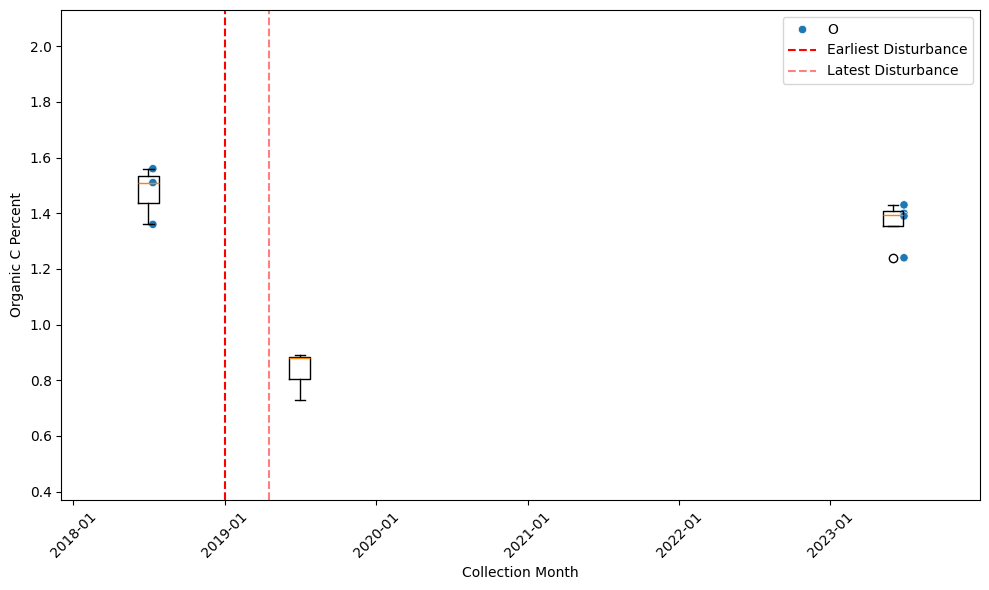


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     1.365
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MLBS_005


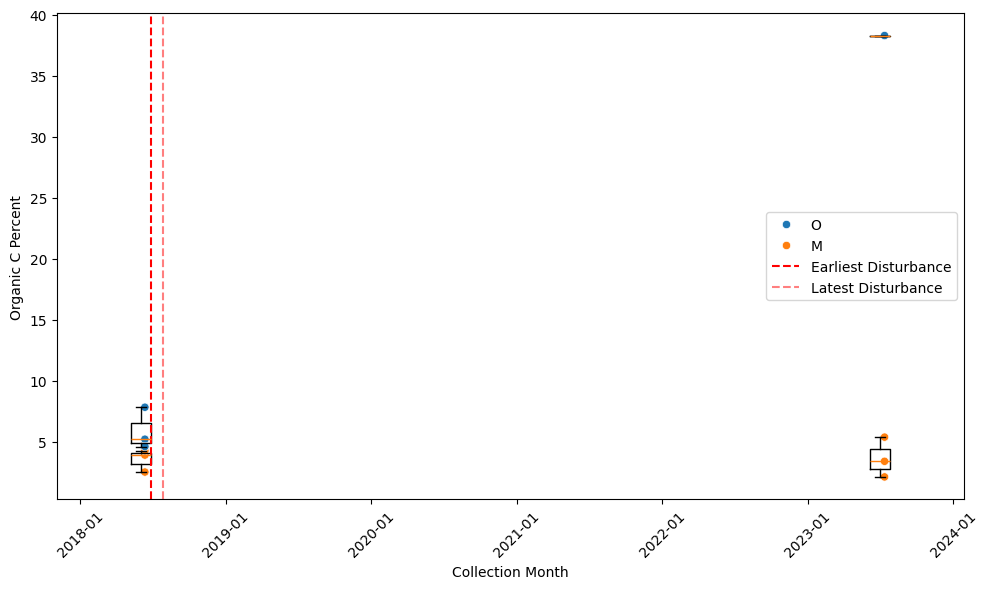


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     3.633333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     38.28
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MLBS_001


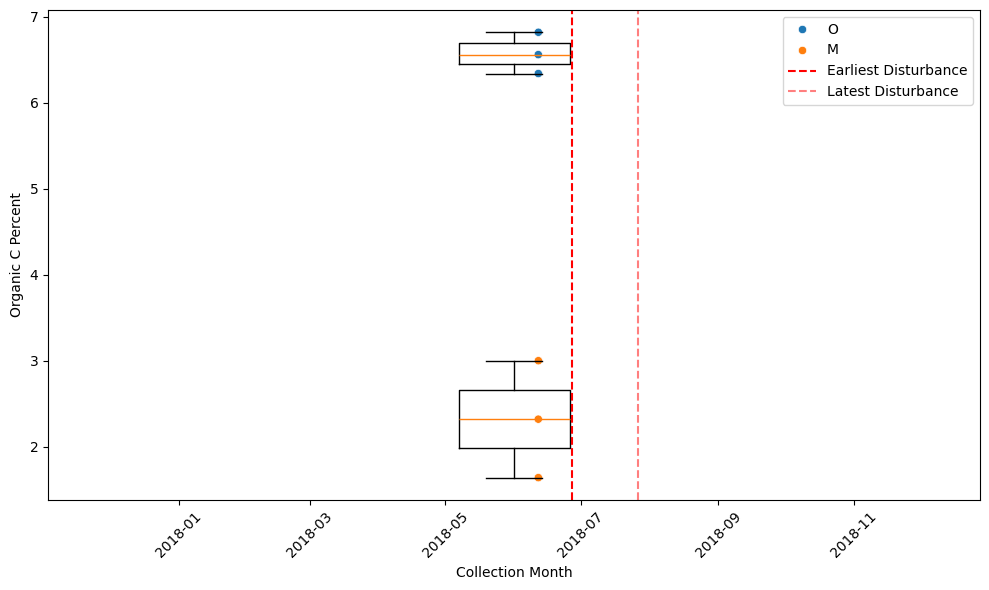


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     3.876667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
MLBS_003


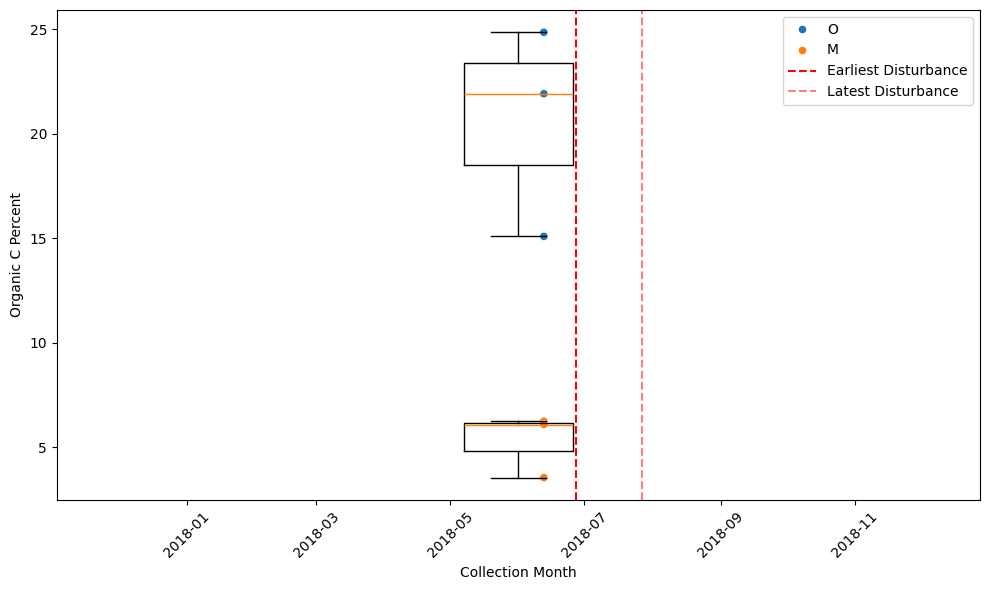


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4      NaN
5     7.59
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
MLBS_002


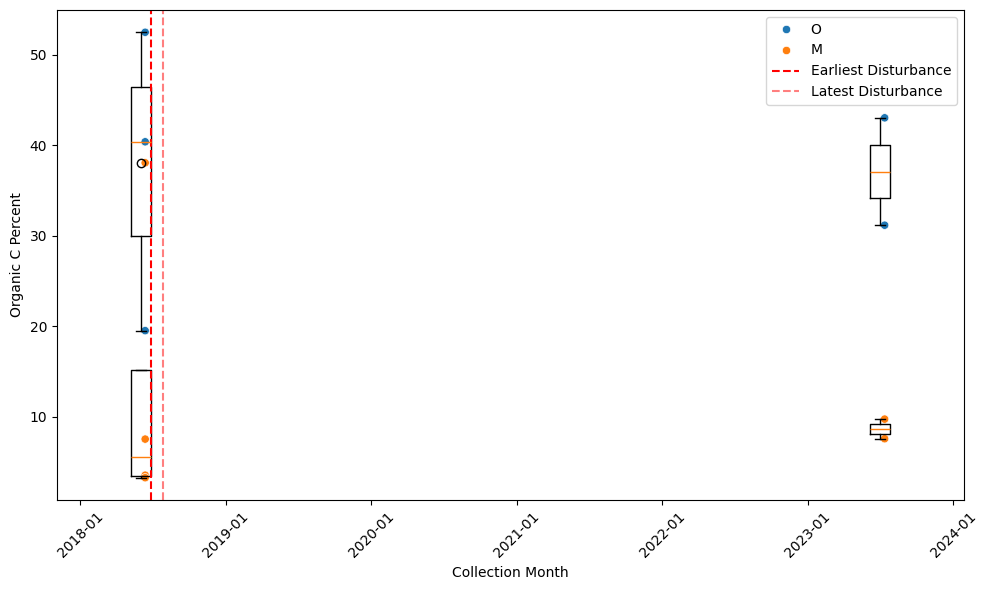


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     8.635
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3        NaN
4        NaN
5     37.095
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64
MLBS_064


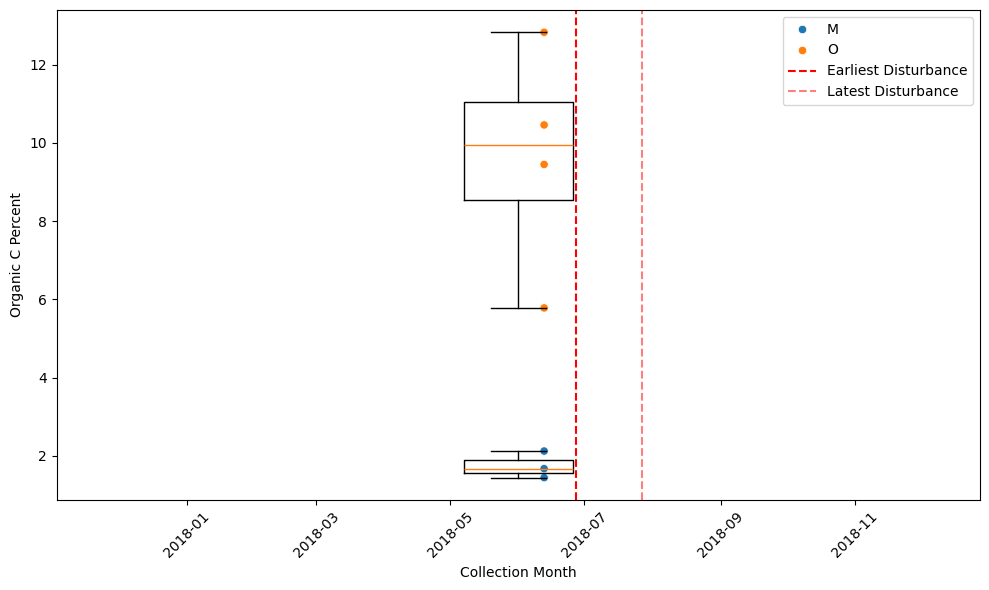


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     5.973333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
MLBS_061


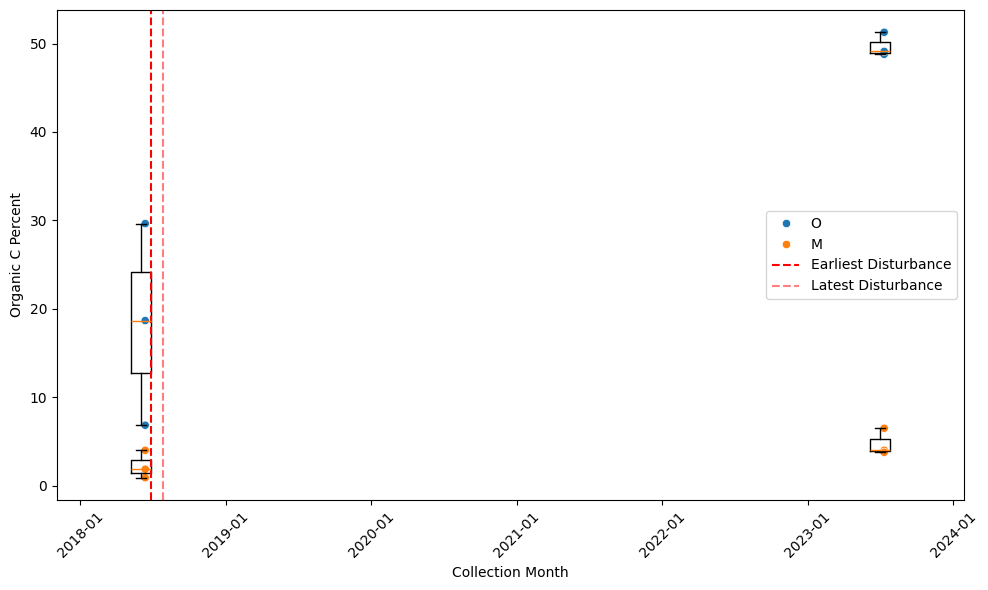


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     4.783333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     49.72
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MLBS_006


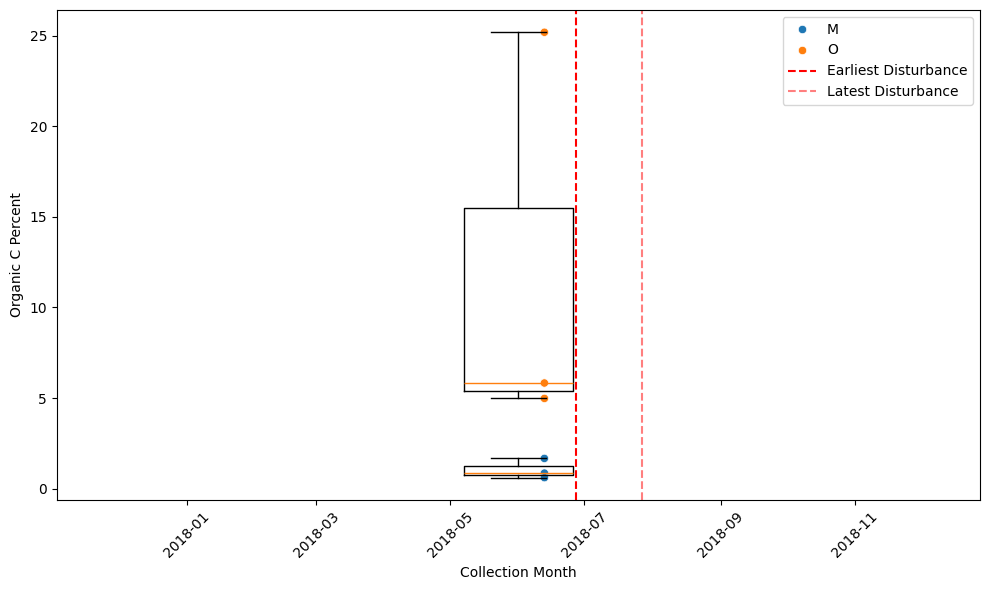


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     2.546667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
MLBS_007


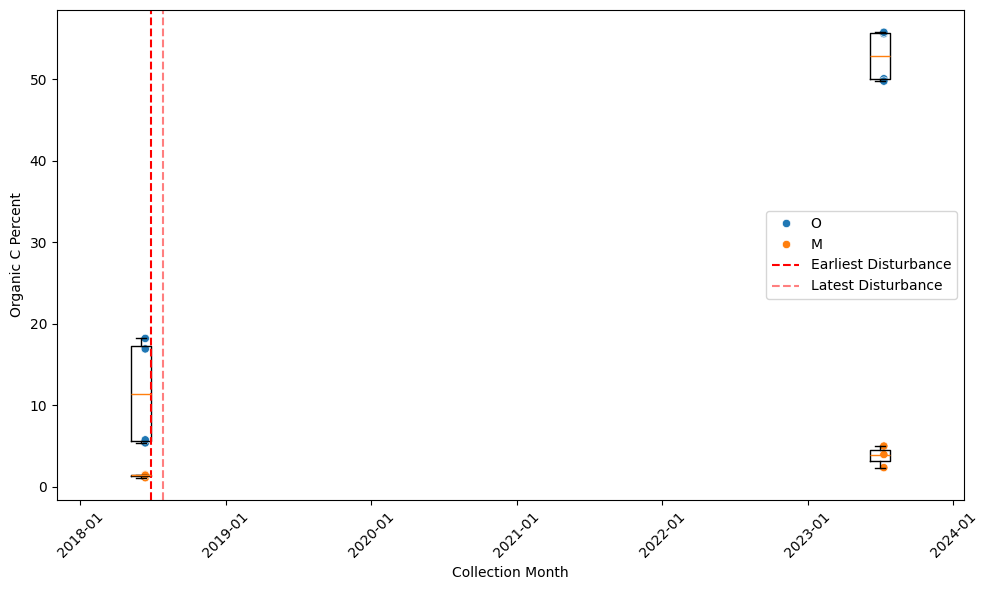


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4      NaN
5     3.75
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     52.83
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MLBS_067


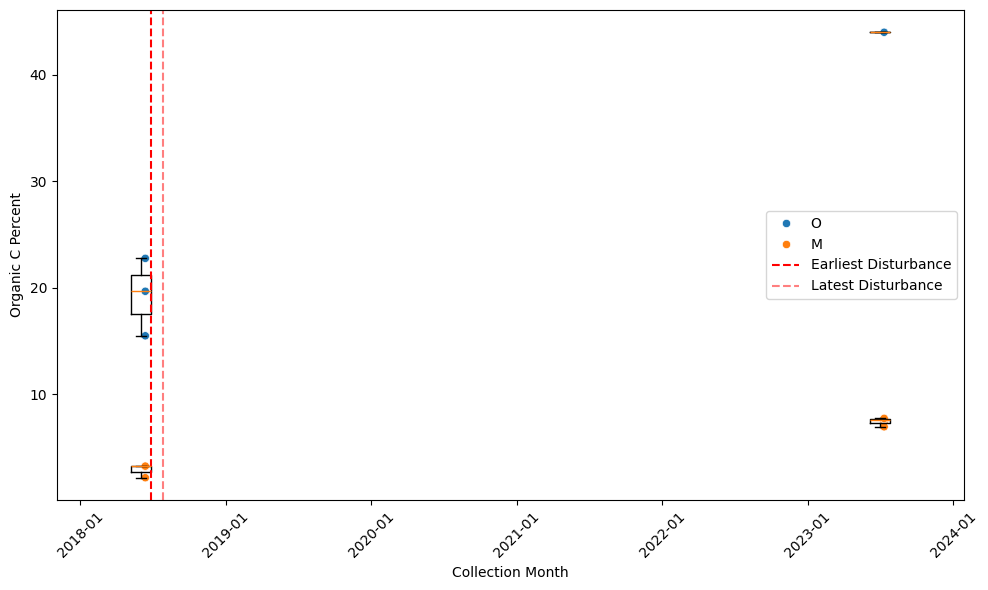


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3        NaN
4        NaN
5     7.4775
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     43.99
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MLBS_063


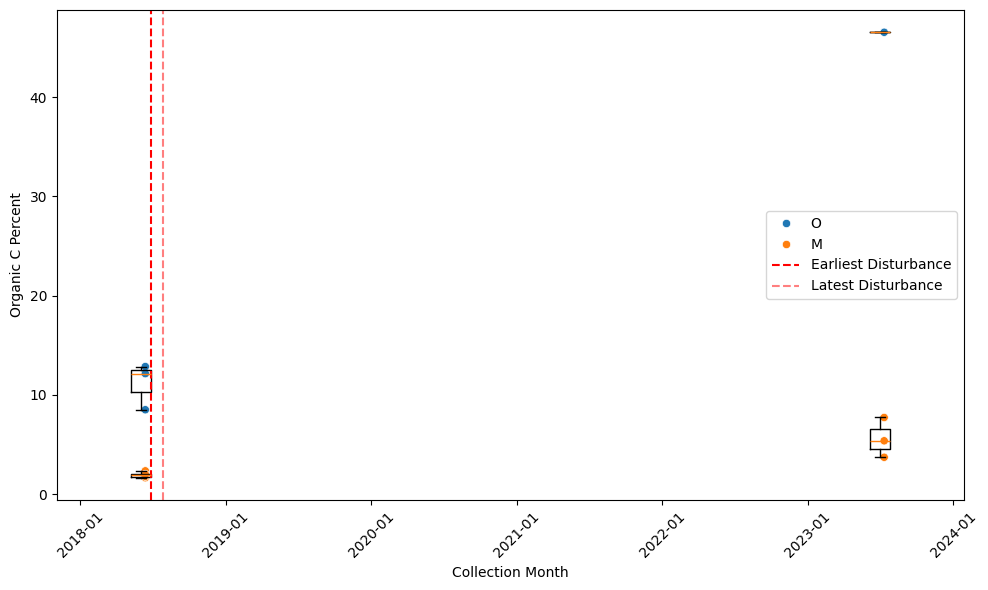


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     NaN
2     NaN
3     NaN
4     NaN
5     5.6
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4       NaN
5     46.54
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MOAB_044


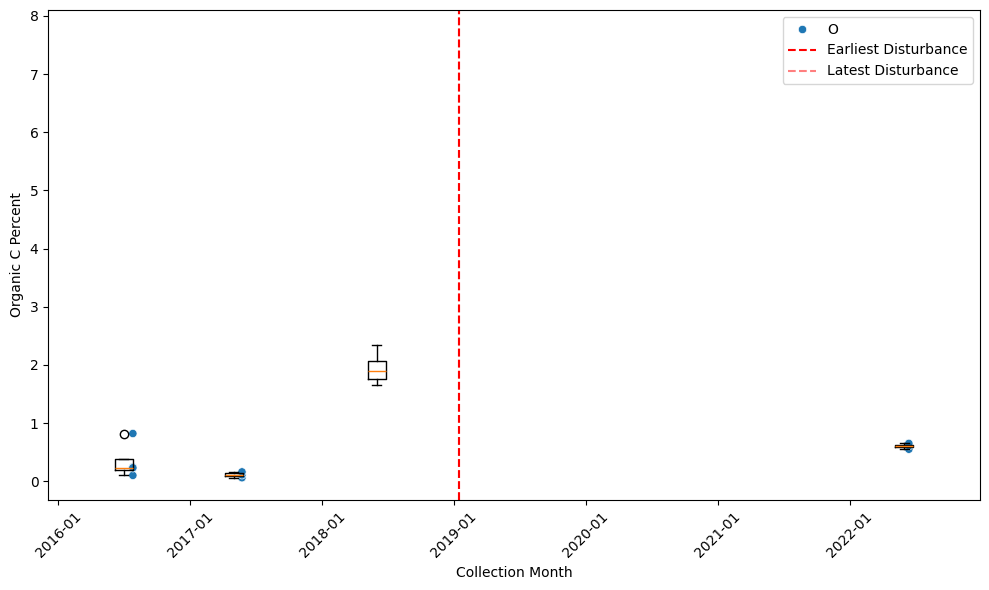


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4     0.603333
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
MOAB_045


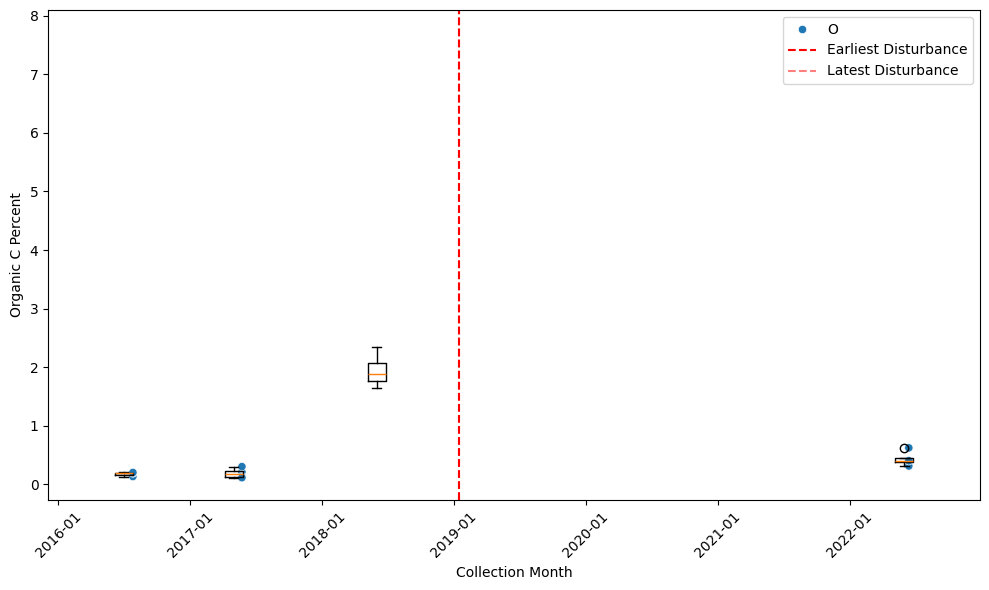


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4     0.43
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64
MOAB_047


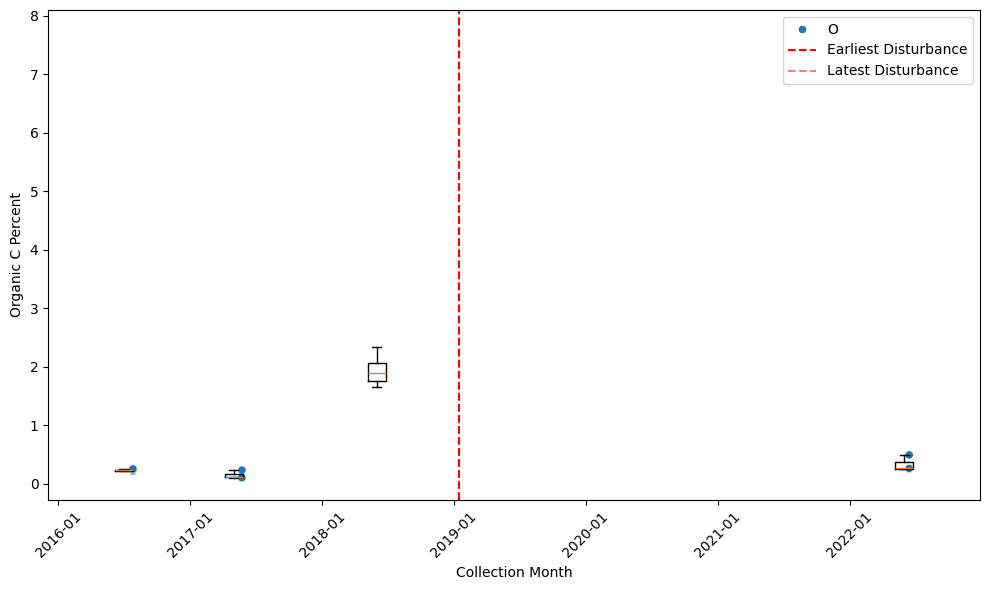


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4     0.333333
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
MOAB_005


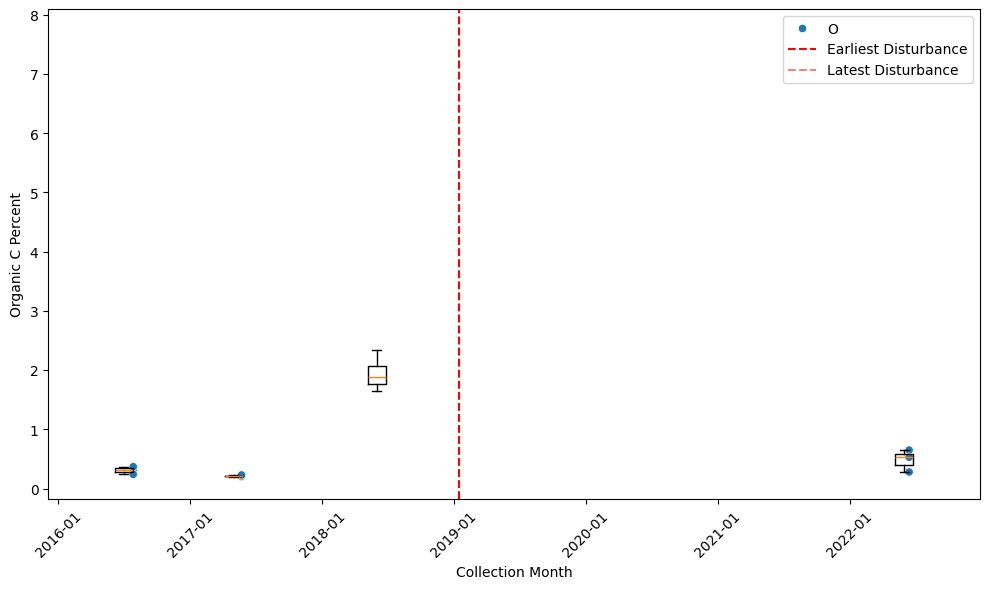


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4     0.486667
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
MOAB_002


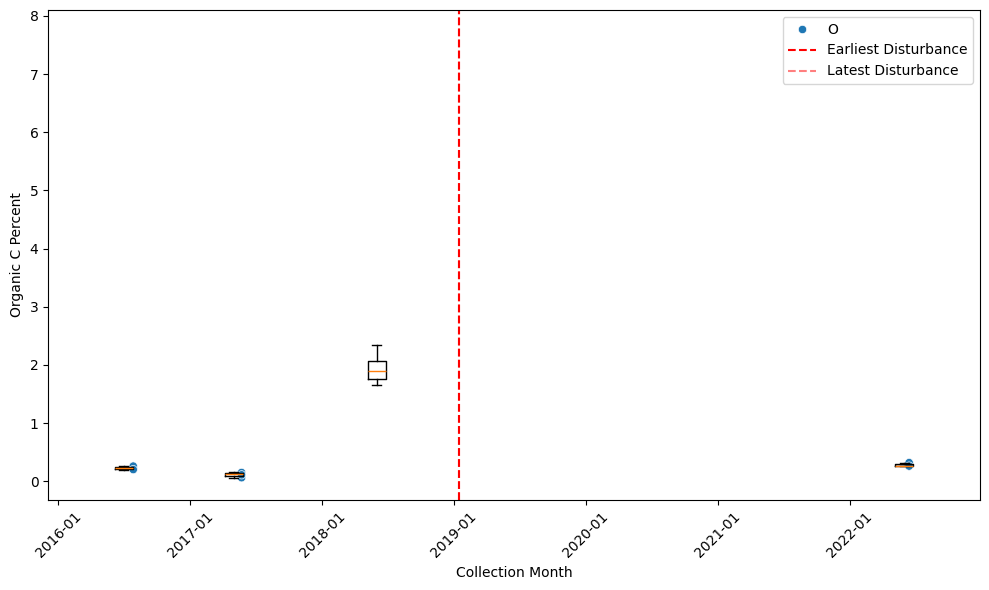


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4     0.28
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64
MOAB_046


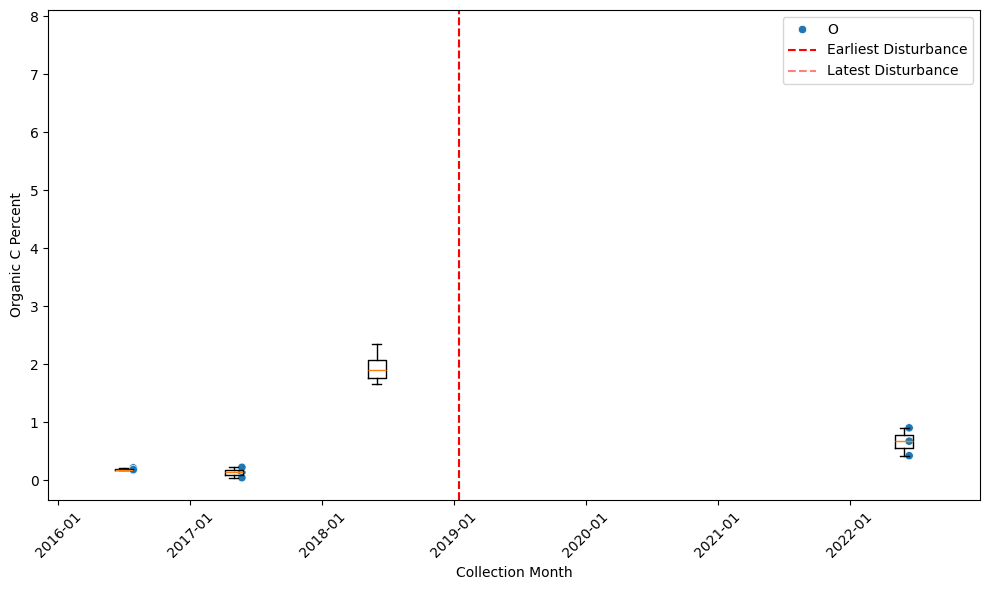


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4     0.663333
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
MOAB_003


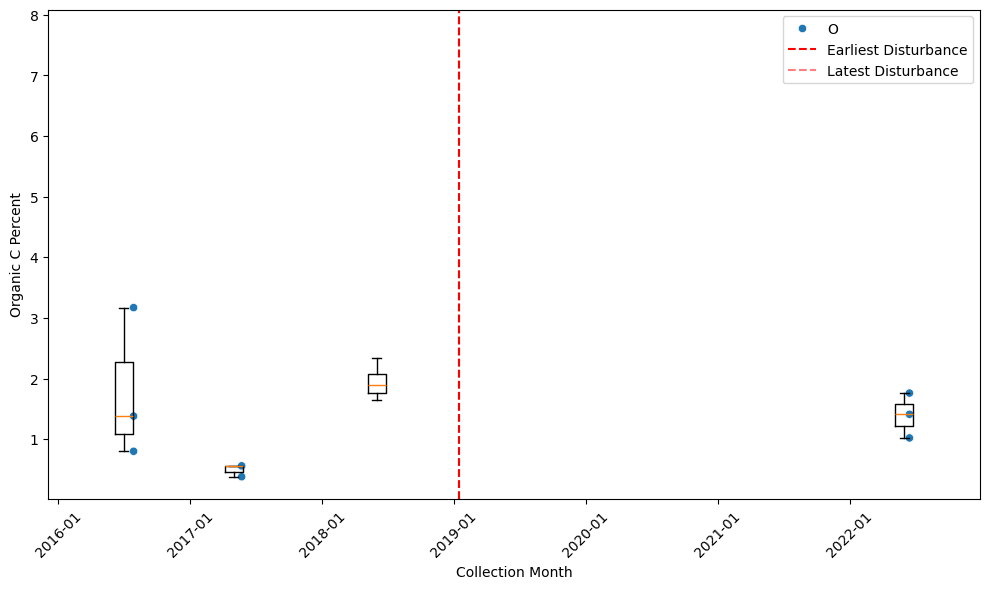


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4     1.396667
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
MOAB_001


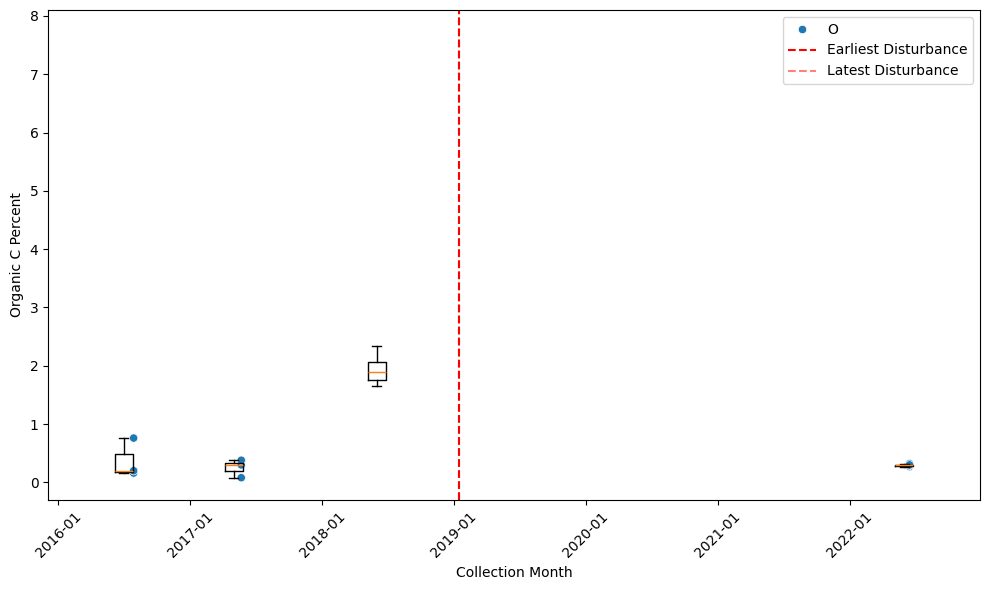


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3       NaN
4     0.295
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
MOAB_006


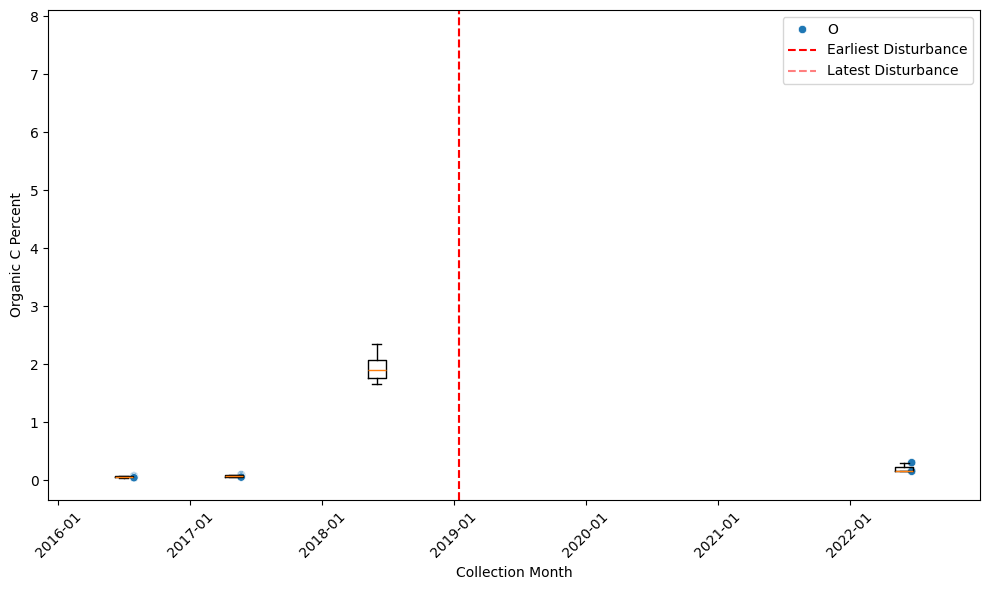


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4     0.203333
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
MOAB_004


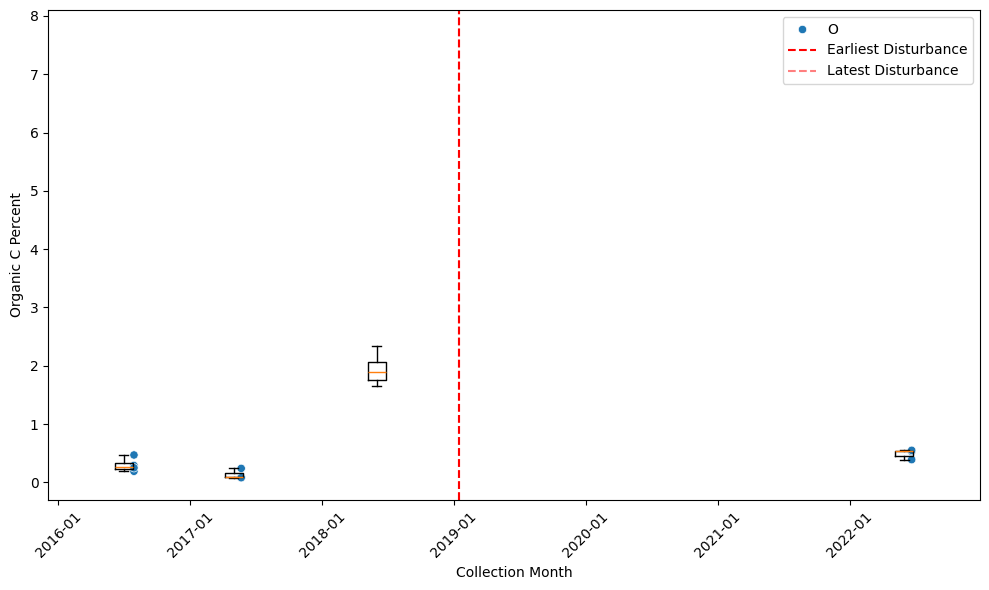


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4     0.49
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64
ORNL_002


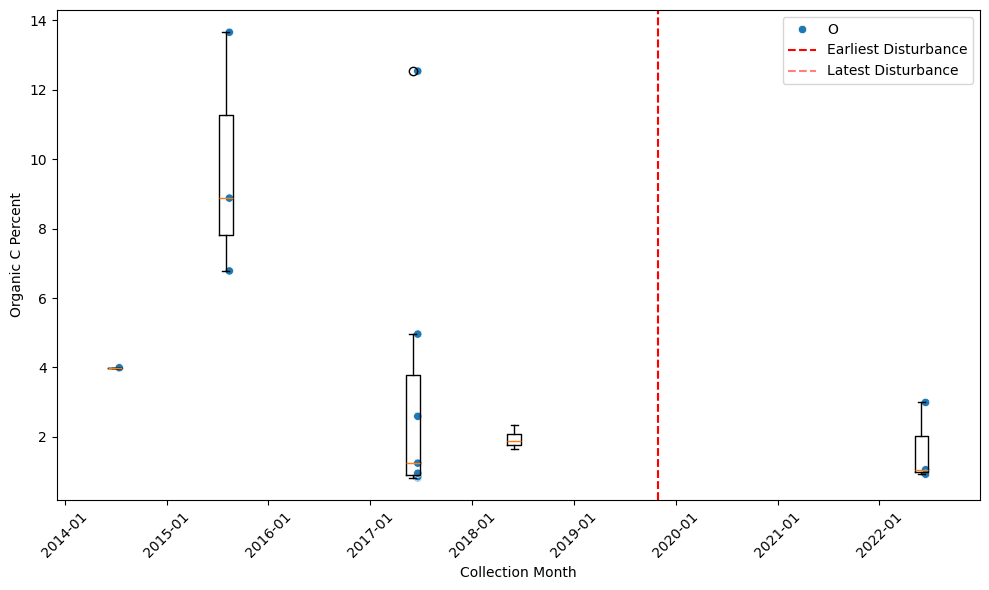


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.653333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
ORNL_003


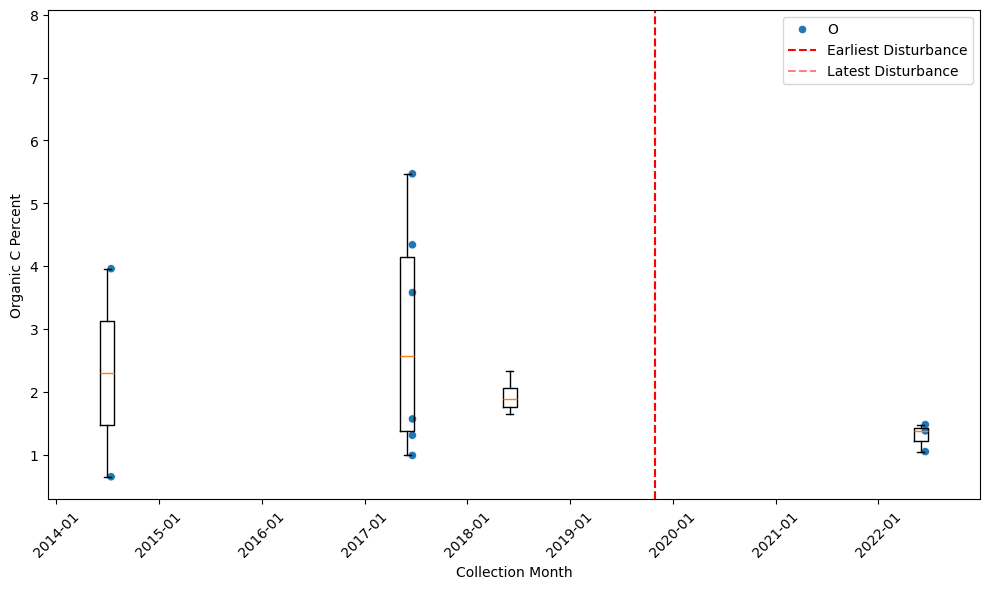


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.303333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
ORNL_027


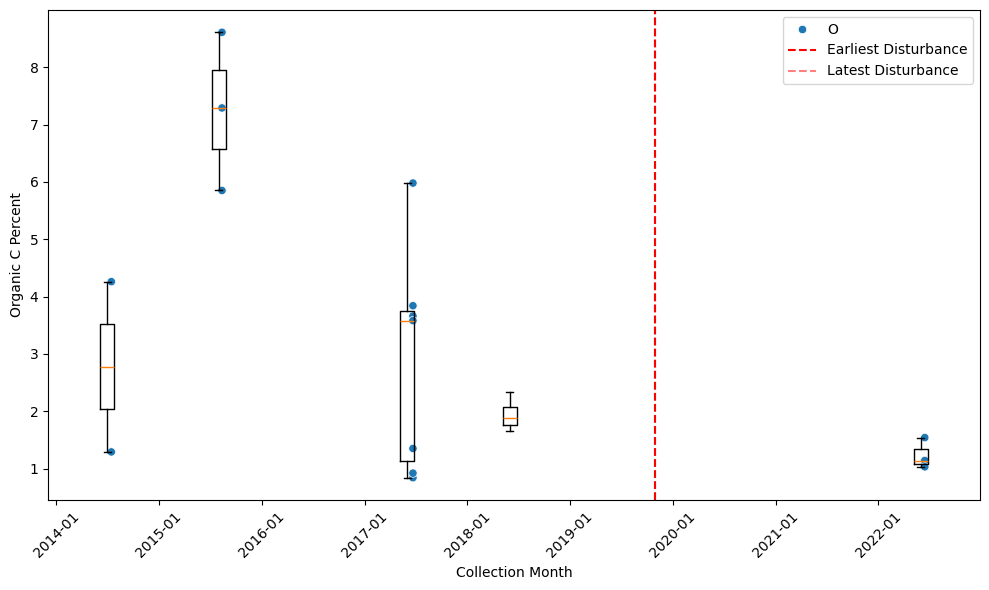


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.236667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
ORNL_001


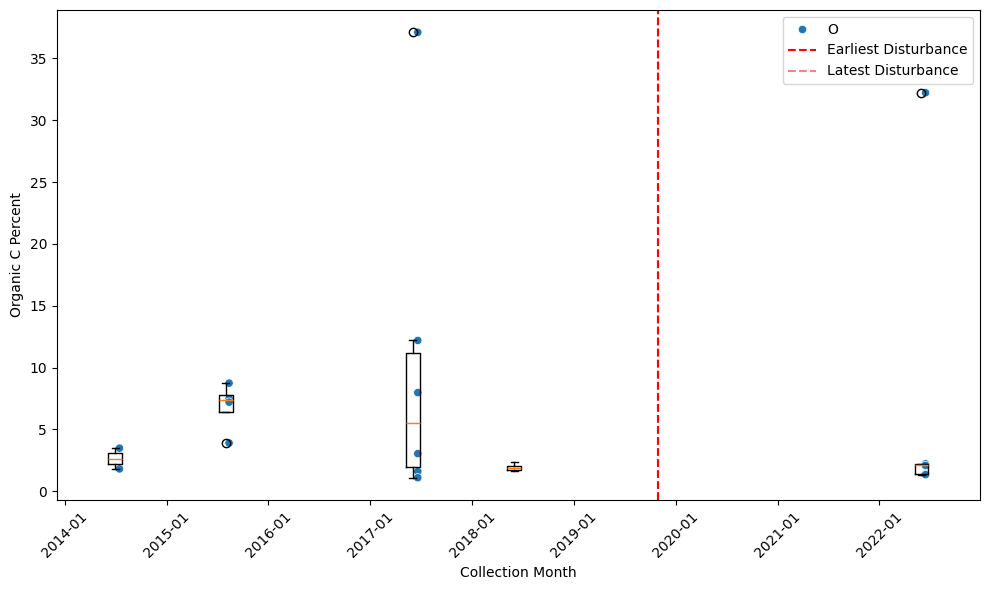


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3     7.856
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
ORNL_043


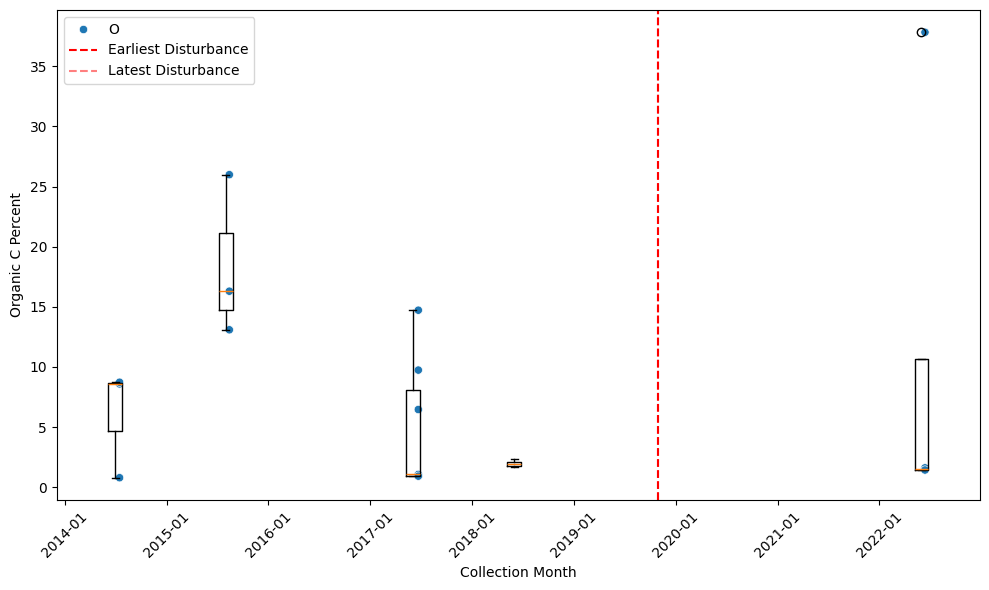


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1         NaN
2         NaN
3     10.5875
4         NaN
5         NaN
6         NaN
7         NaN
8         NaN
9         NaN
10        NaN
11        NaN
12        NaN
13        NaN
14        NaN
15        NaN
16        NaN
17        NaN
18        NaN
19        NaN
20        NaN
Name: organicCPercent, dtype: float64
ORNL_046


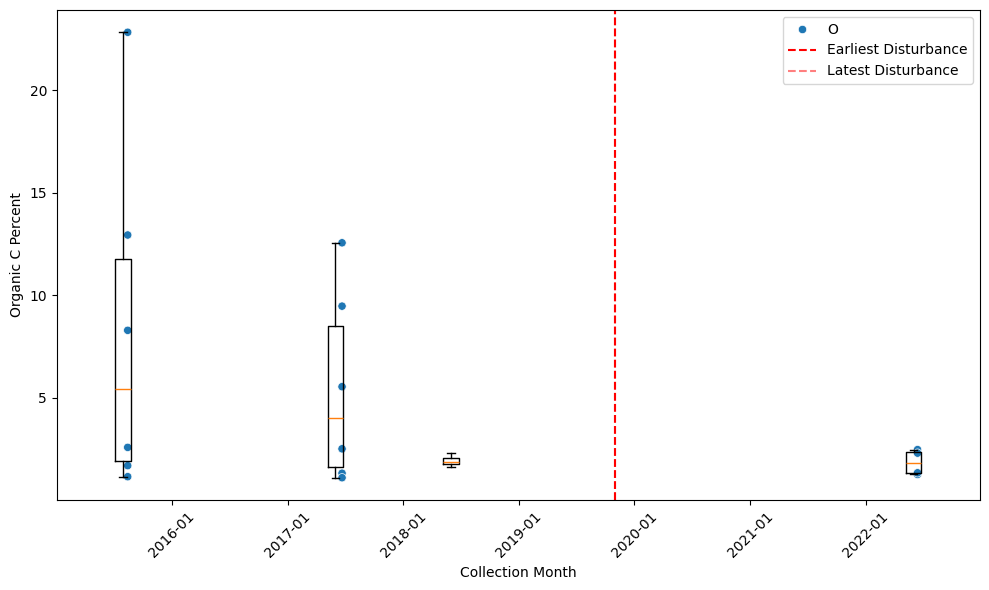


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3     1.8525
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64
ORNL_053


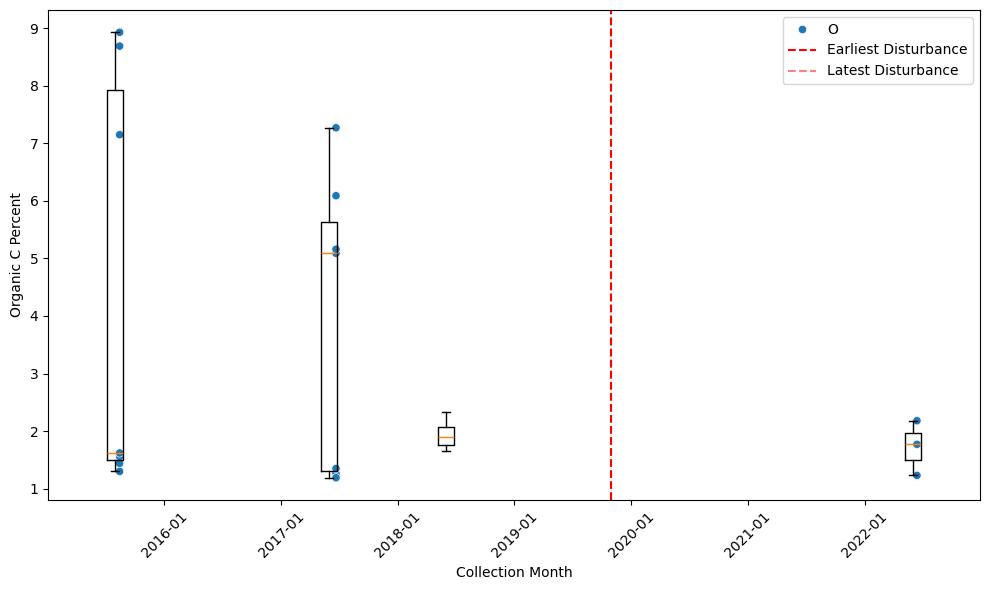


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.726667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
ORNL_049


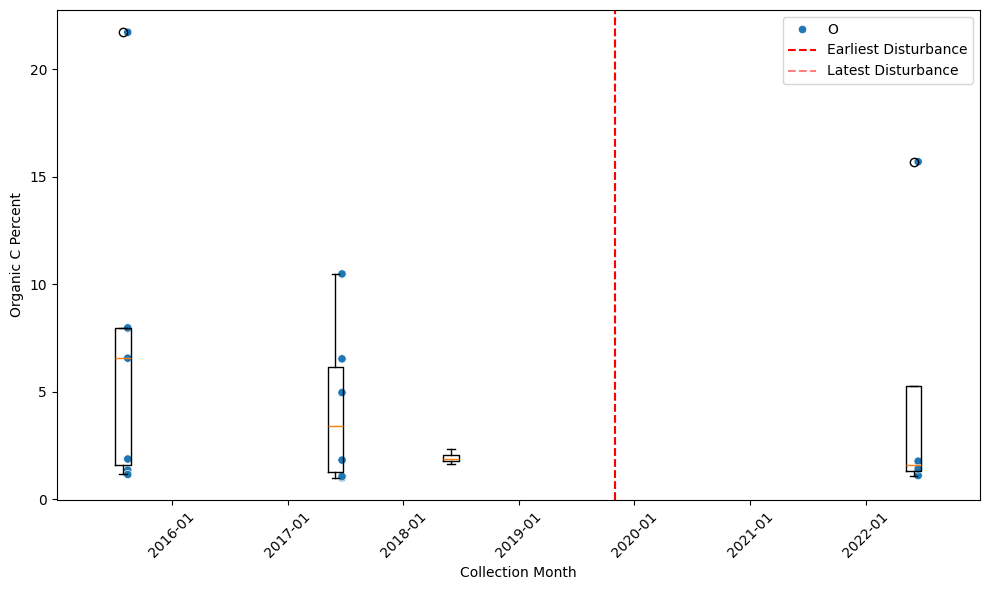


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3     4.995
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
OSBS_027


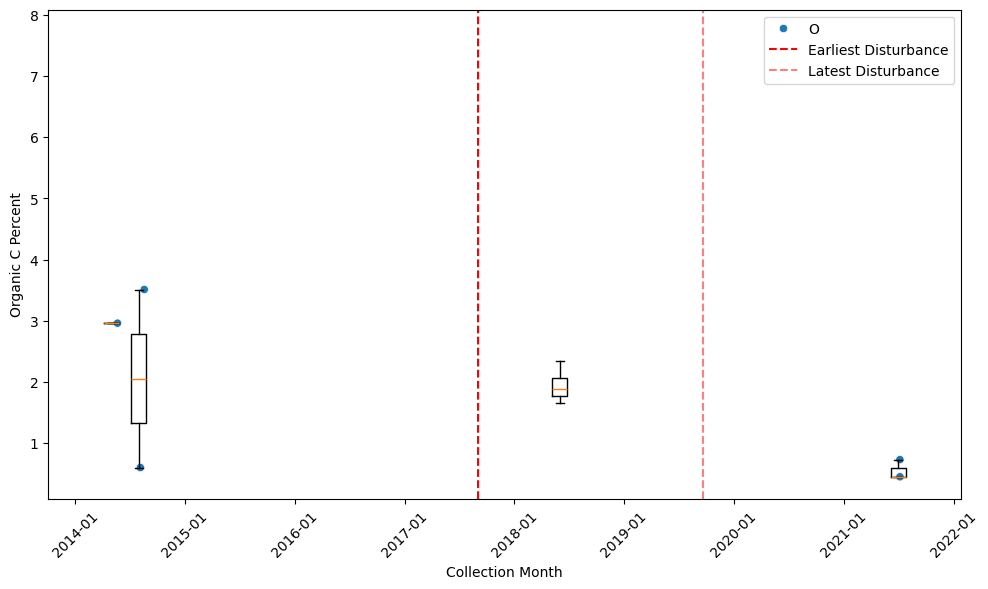


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2     0.543333
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
OSBS_004


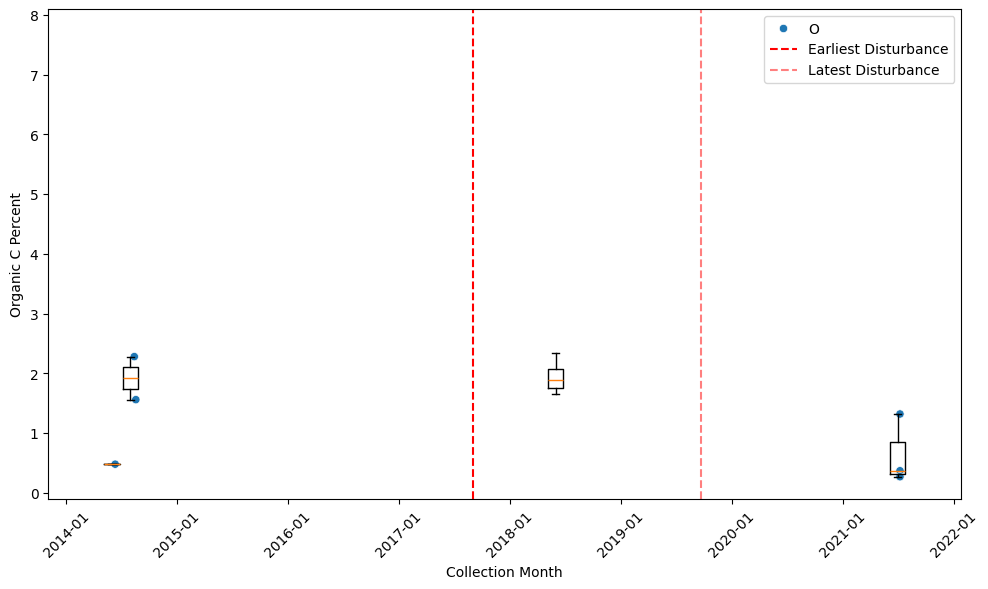


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2     0.653333
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
OSBS_005


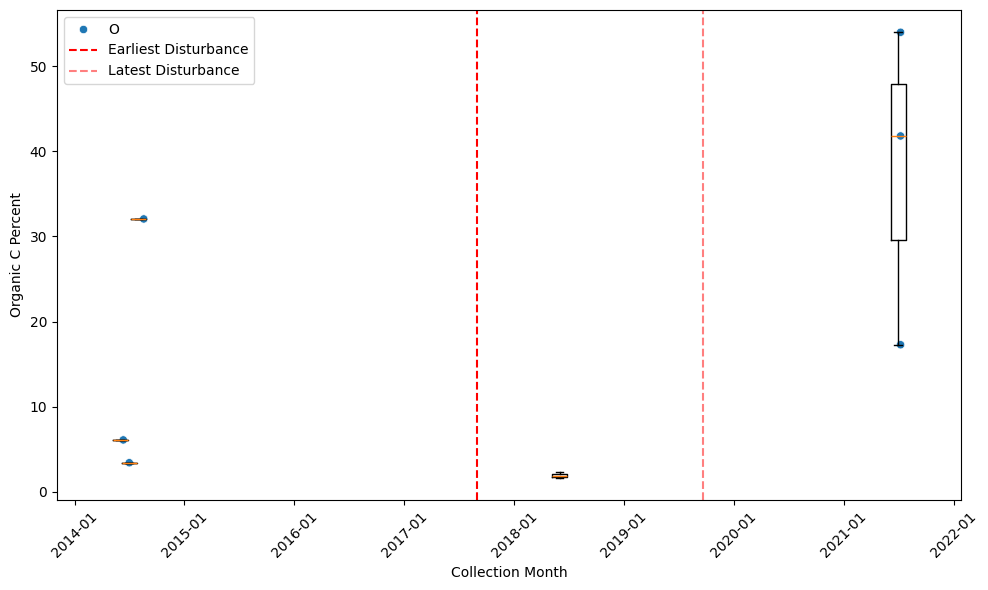


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2     37.683333
3           NaN
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
OSBS_026


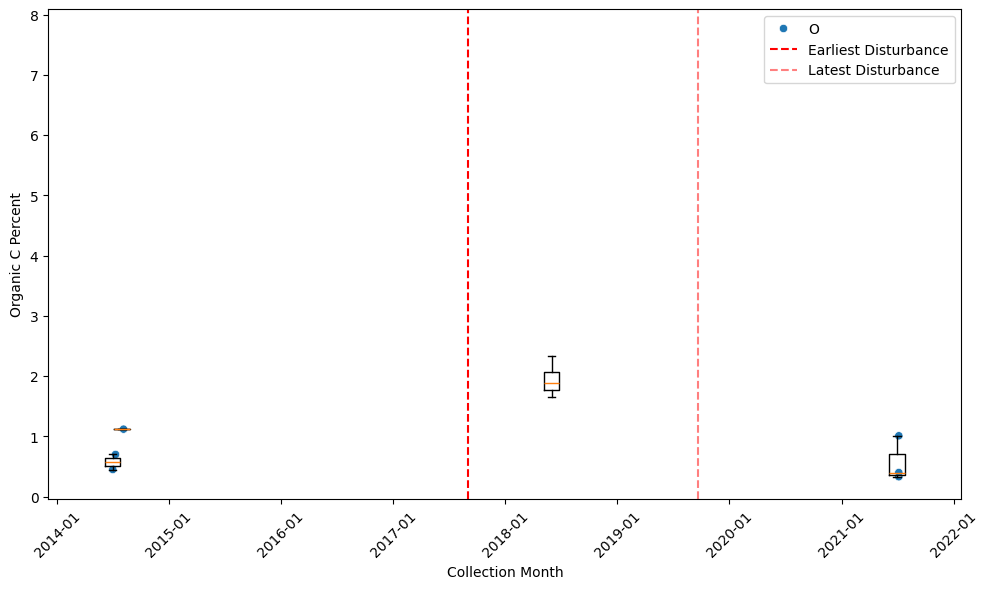


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1      NaN
2     0.58
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64
OSBS_002


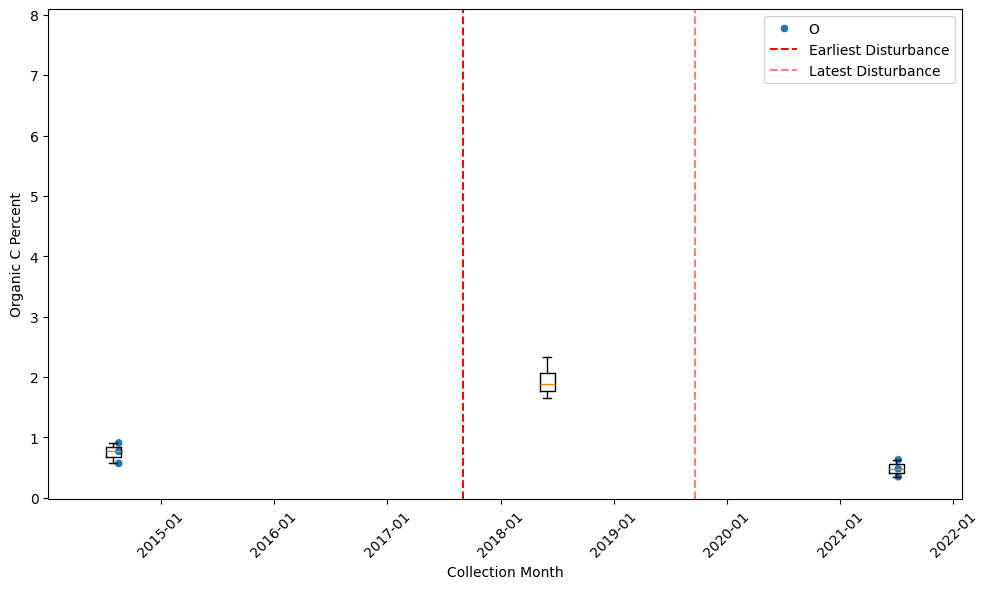


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2     0.486667
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
OSBS_001


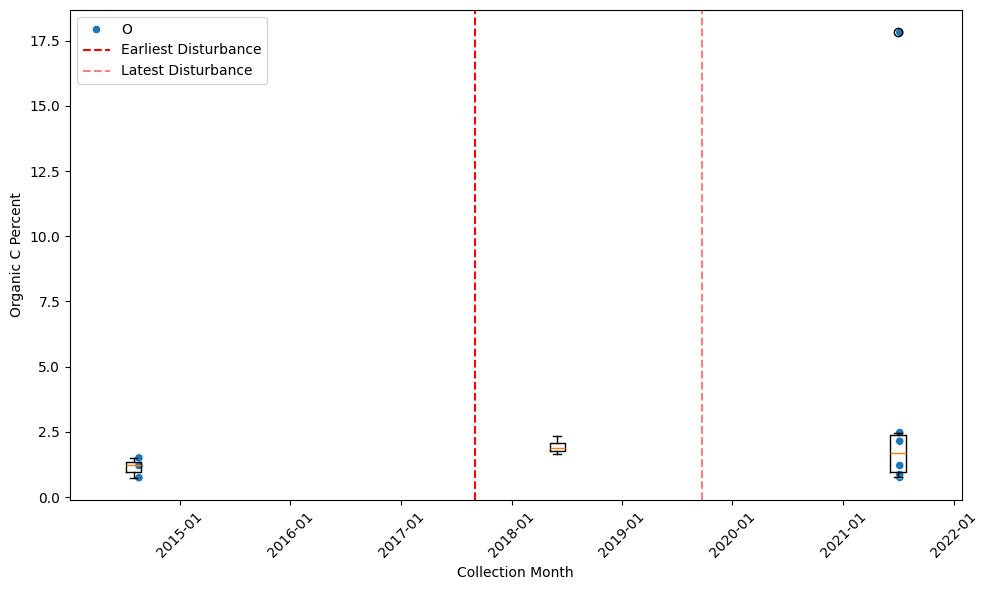


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1          NaN
2     4.208333
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64
OSBS_003


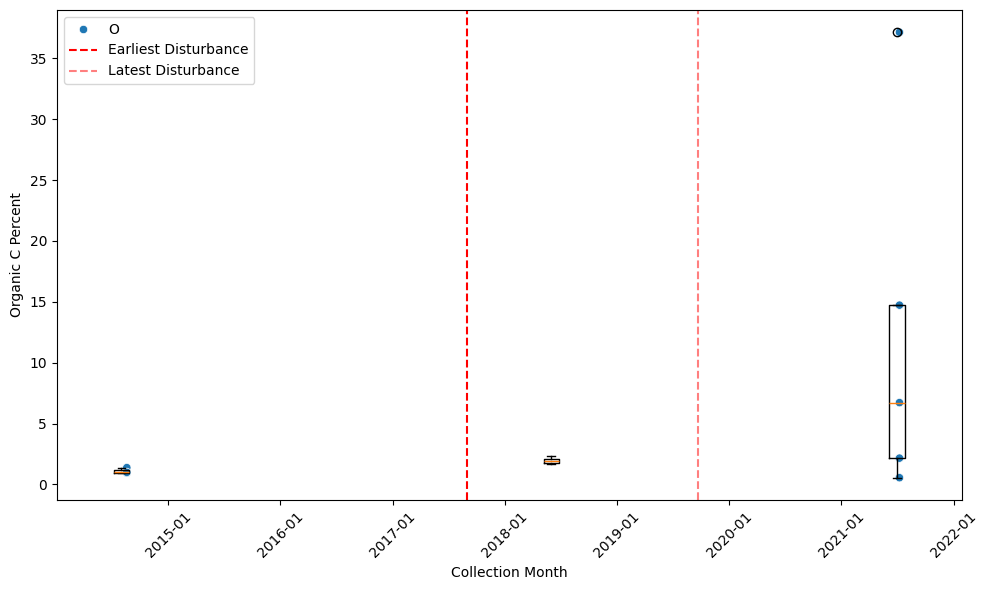


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1        NaN
2     12.262
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64
SCBI_045


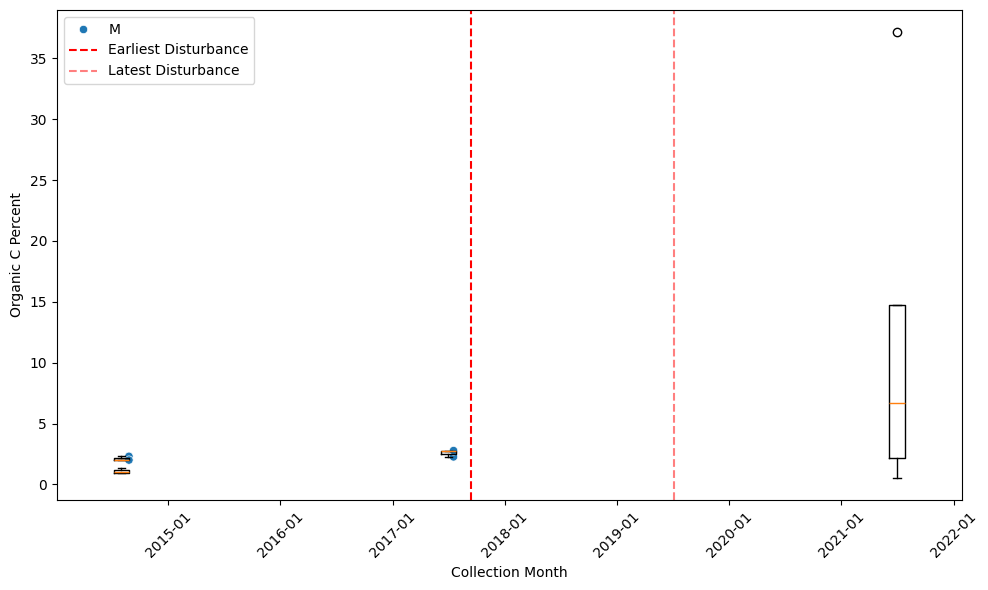


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     3.41
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_004


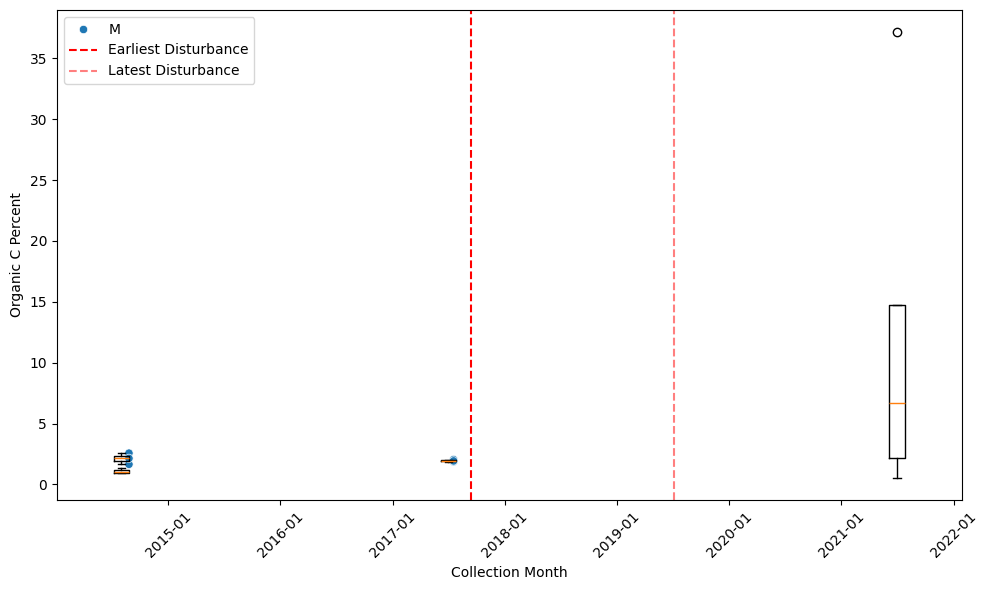


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     2.123333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_006


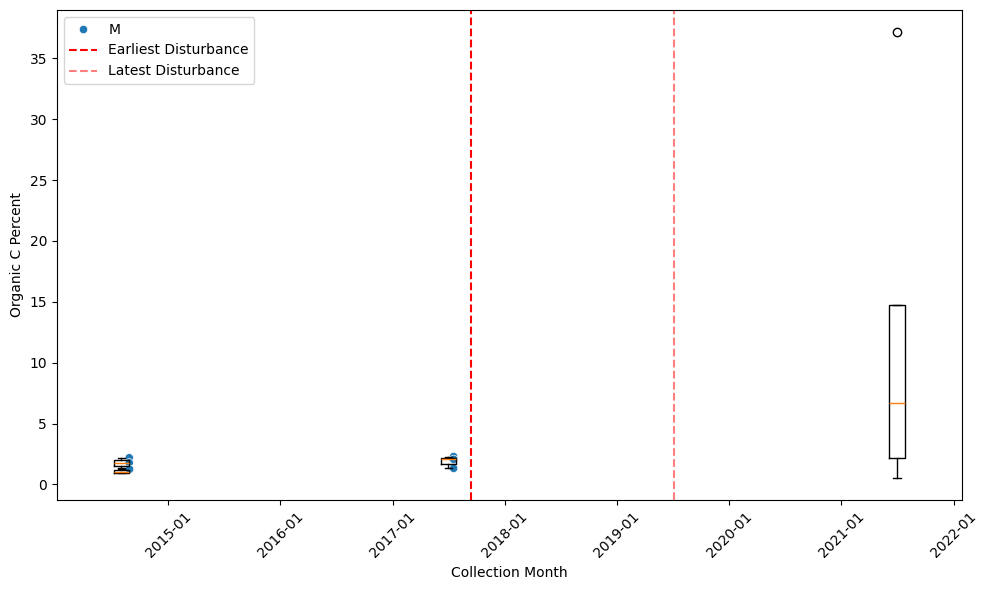


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     1.99
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_003


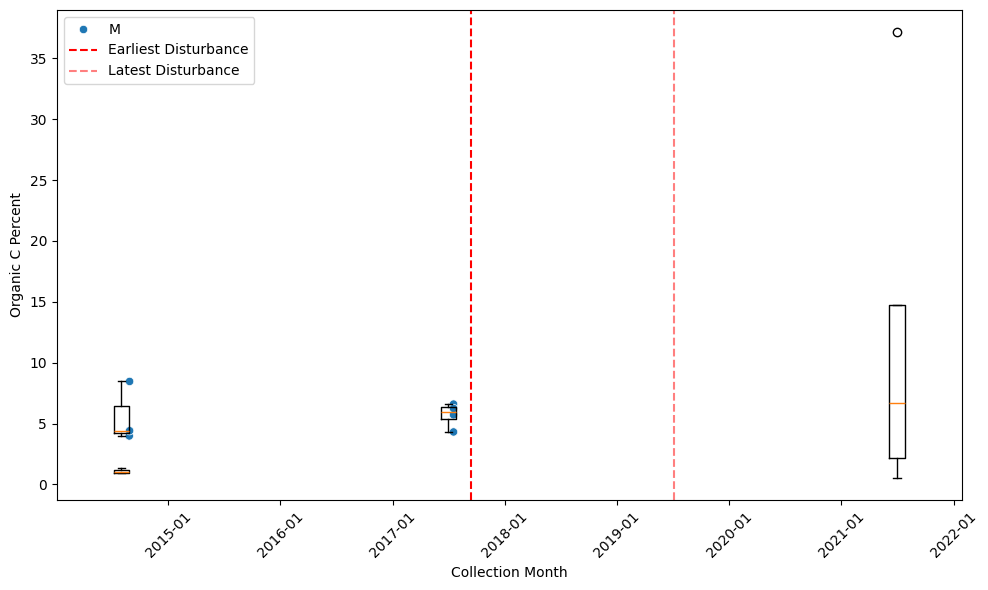


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     5.66
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_005


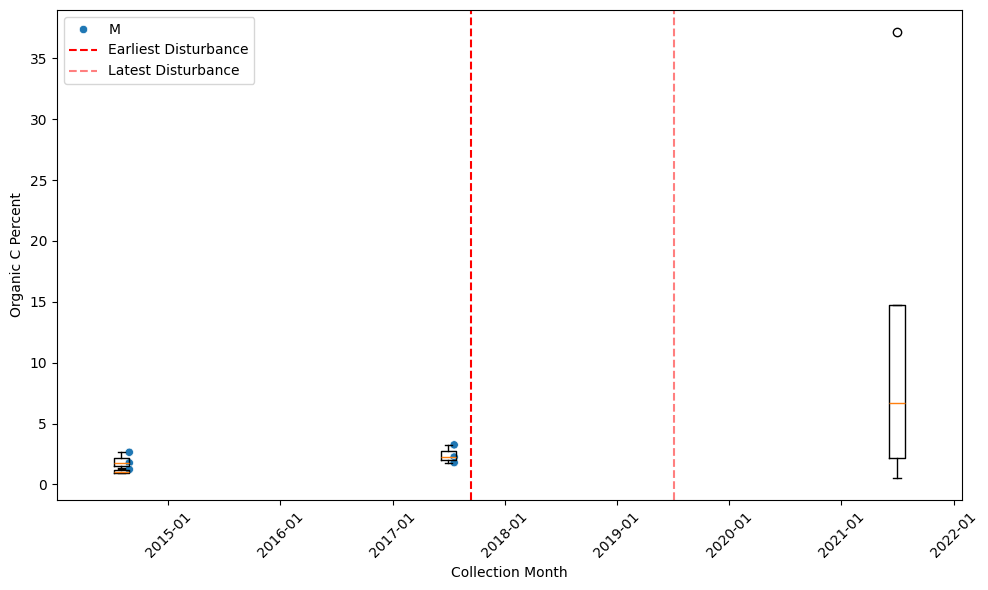


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     2.746667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_067


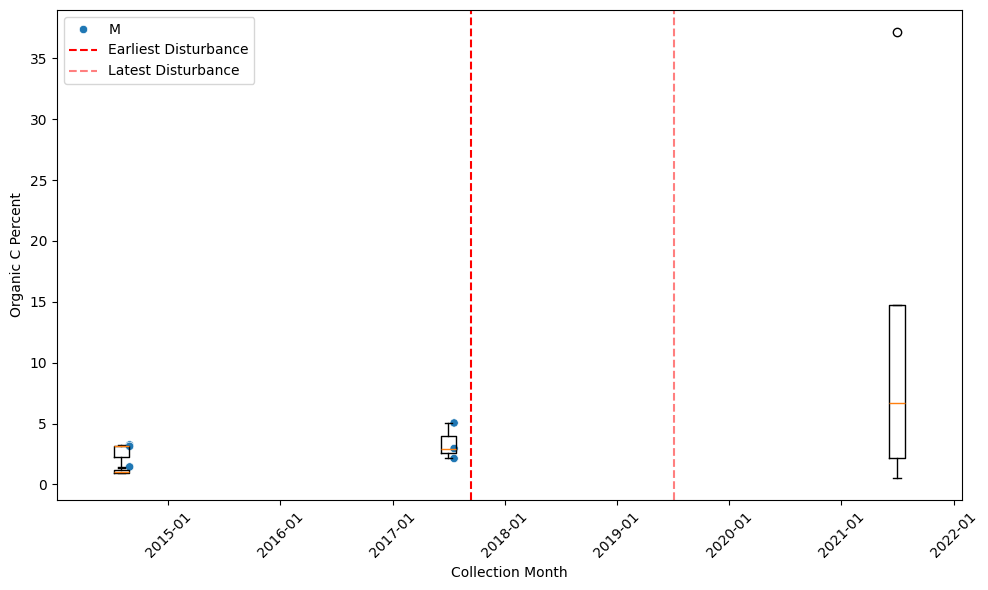


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     6.05
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_049


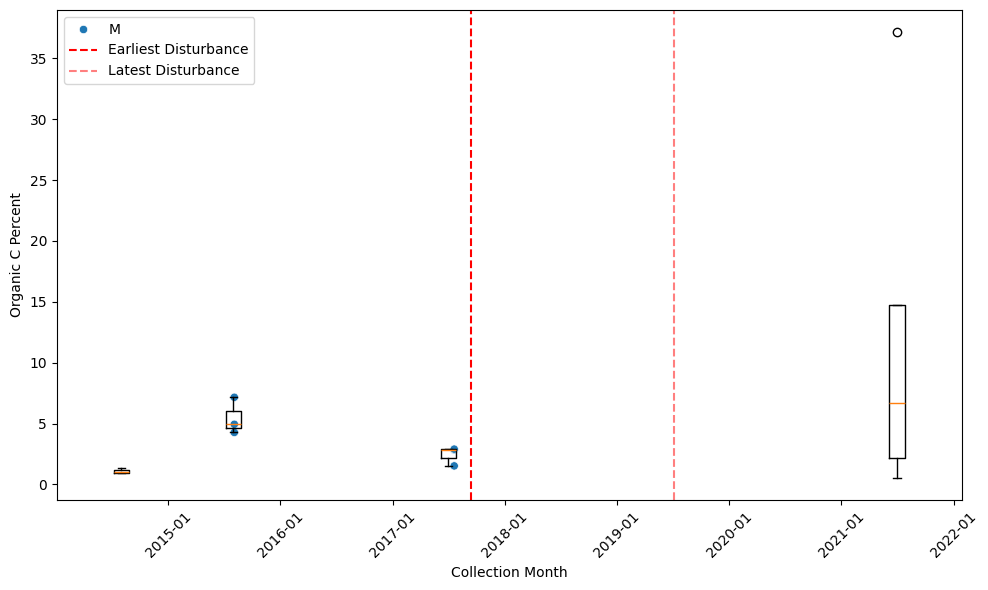


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     2.15
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_047


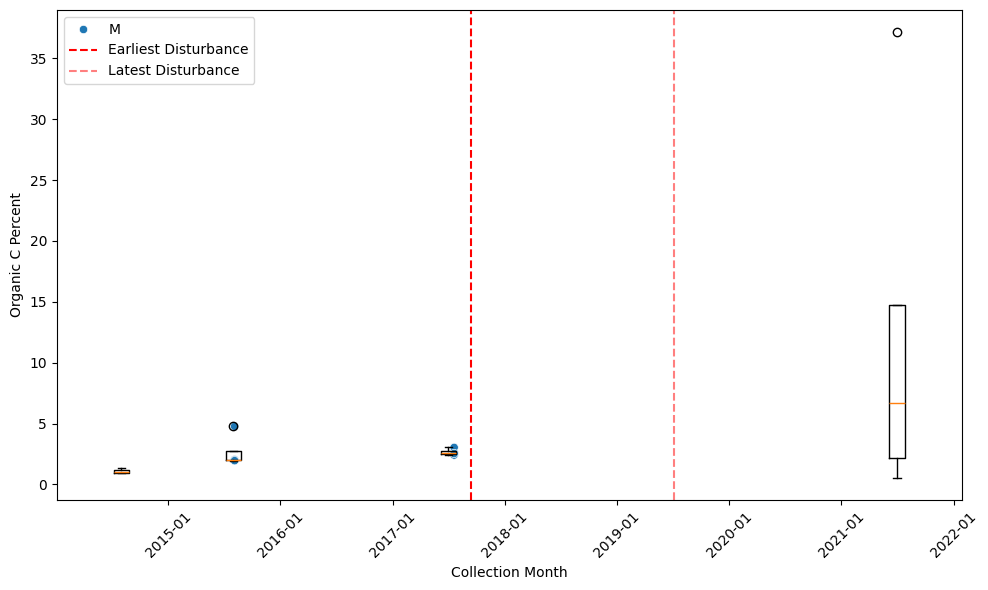


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     2.77
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SCBI_008


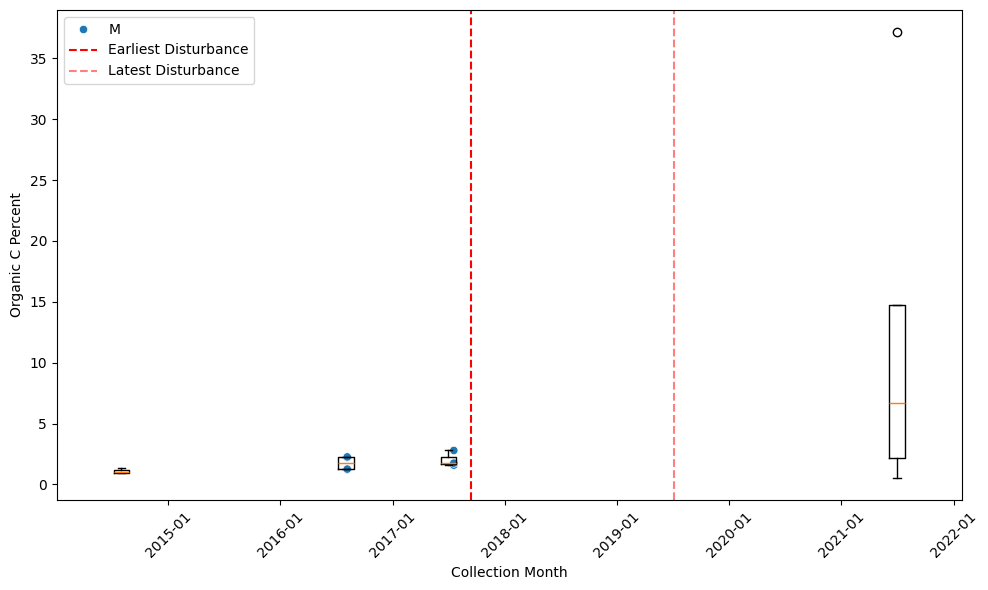


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     2.016667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_007


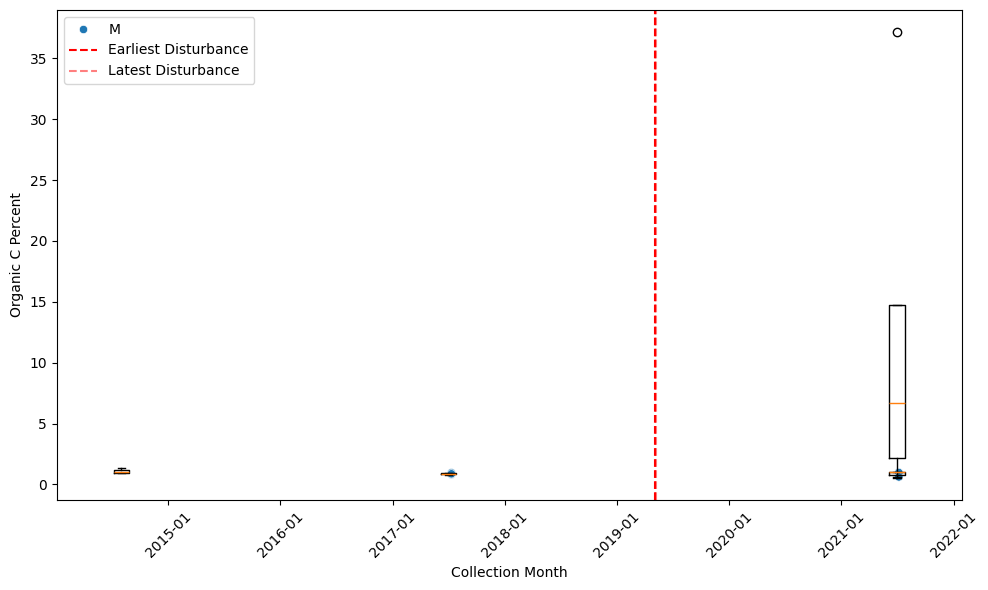


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     0.856667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_001


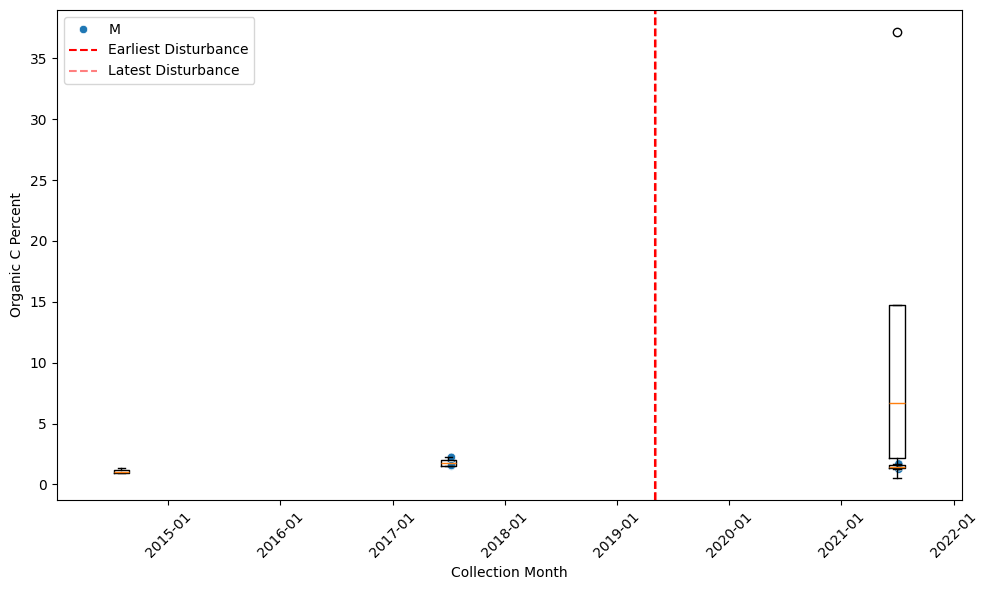


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.453333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_004


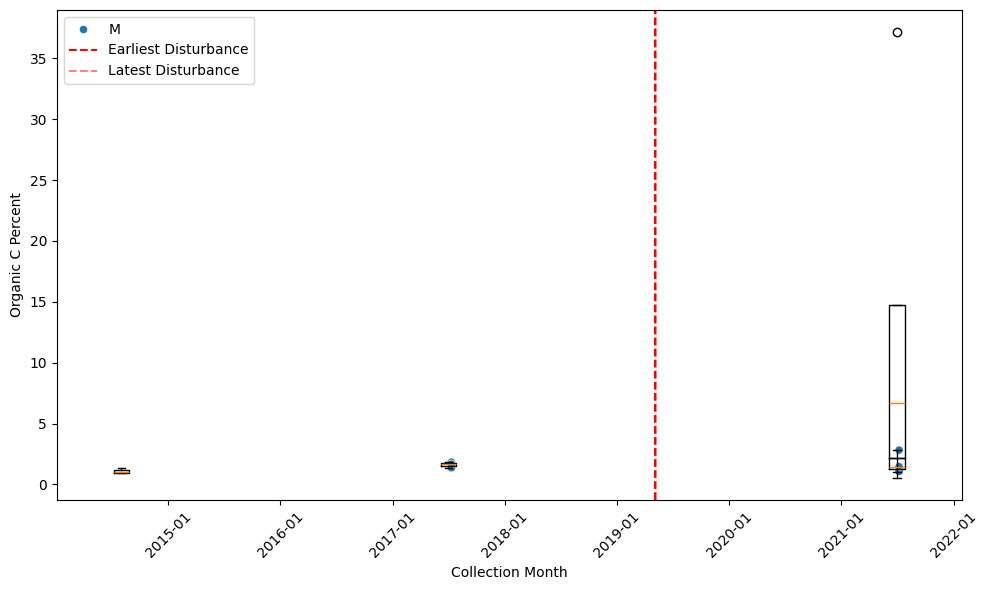


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     1.78
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_045


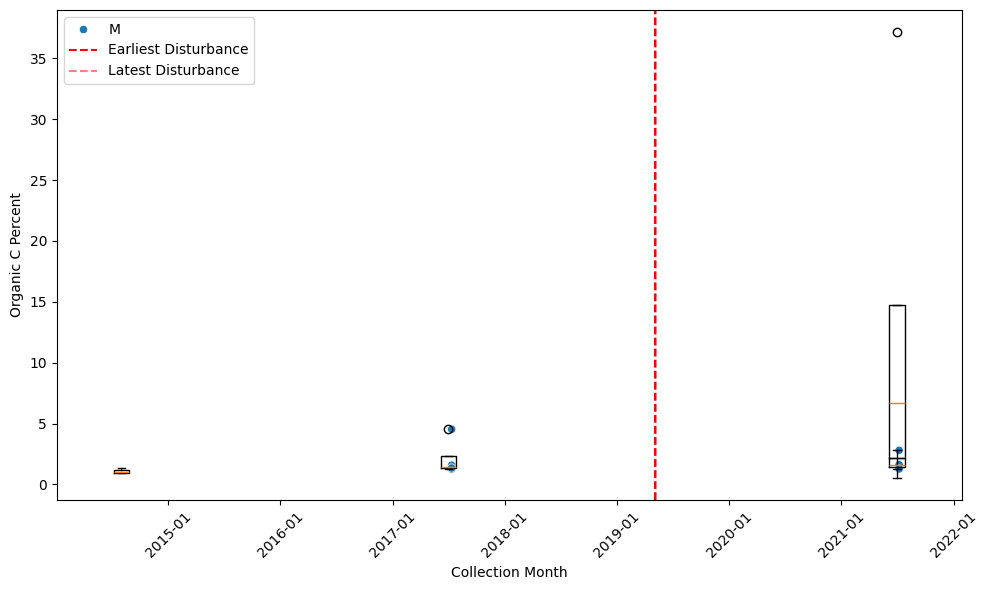


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.896667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_049


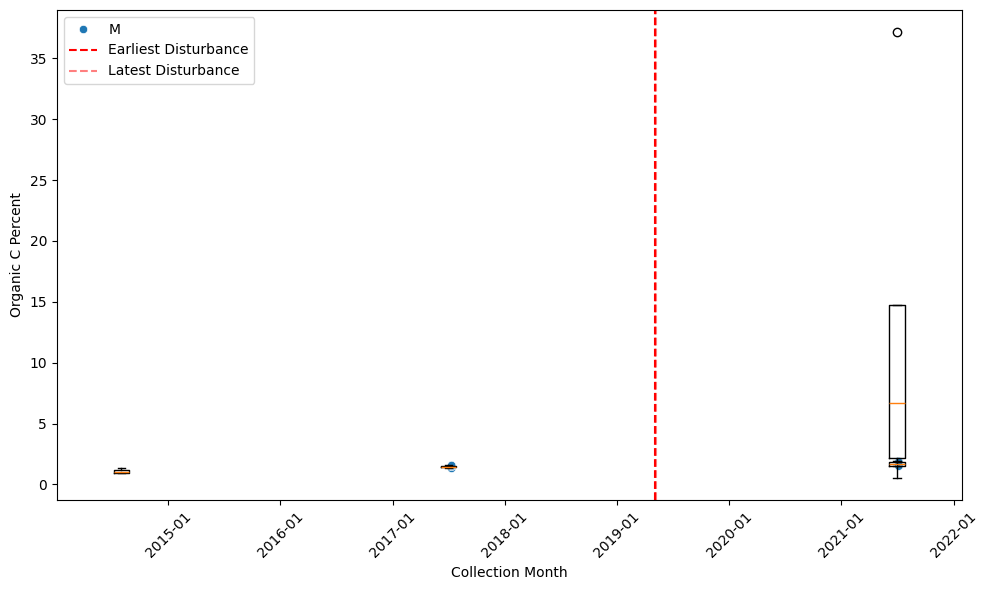


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     1.69
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_047


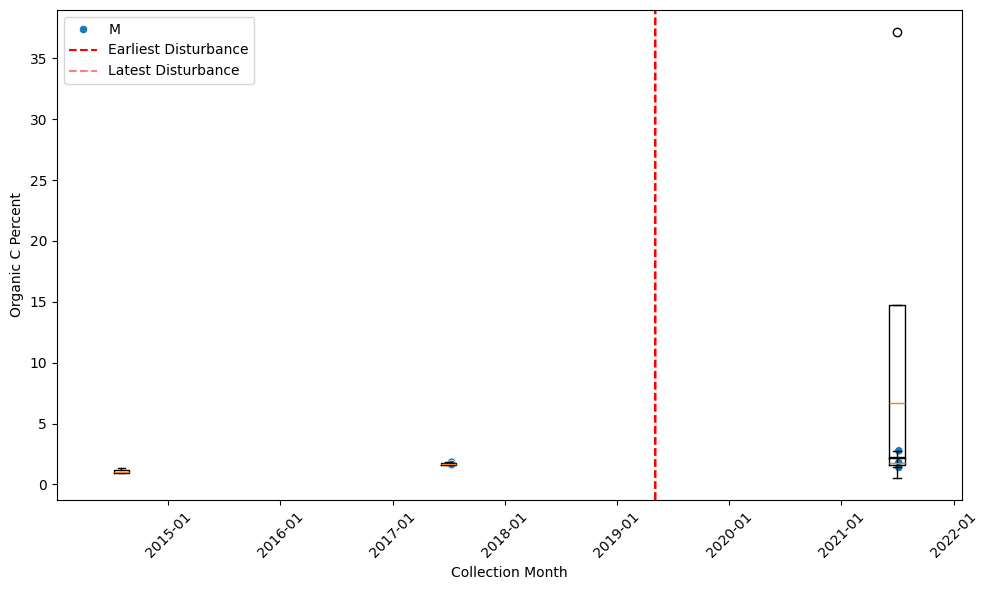


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.976667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_044


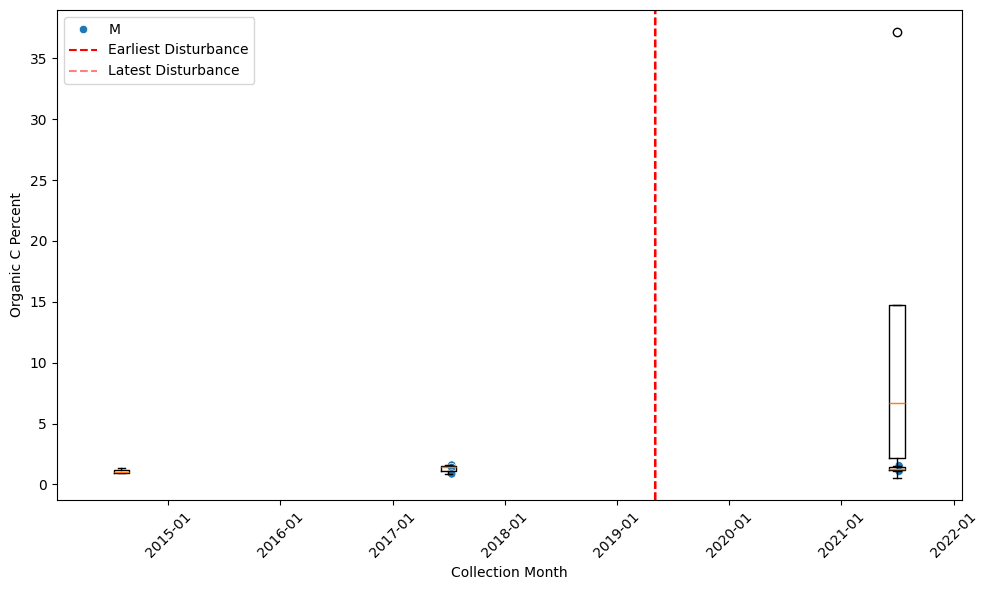


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     1.29
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_005


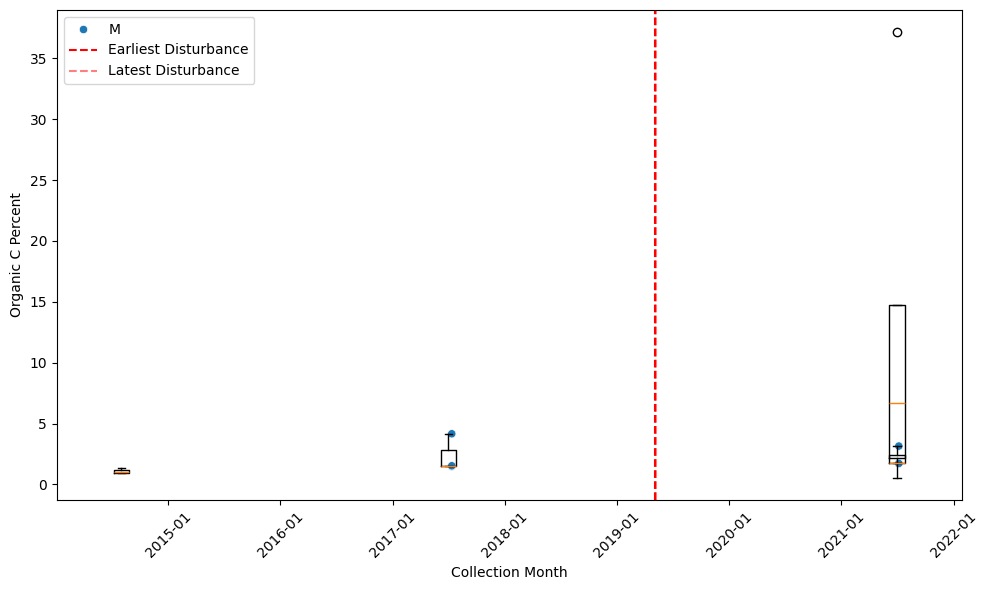


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     2.203333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_003


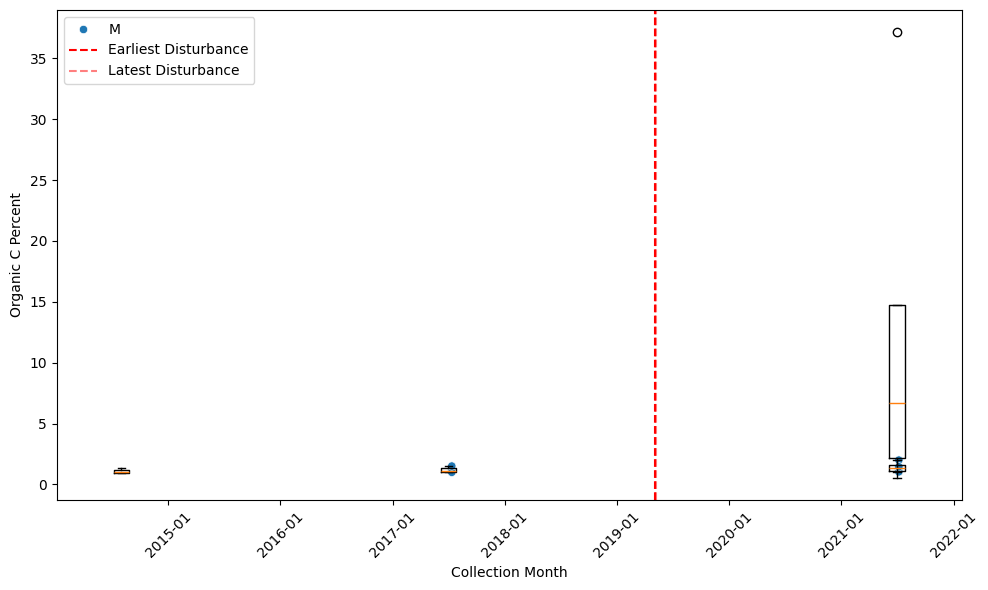


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3     1.415
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
SERC_002


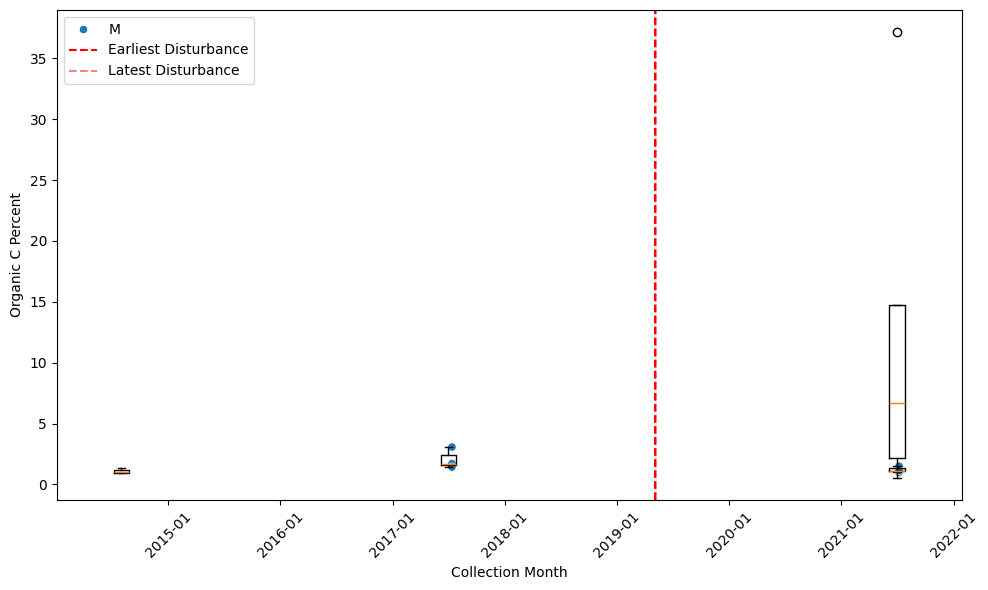


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.213333
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_008


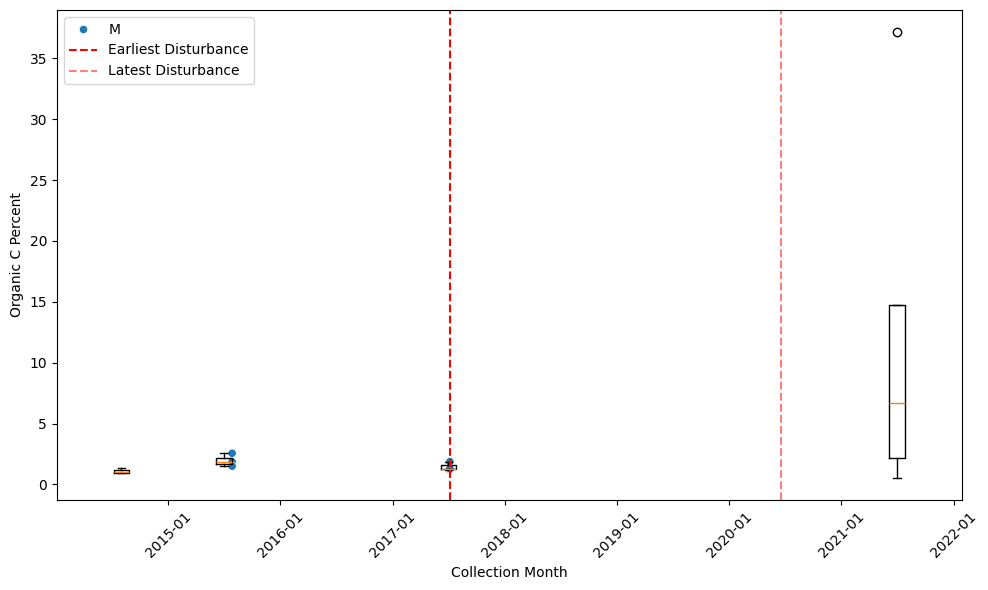


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     3.68
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_004


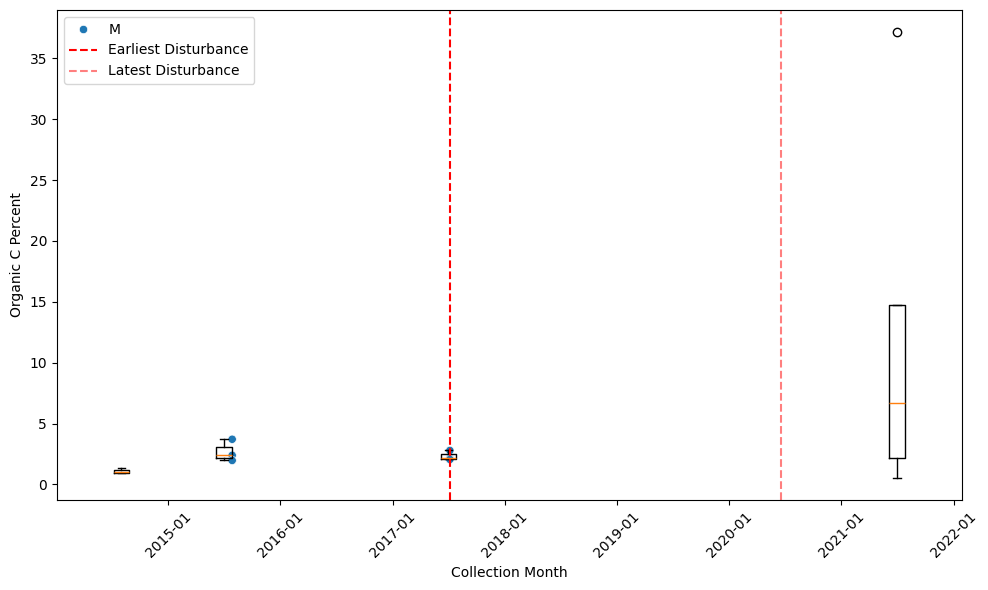


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     3.406667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_002


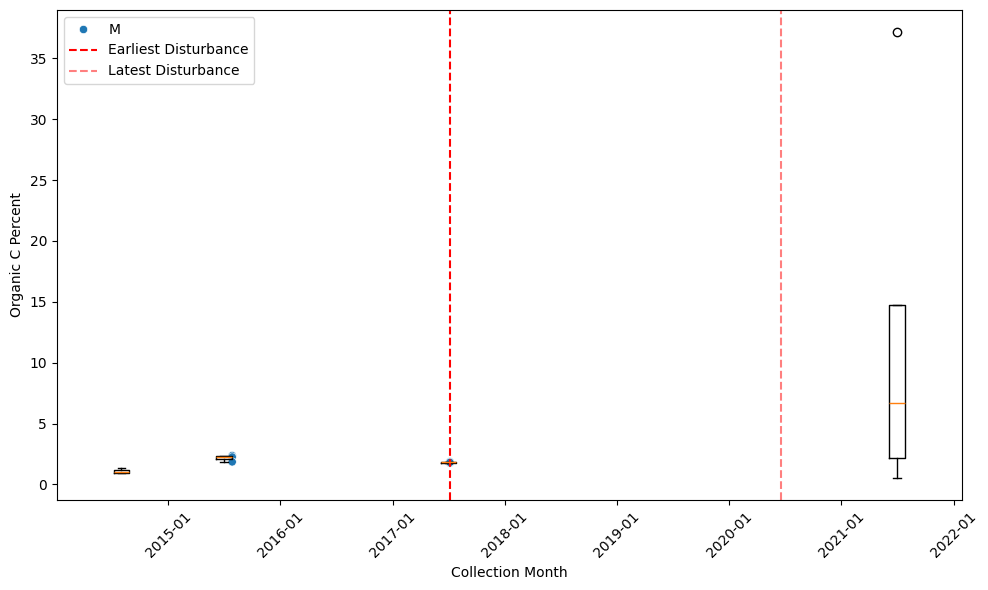


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     1.866667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_001


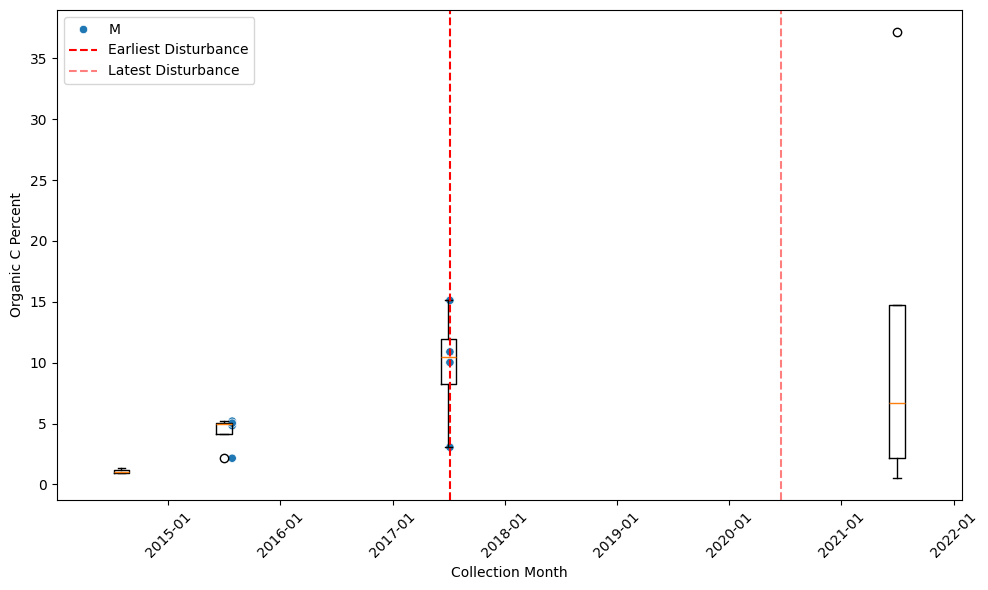


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     4.866667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_003


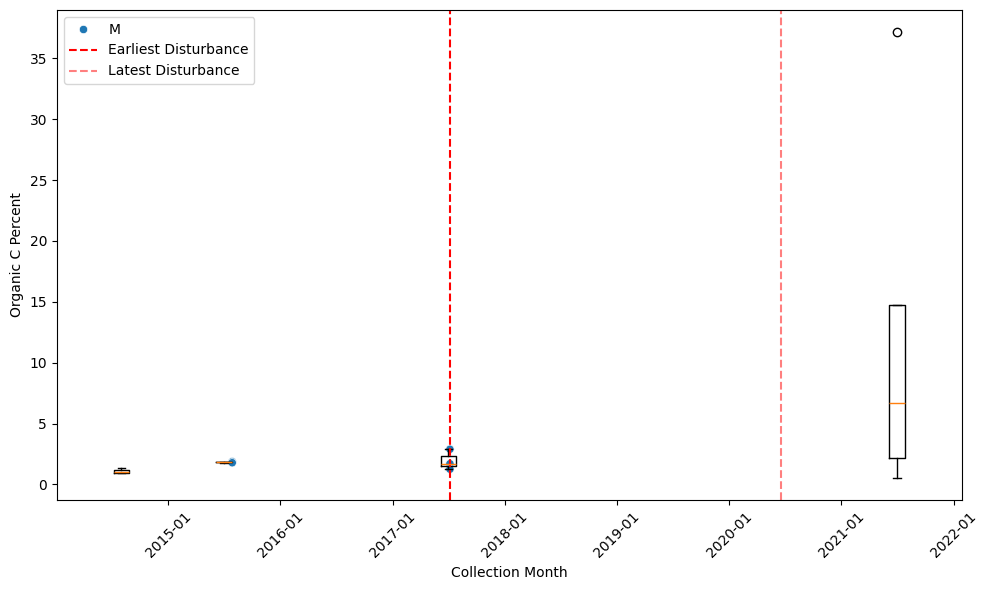


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     2.44
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_047


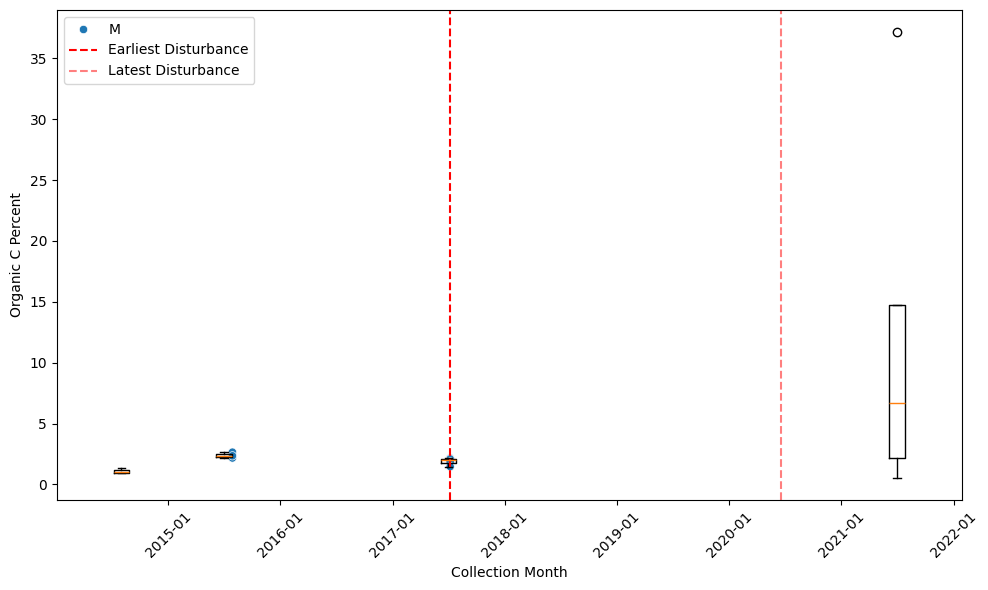


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3     2.846667
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_053


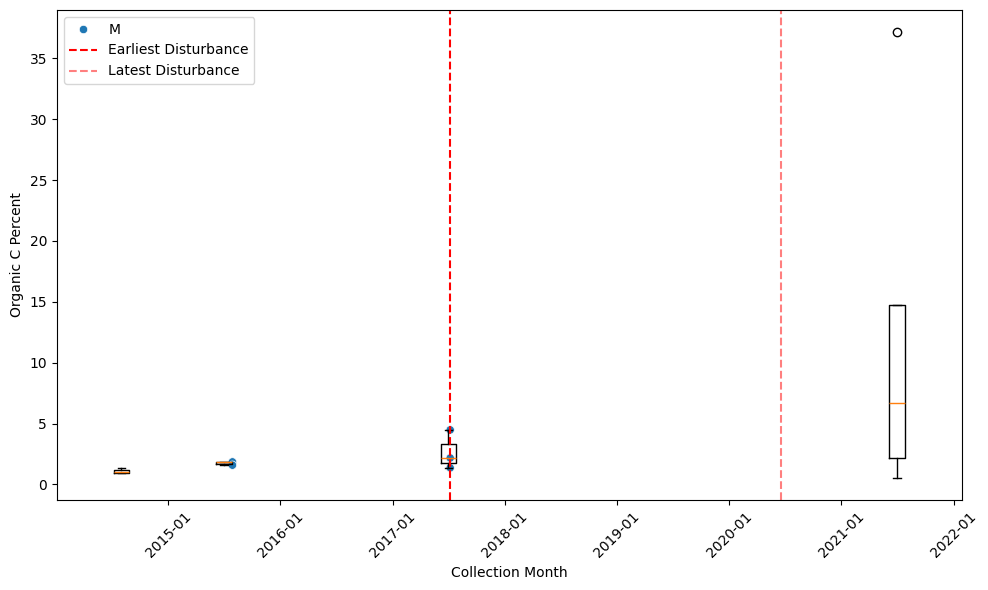


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3     3.85
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_060


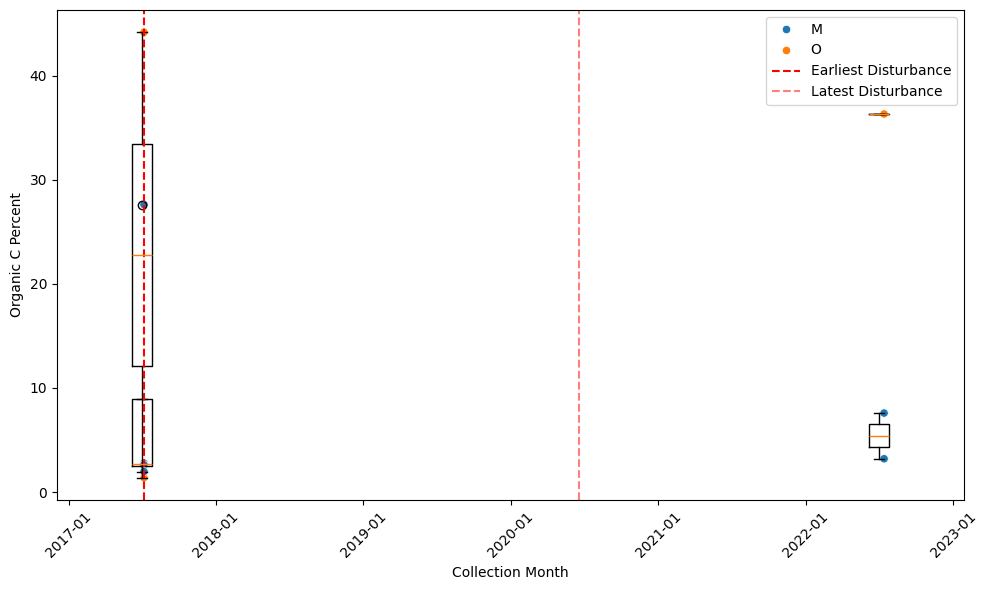


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3     5.395
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1       NaN
2       NaN
3     36.31
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
STEI_059


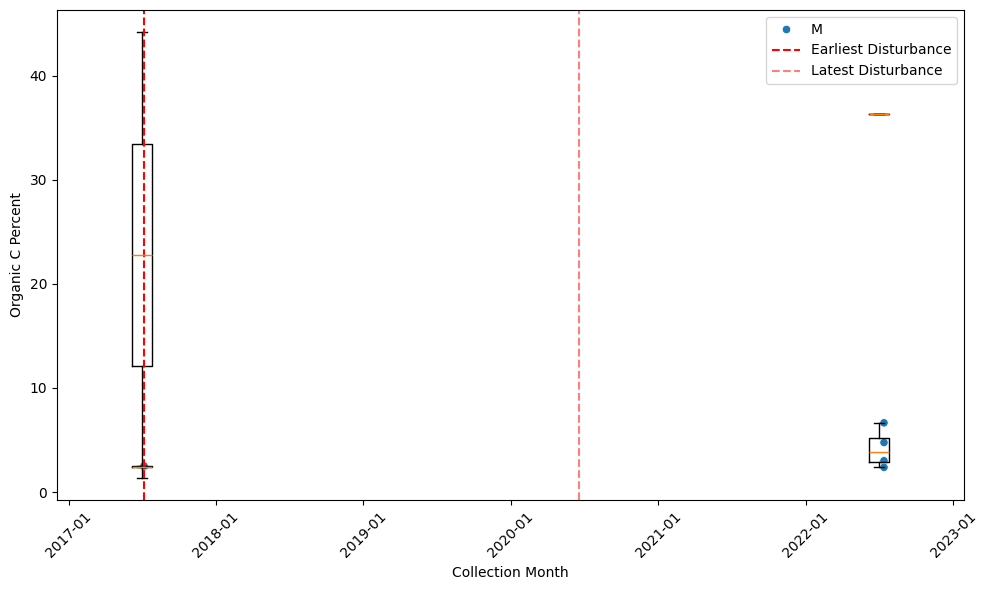


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     NaN
2     NaN
3     4.2
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
STEI_021


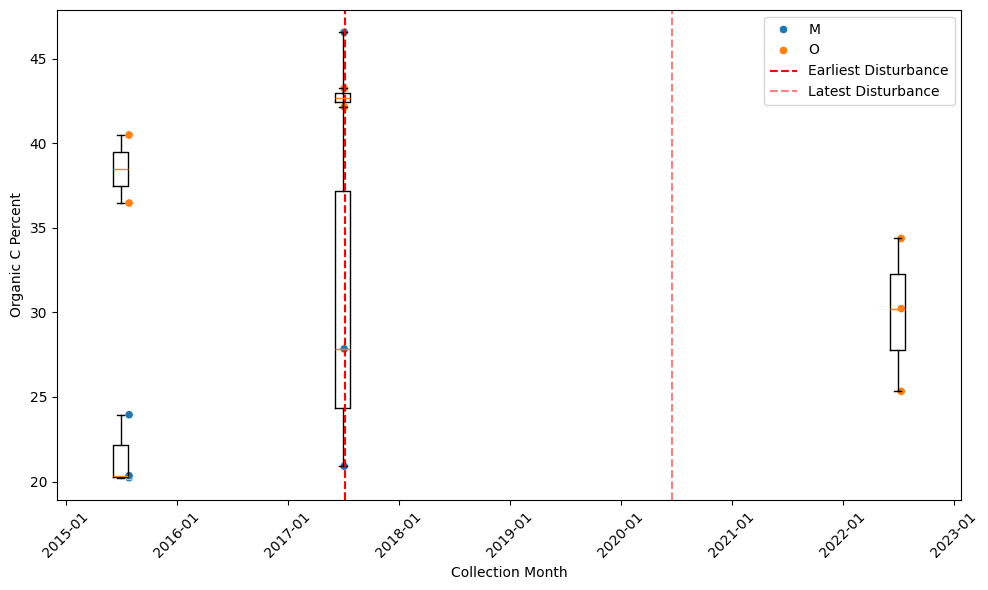


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     29.973333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
TREE_014


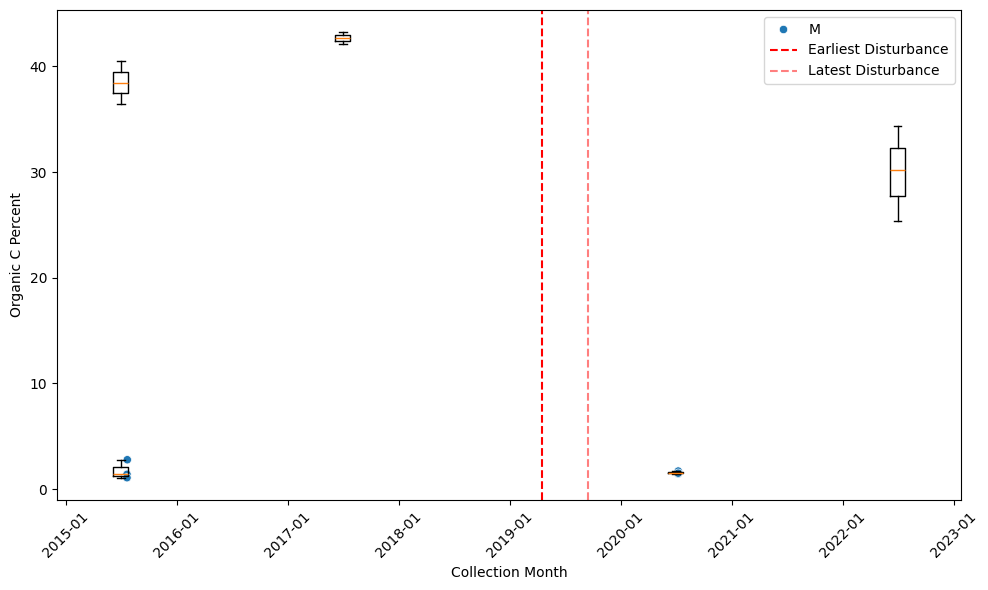


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.556667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_046


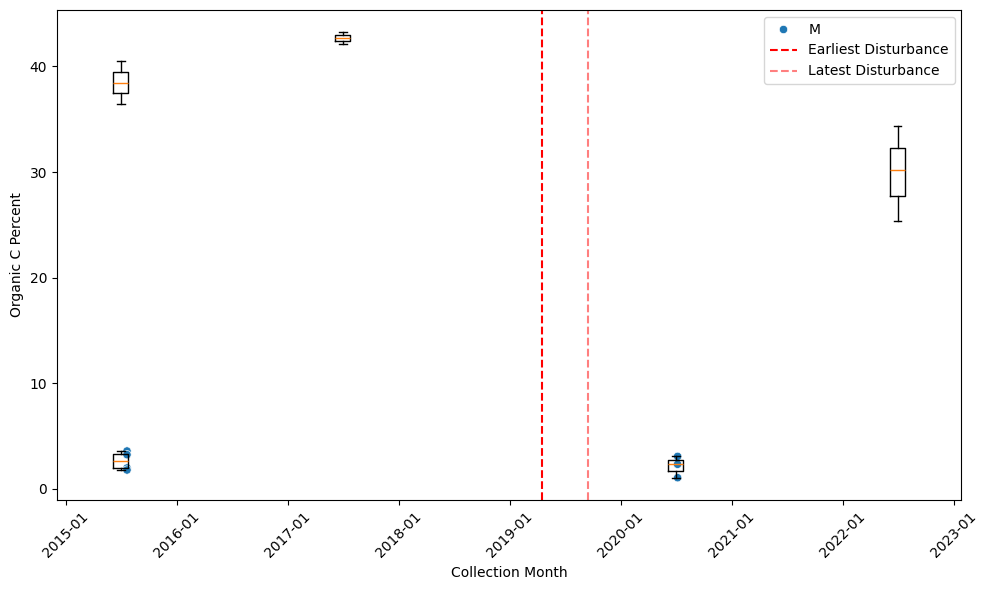


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.156667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_049


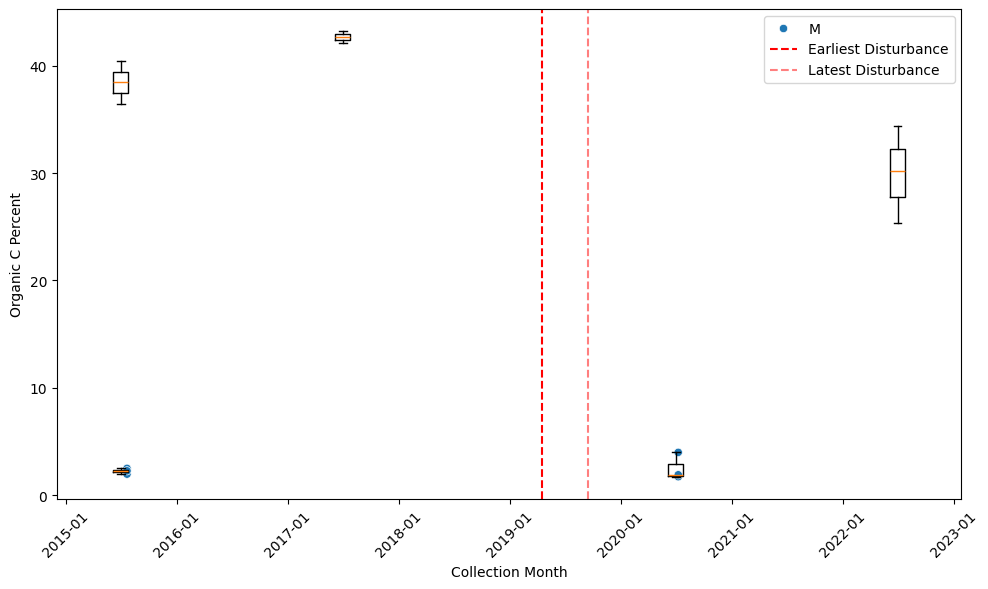


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.526667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_050


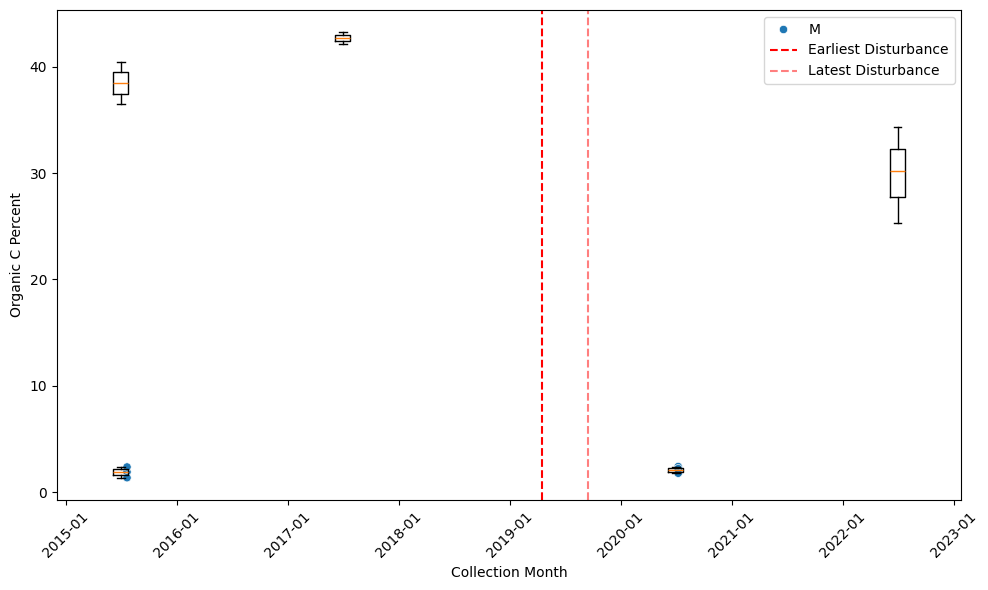


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.09
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_041


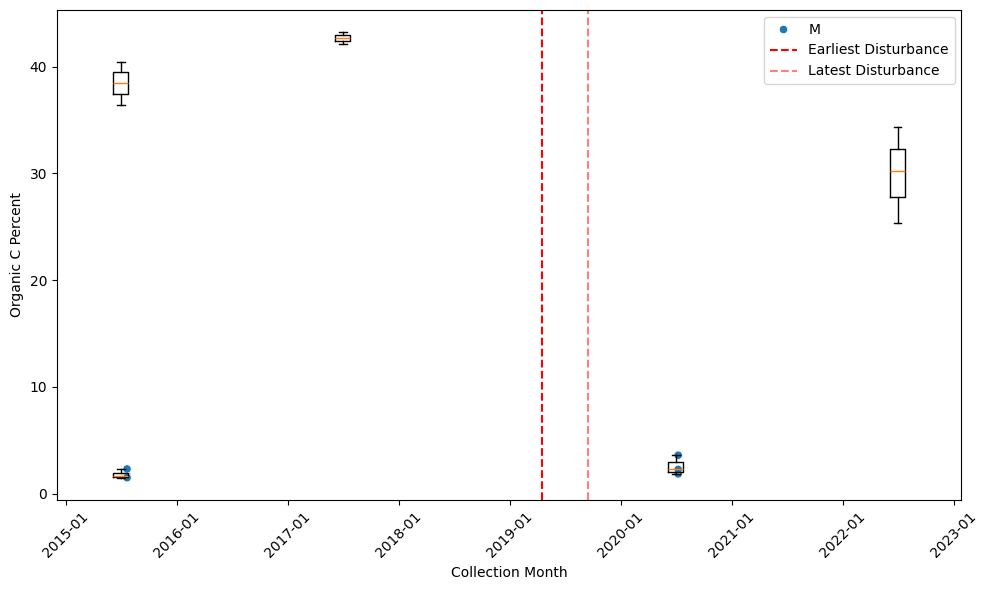


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.563333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_003


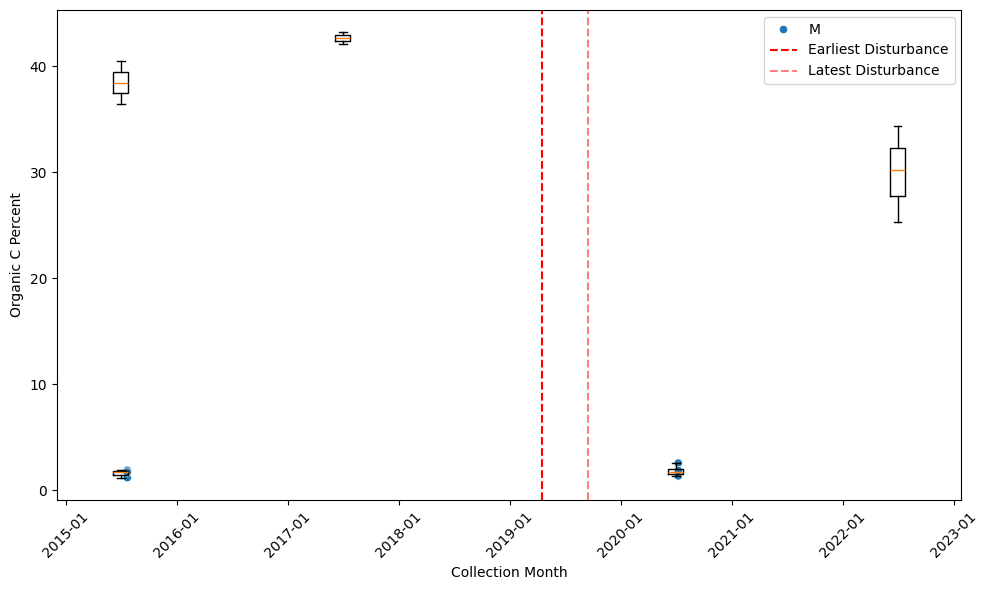


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.8575
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_001


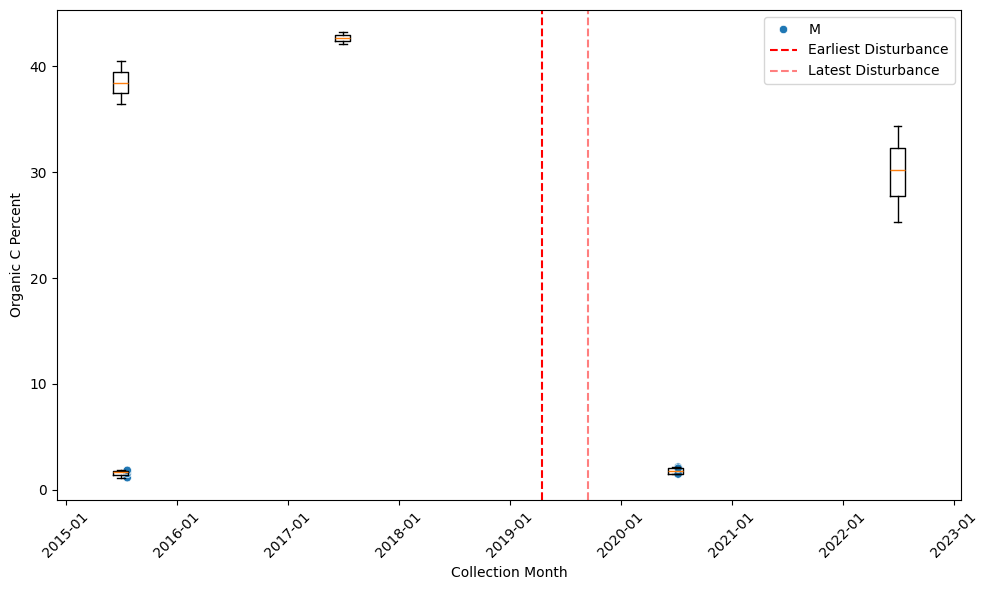


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     1.8
2     NaN
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
TREE_002


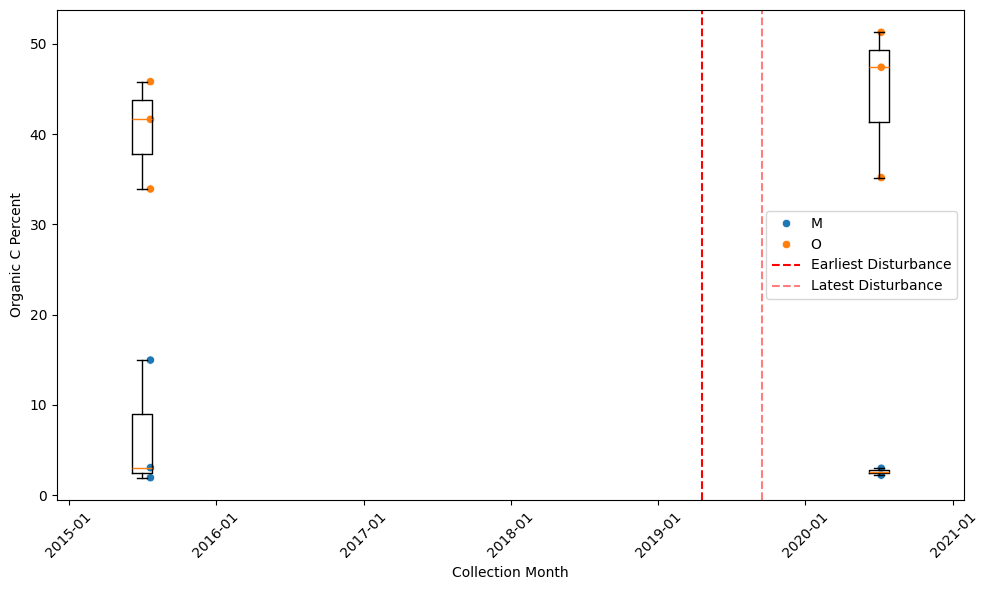


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.595
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1     44.613333
2           NaN
3           NaN
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
TREE_006


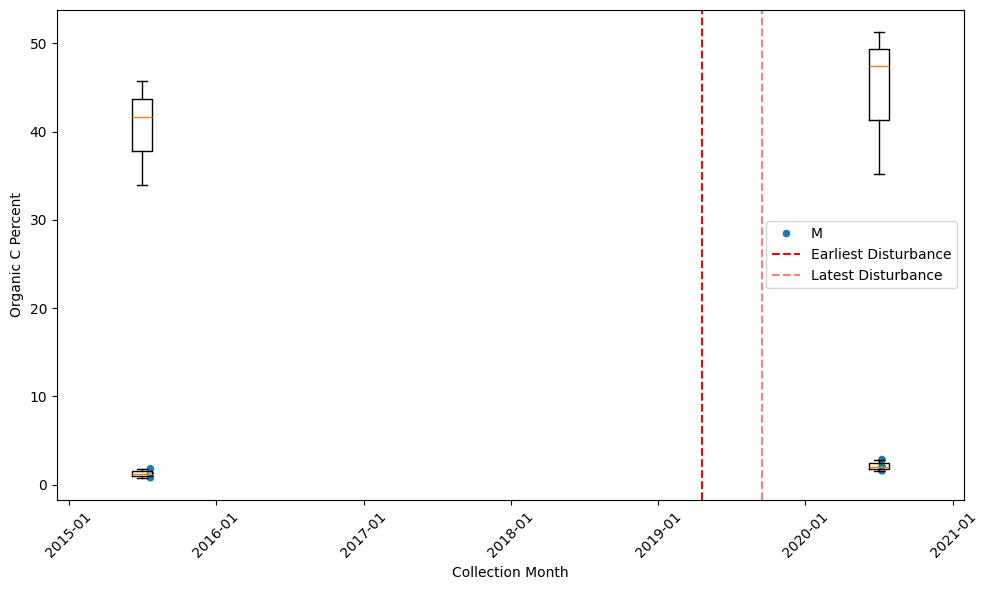


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.156667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_044


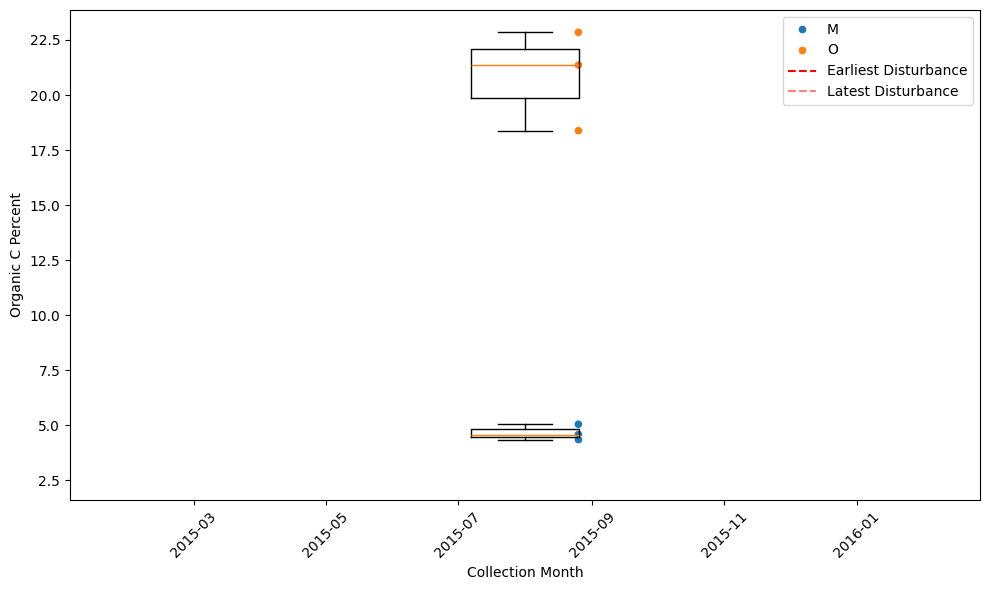


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     3.893333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_031


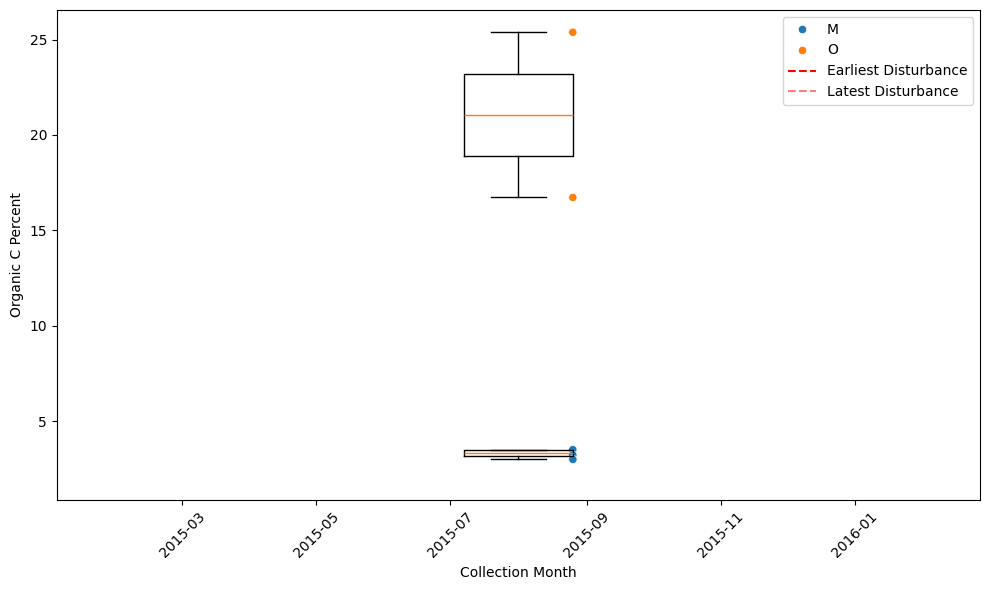


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     3.123333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_043


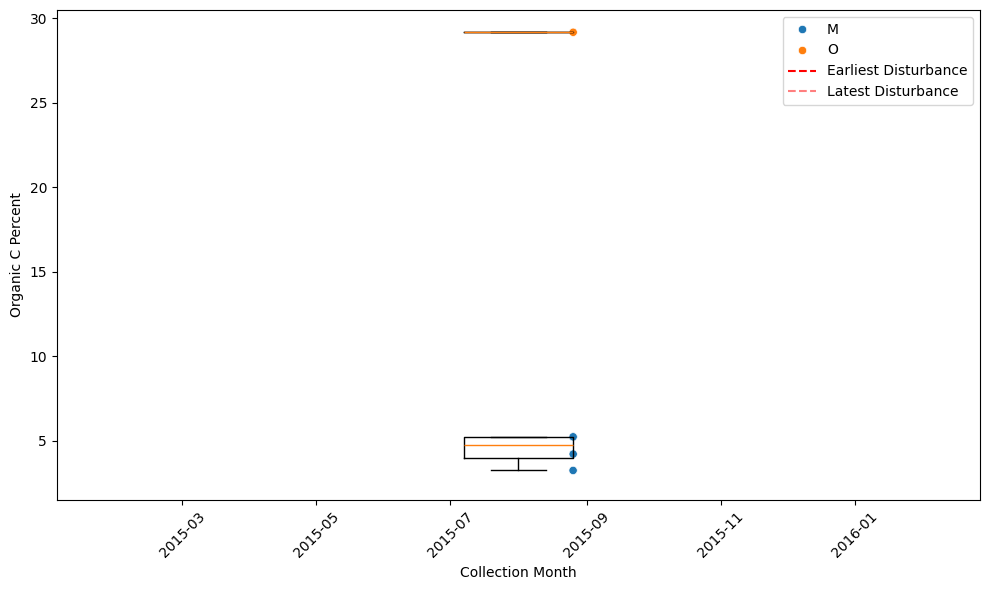


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4      NaN
5     4.33
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_001


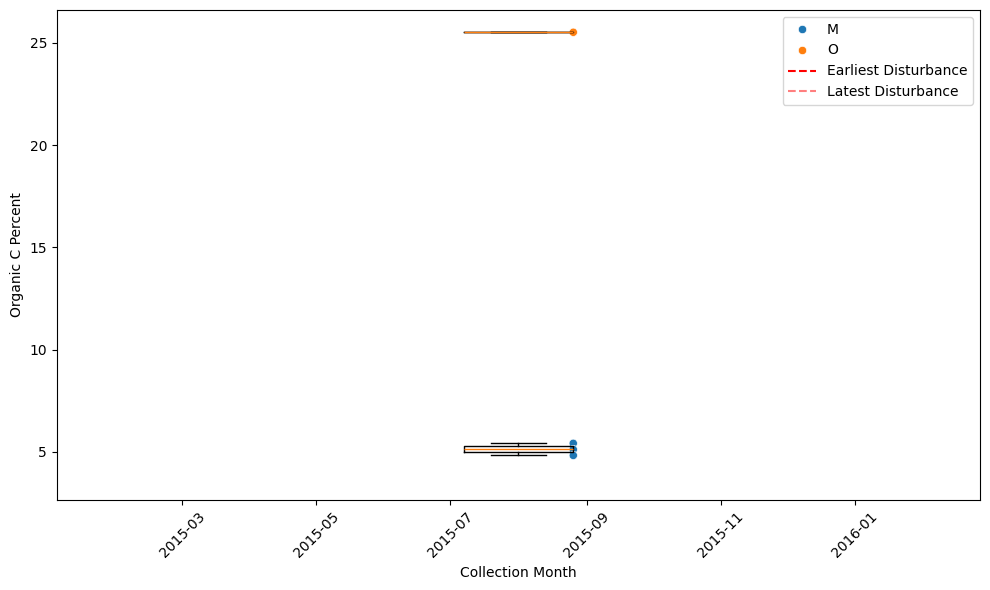


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1        NaN
2        NaN
3        NaN
4        NaN
5     6.2575
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_002


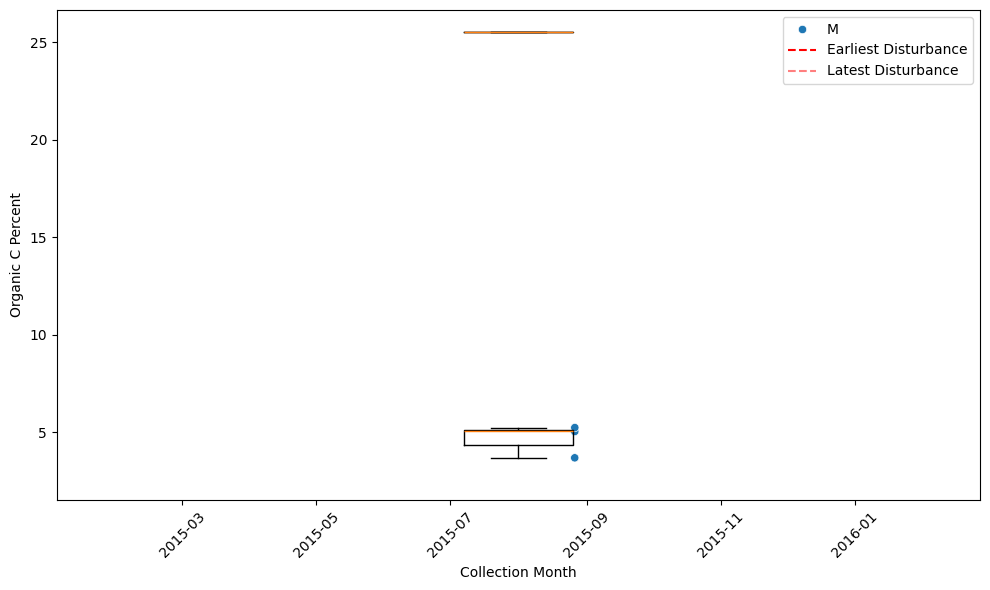


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     4.856667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_009


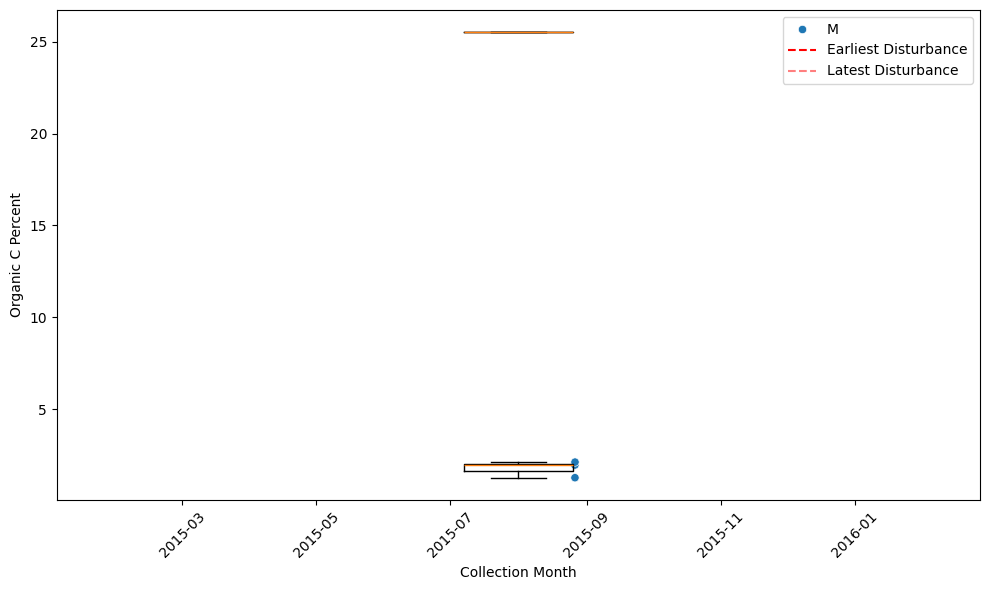


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     1.823333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_004


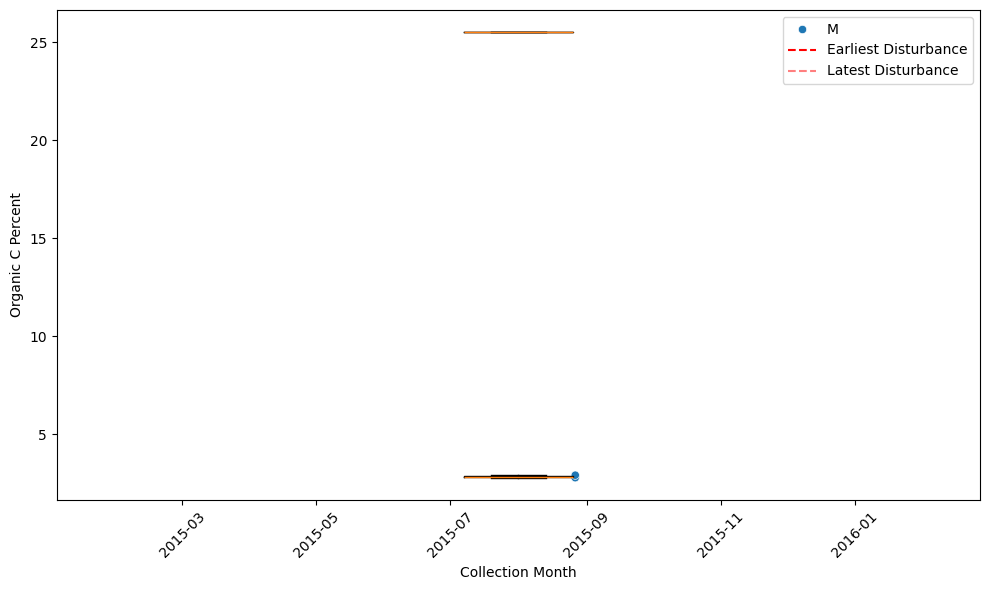


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     3.256667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_032


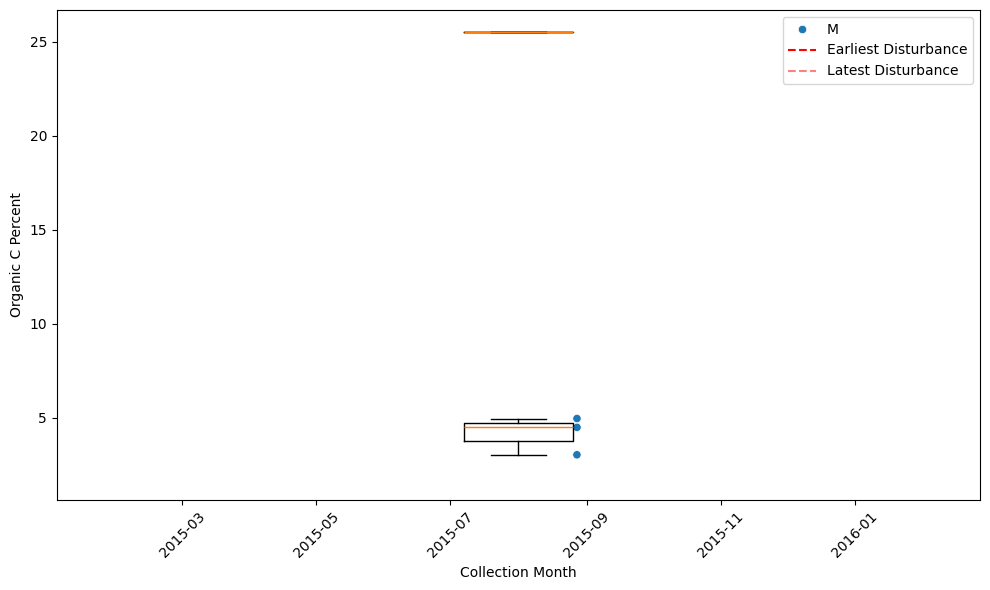


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2      NaN
3      NaN
4      NaN
5     3.62
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_005


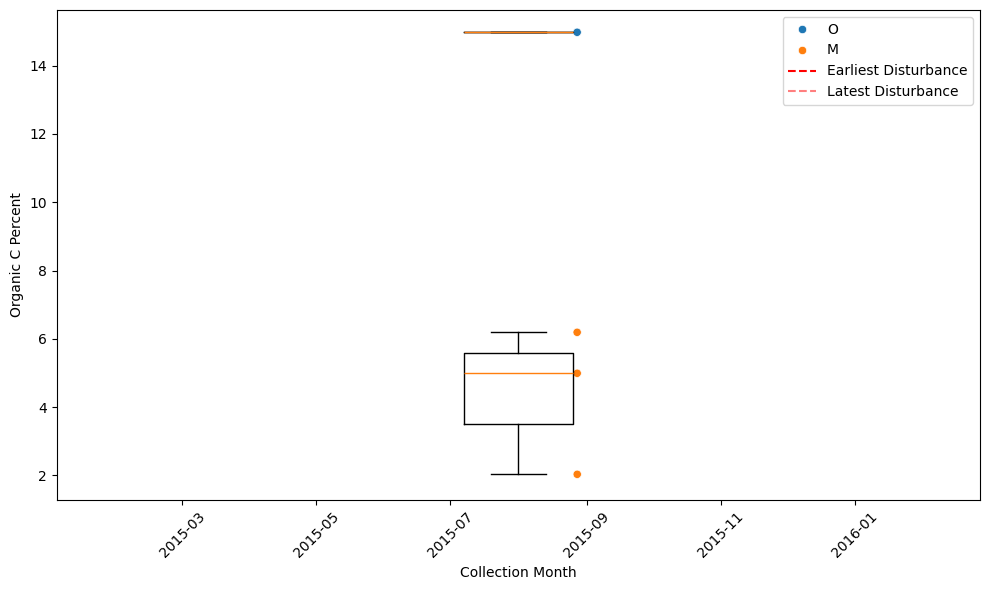


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     3.736667
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UKFS_003


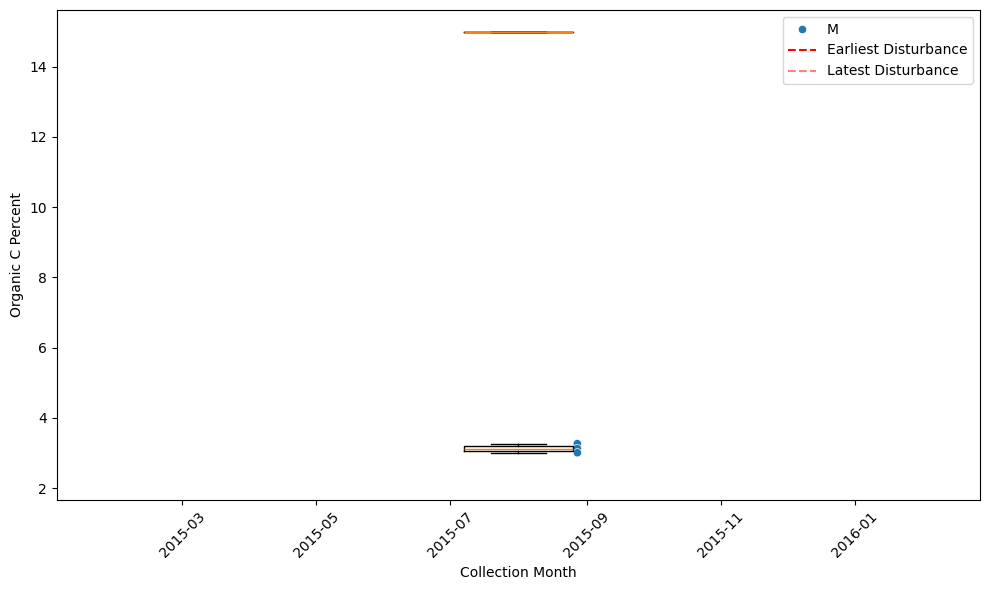


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2          NaN
3          NaN
4          NaN
5     2.773333
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UNDE_006


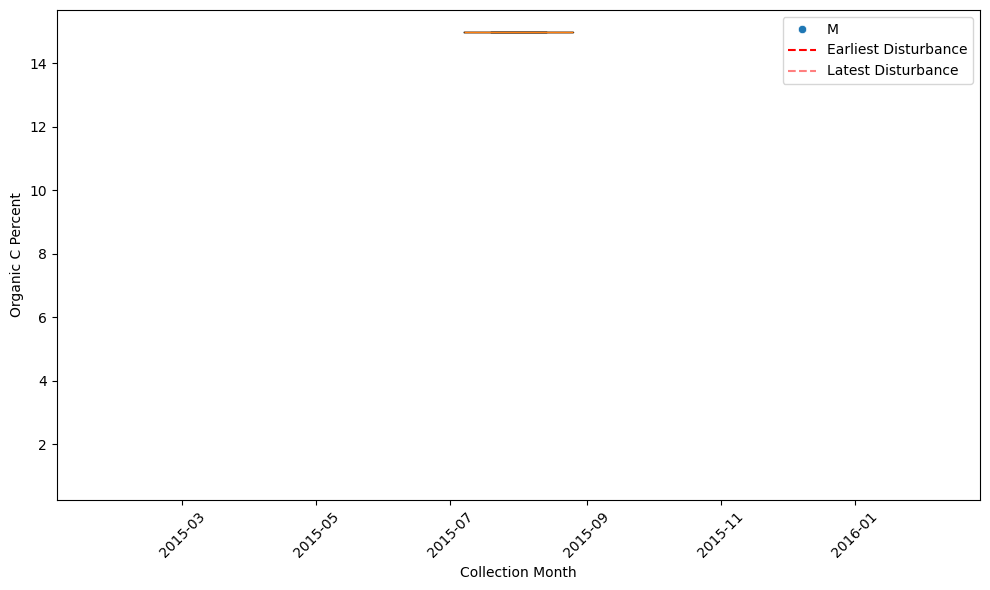


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.226667
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UNDE_008


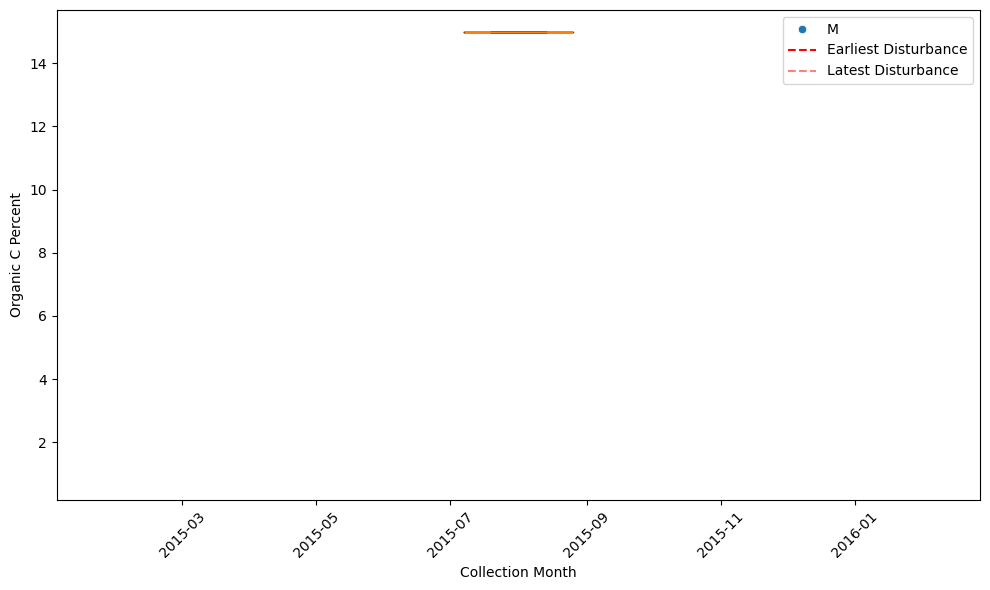


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.79
2      NaN
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UNDE_001


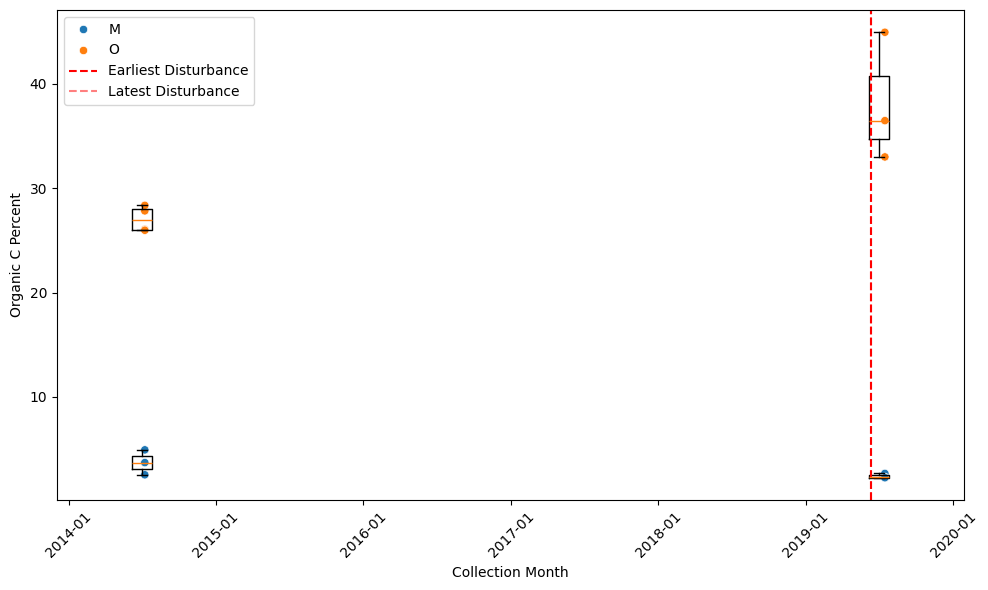


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.4
2     NaN
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1     38.143333
2           NaN
3           NaN
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
UNDE_043


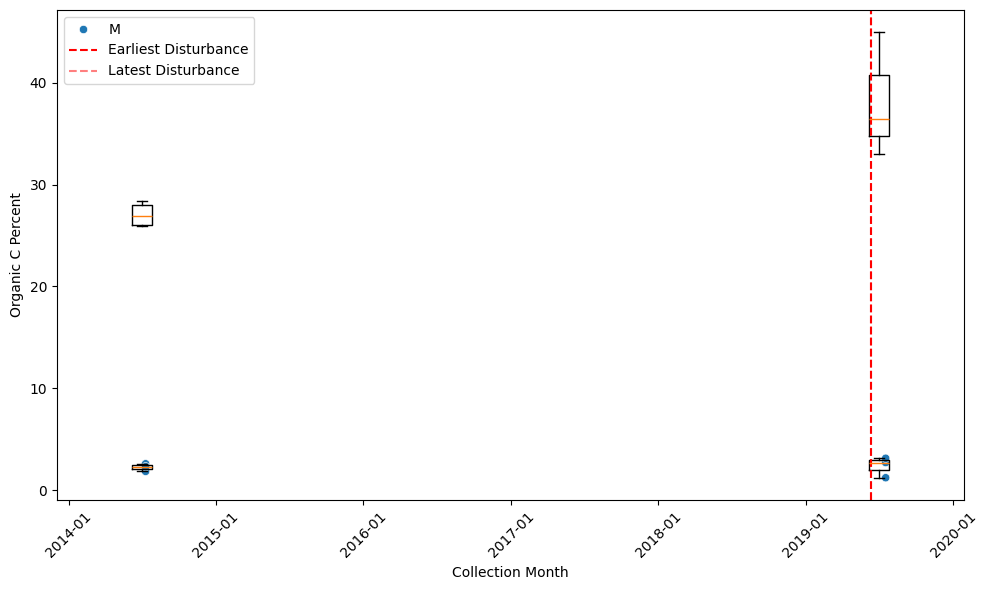


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     2.353333
2          NaN
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
UNDE_037


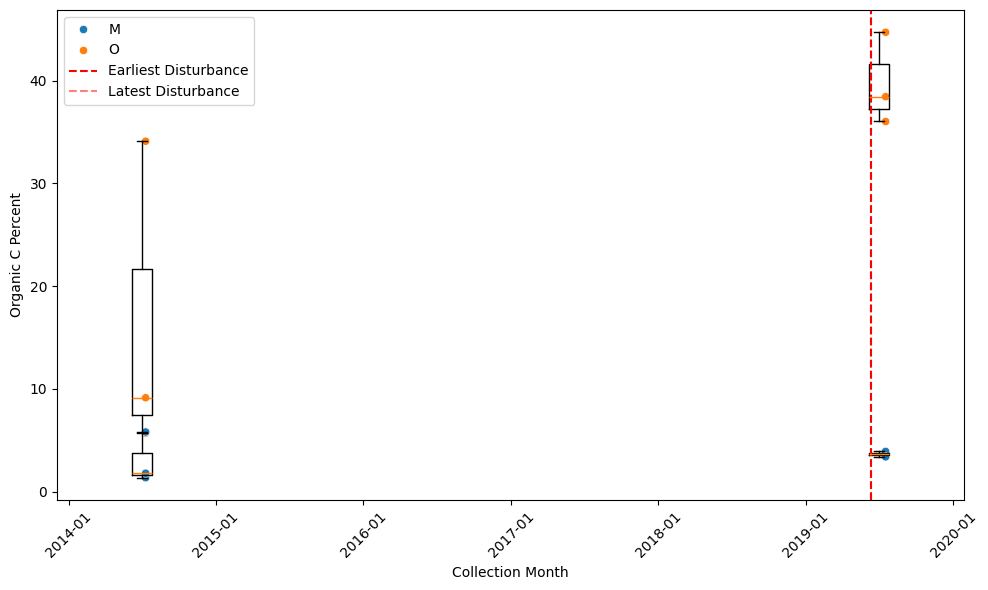


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     3.655
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1     39.716667
2           NaN
3           NaN
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
15          NaN
16          NaN
17          NaN
18          NaN
19          NaN
20          NaN
Name: organicCPercent, dtype: float64
UNDE_044


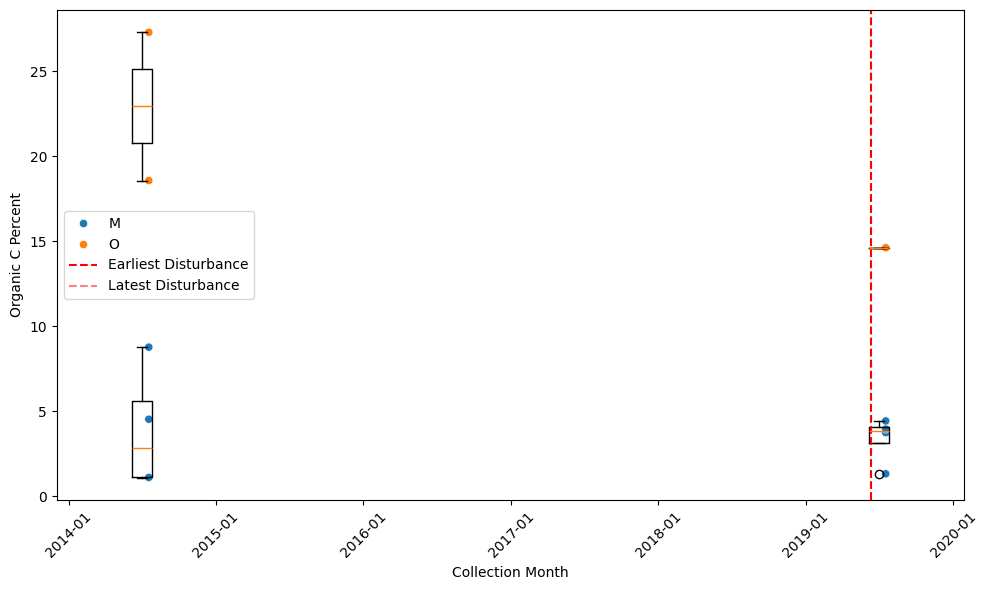


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     3.3525
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1     14.61
2       NaN
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64
YELL_012


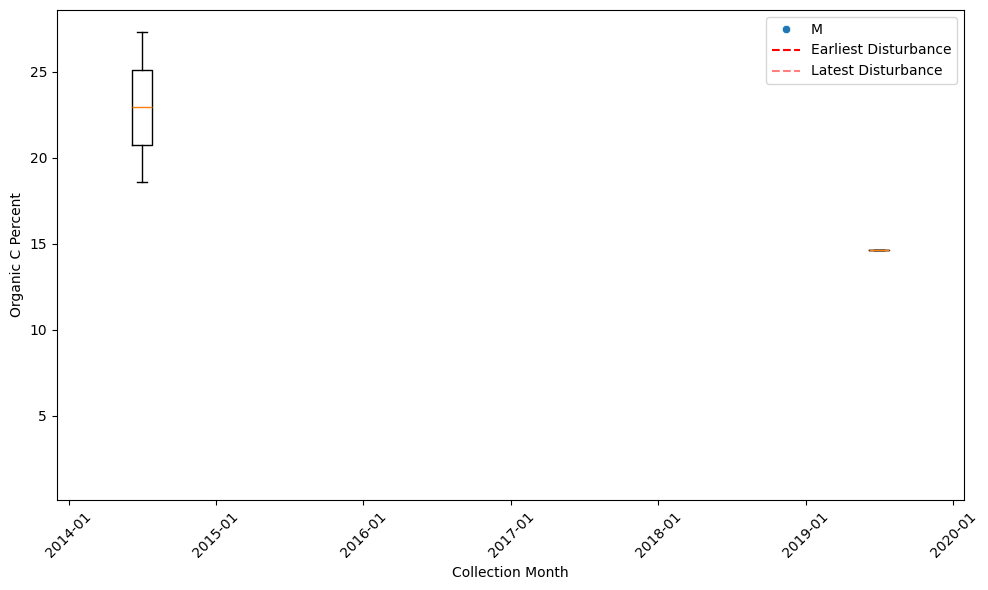


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1       NaN
2     1.925
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_009


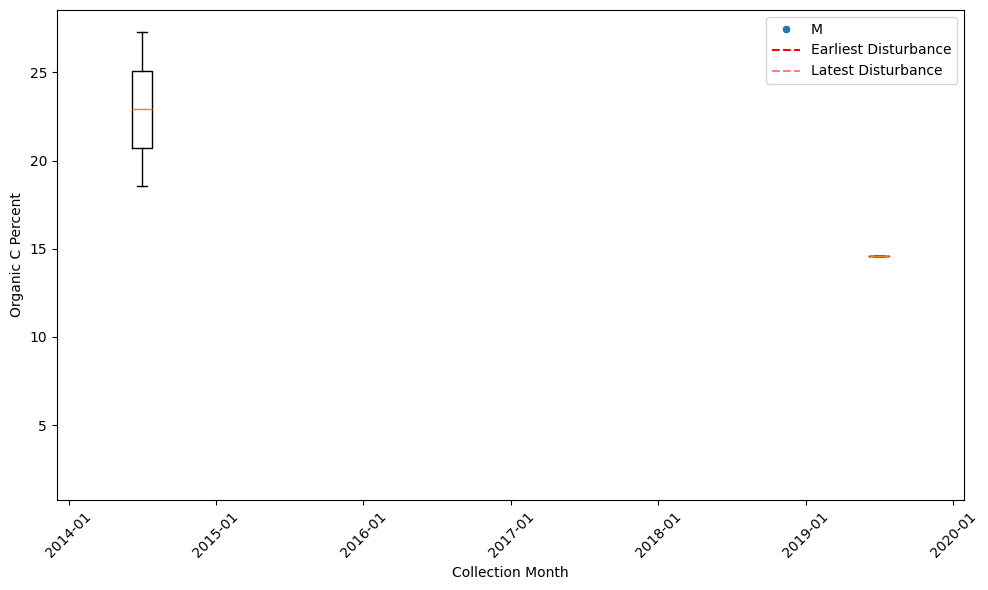


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2     4.44
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_003


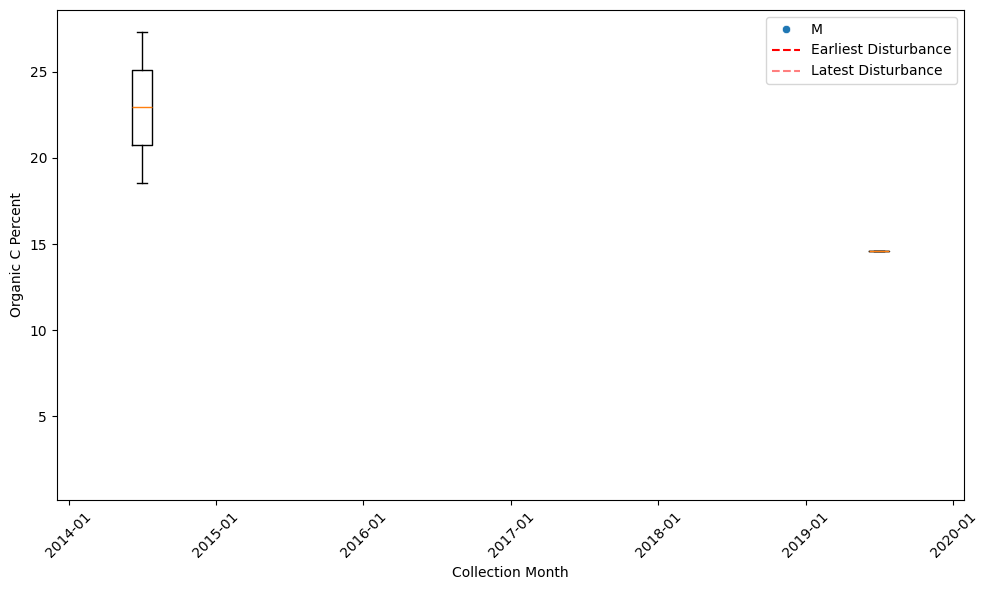


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2     4.95
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_048


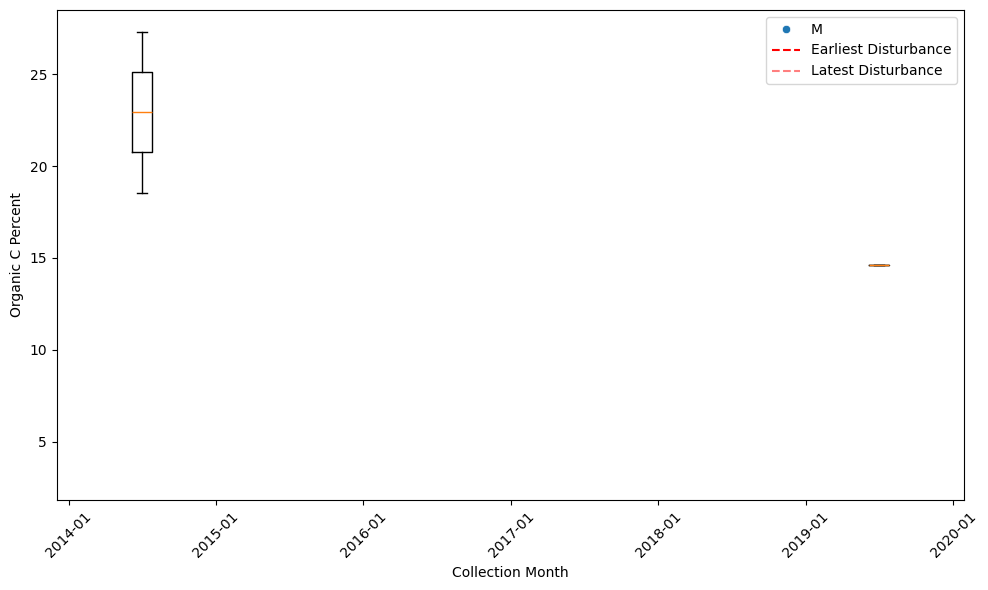


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1       NaN
2     4.475
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_046


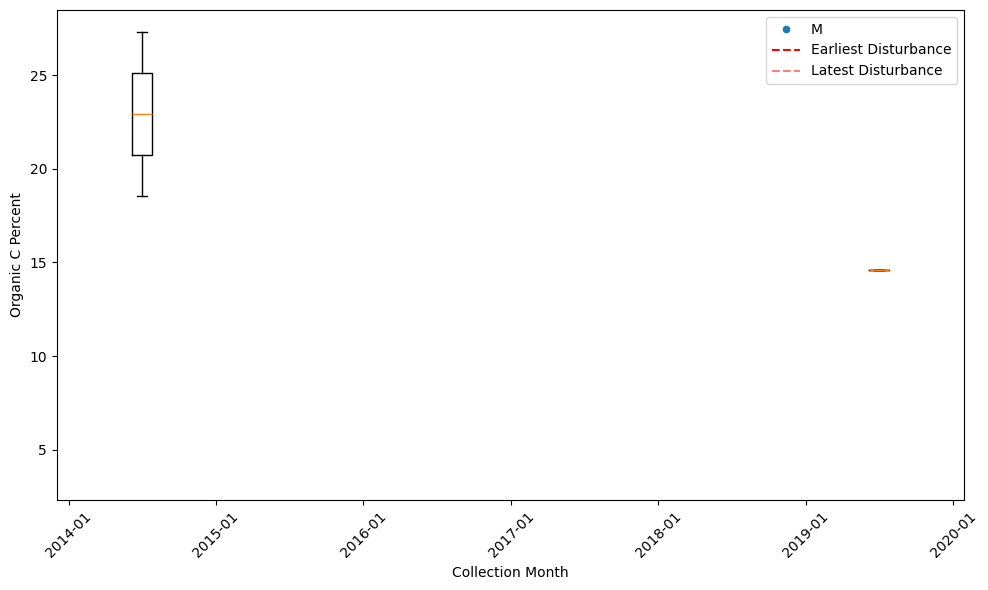


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2     5.83
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_051


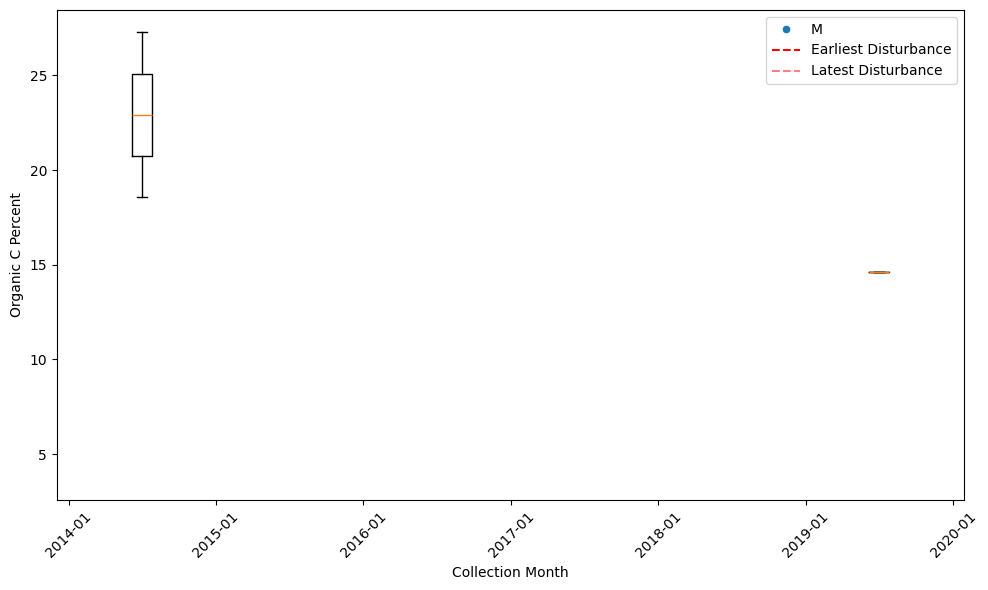


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2     9.07
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_052


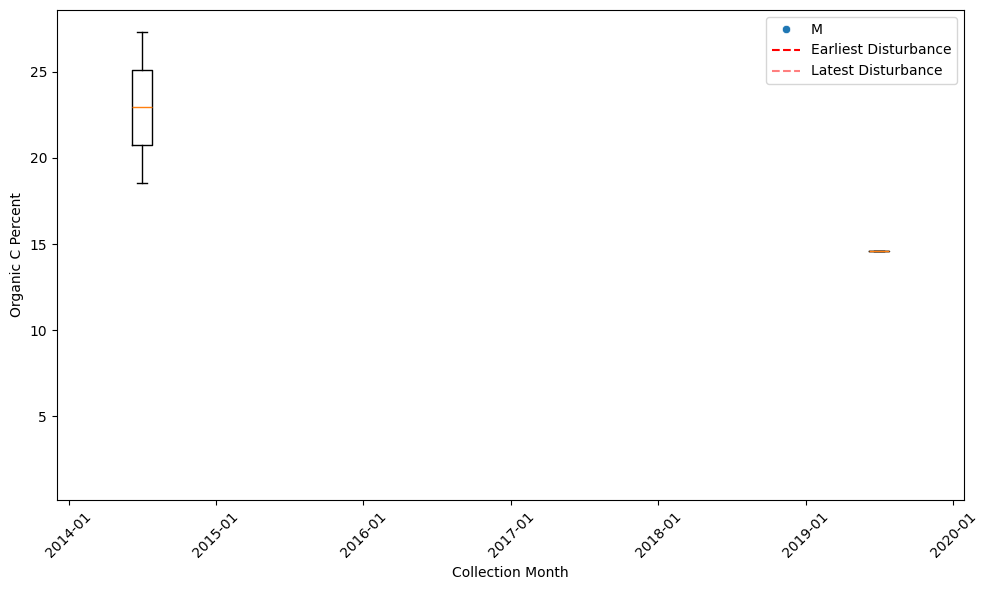


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1       NaN
2     5.965
3       NaN
4       NaN
5       NaN
6       NaN
7       NaN
8       NaN
9       NaN
10      NaN
11      NaN
12      NaN
13      NaN
14      NaN
15      NaN
16      NaN
17      NaN
18      NaN
19      NaN
20      NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_002


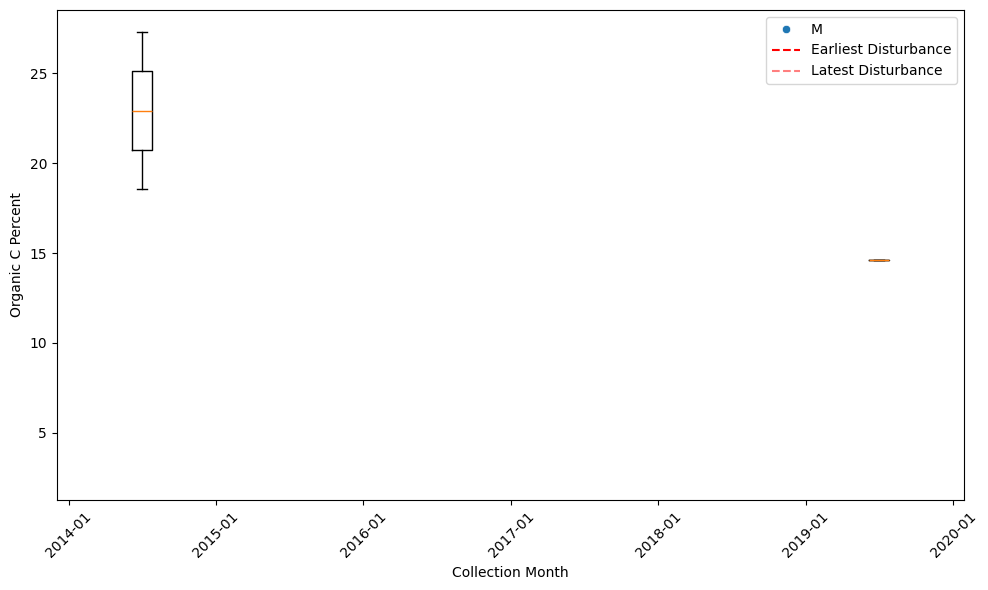


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1     NaN
2     5.4
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_005


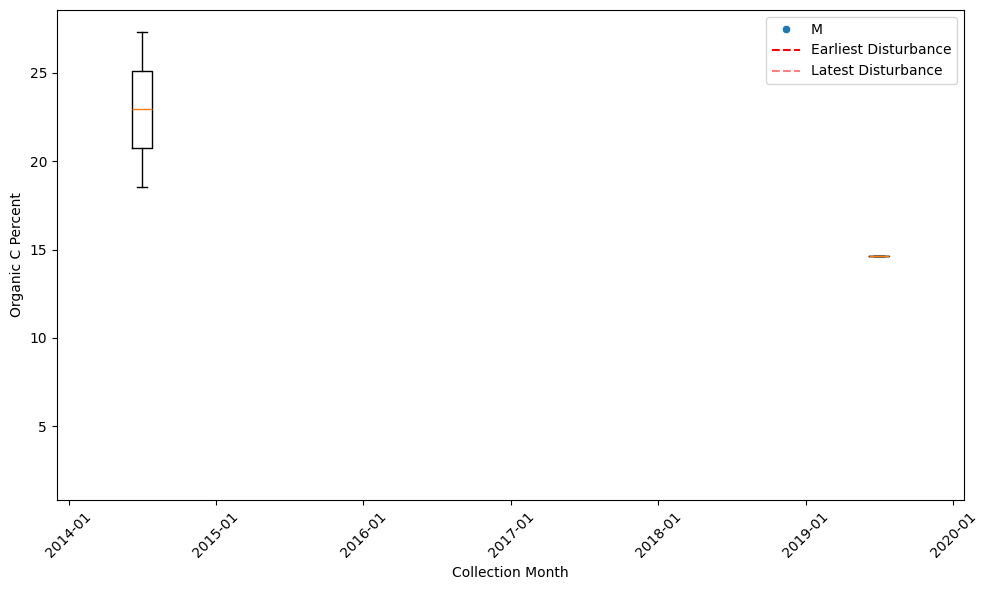


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1          NaN
2     3.783333
3          NaN
4          NaN
5          NaN
6          NaN
7          NaN
8          NaN
9          NaN
10         NaN
11         NaN
12         NaN
13         NaN
14         NaN
15         NaN
16         NaN
17         NaN
18         NaN
19         NaN
20         NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64
YELL_016


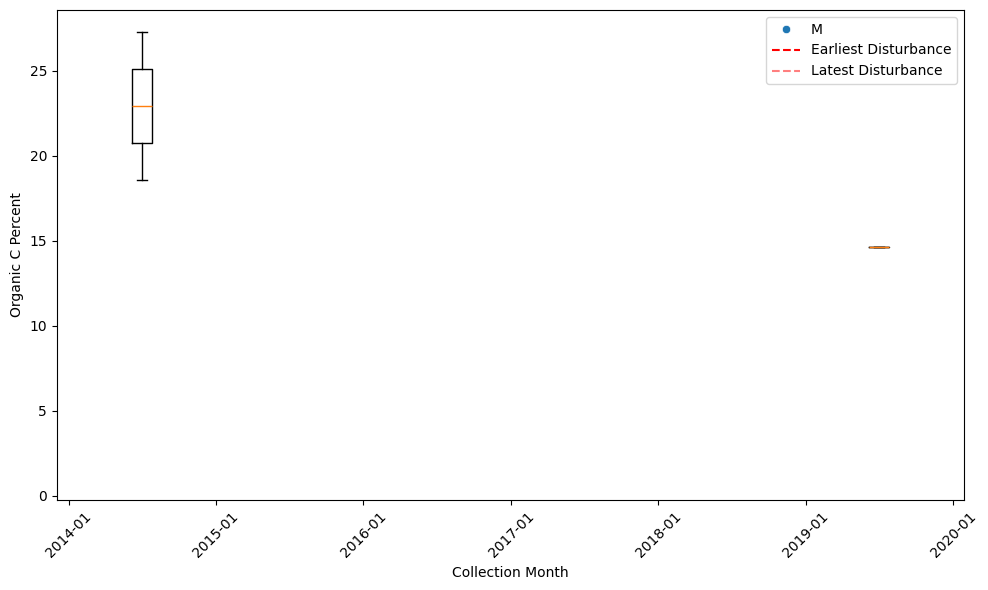


--- Yearly SOC (M Horizon) after disturbance ---
year_since
1      NaN
2     2.74
3      NaN
4      NaN
5      NaN
6      NaN
7      NaN
8      NaN
9      NaN
10     NaN
11     NaN
12     NaN
13     NaN
14     NaN
15     NaN
16     NaN
17     NaN
18     NaN
19     NaN
20     NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
10   NaN
11   NaN
12   NaN
13   NaN
14   NaN
15   NaN
16   NaN
17   NaN
18   NaN
19   NaN
20   NaN
Name: organicCPercent, dtype: float64


In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)


years_offset = 10
for plot in valid_plots:
    print(plot)
    chemistry_plot_df = chemistry_df[chemistry_df['plotID']== plot]
    chemistry_plot_df['HorizonType'] = chemistry_plot_df['sampleID'].apply(
        lambda x: 'O' if 'O' in str(x) else ('M' if 'M' in str(x) else 'Unknown')
    )
    
    disturbance_dates_raw = site_disturbance_dates[site_disturbance_dates['siteID'] == plot[:4]]['startDate'].values[0]
    disturbance_dates = pd.to_datetime(disturbance_dates_raw, errors='coerce').sort_values()
    

    # Process datetime columns
    chemistry_plot_df["collect_datetime"] = pd.to_datetime(chemistry_plot_df["collectDate"], errors='coerce').dt.tz_localize(None)
    chemistry_plot_df["collect_month"] = chemistry_plot_df["collect_datetime"].dt.to_period('M').dt.to_timestamp()

    earliest_date = chemistry_plot_df["collect_month"].min()
    latest_date = chemistry_plot_df["collect_month"].max()

    # Ensure disturbance_dates is a list of datetime-like objects
    disturbance_dates = pd.to_datetime(disturbance_dates, errors='coerce')
    # Sort the dates
    disturbance_dates = disturbance_dates.sort_values()
    # Get the first disturbance date that is after or equal to earliest_date
    earliest_disturbance = disturbance_dates[disturbance_dates >= earliest_date].min()
    # Get the last disturbance date that is before or equal to latest_date
    latest_disturbance = disturbance_dates[disturbance_dates <= latest_date].max()

     # Define time windows
    offset = pd.DateOffset(years=years_offset)
    before_start = earliest_disturbance - offset
    before_end = earliest_disturbance
    after_start = latest_disturbance
    after_end = latest_disturbance + offset

    # Label each row in the chemistry data
    def label_period(row):
        if before_start <= row['collect_month'] < before_end:
            return 'Before'
        elif after_start <= row['collect_month'] < after_end:
            return 'After'
        else:
            return 'Outside'

    chemistry_plot_df['period'] = chemistry_plot_df.apply(label_period, axis=1)
  
    
    # Group and filter organic C data by month
    # M Horizon
    chemistry_plot_df_M = chemistry_plot_df[chemistry_plot_df['HorizonType'] == 'M']
    if chemistry_plot_df_M.shape[0]!=0:
        grouped_M = chemistry_plot_df_M.groupby('collect_month')['organicCPercent'].apply(lambda x: x.dropna().tolist())
        grouped_M = grouped_M[grouped_M.apply(lambda x: len(x) > 0)]
        dates_M = grouped_M.index
        data_M = grouped_M.values

    # O Horizon
    chemistry_plot_df_O = chemistry_plot_df[chemistry_plot_df['HorizonType'] == 'O']
    if chemistry_plot_df_O.shape[0]!=0:
        grouped_O = chemistry_plot_df_O.groupby('collect_month')['organicCPercent'].apply(lambda x: x.dropna().tolist())
        grouped_O = grouped_O[grouped_O.apply(lambda x: len(x) > 0)]
        dates_O = grouped_O.index
        data_O = grouped_O.values

     # Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    if data_M.shape[0] > 0:
        ax.boxplot(data_M, positions=mdates.date2num(dates_M), widths=50)
        ax.set_xlim([dates_M.min() - pd.Timedelta(weeks=30), dates_M.max() + pd.Timedelta(weeks=30)])
    if data_O.shape[0] > 0:
        ax.boxplot(data_O, positions=mdates.date2num(dates_O), widths=50)
        ax.set_xlim([dates_O.min() - pd.Timedelta(weeks=30), dates_O.max() + pd.Timedelta(weeks=30)])

    sns.scatterplot(
        data=chemistry_plot_df,
        x='collect_datetime',
        y='organicCPercent',
        hue='HorizonType',
        ax=ax
    )

    
    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.xticks(rotation=45)

    ax.axvline(mdates.date2num(earliest_disturbance), color='red', linestyle='--', label='Earliest Disturbance')
    ax.axvline(mdates.date2num(latest_disturbance), color='red', linestyle='--', alpha=0.5, label='Latest Disturbance')
    ax.set_xlabel("Collection Month")
    ax.set_ylabel("Organic C Percent")
    ax.legend()

    plt.tight_layout()
    plt.show()

    # Calculate and return means for Mineral Soil
    # Calculate years since latest disturbance for all records
    # Calculate years since latest disturbance for all records
    chemistry_plot_df['years_since_disturbance'] = (
        (chemistry_plot_df['collect_month'] - latest_disturbance).dt.days / 365.25
    ).apply(lambda x: math.ceil(x) if pd.notnull(x) and x >= 0 else pd.NA)

    # Filter for only data within 1 to 20 years after the disturbance
    chemistry_plot_df['year_since'] = chemistry_plot_df['years_since_disturbance'].where(
        chemistry_plot_df['years_since_disturbance'].between(1, 20), other=pd.NA
    )

    # Group by horizon and year since disturbance
    yearly_soc_M = chemistry_plot_df[
        (chemistry_plot_df['HorizonType'] == 'M') & (chemistry_plot_df['year_since'].notna())
    ].groupby('year_since')['organicCPercent'].mean().reindex(range(1, 21), fill_value=pd.NA)

    yearly_soc_O = chemistry_plot_df[
        (chemistry_plot_df['HorizonType'] == 'O') & (chemistry_plot_df['year_since'].notna())
    ].groupby('year_since')['organicCPercent'].mean().reindex(range(1, 21), fill_value=pd.NA)

    # Print results
    print("\n--- Yearly SOC (M Horizon) after disturbance ---")
    print(yearly_soc_M)

    print("\n--- Yearly SOC (O Horizon) after disturbance ---")
    print(yearly_soc_O)

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import math

# List to collect all the results
results = []

years_offset = 10

for plot in valid_plots:

    chemistry_plot_df = chemistry_df[chemistry_df['plotID'] == plot].copy()

    chemistry_plot_df['HorizonType'] = chemistry_plot_df['sampleID'].apply(
        lambda x: 'O' if 'O' in str(x) else ('M' if 'M' in str(x) else 'Unknown')
    )

    # Get siteID by slicing plotID (first 4 letters)
    site_id = plot[:4]
    disturbance_dates_raw = site_disturbance_dates[site_disturbance_dates['siteID'] == site_id]['startDate'].values[0]
    disturbance_dates = pd.to_datetime(disturbance_dates_raw, errors='coerce').sort_values()

    # Process datetime columns
    chemistry_plot_df["collect_datetime"] = pd.to_datetime(chemistry_plot_df["collectDate"], errors='coerce').dt.tz_localize(None)
    chemistry_plot_df["collect_month"] = chemistry_plot_df["collect_datetime"].dt.to_period('M').dt.to_timestamp()

    earliest_date = chemistry_plot_df["collect_month"].min()
    latest_date = chemistry_plot_df["collect_month"].max()

    # Ensure disturbance_dates is sorted and valid
    disturbance_dates = pd.to_datetime(disturbance_dates, errors='coerce').sort_values()

    # Get the first disturbance date after or equal to earliest_date
    earliest_disturbance = disturbance_dates[disturbance_dates >= earliest_date].min()
    # Get the last disturbance date before or equal to latest_date
    latest_disturbance = disturbance_dates[disturbance_dates <= latest_date].max()

    # Define time windows
    offset = pd.DateOffset(years=years_offset)
    before_start = earliest_disturbance - offset
    before_end = earliest_disturbance
    after_start = latest_disturbance
    after_end = latest_disturbance + offset

    # Label periods
    def label_period(row):
        if before_start <= row['collect_month'] < before_end:
            return 'Before'
        elif after_start <= row['collect_month'] < after_end:
            return 'After'
        else:
            return 'Outside'

    chemistry_plot_df['period'] = chemistry_plot_df.apply(label_period, axis=1)

    # M Horizon
    chemistry_plot_df_M = chemistry_plot_df[chemistry_plot_df['HorizonType'] == 'M']
    # O Horizon
    chemistry_plot_df_O = chemistry_plot_df[chemistry_plot_df['HorizonType'] == 'O']
    print("latest_disturbance", latest_disturbance)
    print("collected date", chemistry_plot_df['collect_month'])
    # Calculate years since latest disturbance for all records
    chemistry_plot_df['years_since_disturbance'] = (
        (chemistry_plot_df['collect_month'] - latest_disturbance).dt.days / 365.25
    ).apply(lambda x: math.ceil(x) if pd.notnull(x) and x >= 0 else pd.NA)


    # Filter for only data within 1 to 20 years after the disturbance
    chemistry_plot_df['year_since'] = chemistry_plot_df['years_since_disturbance'].where(
        chemistry_plot_df['years_since_disturbance'].between(1, 20), other=pd.NA
    )

    # Group by horizon and year since disturbance
    yearly_soc_M = chemistry_plot_df[
        (chemistry_plot_df['HorizonType'] == 'M') & (chemistry_plot_df['year_since'].notna())
    ].groupby('year_since')['organicCPercent'].mean().reindex(range(1, 21), fill_value=pd.NA)

    yearly_soc_O = chemistry_plot_df[
        (chemistry_plot_df['HorizonType'] == 'O') & (chemistry_plot_df['year_since'].notna())
    ].groupby('year_since')['organicCPercent'].mean().reindex(range(1, 21), fill_value=pd.NA)

    # Print results
    print("\n--- Yearly SOC (M Horizon) after disturbance ---")
    print(yearly_soc_M)

    print("\n--- Yearly SOC (O Horizon) after disturbance ---")
    print(yearly_soc_O)



latest_disturbance 2019-10-29 00:00:00
collected date 45    2014-08-01
46    2014-08-01
47    2014-08-01
48    2014-08-01
49    2014-08-01
52    2014-08-01
53    2014-08-01
185   2022-06-01
186   2022-06-01
187   2022-06-01
192   2022-06-01
193   2022-06-01
194   2022-06-01
195   2022-06-01
Name: collect_month, dtype: datetime64[ns]

--- Yearly SOC (M Horizon) after disturbance ---
year_since
1         NaN
2         NaN
3     38.4975
4         NaN
5         NaN
6         NaN
7         NaN
8         NaN
9         NaN
10        NaN
11        NaN
12        NaN
13        NaN
14        NaN
15        NaN
16        NaN
17        NaN
18        NaN
19        NaN
20        NaN
Name: organicCPercent, dtype: float64

--- Yearly SOC (O Horizon) after disturbance ---
year_since
1           NaN
2           NaN
3     51.073333
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11          NaN
12          NaN
13          NaN
14          NaN
1

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import warnings
import math

warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)

def analyze_plot_SOC(plot, chemistry_df, site_disturbance_dates, years_offset=10):
    result = {}

    chemistry_plot_df = chemistry_df[chemistry_df['plotID'] == plot].copy()
    chemistry_plot_df['HorizonType'] = chemistry_plot_df['sampleID'].apply(
        lambda x: 'O' if 'O' in str(x) else ('M' if 'M' in str(x) else 'Unknown')
    )

    # Handle disturbance dates
    disturbance_dates_raw = site_disturbance_dates[site_disturbance_dates['siteID'] == plot[:4]]['startDate'].values[0]
    disturbance_dates = pd.to_datetime(disturbance_dates_raw, errors='coerce')
    disturbance_dates = disturbance_dates.sort_values()

    # Process datetime columns
    chemistry_plot_df["collect_datetime"] = pd.to_datetime(chemistry_plot_df["collectDate"], errors='coerce').dt.tz_localize(None)
    chemistry_plot_df["collect_month"] = chemistry_plot_df["collect_datetime"].dt.to_period('M').dt.to_timestamp()

    earliest_date = chemistry_plot_df["collect_month"].min()
    latest_date = chemistry_plot_df["collect_month"].max()

    earliest_disturbance = disturbance_dates[disturbance_dates >= earliest_date].min()
    latest_disturbance = disturbance_dates[disturbance_dates <= latest_date].max()

    offset = pd.DateOffset(years=years_offset)
    before_start = earliest_disturbance - offset
    before_end = earliest_disturbance
    after_start = latest_disturbance
    after_end = latest_disturbance + offset

    def label_period(row):
        if before_start <= row['collect_month'] < before_end:
            return 'Before'
        elif after_start <= row['collect_month'] < after_end:
            return 'After'
        else:
            return 'Outside'

    chemistry_plot_df['period'] = chemistry_plot_df.apply(label_period, axis=1)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 6))

    for horizon in ['M', 'O']:
        df = chemistry_plot_df[chemistry_plot_df['HorizonType'] == horizon]
        if not df.empty:
            grouped = df.groupby('collect_month')['organicCPercent'].apply(lambda x: x.dropna().tolist())
            grouped = grouped[grouped.apply(len) > 0]
            dates = grouped.index
            data = grouped.values
            if len(data) > 0:
                ax.boxplot(data, positions=mdates.date2num(dates), widths=50)
                ax.set_xlim([dates.min() - pd.Timedelta(weeks=30), dates.max() + pd.Timedelta(weeks=30)])

    sns.scatterplot(
        data=chemistry_plot_df,
        x='collect_datetime',
        y='organicCPercent',
        hue='HorizonType',
        ax=ax
    )

    ax.xaxis.set_major_locator(mdates.AutoDateLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.xticks(rotation=45)
    ax.axvline(mdates.date2num(earliest_disturbance), color='red', linestyle='--', label='Earliest Disturbance')
    ax.axvline(mdates.date2num(latest_disturbance), color='red', linestyle='--', alpha=0.5, label='Latest Disturbance')
    ax.set_xlabel("Collection Month")
    ax.set_ylabel("Organic C Percent")
    ax.legend()
    plt.tight_layout()
    plt.show()

    # Before/After means
    chemistry_plot_df_M = chemistry_plot_df[chemistry_plot_df['HorizonType'] == 'M']
    chemistry_plot_df_O = chemistry_plot_df[chemistry_plot_df['HorizonType'] == 'O']

    grouped_means_M = chemistry_plot_df_M[chemistry_plot_df_M['period'].isin(['Before', 'After'])] \
        .groupby('period')['organicCPercent'].mean()
    grouped_means_O = chemistry_plot_df_O[chemistry_plot_df_O['period'].isin(['Before', 'After'])] \
        .groupby('period')['organicCPercent'].mean()

    result = {
        'plotID': plot,
        'earliest_disturbance': earliest_disturbance,
        'latest_disturbance': latest_disturbance,
        'mean_before_O': grouped_means_O.get('Before', float('nan')),
        'mean_after_O': grouped_means_O.get('After', float('nan')),
        'mean_before_M': grouped_means_M.get('Before', float('nan')),
        'mean_after_M': grouped_means_M.get('After', float('nan')),
        'years_offset_before': years_offset
    }

    # Year-since-disturbance processing
    chemistry_plot_df['years_since_disturbance'] = (
        (chemistry_plot_df['collect_month'] - latest_disturbance).dt.days / 365.25
    ).apply(lambda x: math.ceil(x) if pd.notnull(x) and x >= 0 else pd.NA)

    chemistry_plot_df['year_since'] = chemistry_plot_df['years_since_disturbance'].where(
        chemistry_plot_df['years_since_disturbance'].between(1, 20), pd.NA
    )

    def get_yearly_soc(horizon_type):
        df = chemistry_plot_df[
            (chemistry_plot_df['HorizonType'] == horizon_type) & 
            (chemistry_plot_df['year_since'].notna())
        ]
        grouped = df.groupby('year_since')['organicCPercent'].mean()
        renamed = grouped.reindex(range(1, 21), fill_value=pd.NA)
        renamed.index = [f"{horizon_type}_after_{i}" for i in renamed.index]
        return renamed

    soc_O = get_yearly_soc('O')
    soc_M = get_yearly_soc('M')

    result.update(soc_O.to_dict())
    result.update(soc_M.to_dict())

    return result


Processing plot: BART_004


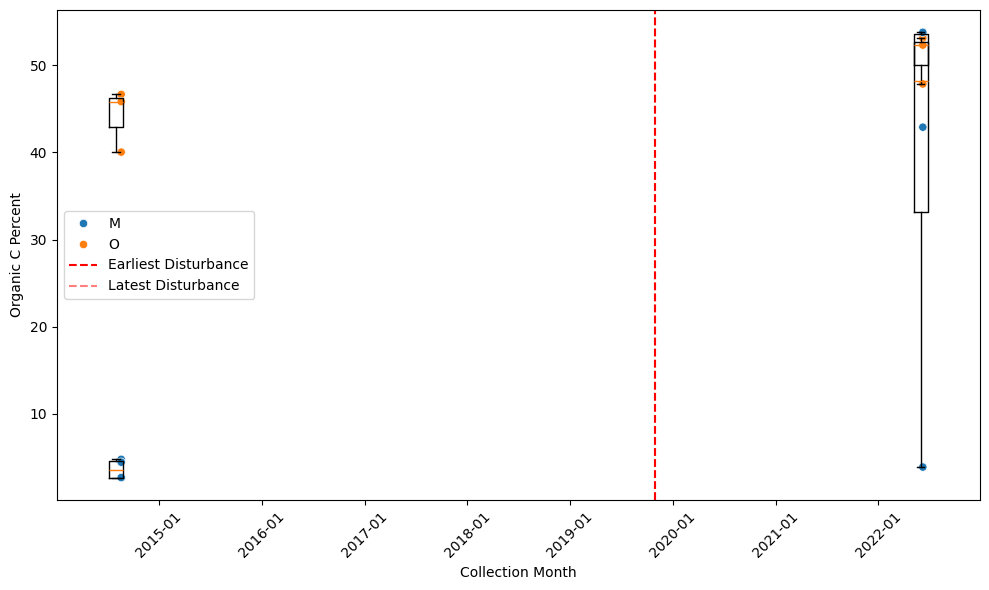

Processing plot: BART_023


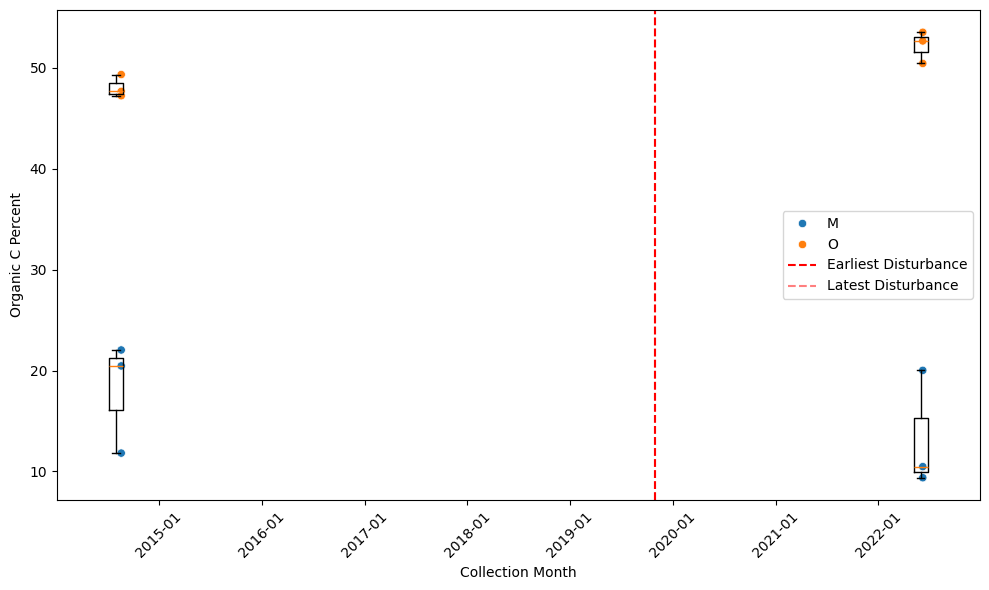

Processing plot: BART_005


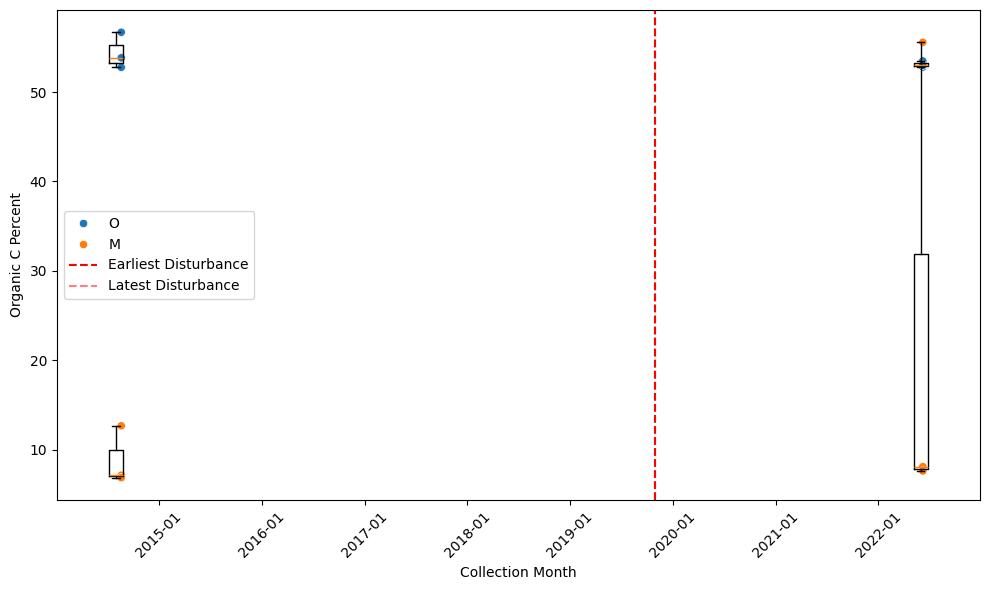

Processing plot: BART_001


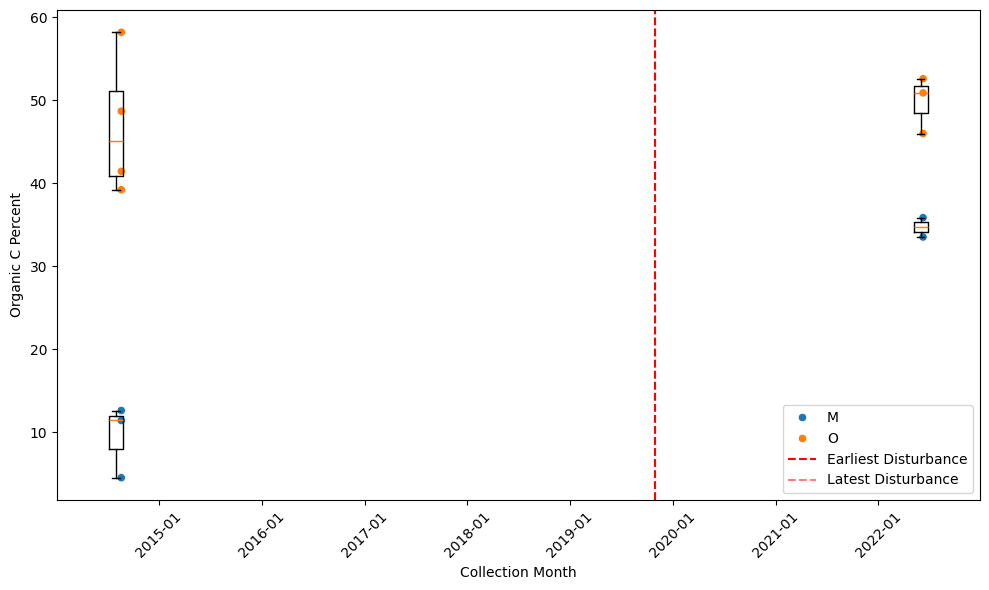

Processing plot: BART_002


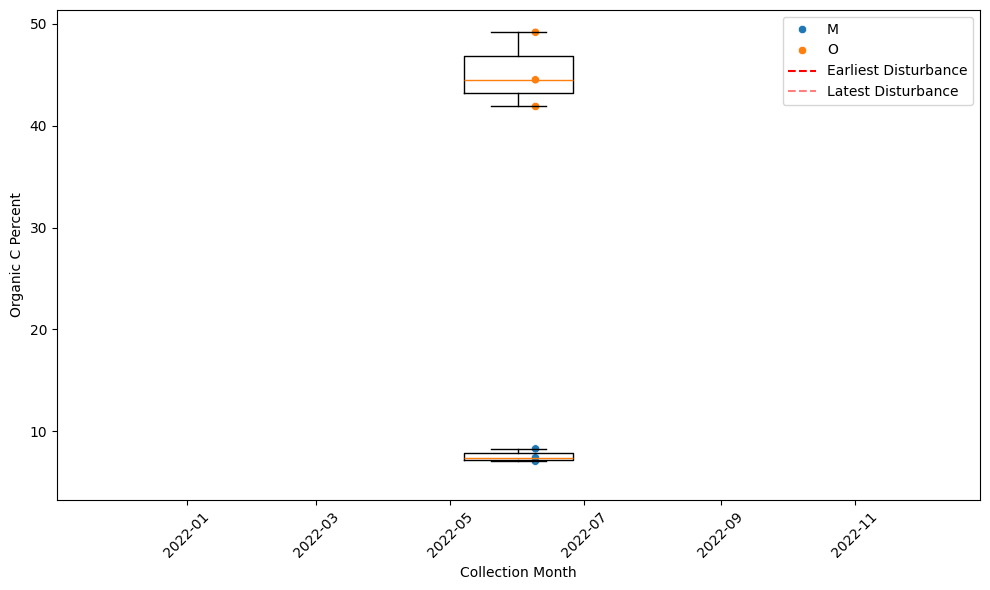

Processing plot: BART_003


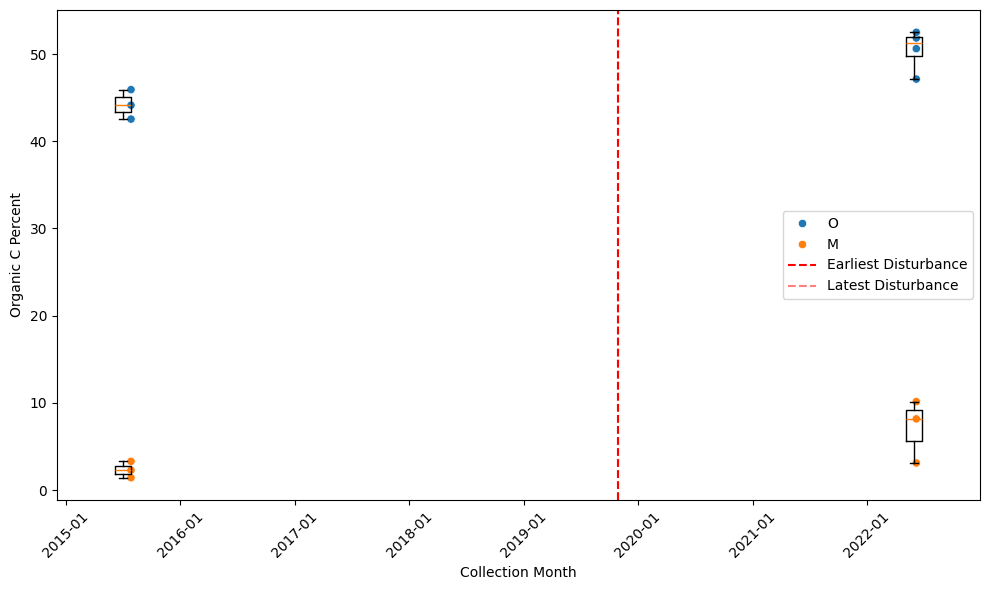

Processing plot: BART_040


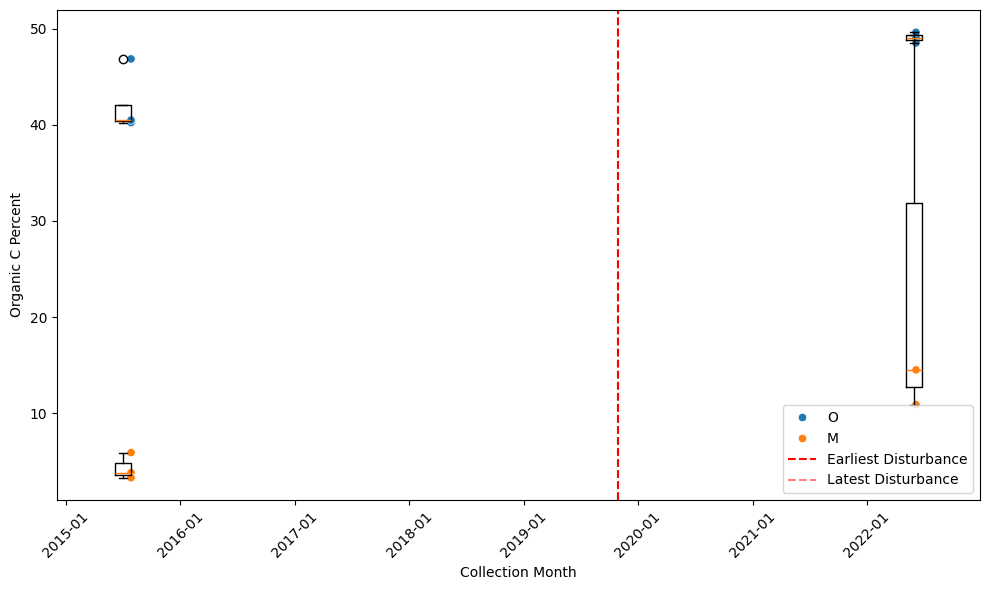

Processing plot: BART_071


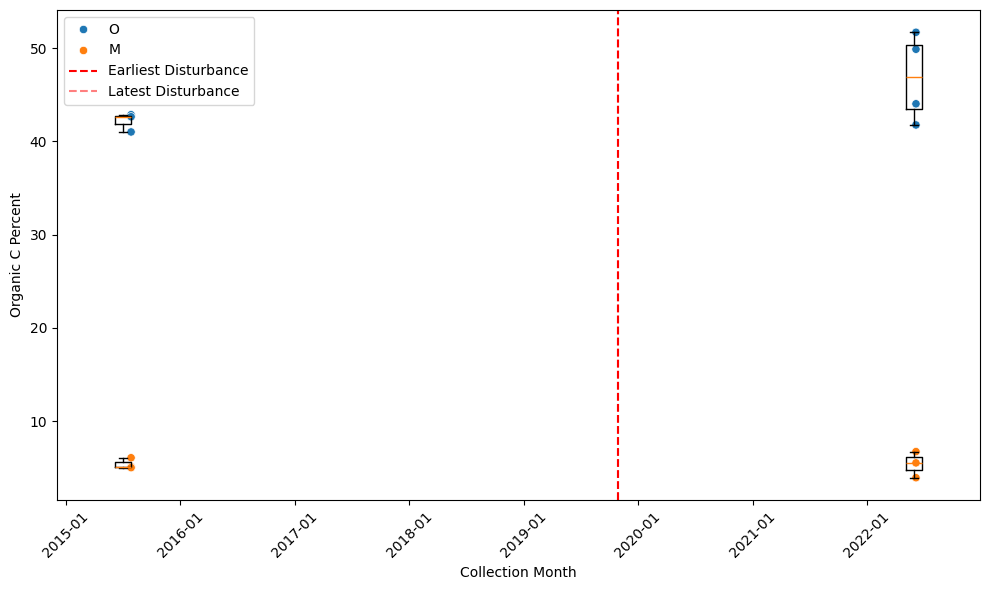

Processing plot: BART_042


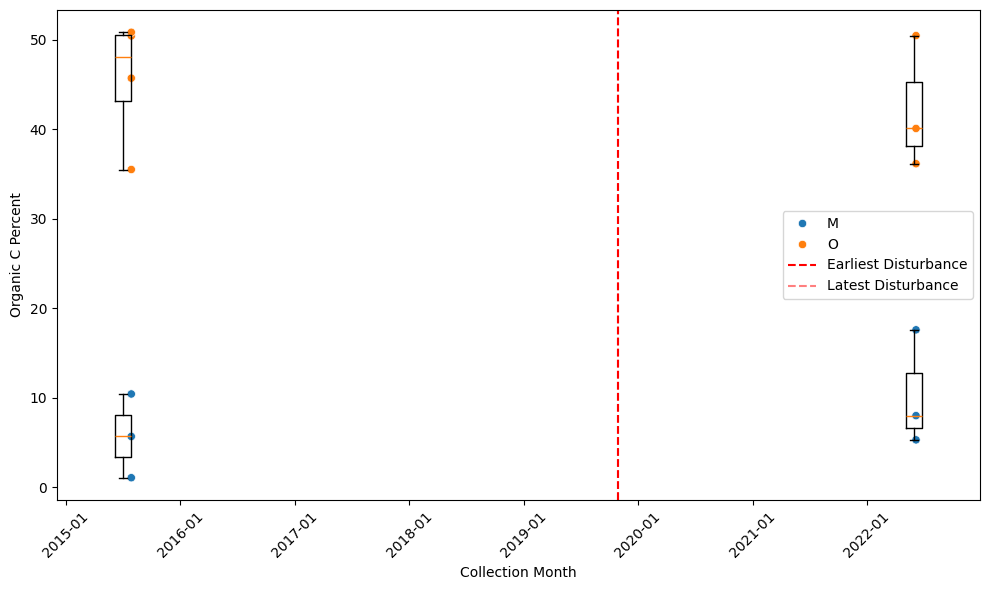

Processing plot: BART_036


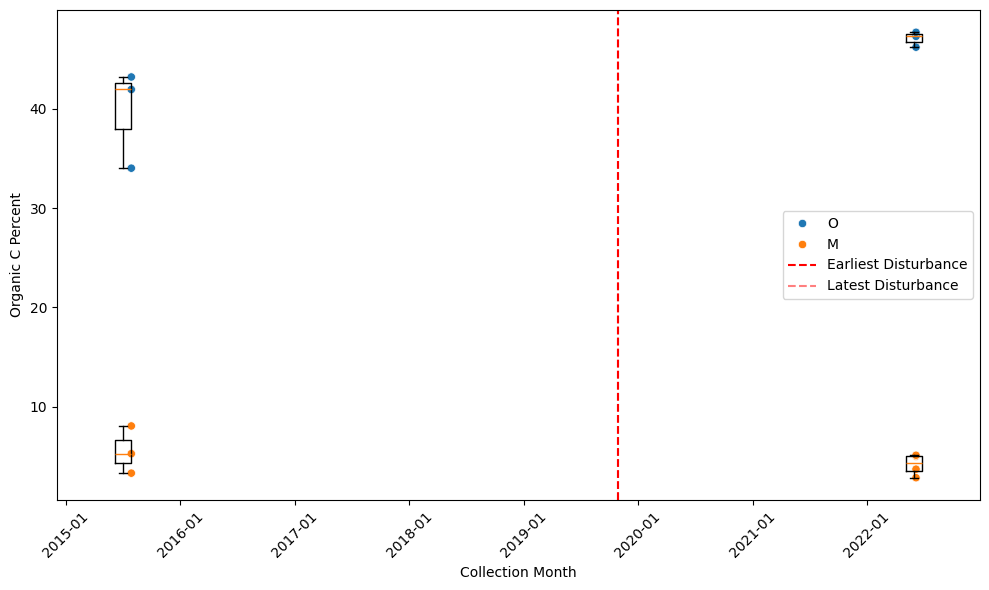

Processing plot: BLAN_033


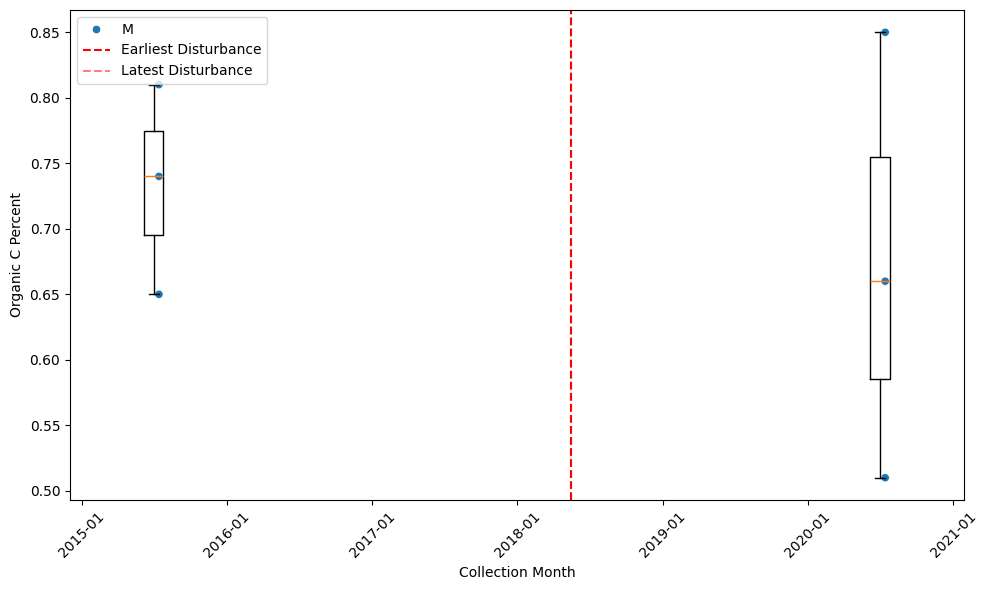

Processing plot: BLAN_031


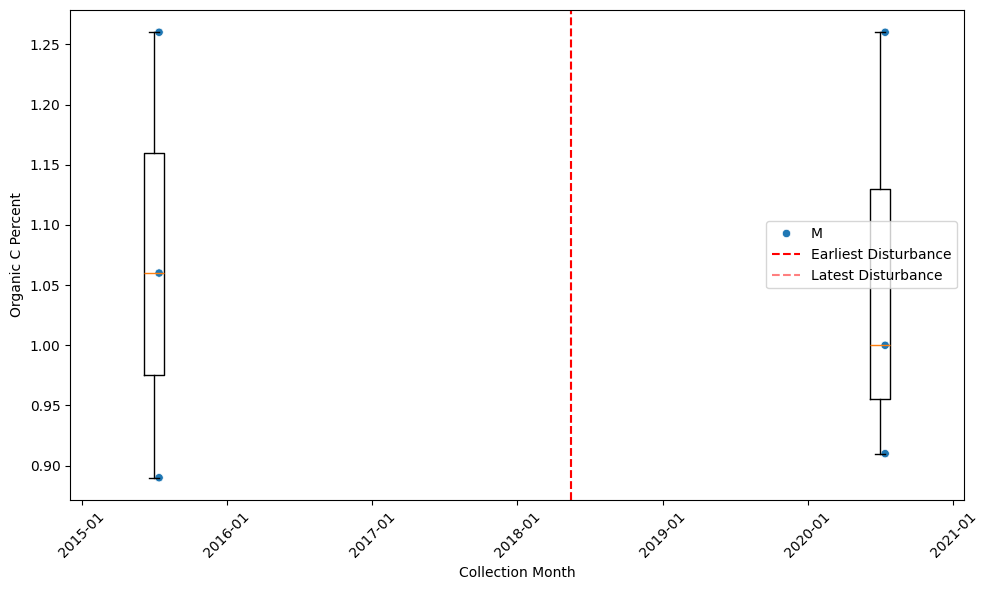

Processing plot: BLAN_032


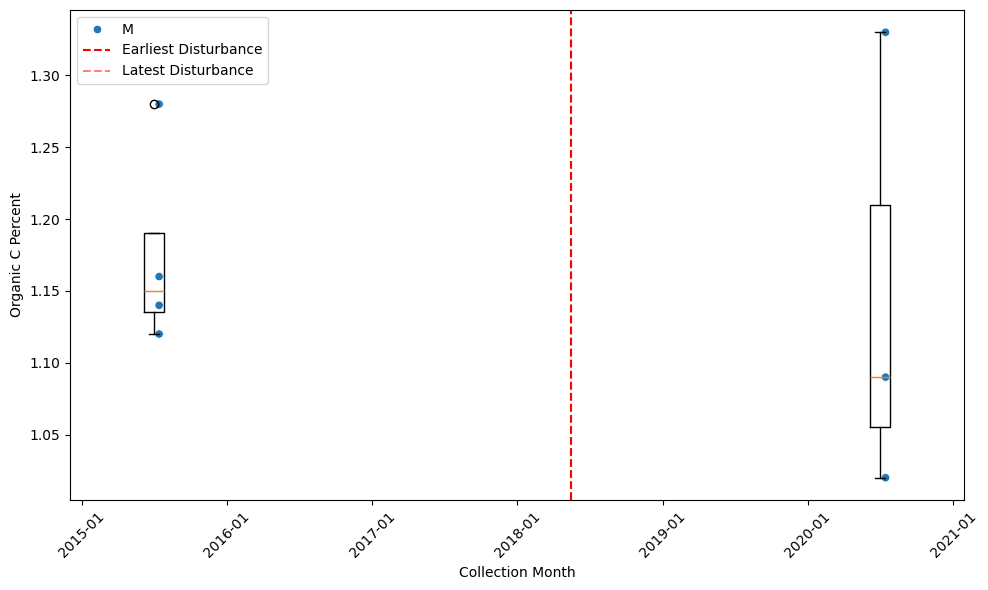

Processing plot: BLAN_005


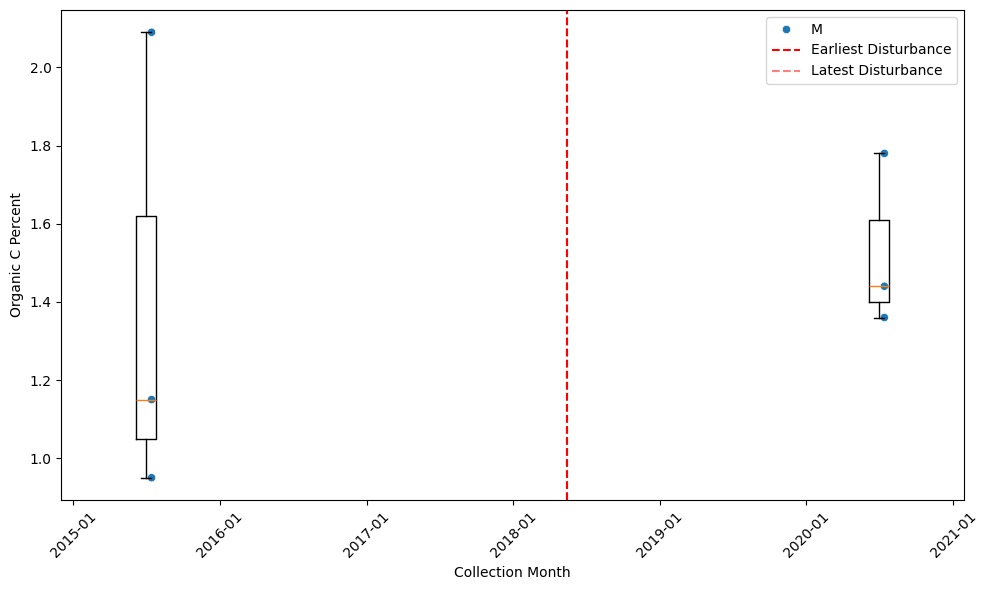

Processing plot: BLAN_007


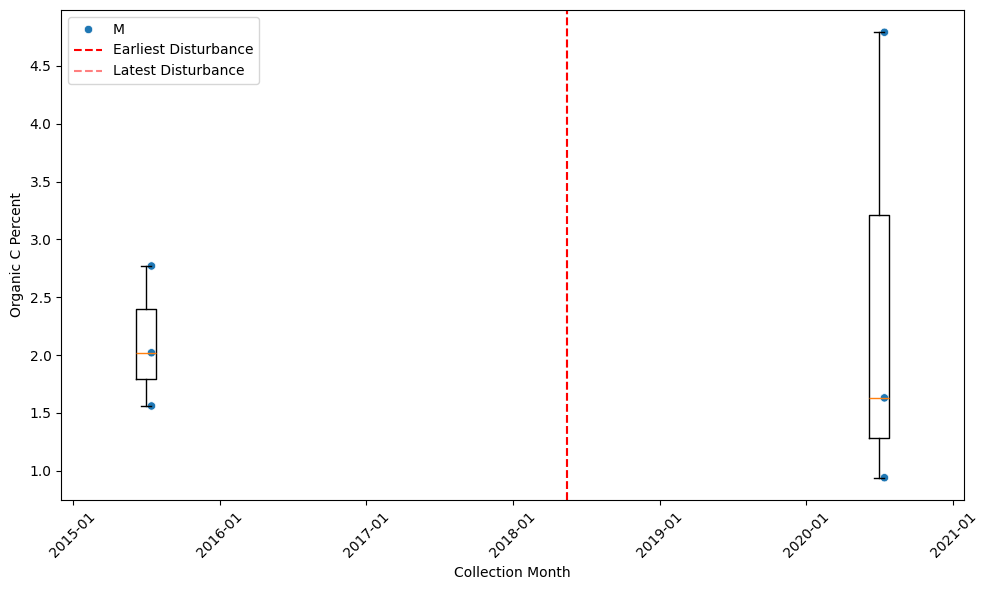

Processing plot: BLAN_004


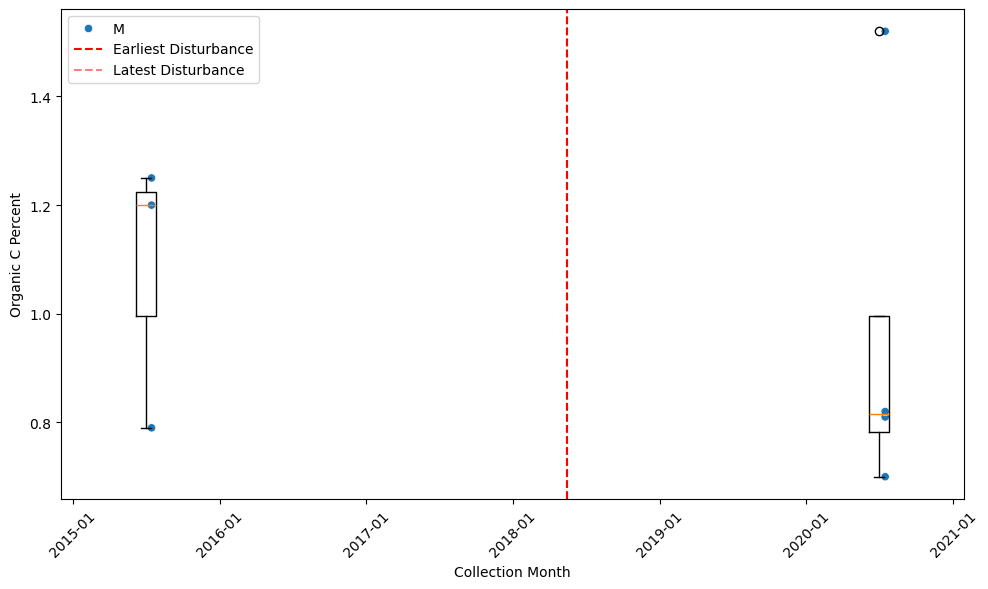

Processing plot: BLAN_003


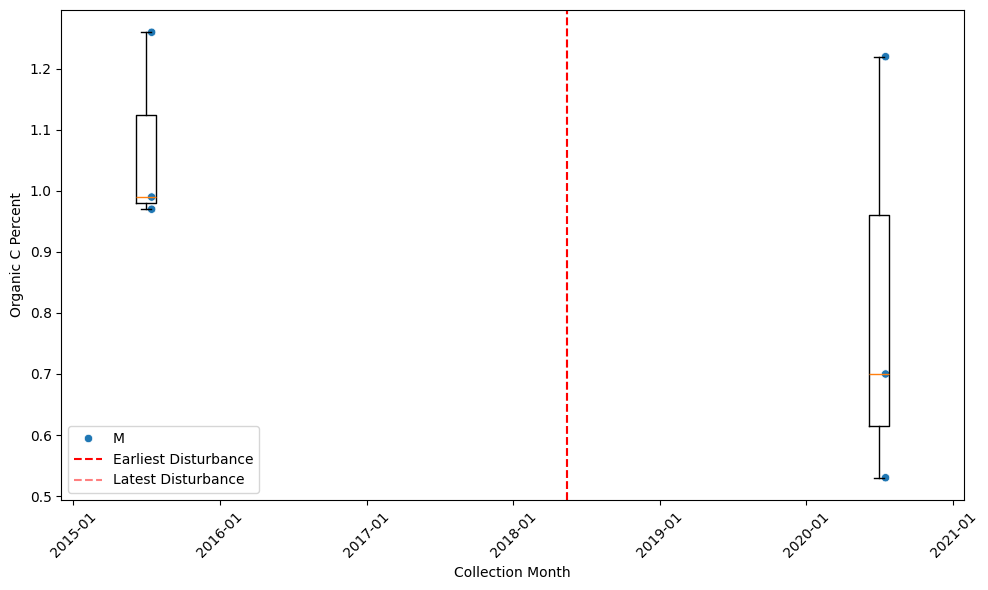

Processing plot: BLAN_001


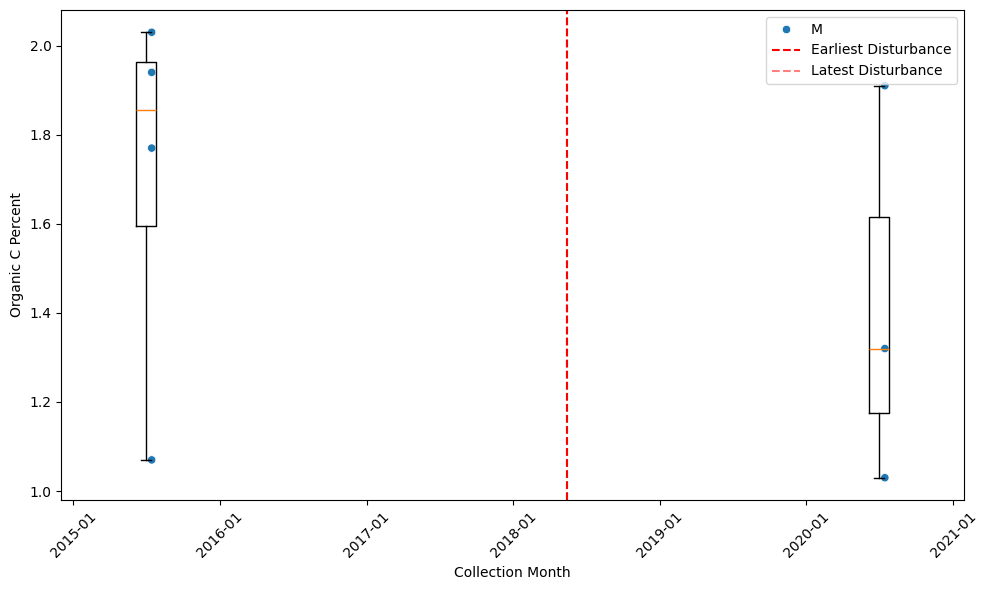

Processing plot: DELA_014


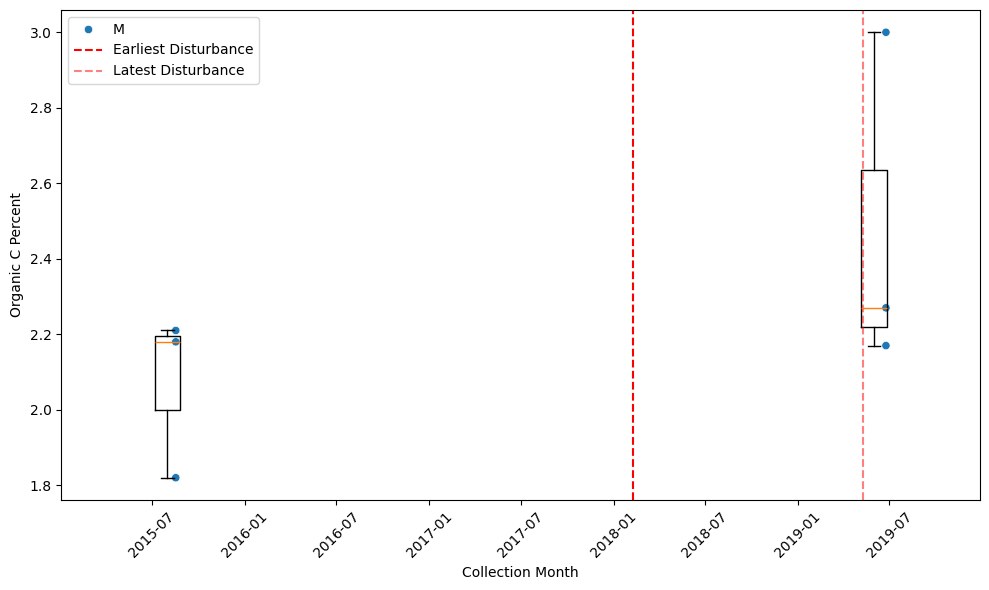

Processing plot: DELA_002


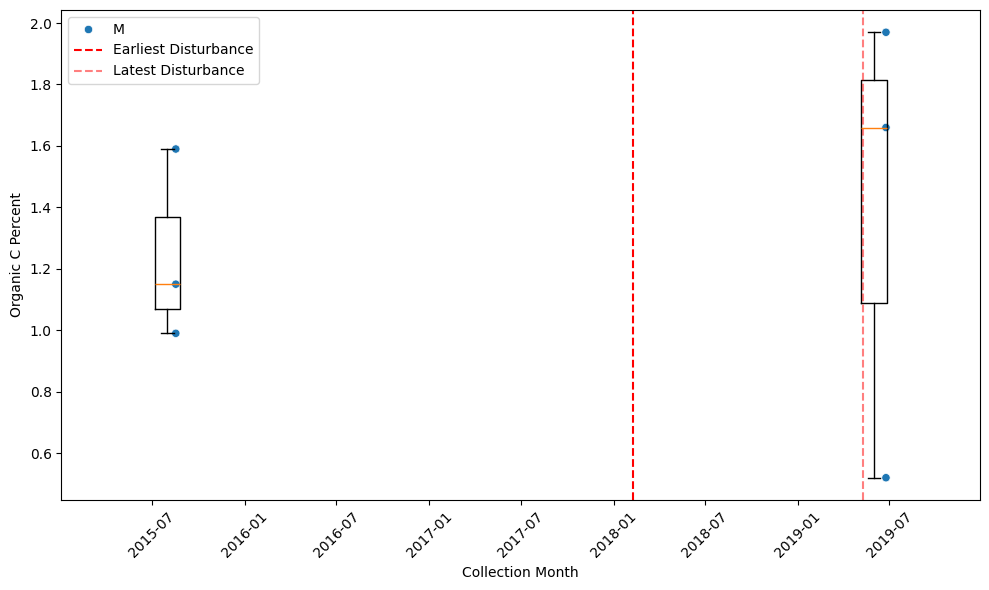

Processing plot: DELA_003


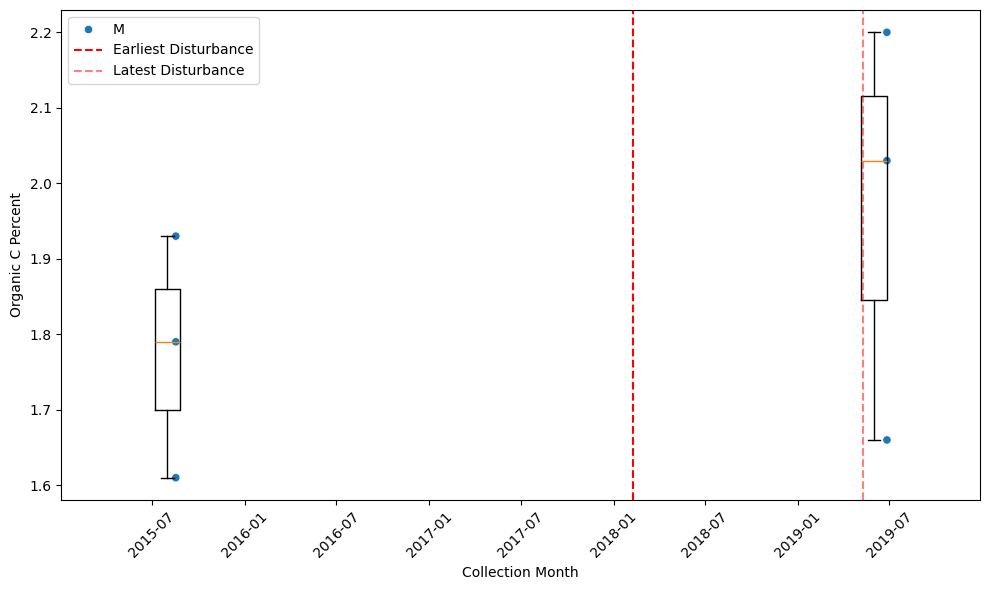

Processing plot: DELA_001


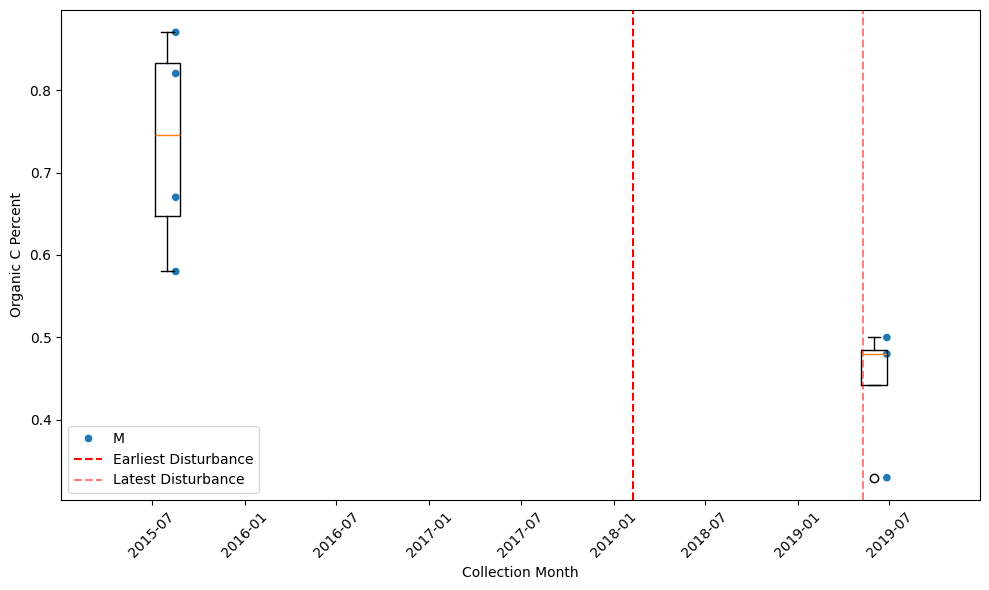

Processing plot: DELA_038


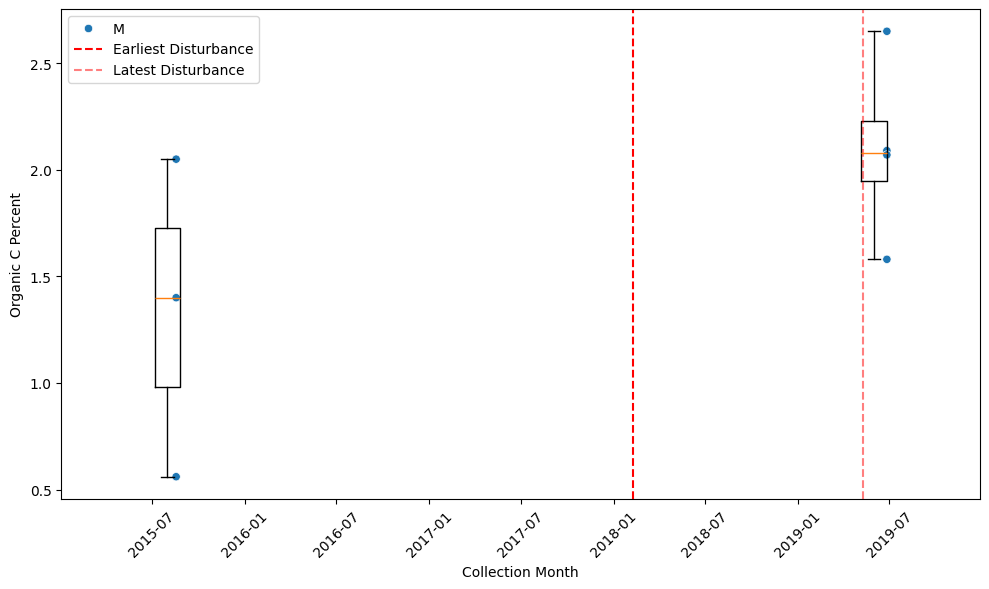

Processing plot: DELA_041


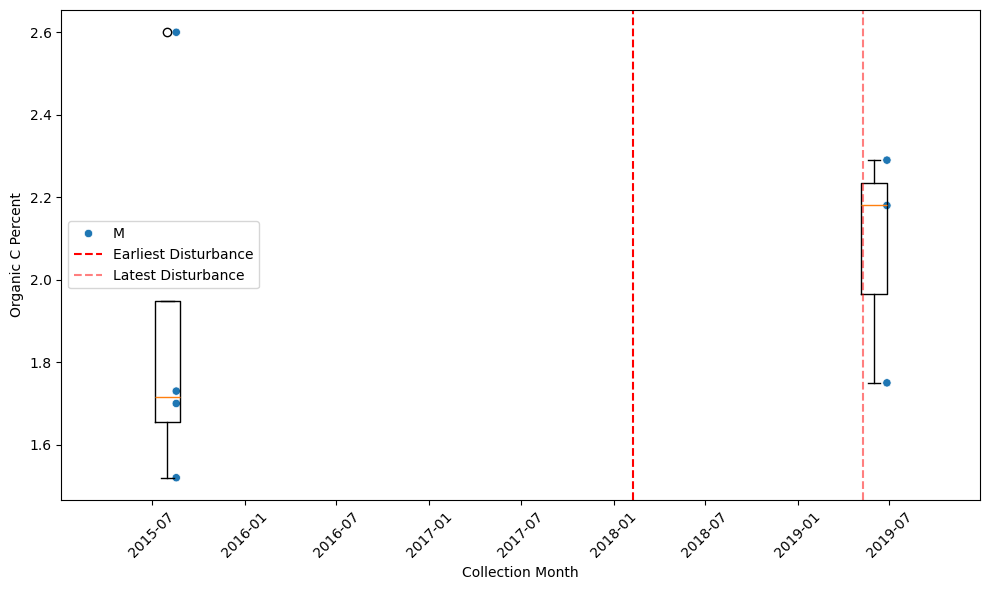

Processing plot: DELA_040


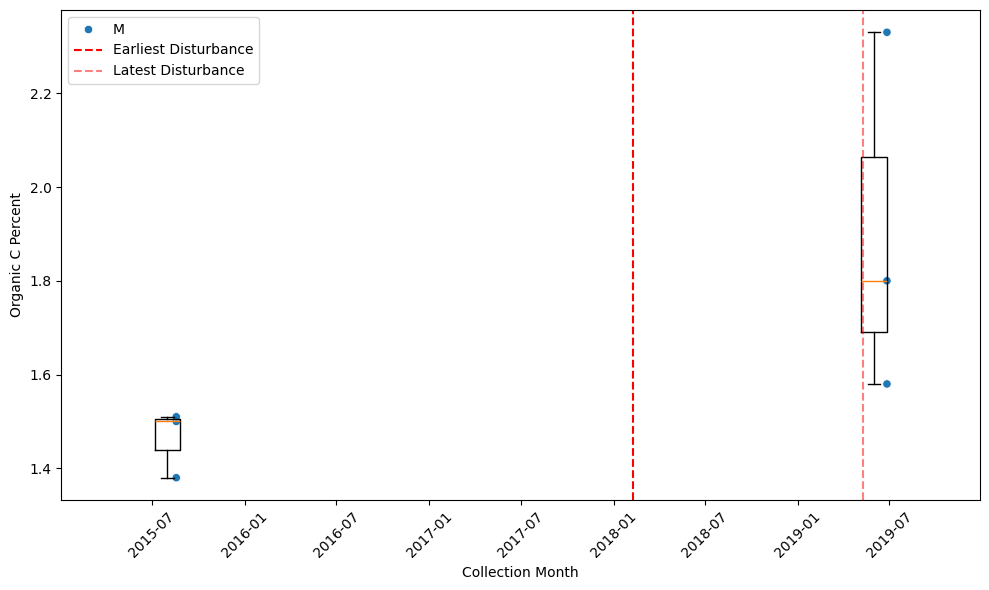

Processing plot: DELA_037


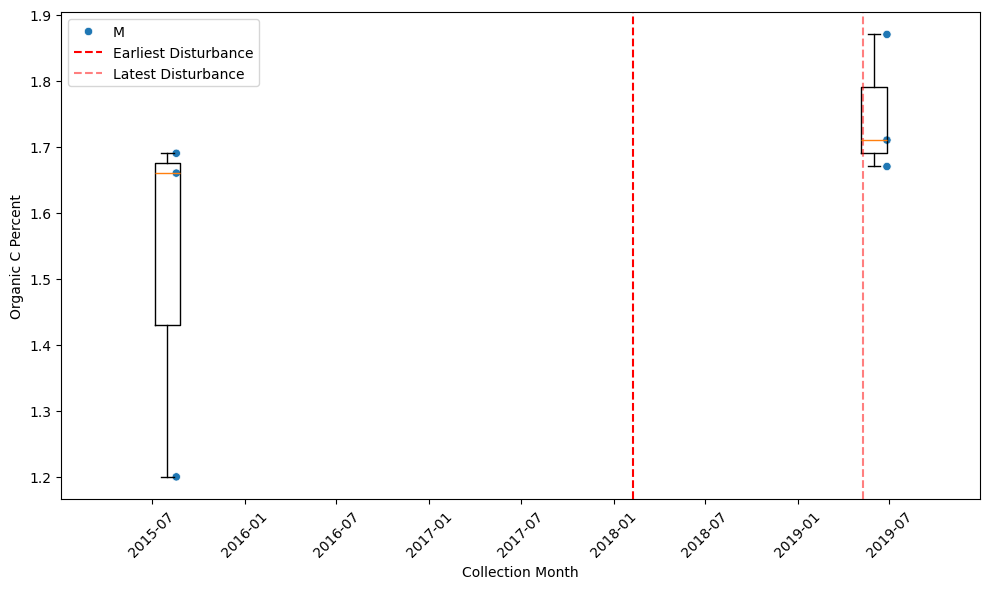

Processing plot: DELA_005


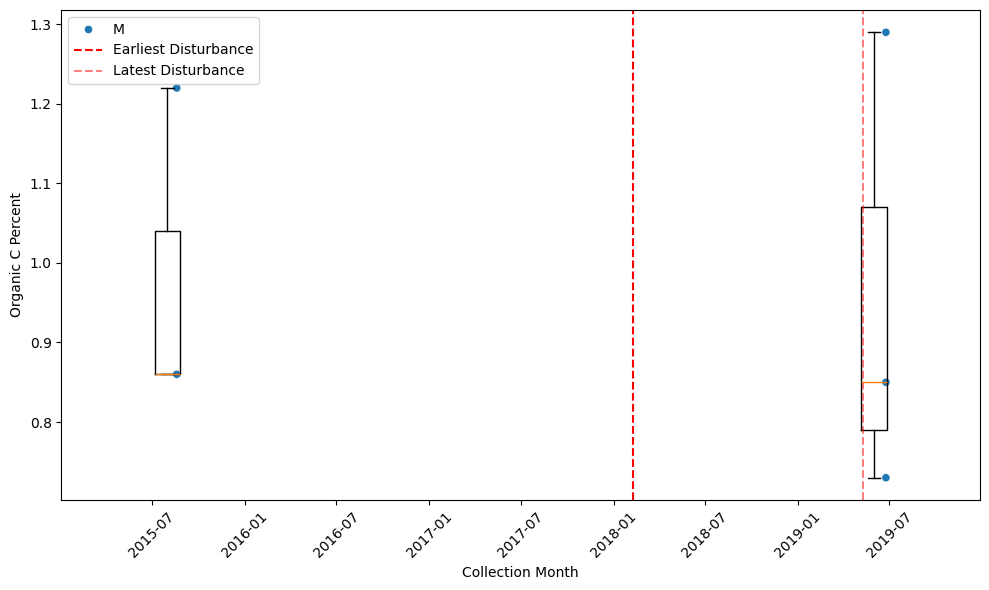

Processing plot: DELA_004


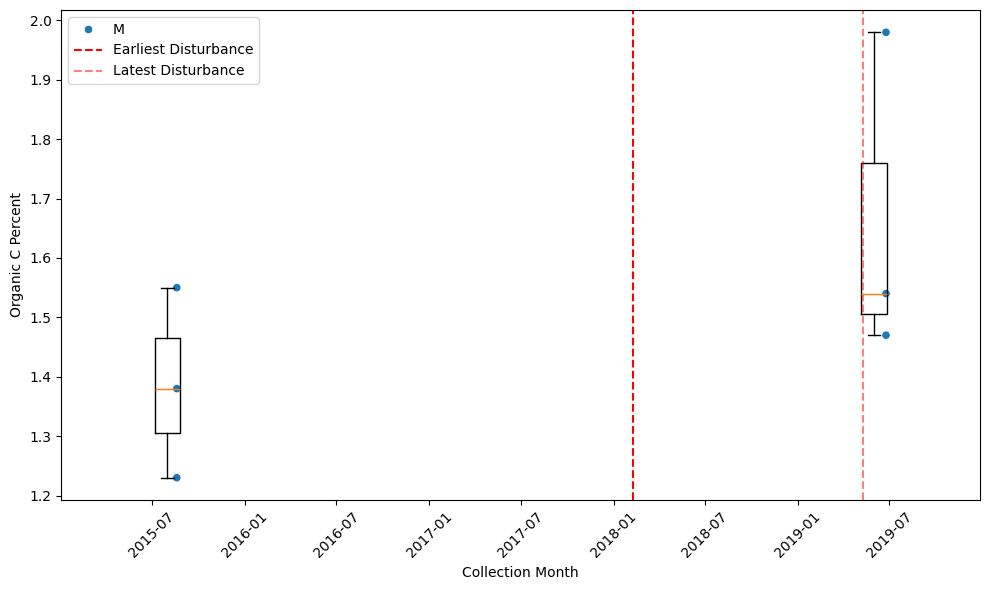

Processing plot: DSNY_041


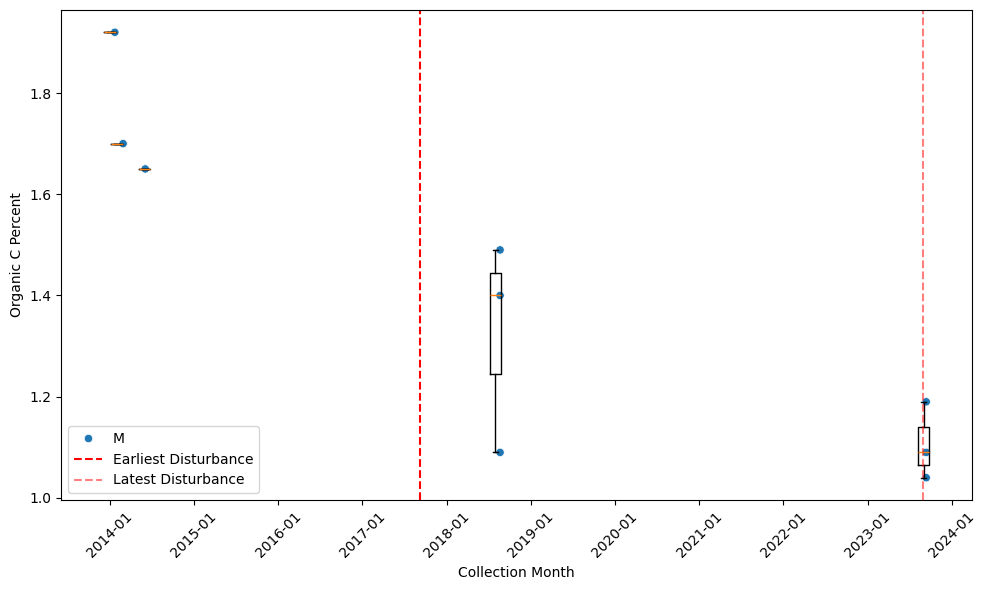

Processing plot: DSNY_005


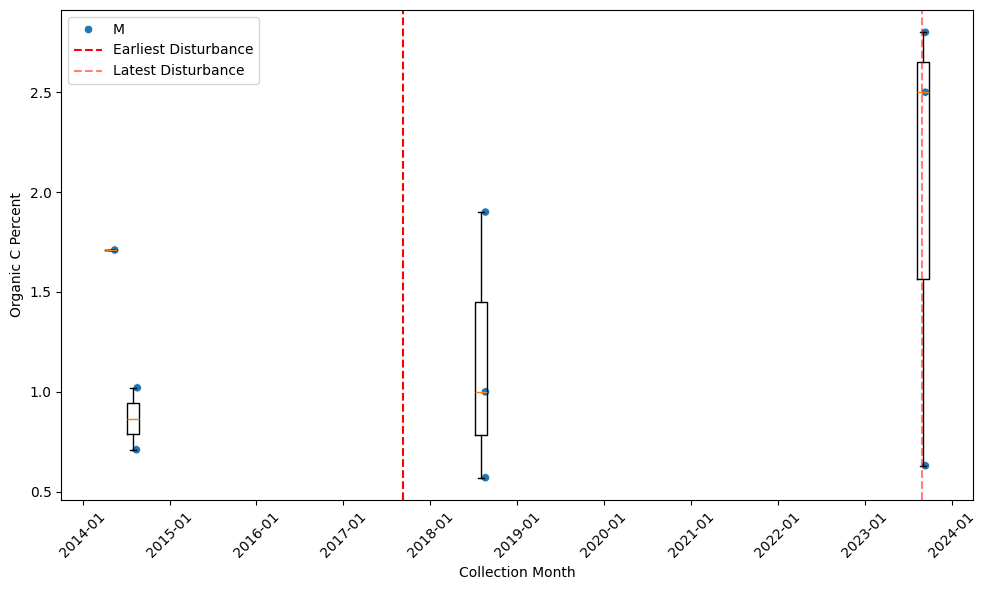

Processing plot: DSNY_003


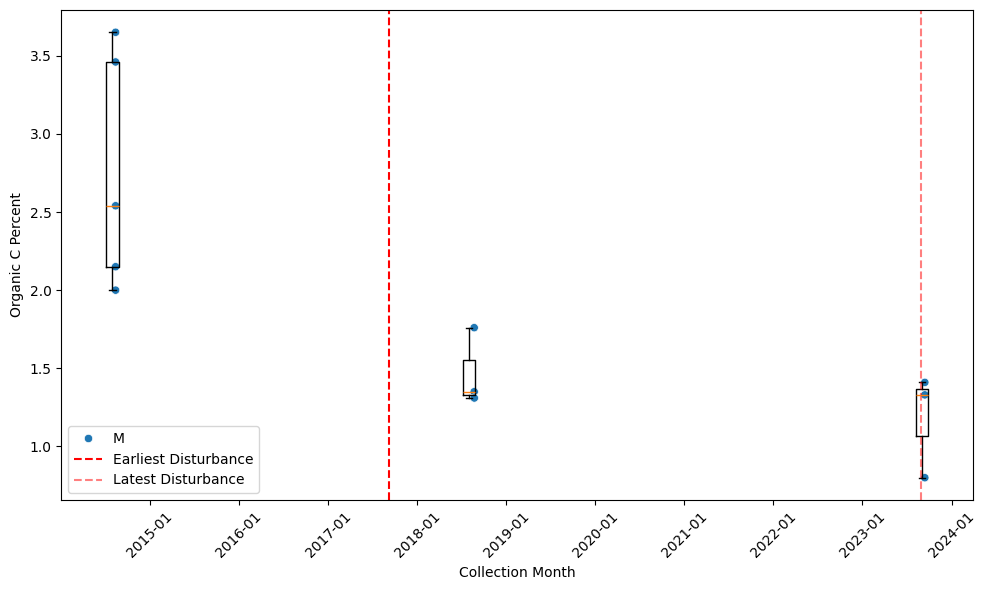

Processing plot: DSNY_001


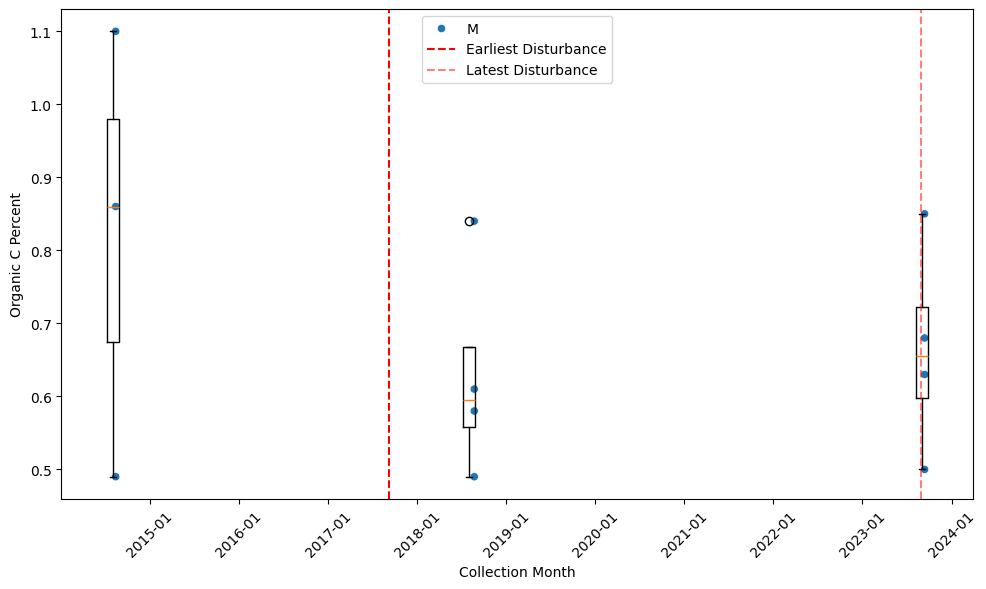

Processing plot: DSNY_009


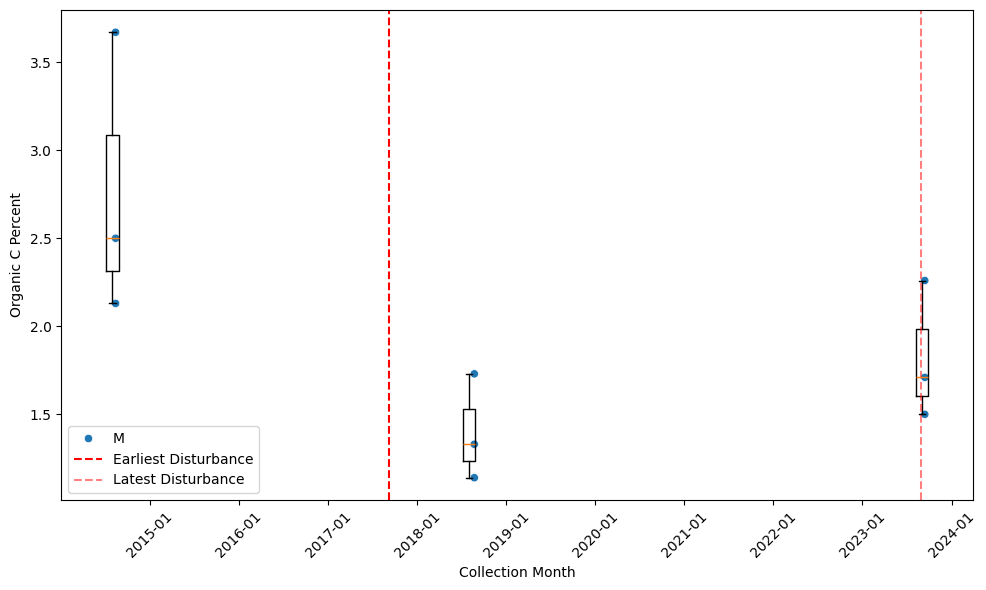

Processing plot: DSNY_004


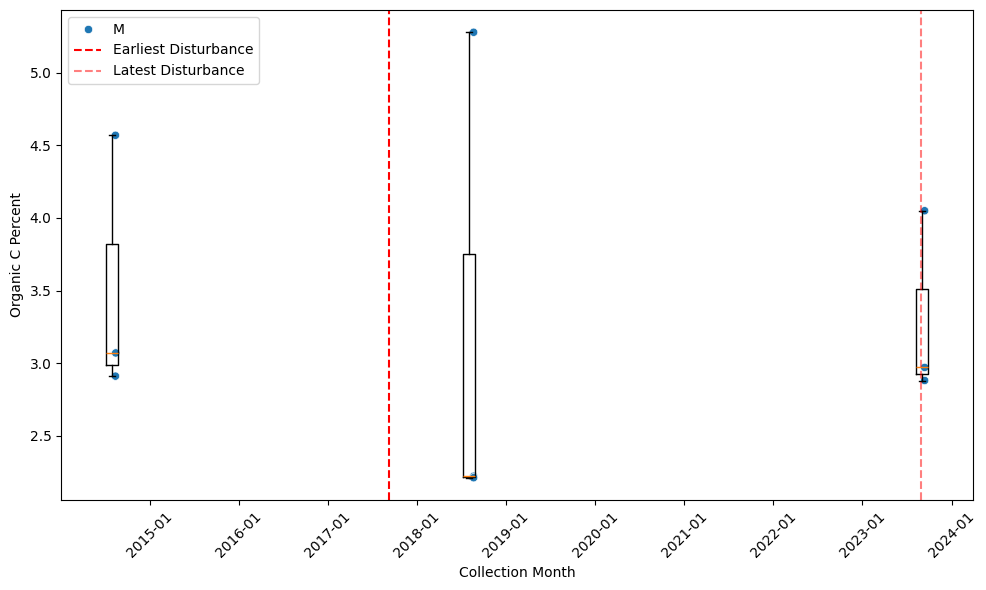

Processing plot: DSNY_043


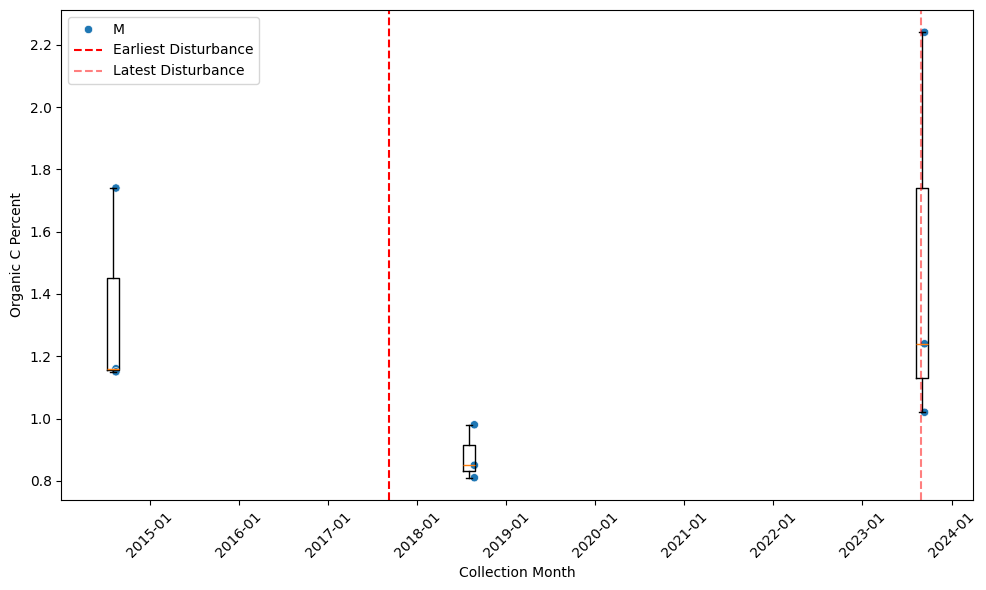

Processing plot: DSNY_044


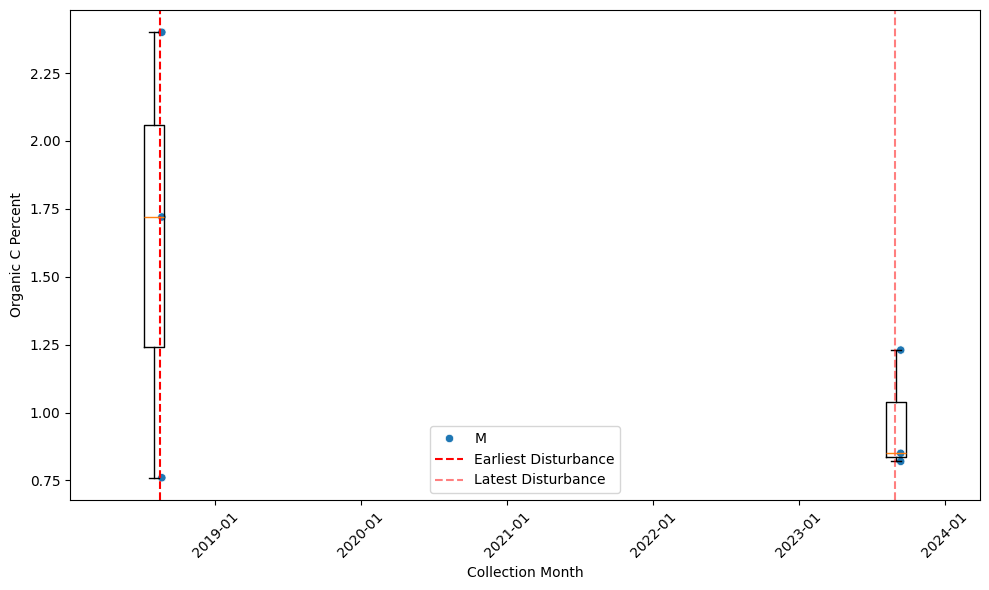

Processing plot: DSNY_042


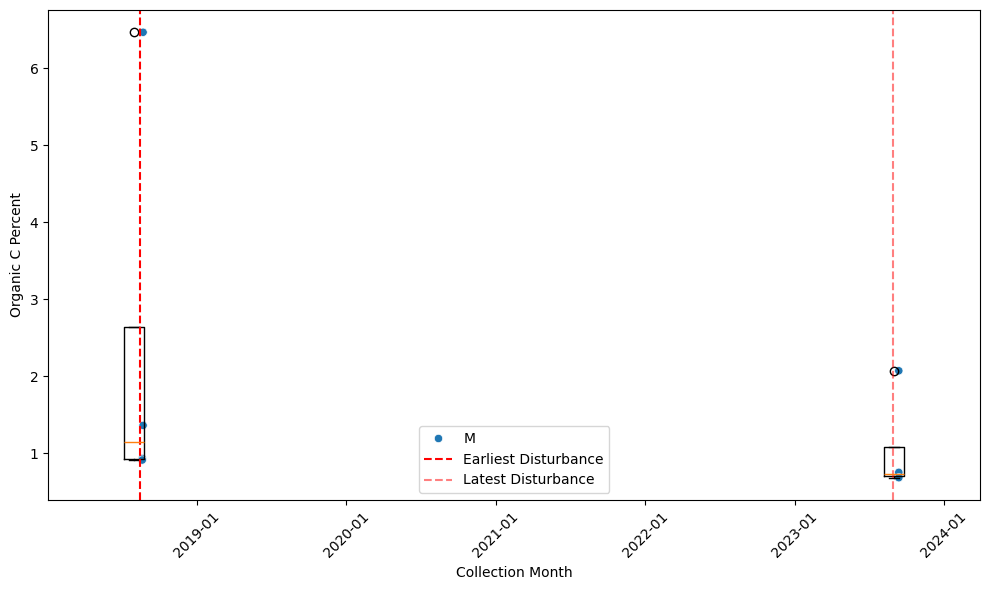

Processing plot: DSNY_006


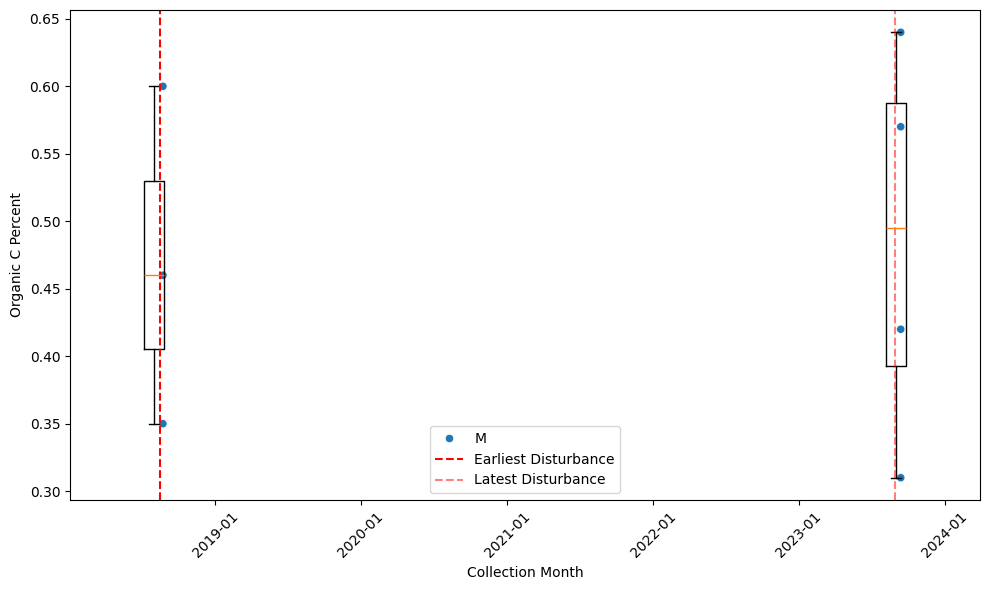

Processing plot: GUAN_002


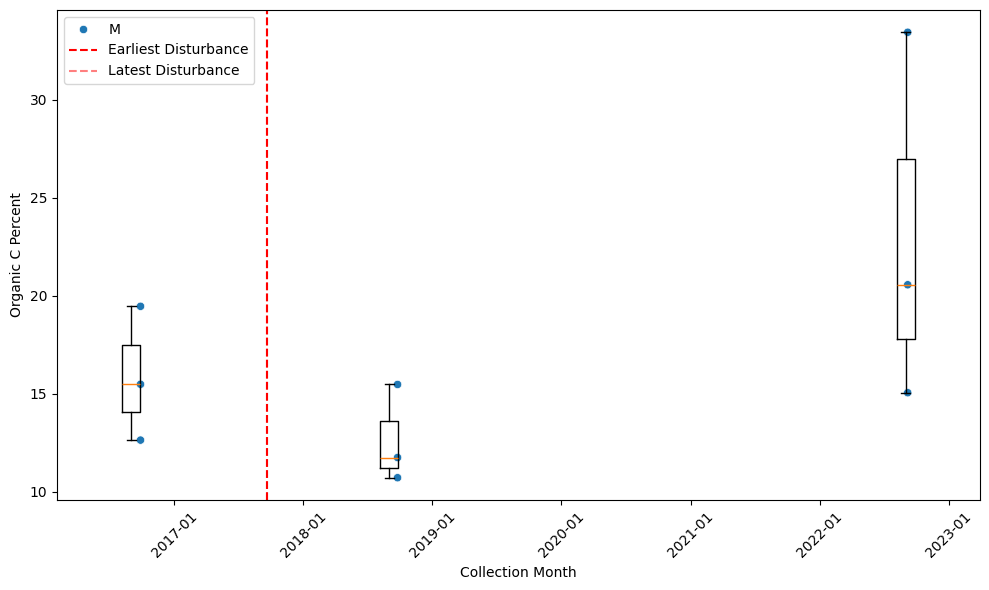

Processing plot: GUAN_004


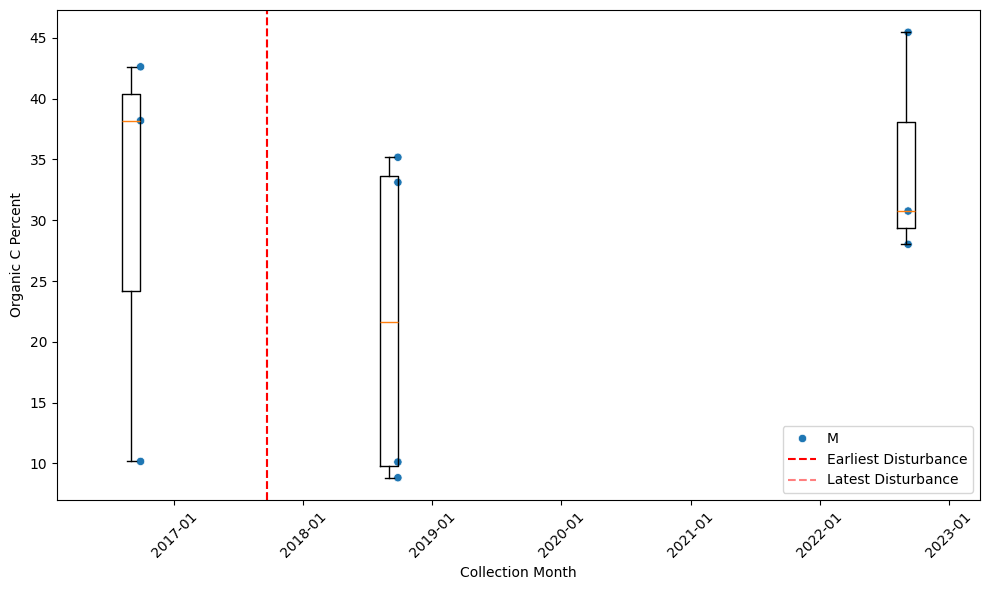

Processing plot: GUAN_001


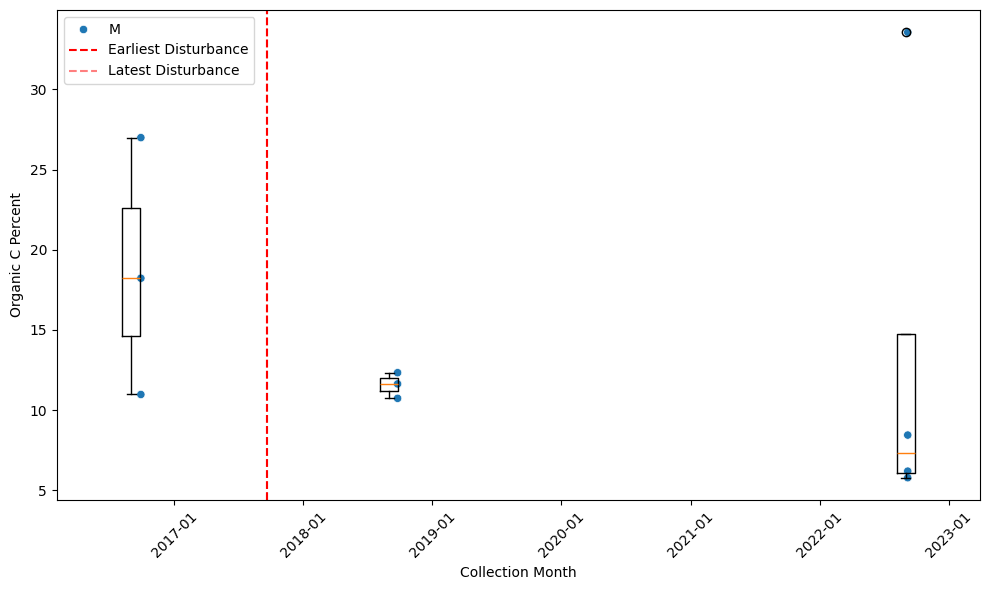

Processing plot: GUAN_007


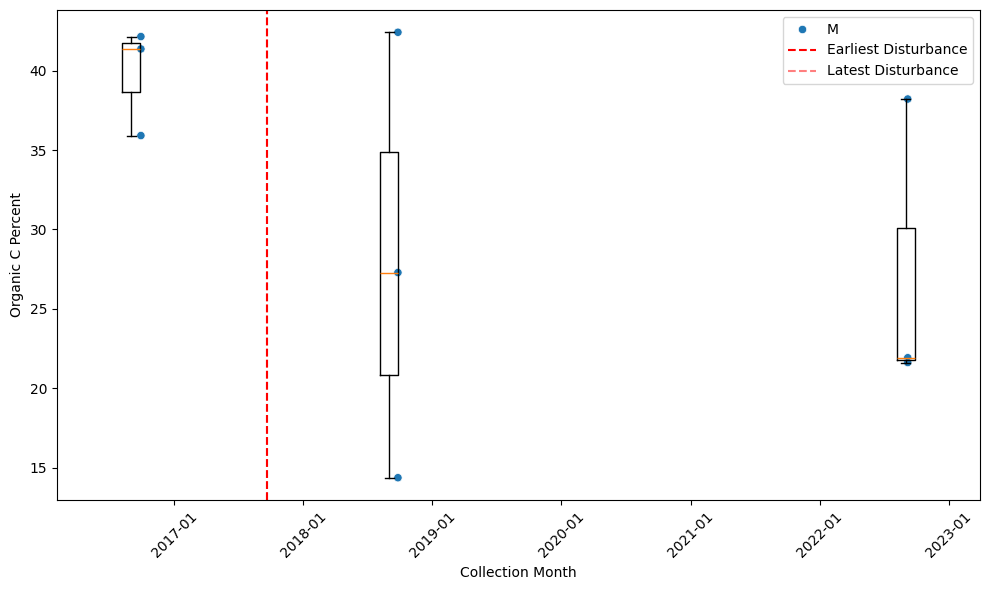

Processing plot: GUAN_003


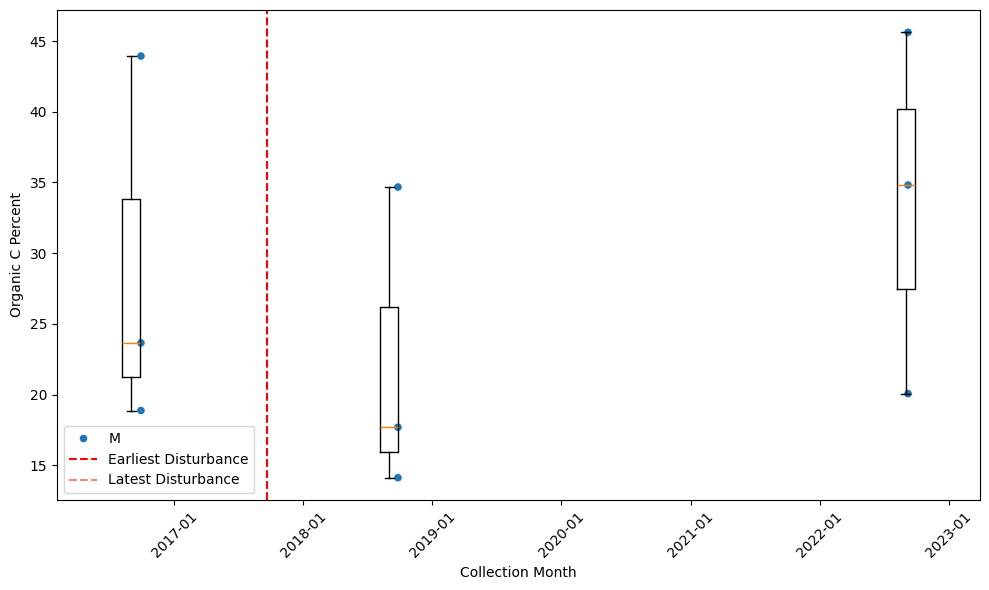

Processing plot: GUAN_049


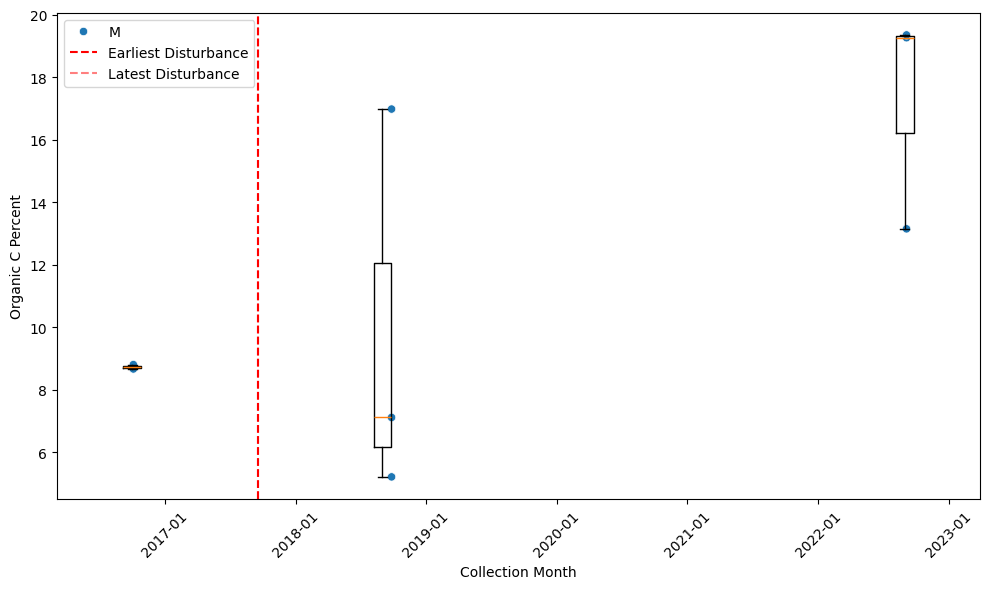

Processing plot: GUAN_048


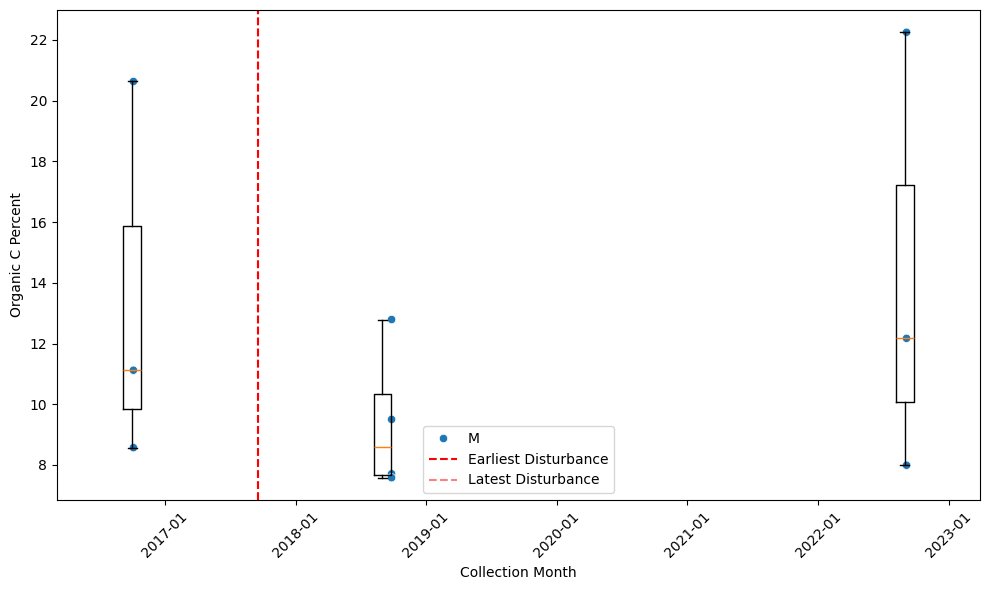

Processing plot: GUAN_042


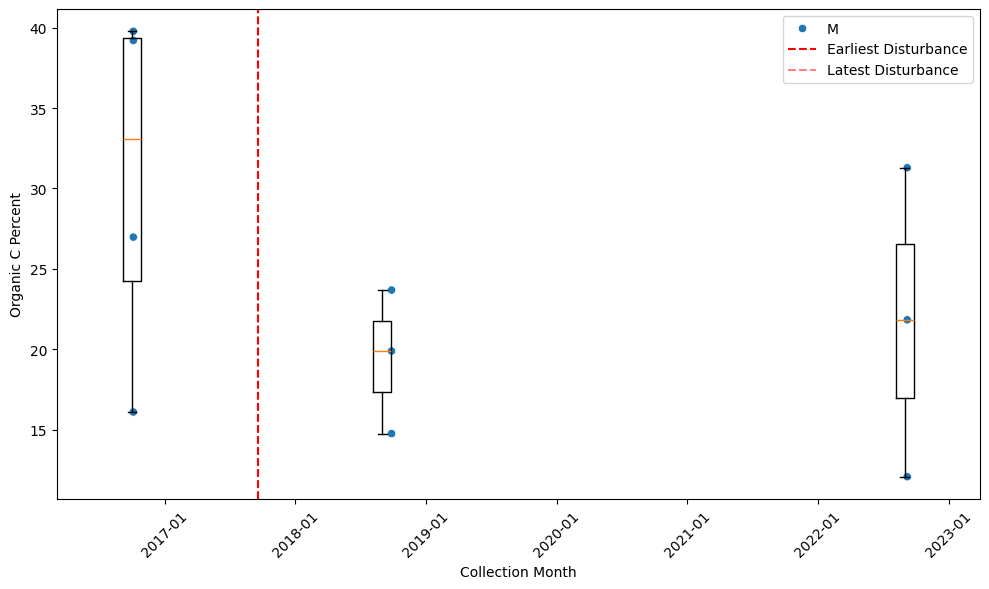

Processing plot: GUAN_006


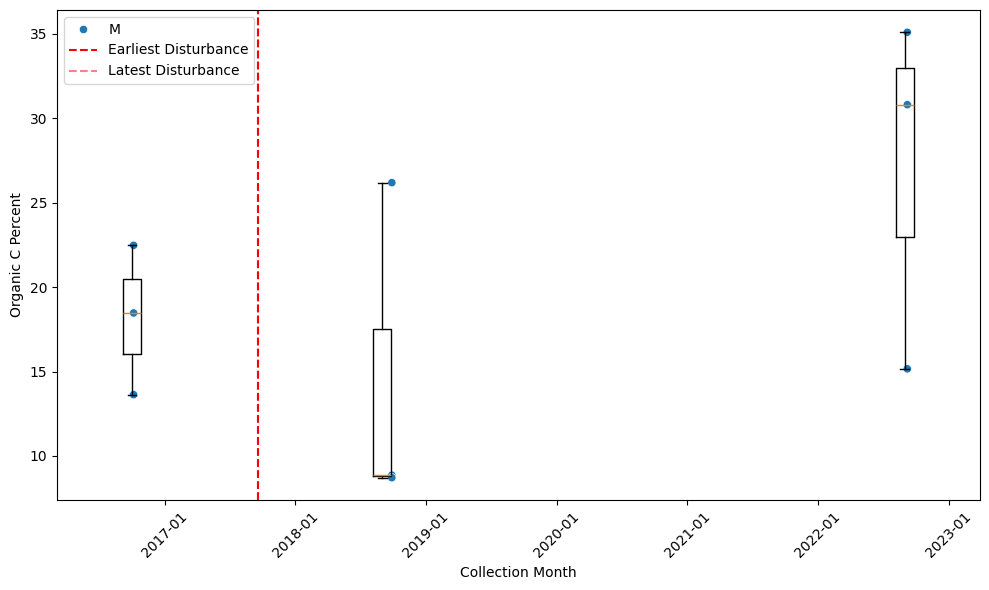

Processing plot: GUAN_043


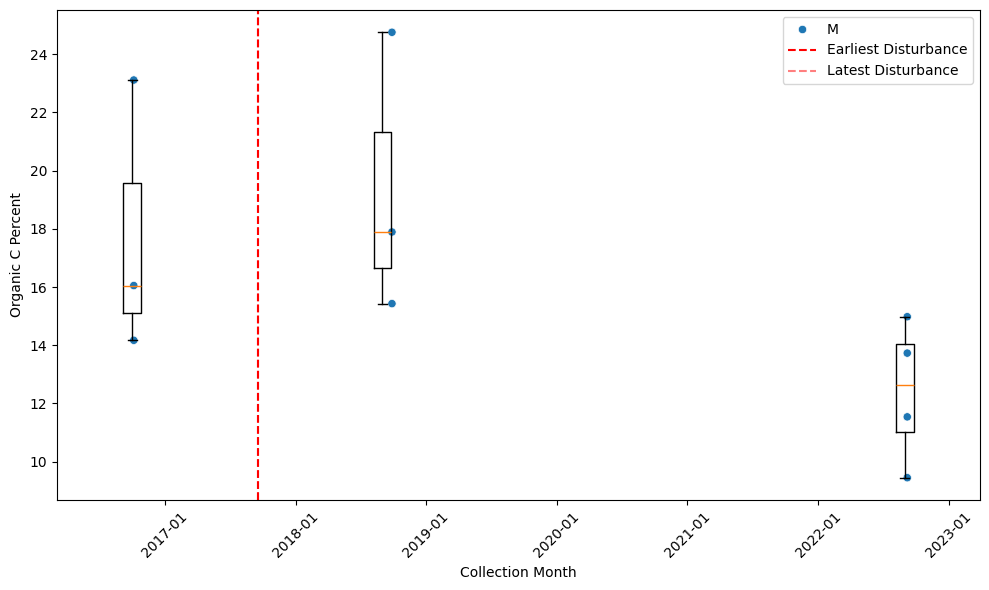

Processing plot: JERC_003


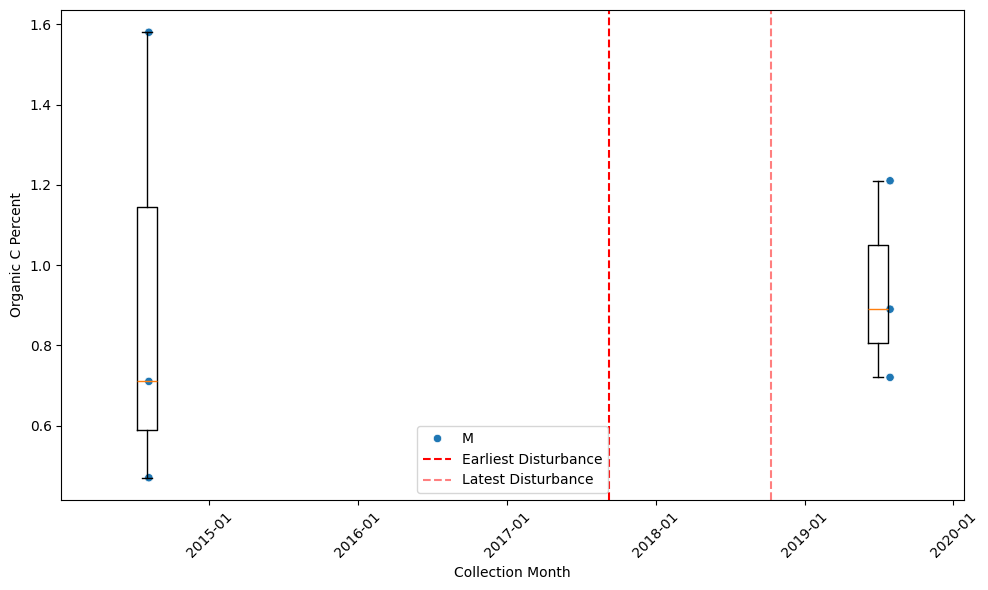

Processing plot: JERC_047


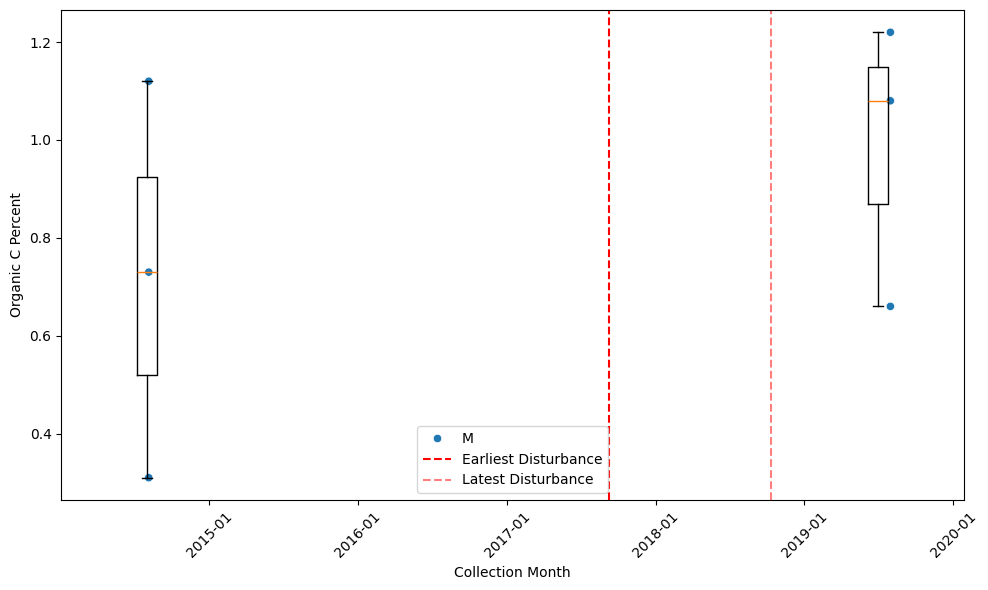

Processing plot: JERC_002


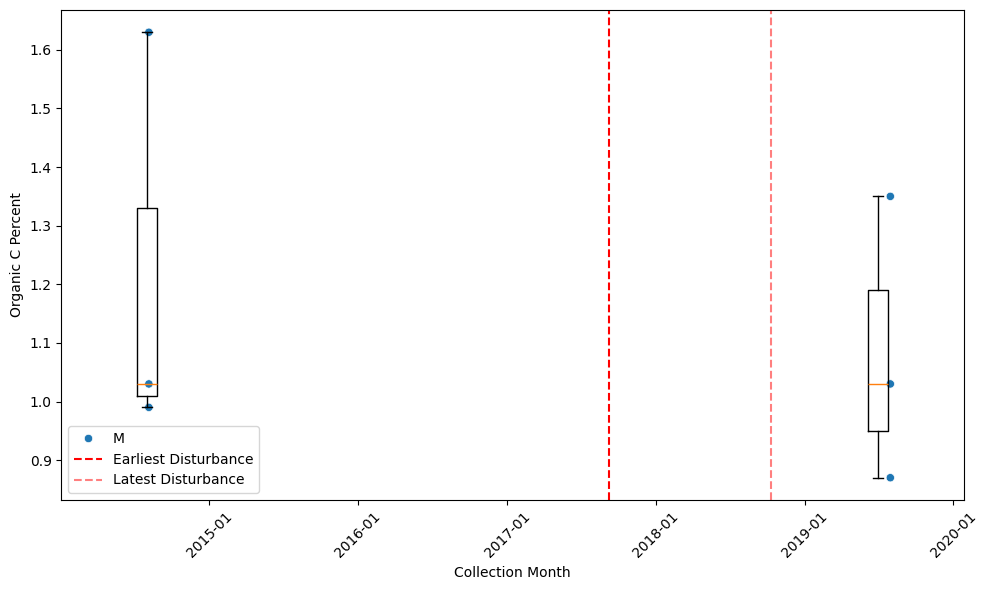

Processing plot: JERC_006


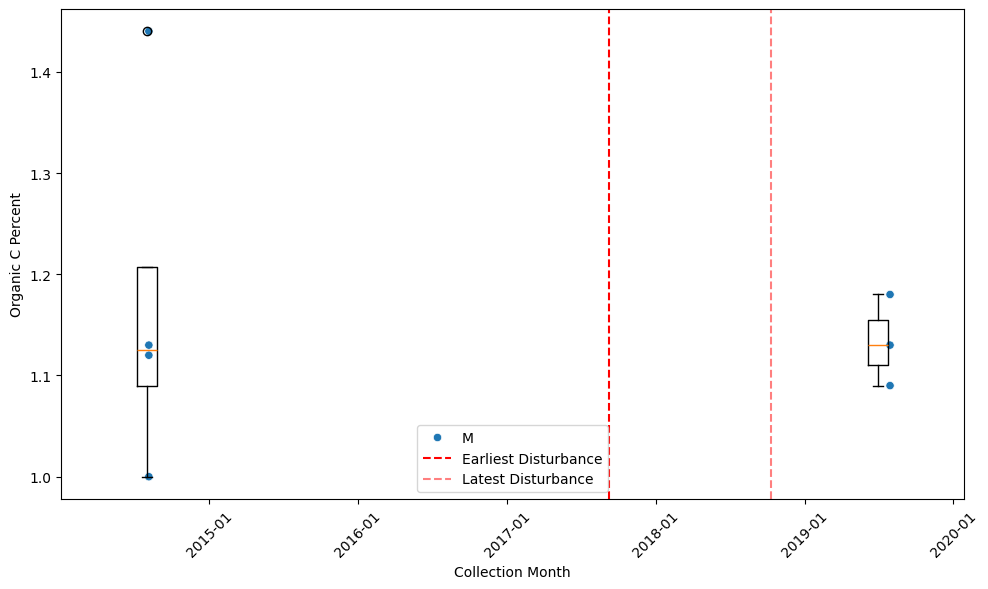

Processing plot: JERC_048


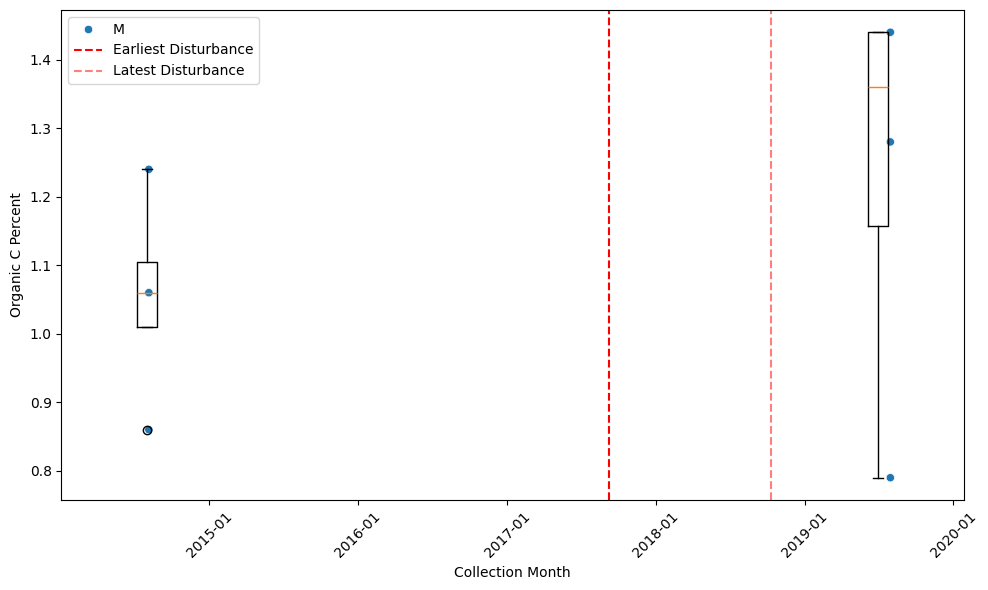

Processing plot: JERC_001


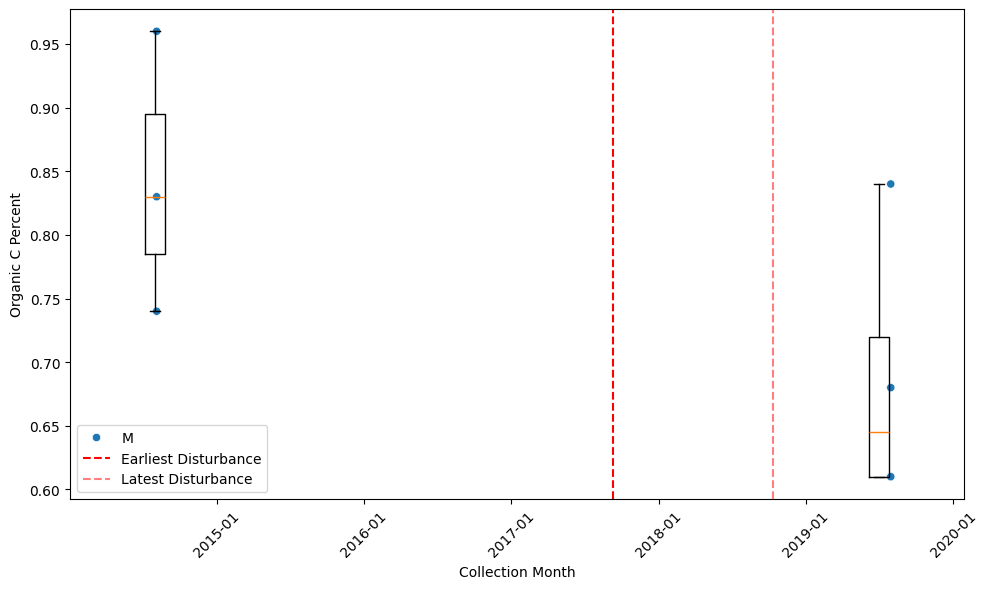

Processing plot: JERC_005


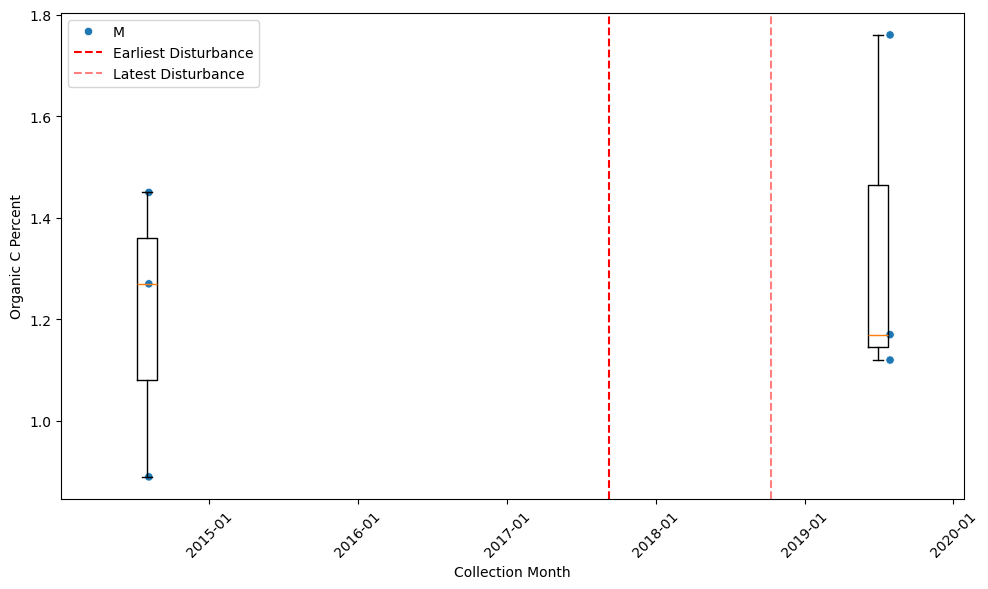

Processing plot: JERC_049


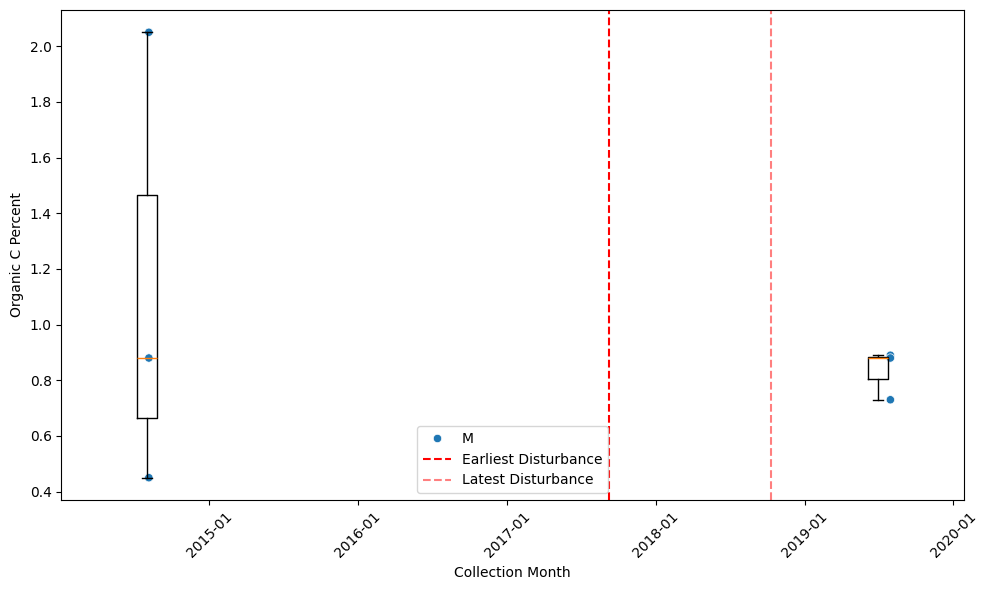

Processing plot: LENO_002


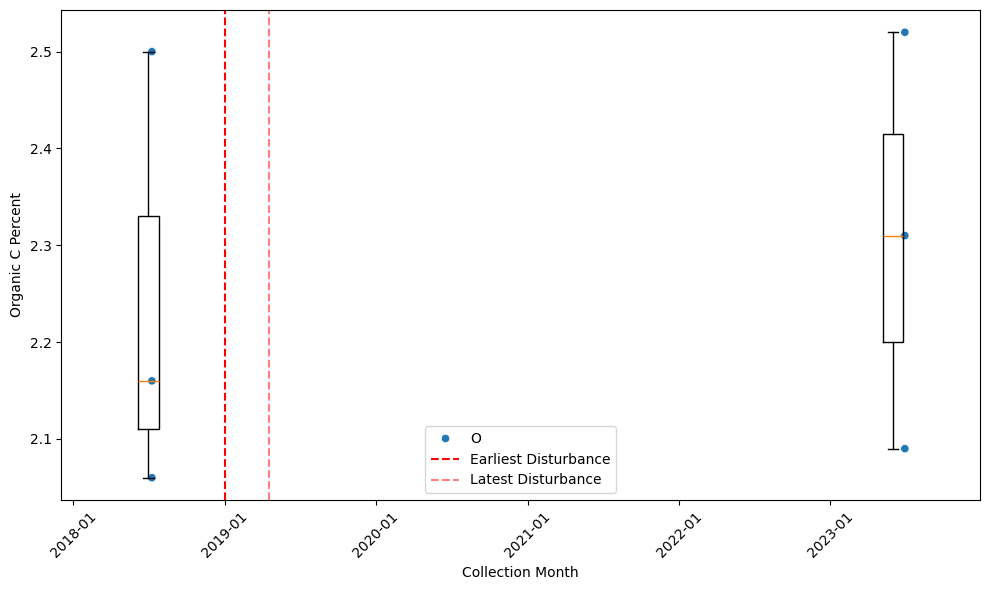

Processing plot: LENO_061


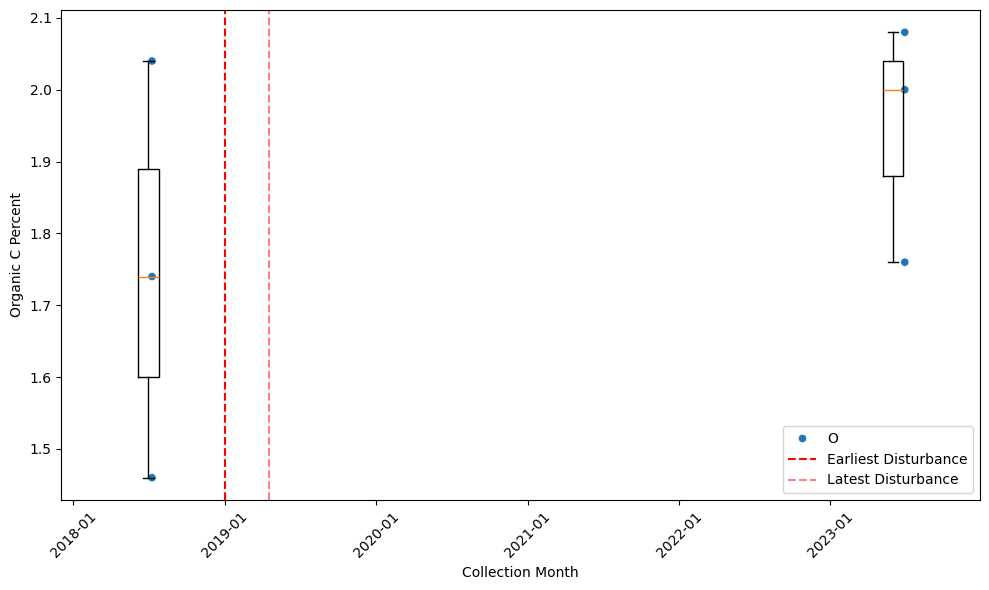

Processing plot: LENO_003


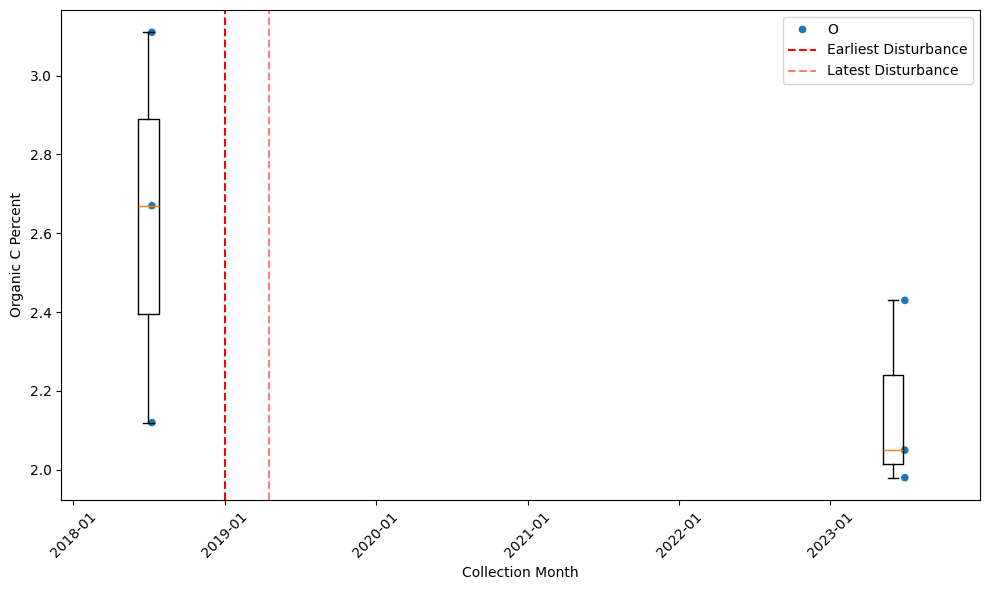

Processing plot: LENO_062


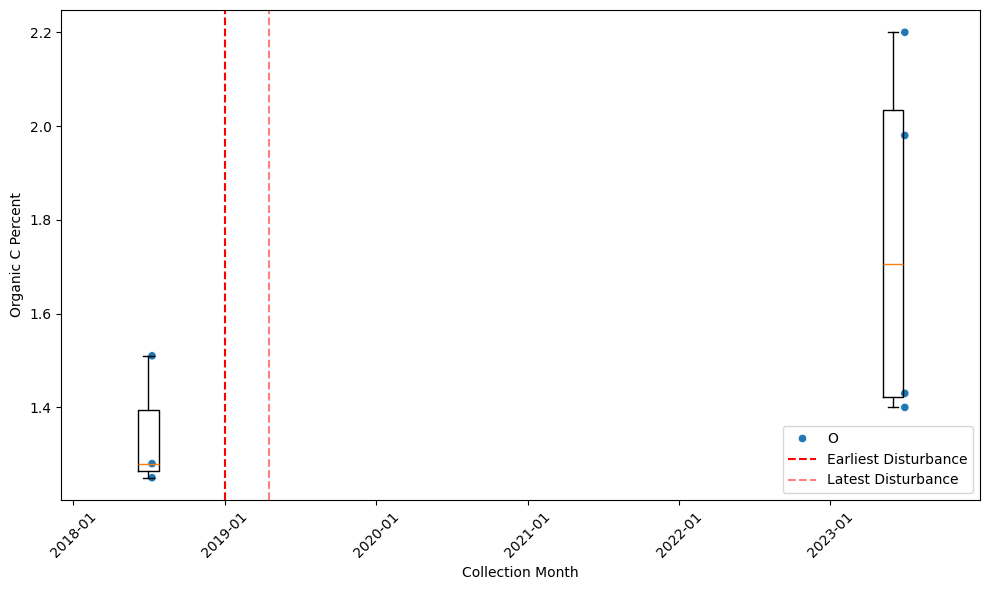

Processing plot: LENO_063


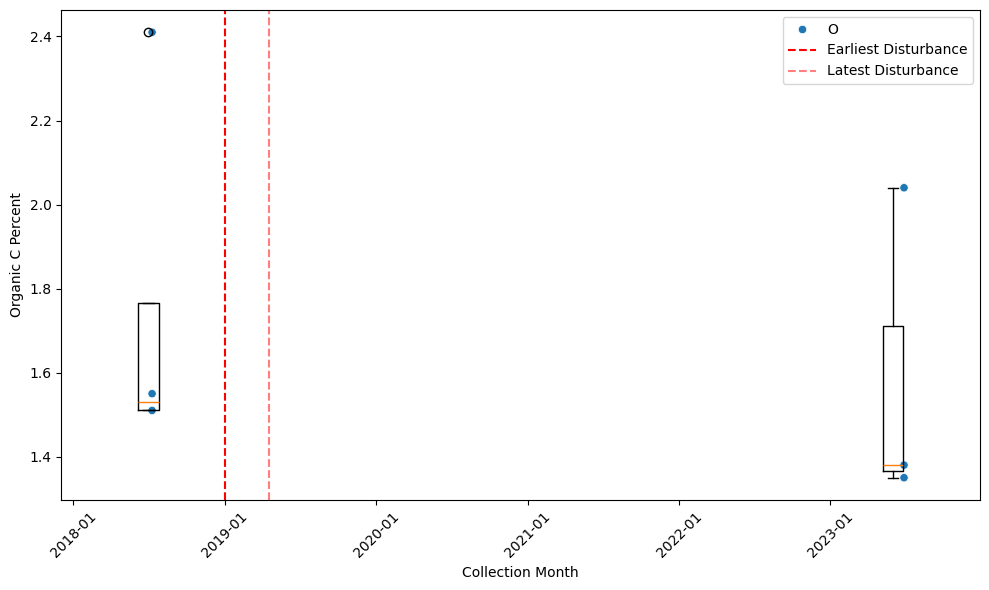

Processing plot: LENO_006


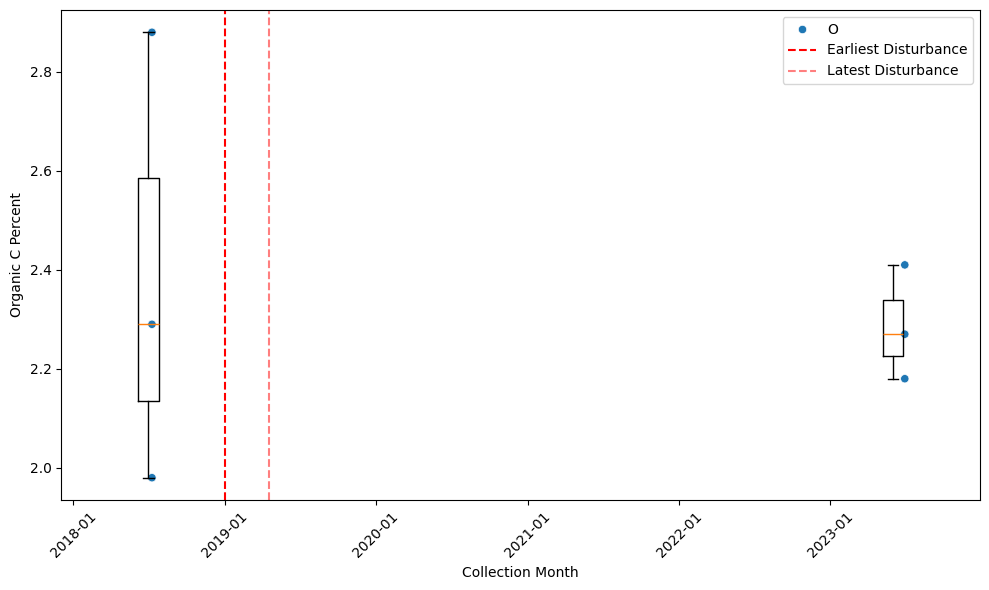

Processing plot: LENO_064


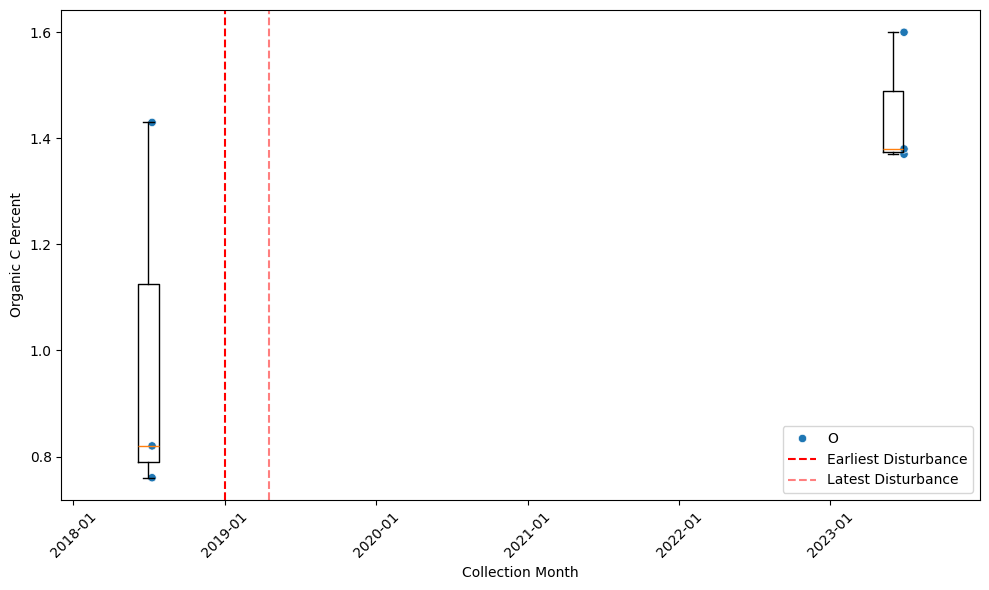

Processing plot: LENO_004


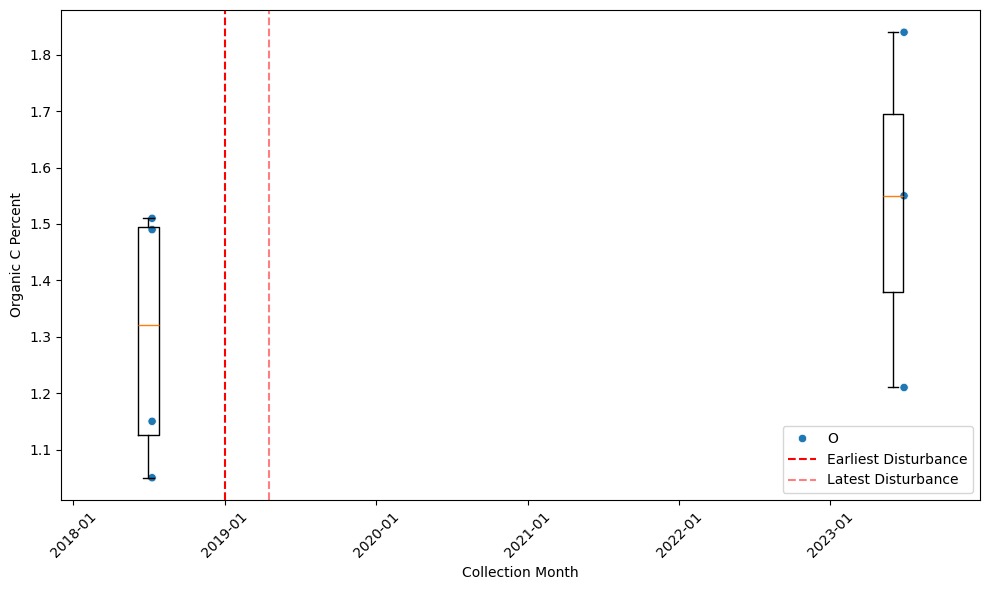

Processing plot: LENO_005


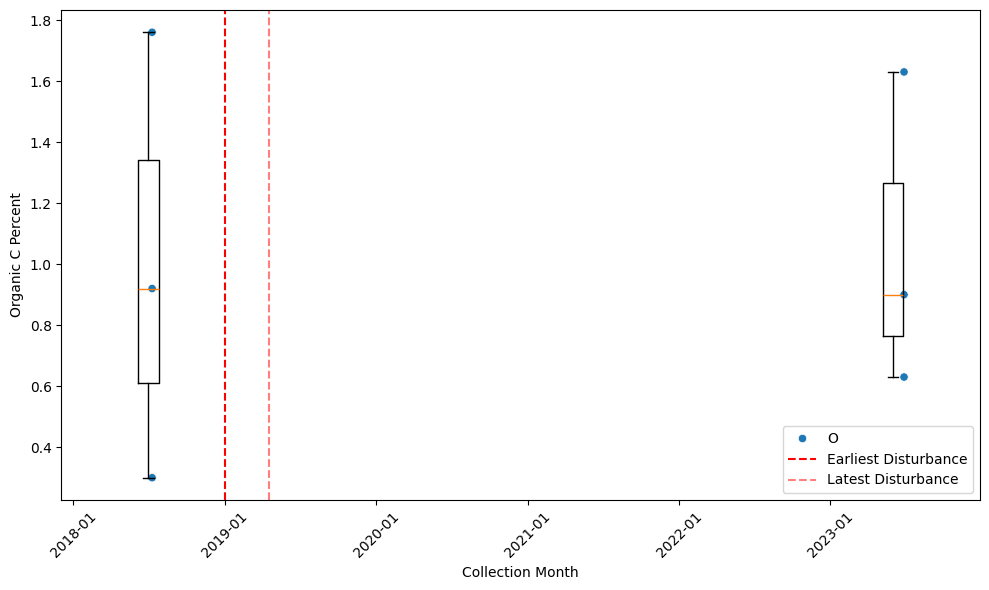

Processing plot: LENO_001


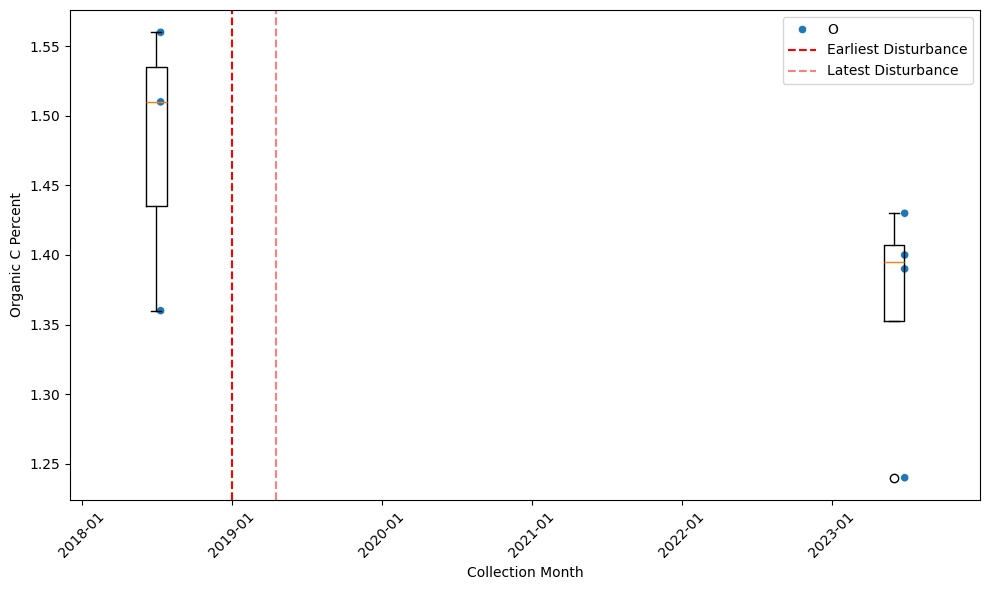

Processing plot: MLBS_005


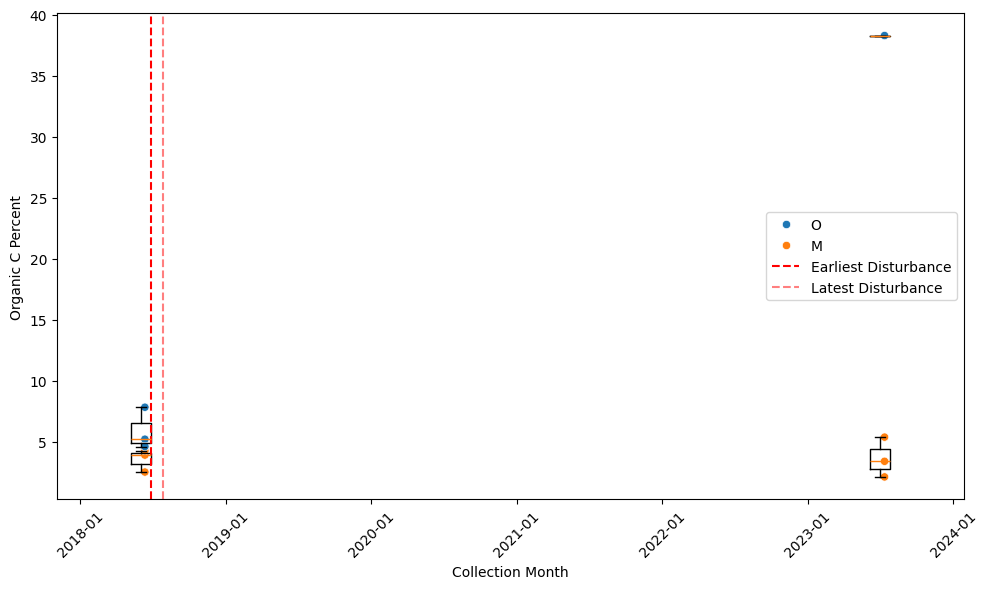

Processing plot: MLBS_001


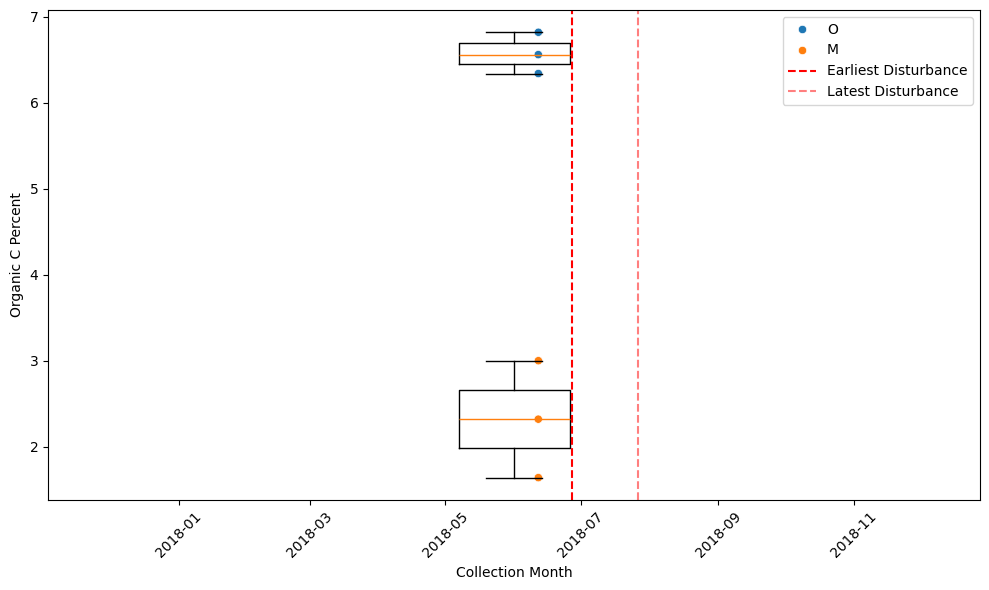

Processing plot: MLBS_003


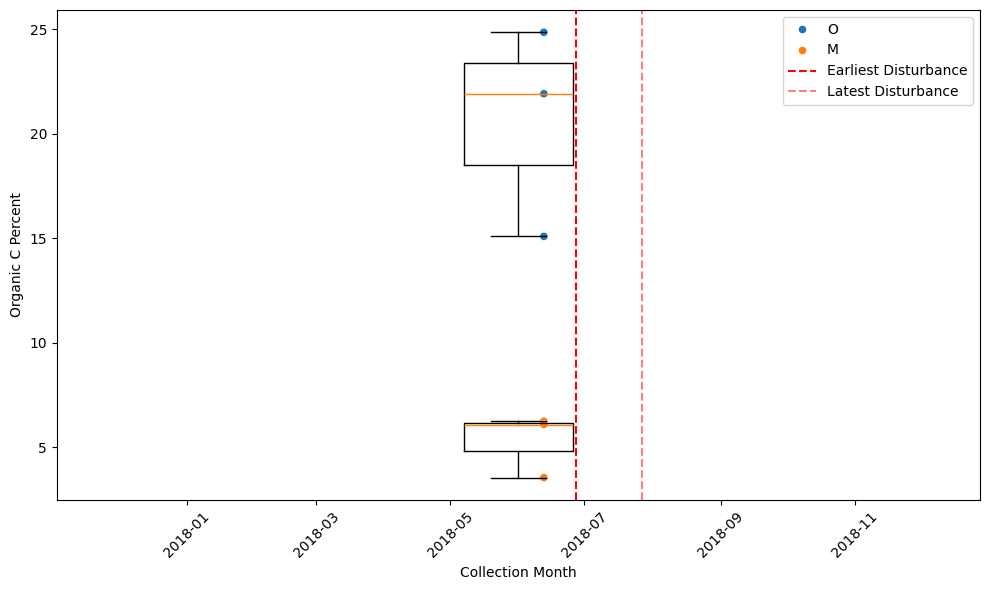

Processing plot: MLBS_002


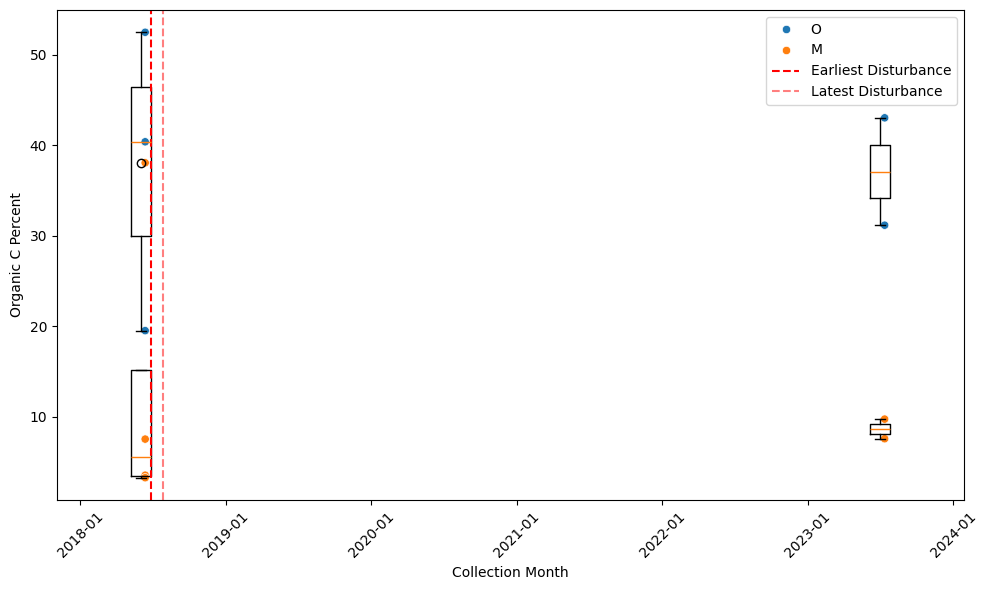

Processing plot: MLBS_064


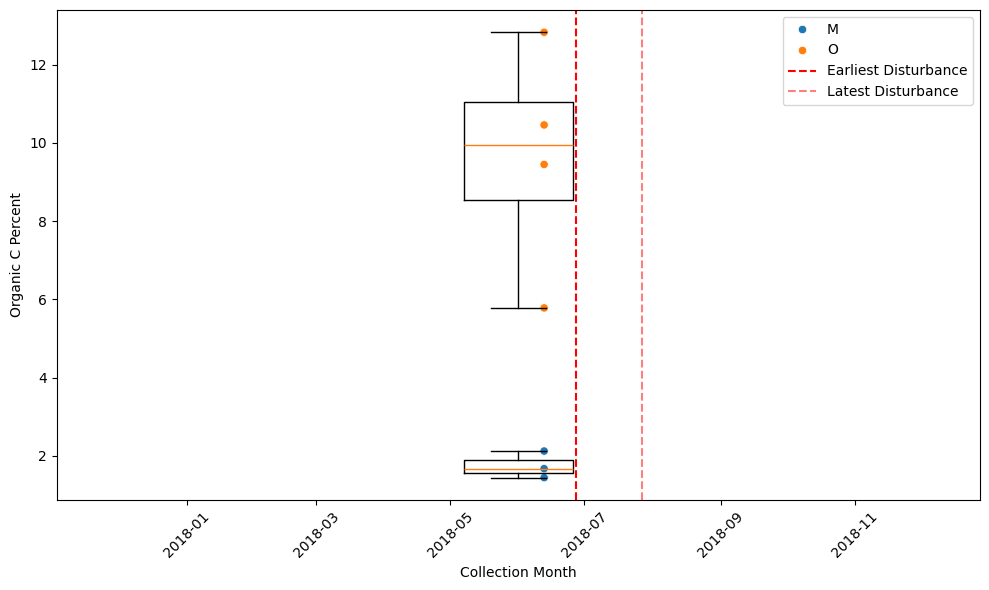

Processing plot: MLBS_061


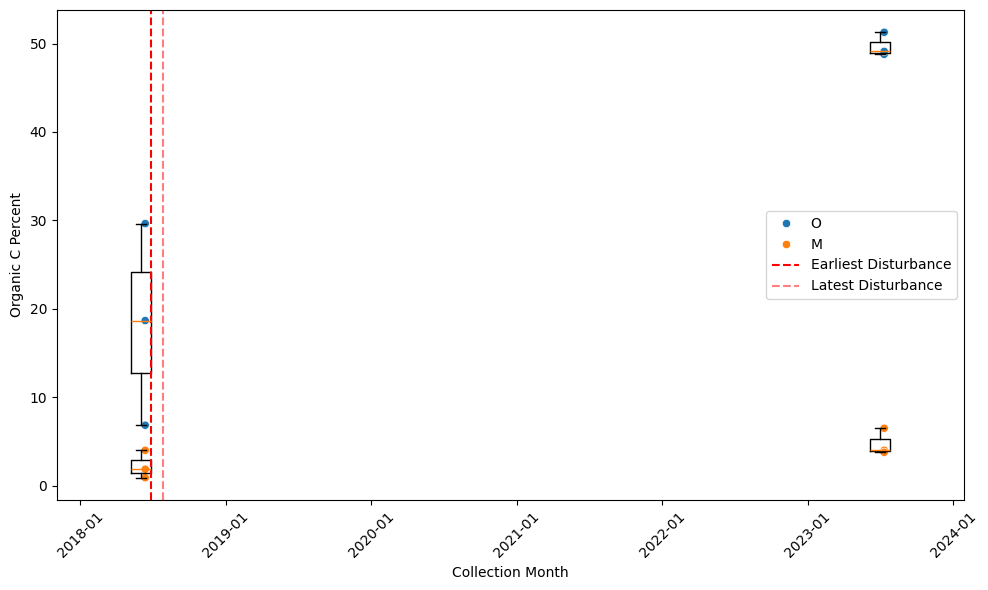

Processing plot: MLBS_006


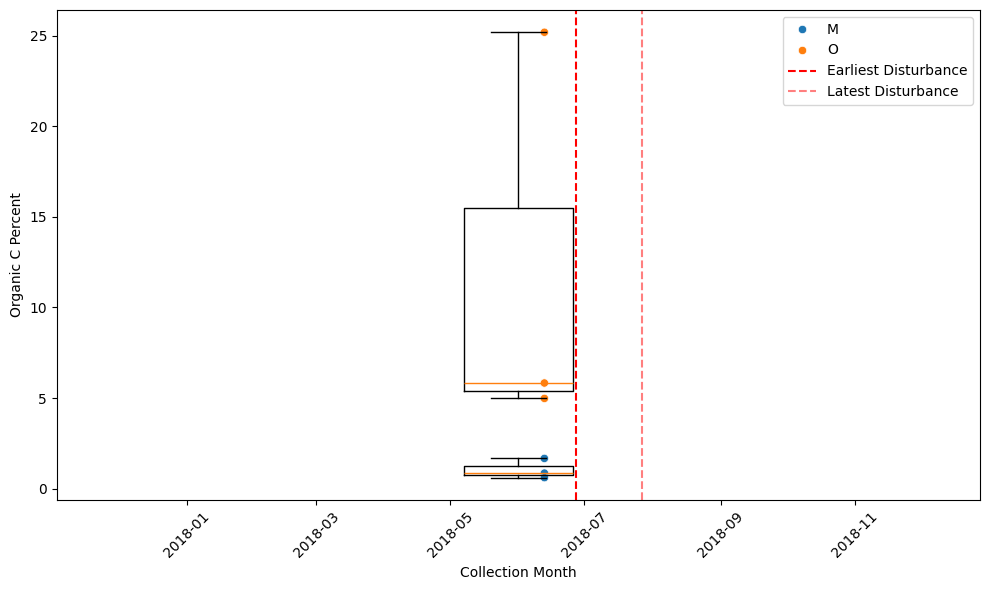

Processing plot: MLBS_007


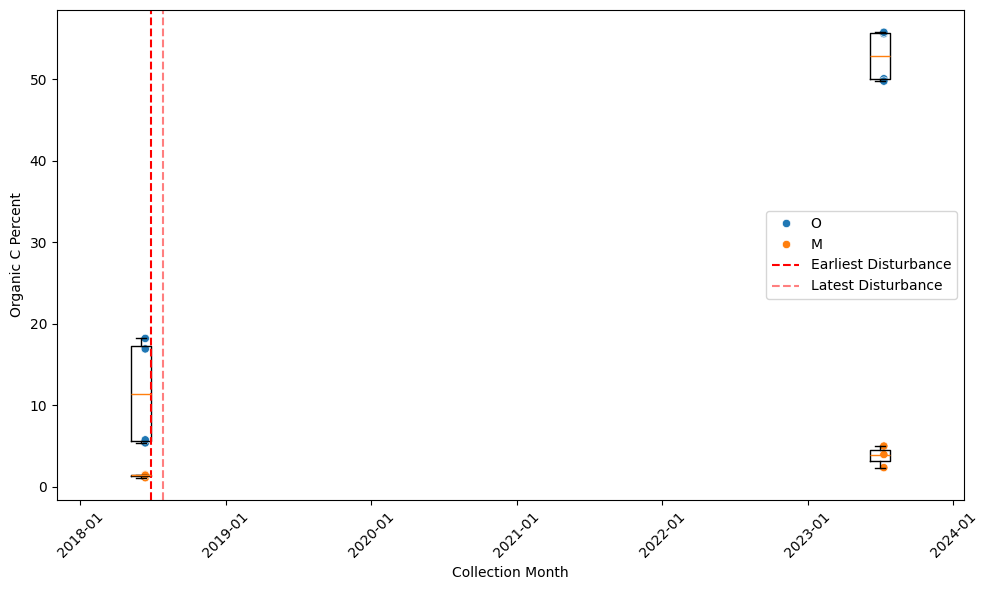

Processing plot: MLBS_067


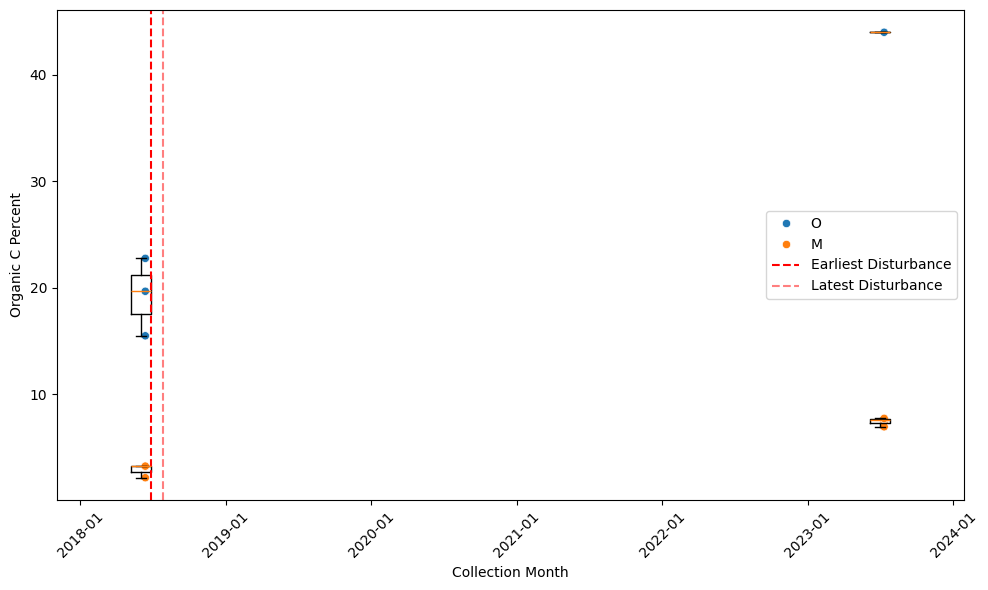

Processing plot: MLBS_063


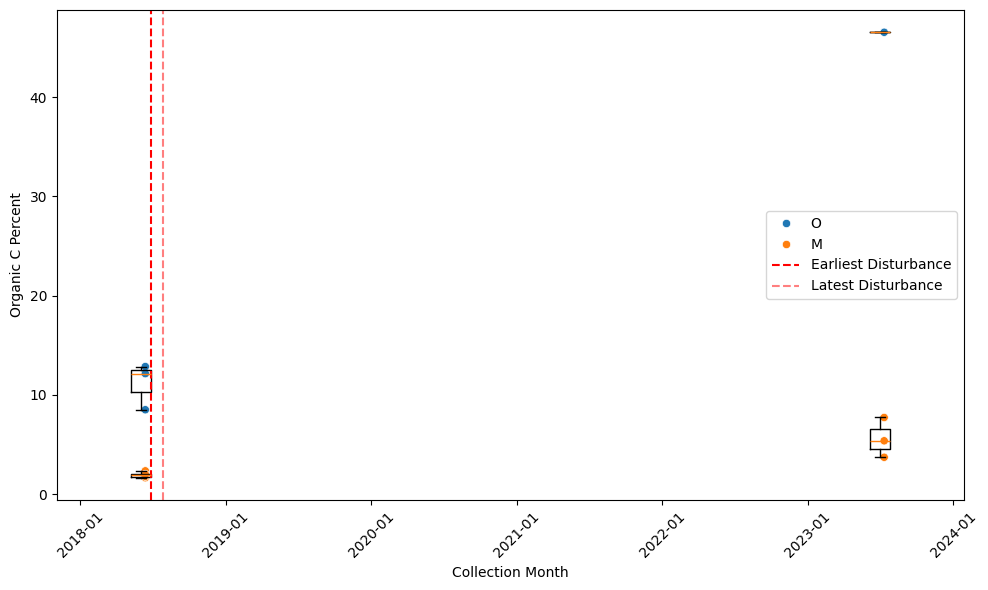

Processing plot: MOAB_044


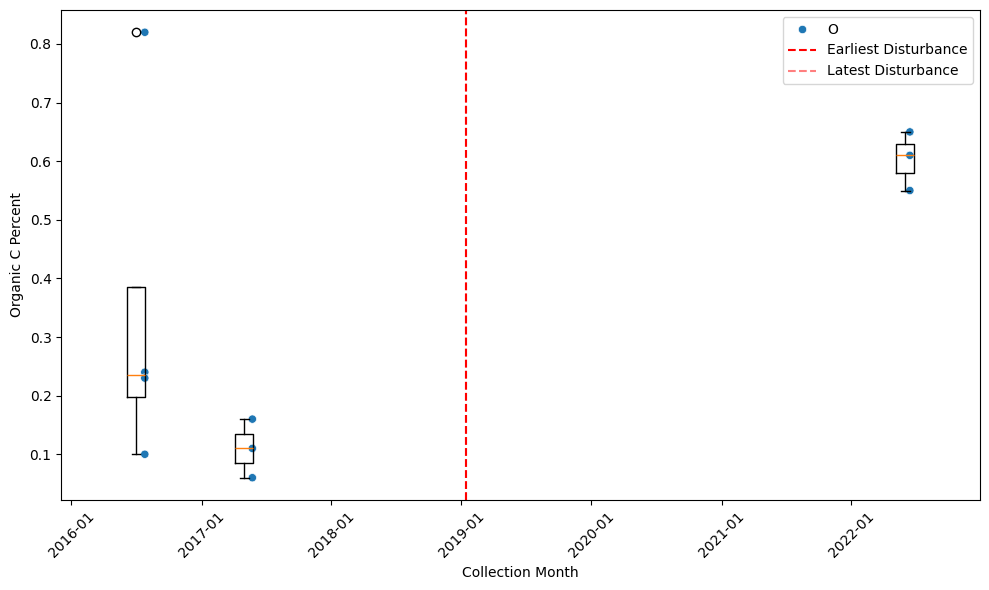

Processing plot: MOAB_045


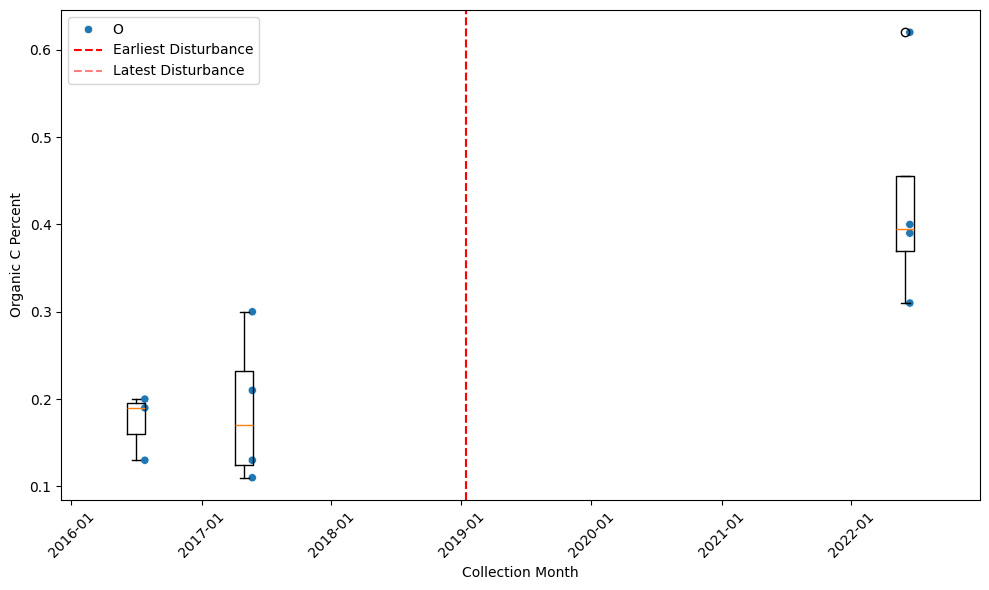

Processing plot: MOAB_047


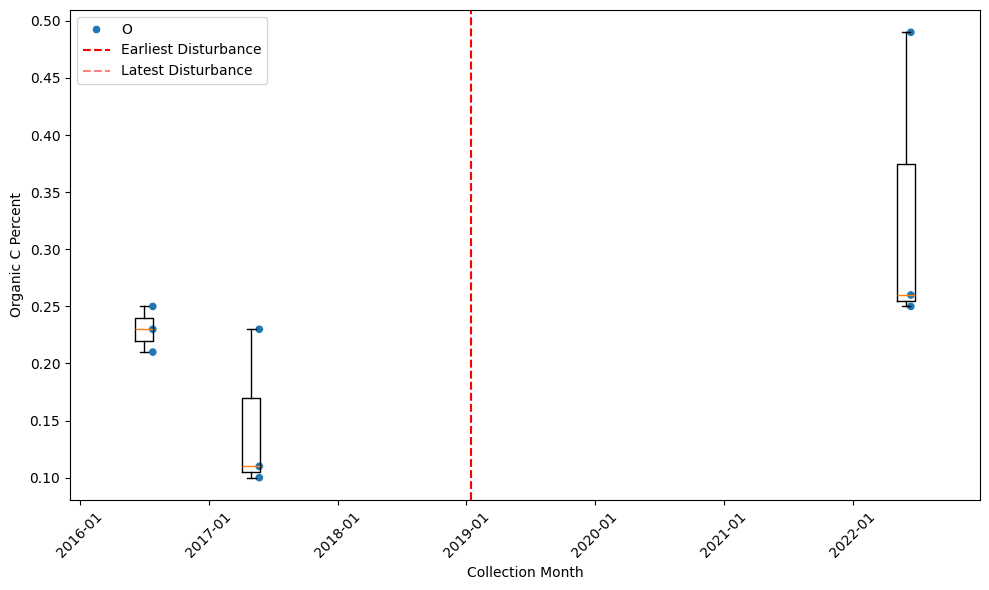

Processing plot: MOAB_005


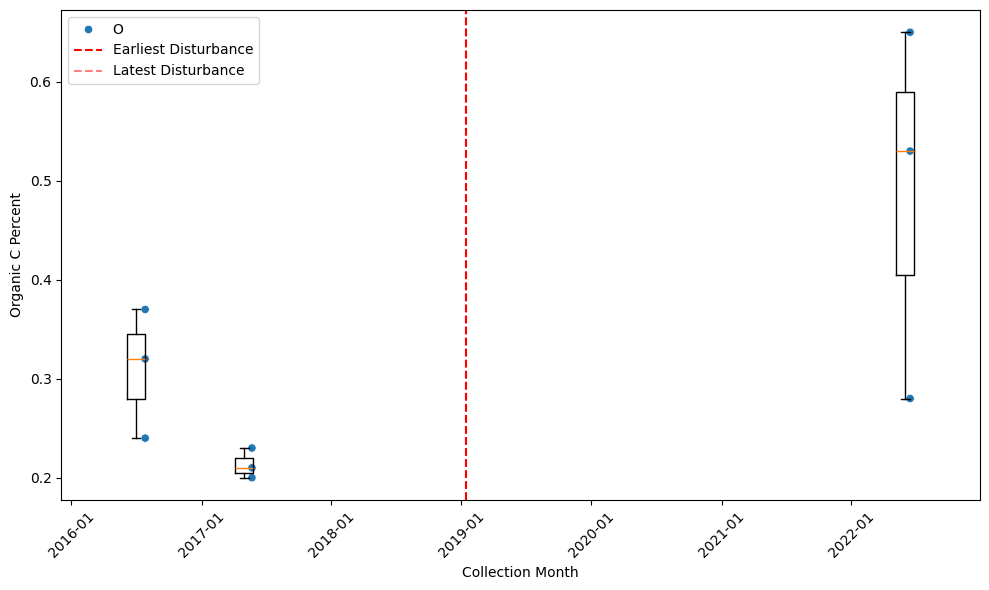

Processing plot: MOAB_002


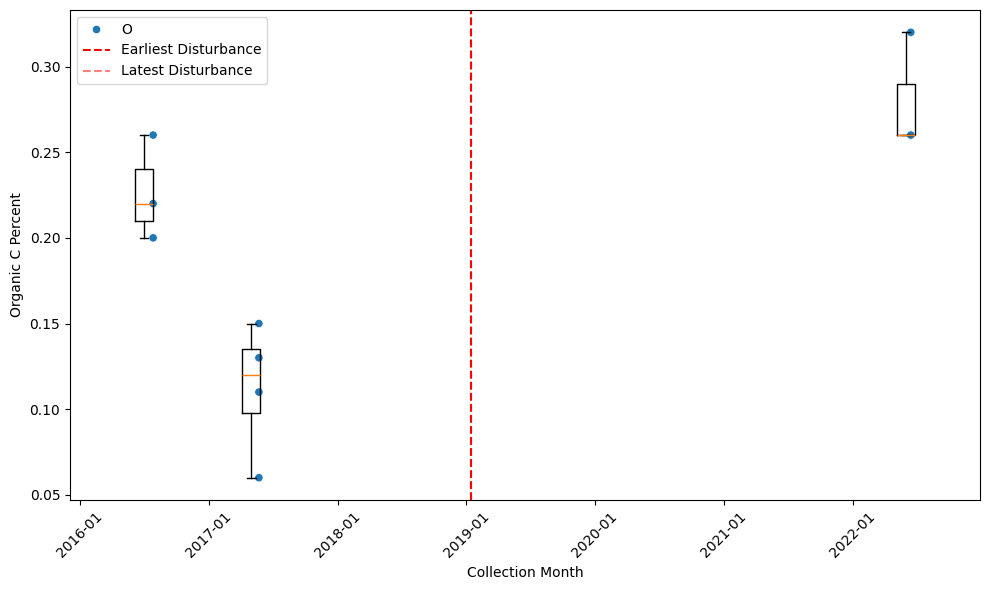

Processing plot: MOAB_046


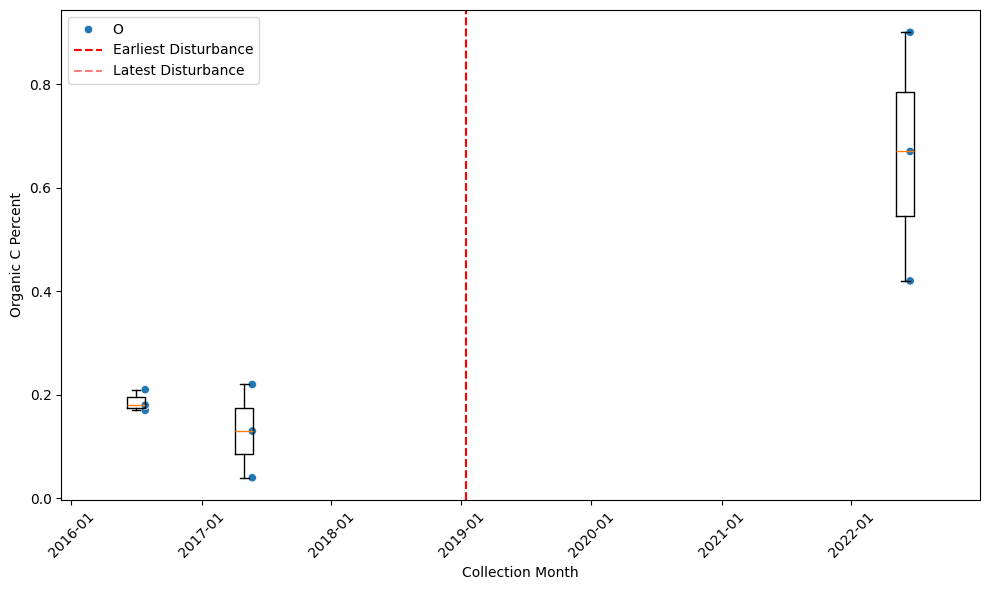

Processing plot: MOAB_003


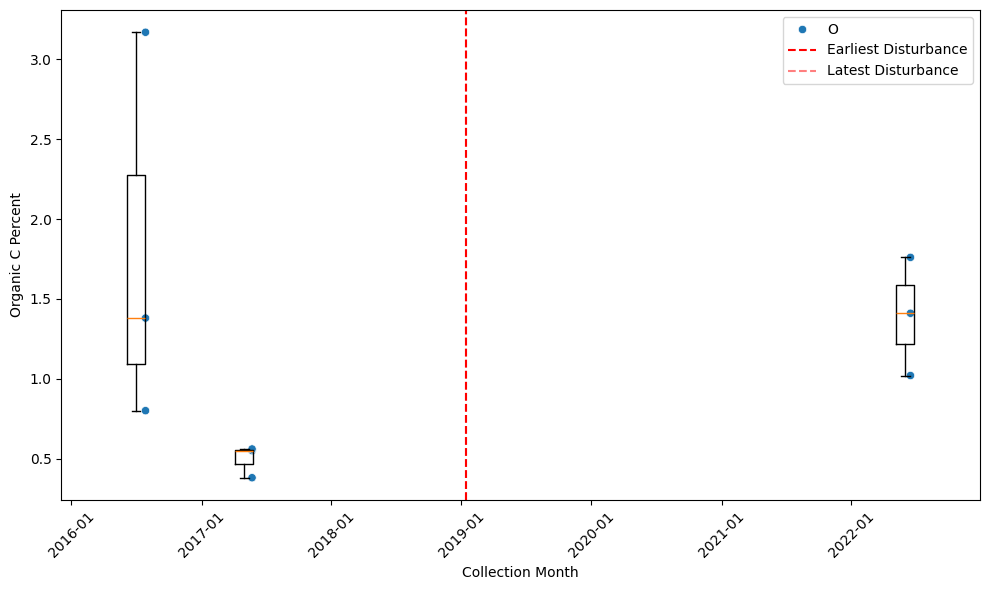

Processing plot: MOAB_001


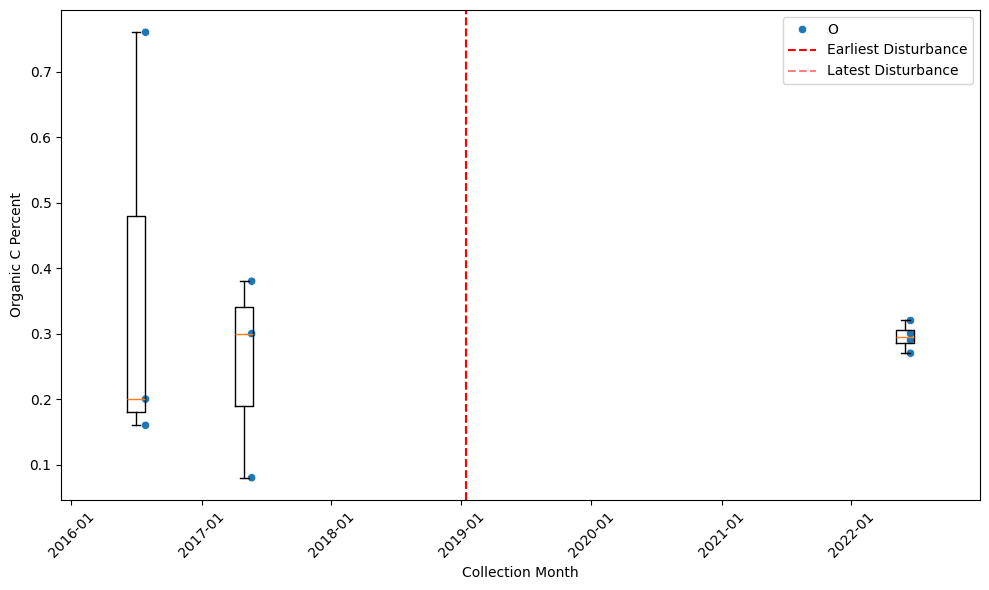

Processing plot: MOAB_006


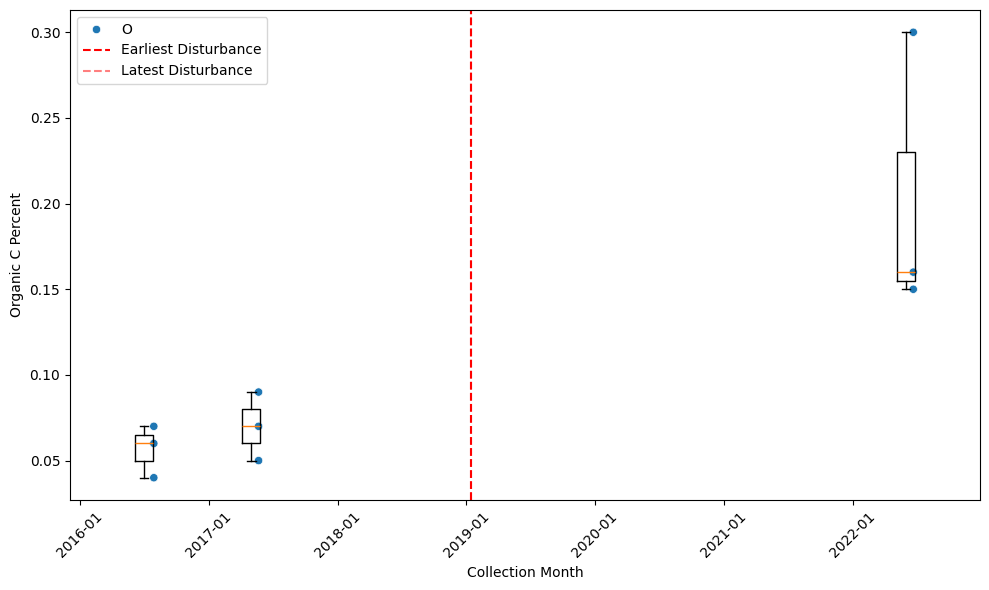

Processing plot: MOAB_004


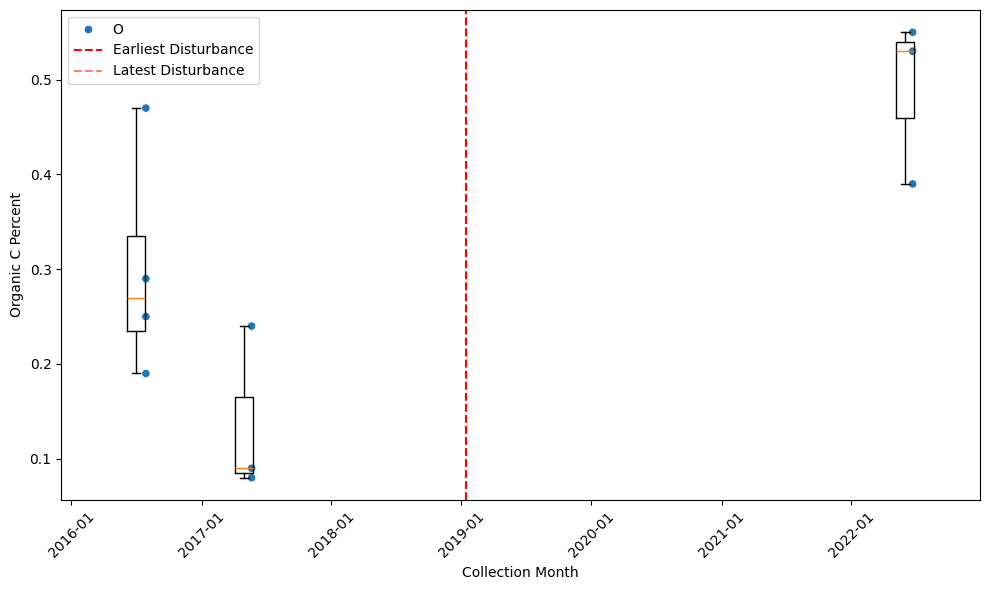

Processing plot: ORNL_002


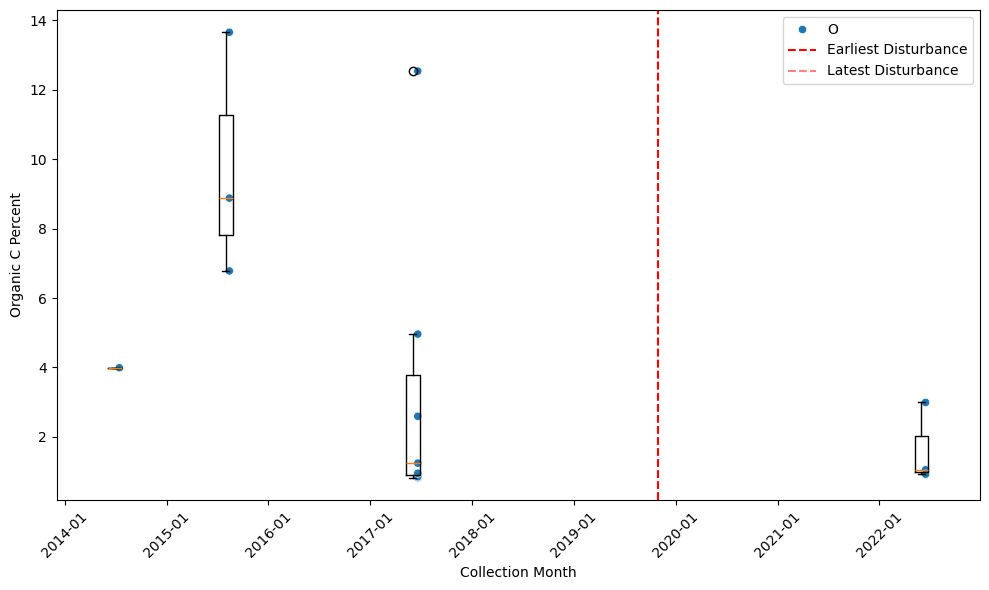

Processing plot: ORNL_003


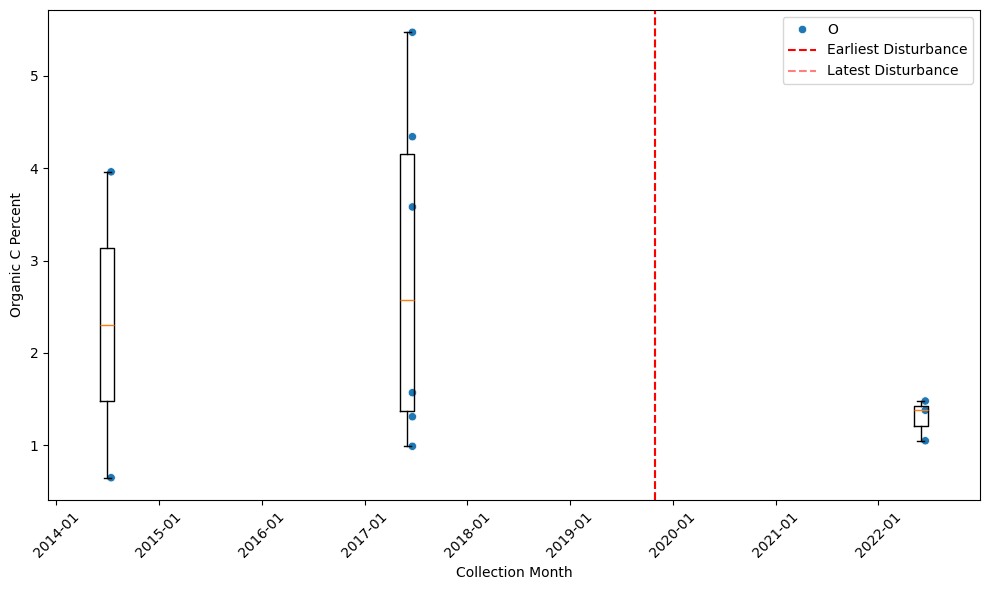

Processing plot: ORNL_027


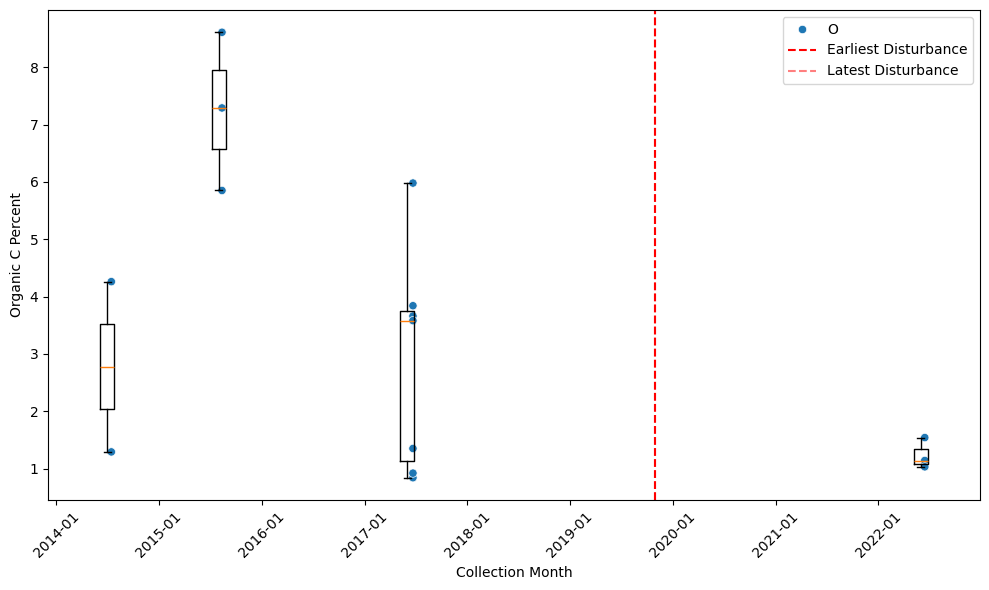

Processing plot: ORNL_001


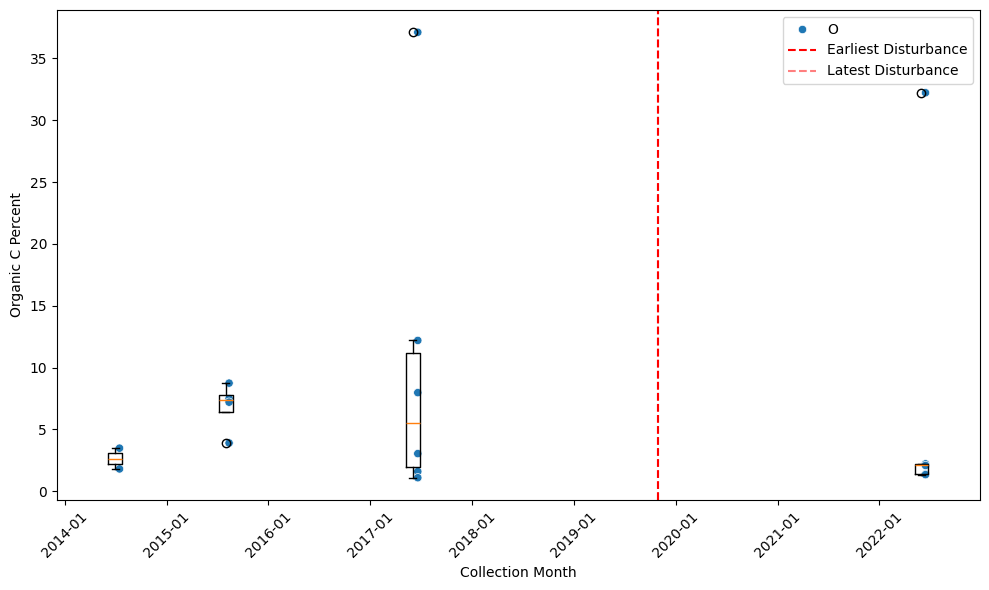

Processing plot: ORNL_043


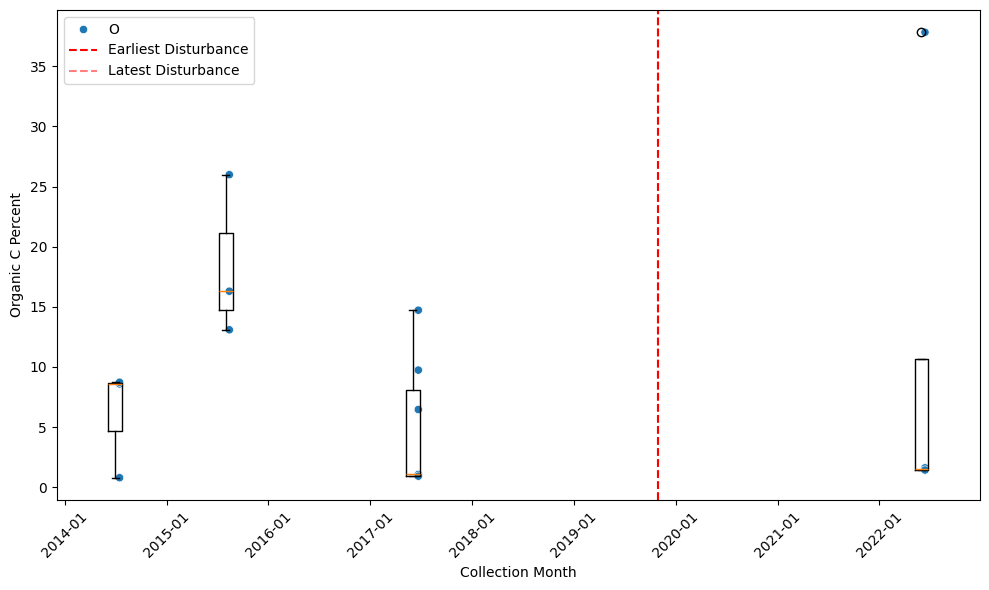

Processing plot: ORNL_046


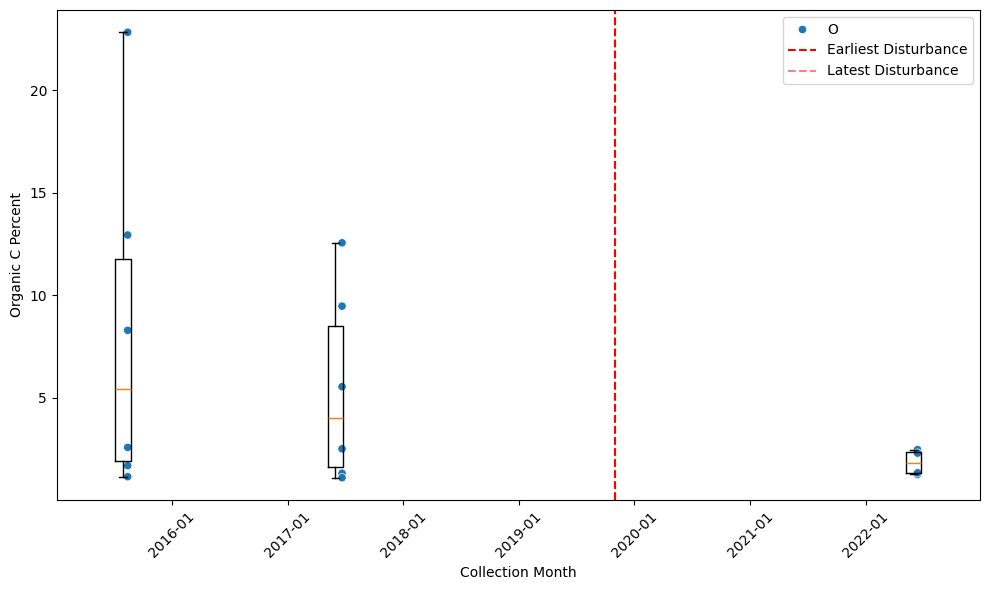

Processing plot: ORNL_053


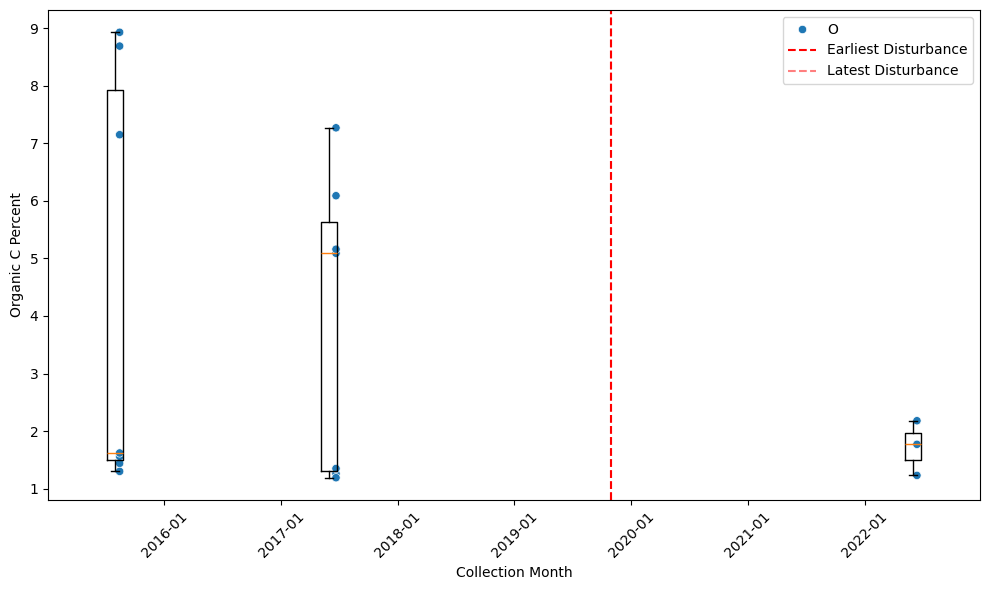

Processing plot: ORNL_049


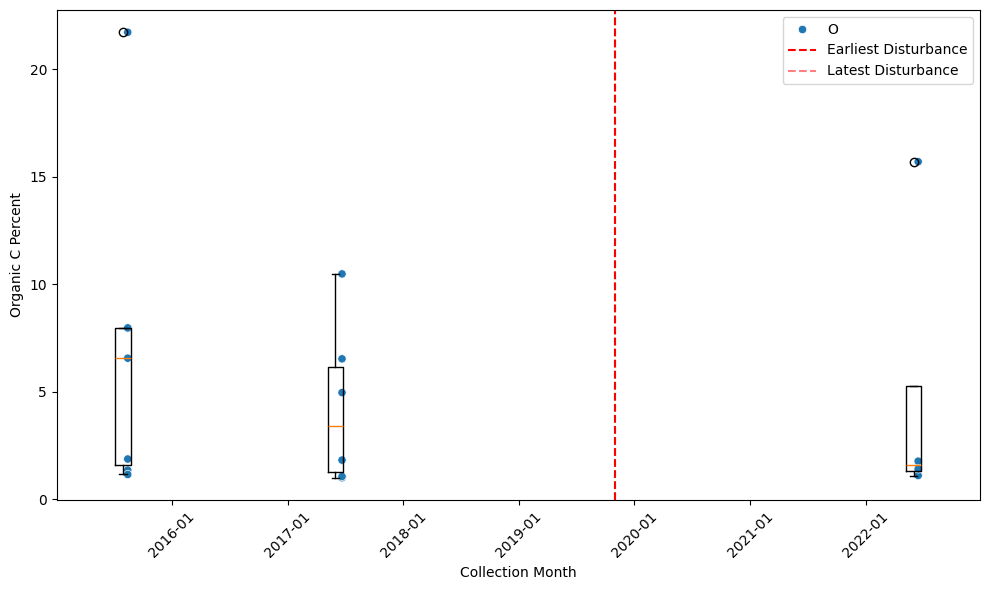

Processing plot: OSBS_027


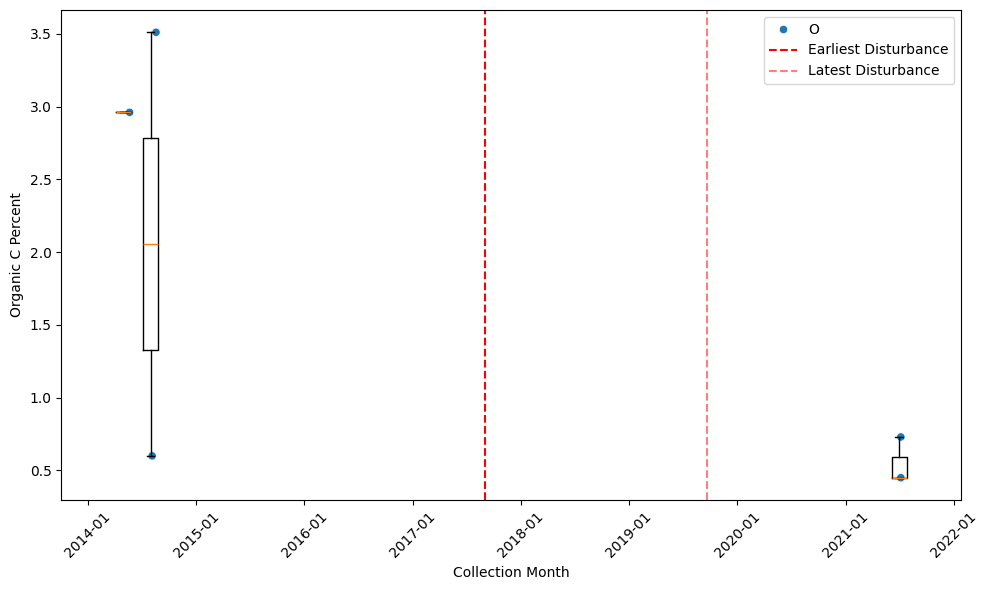

Processing plot: OSBS_004


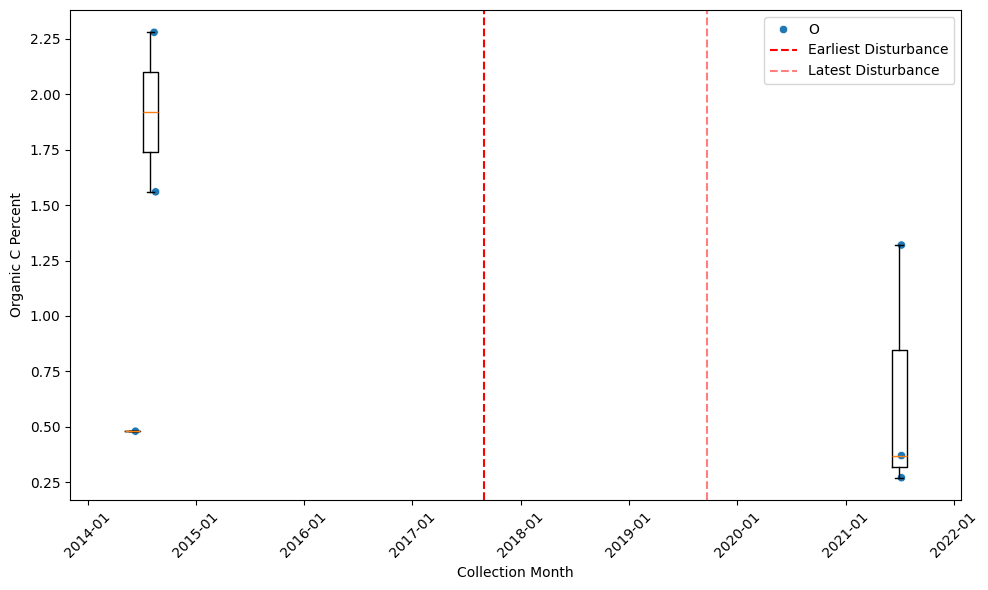

Processing plot: OSBS_005


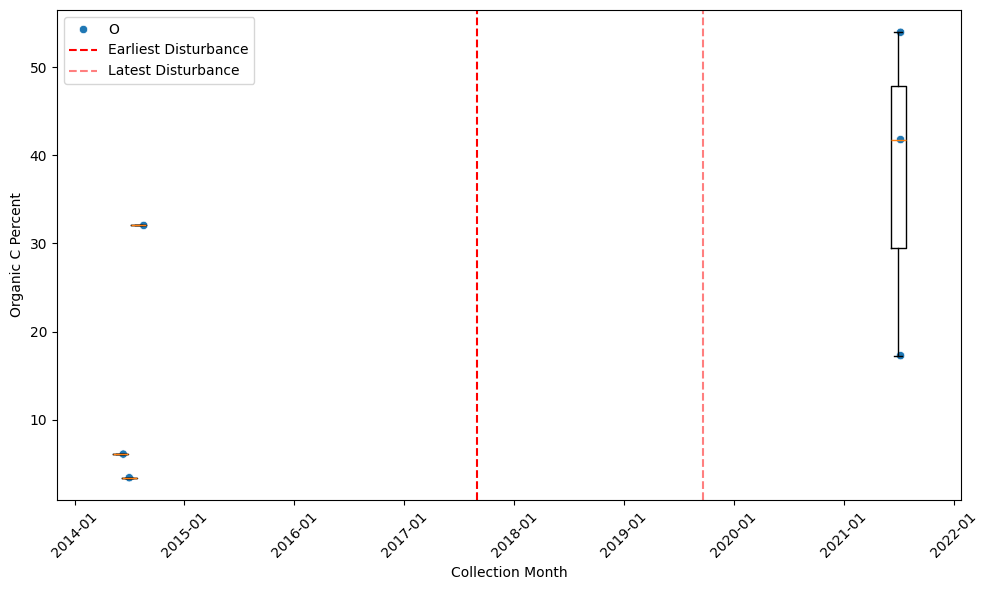

Processing plot: OSBS_026


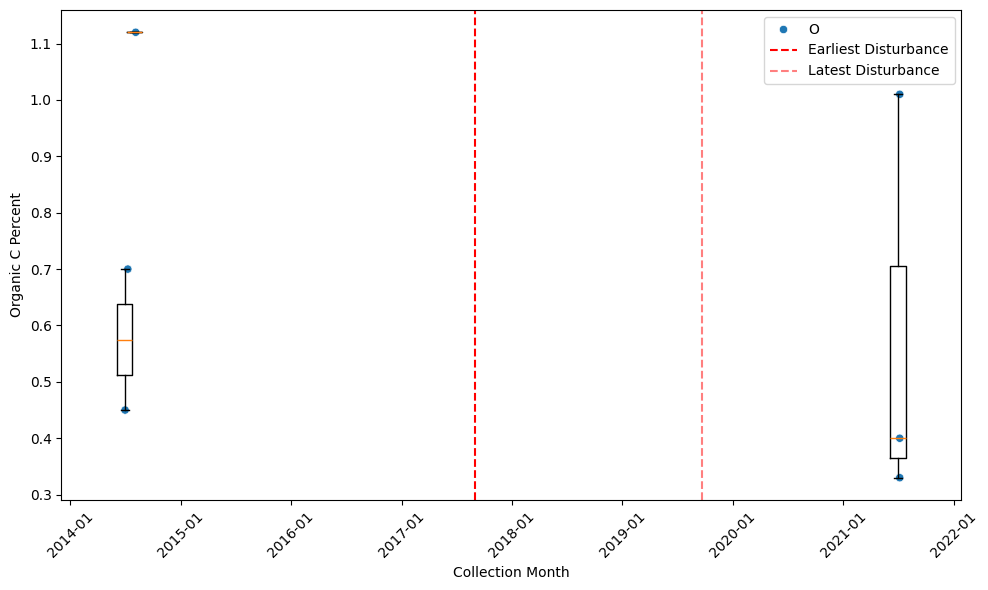

Processing plot: OSBS_002


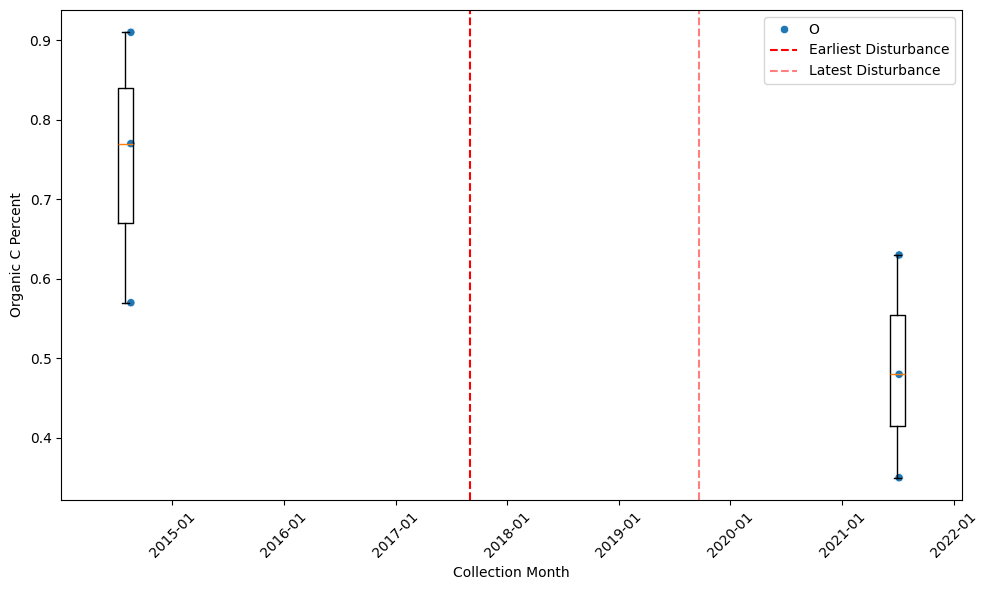

Processing plot: OSBS_001


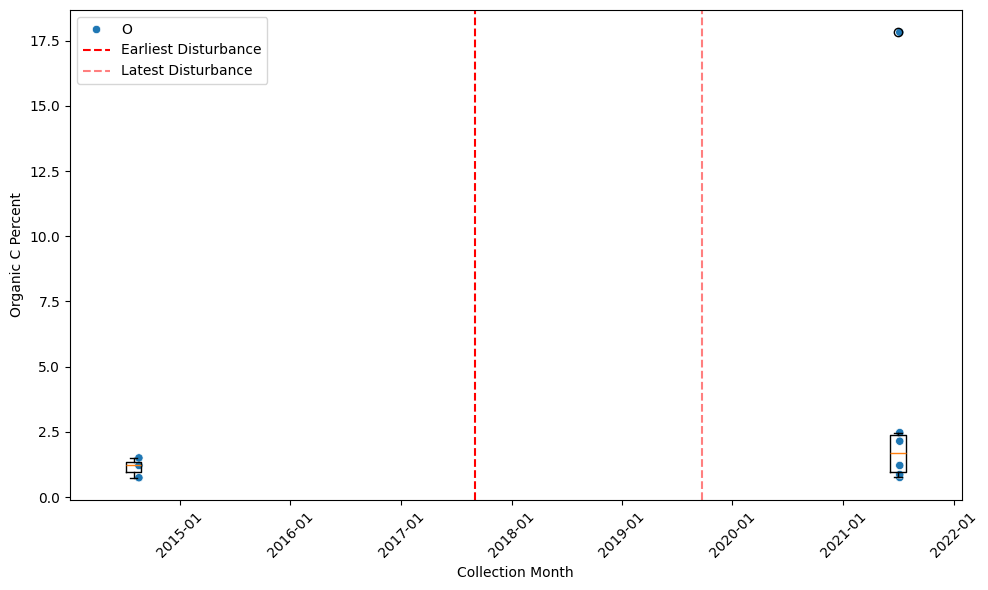

Processing plot: OSBS_003


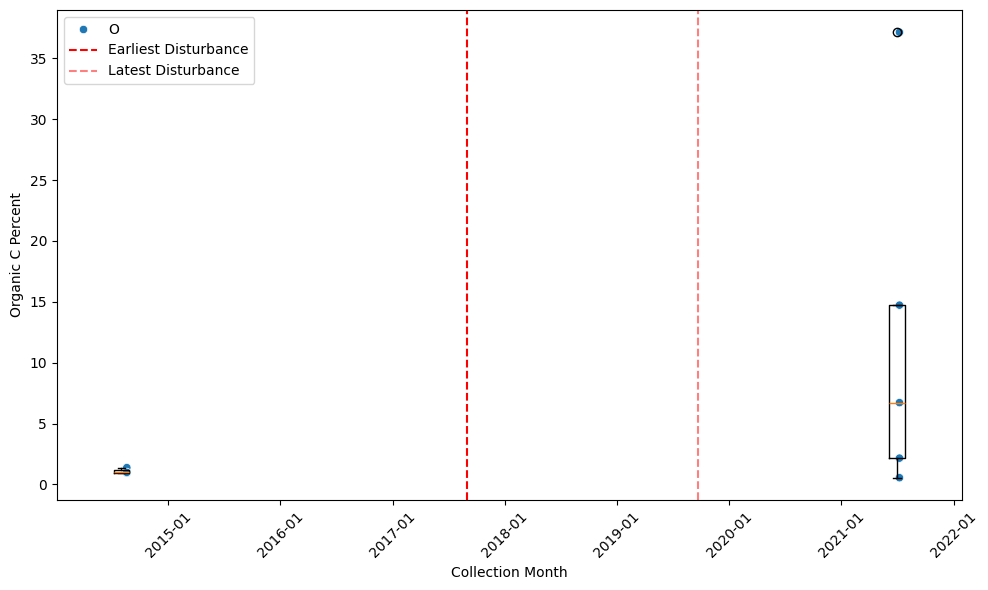

Processing plot: SCBI_045


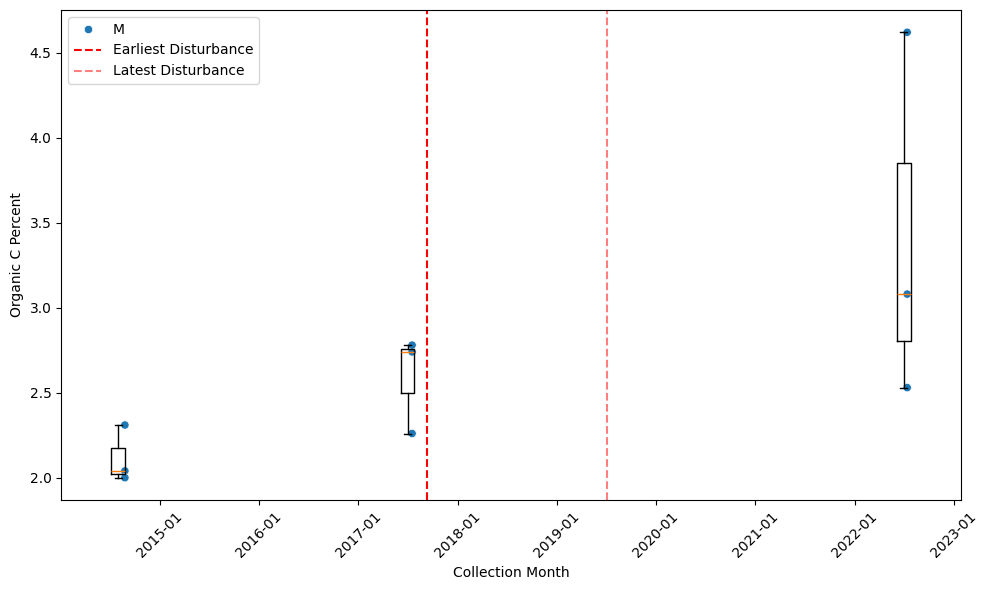

Processing plot: SCBI_004


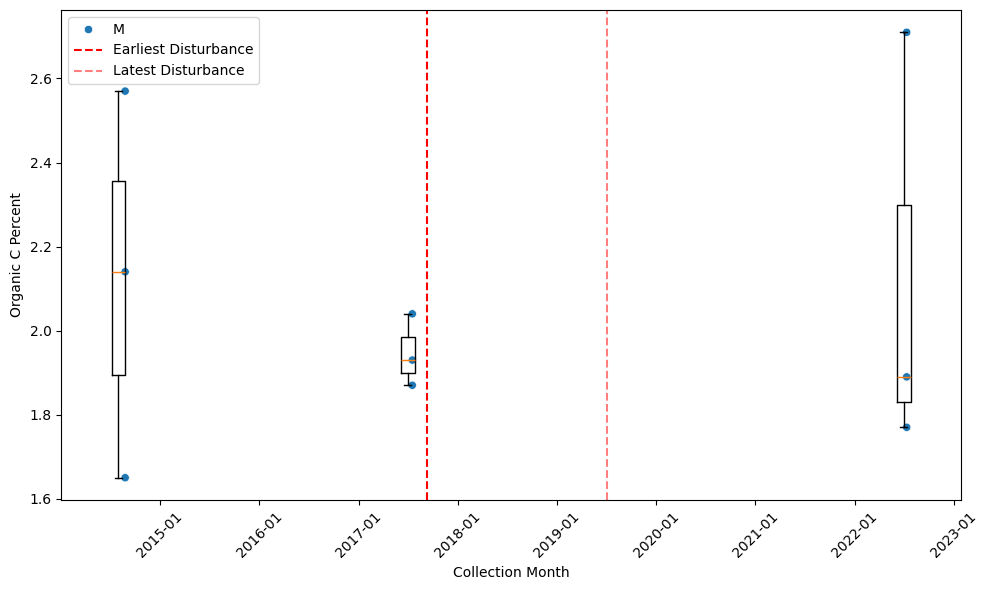

Processing plot: SCBI_006


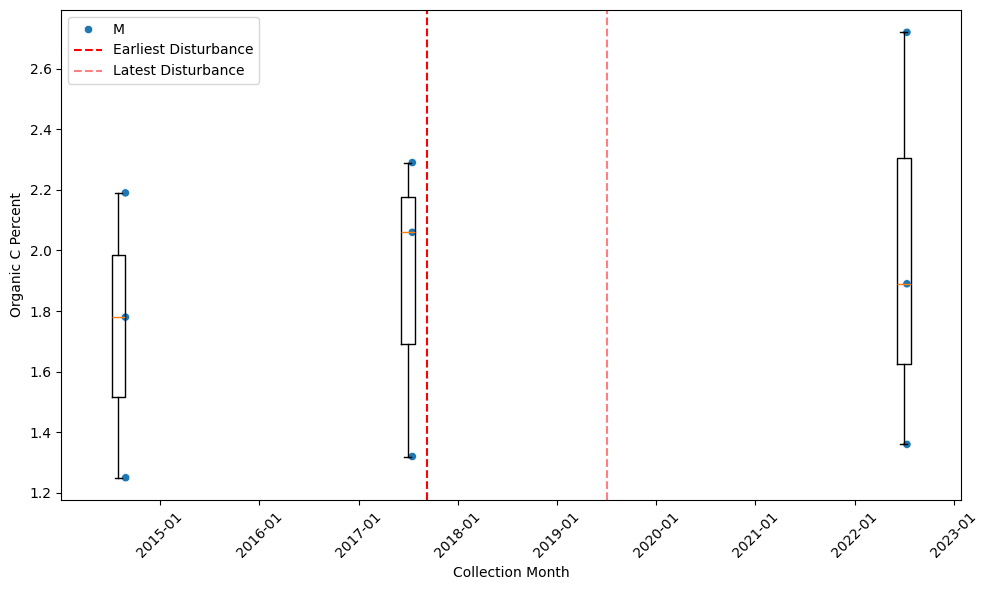

Processing plot: SCBI_003


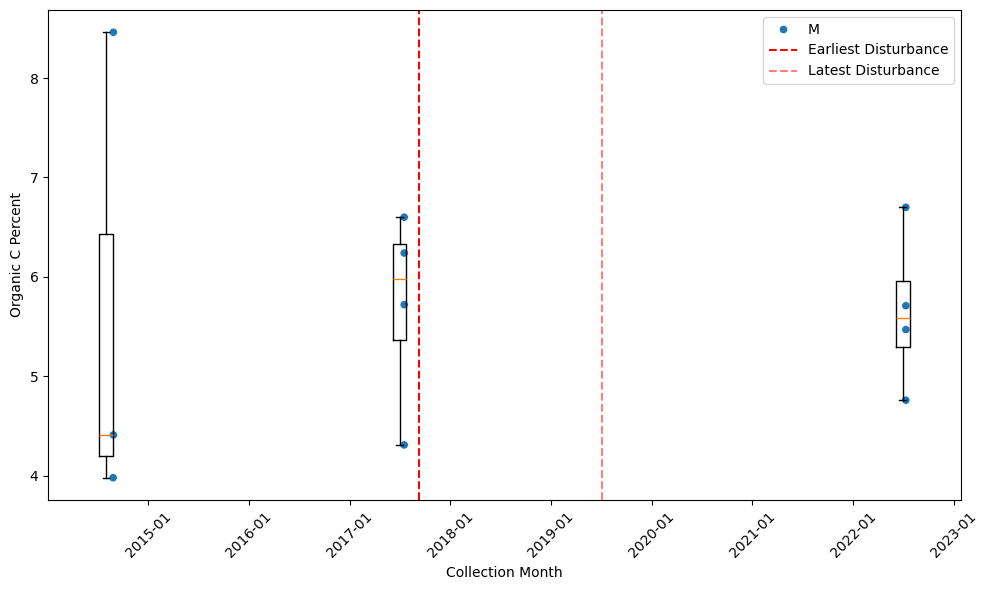

Processing plot: SCBI_005


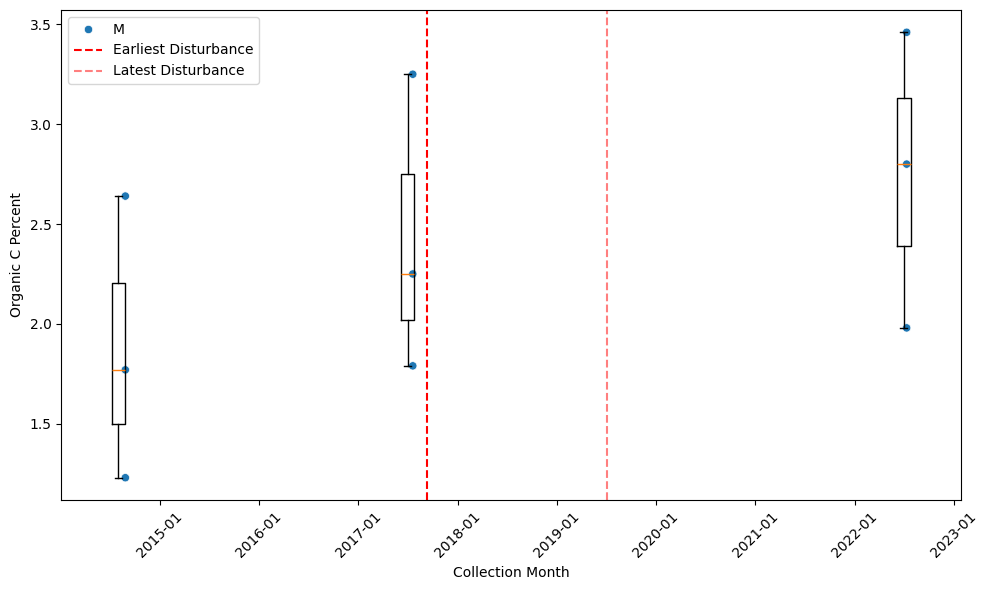

Processing plot: SCBI_067


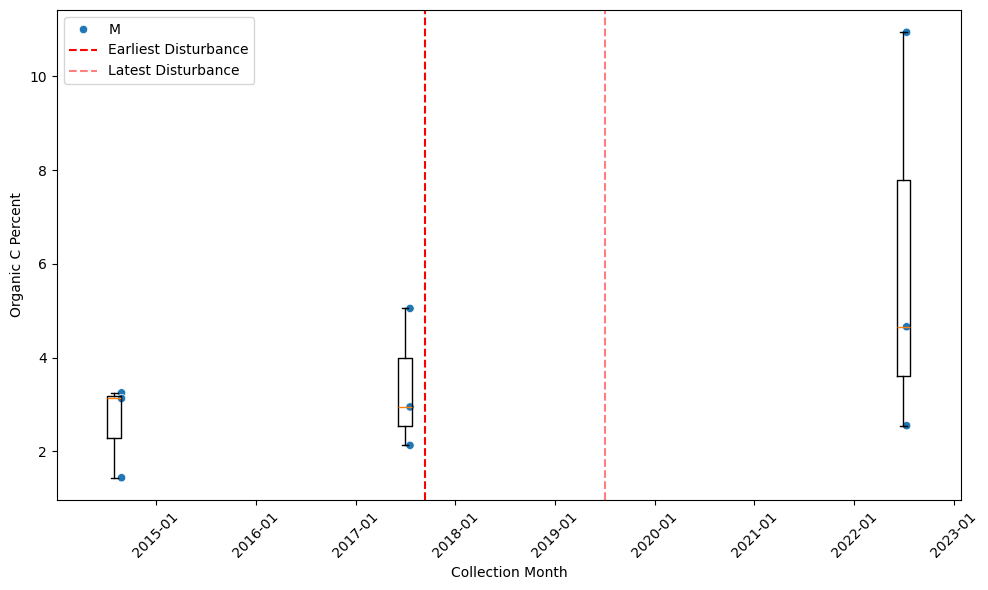

Processing plot: SCBI_049


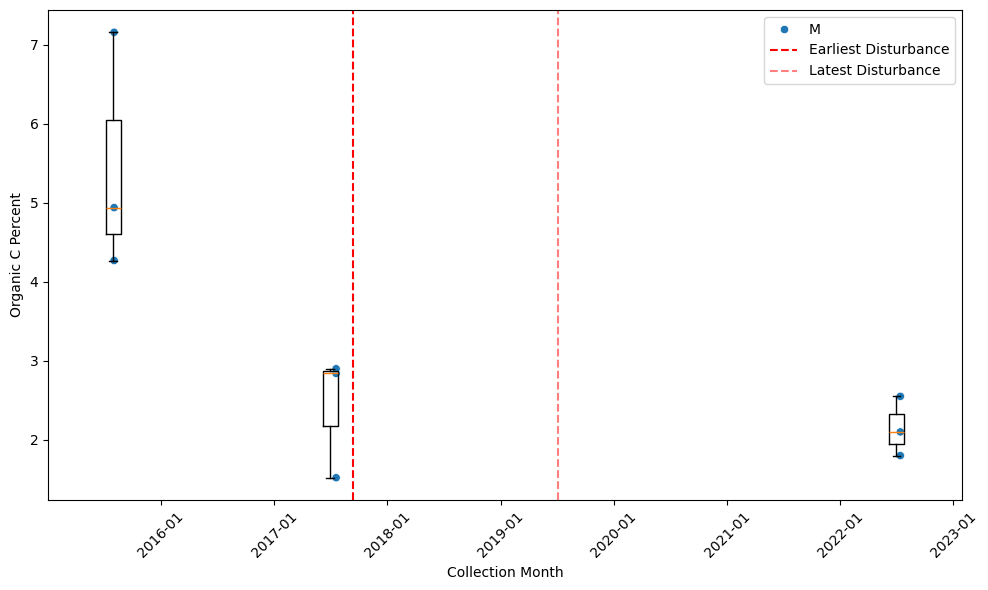

Processing plot: SCBI_047


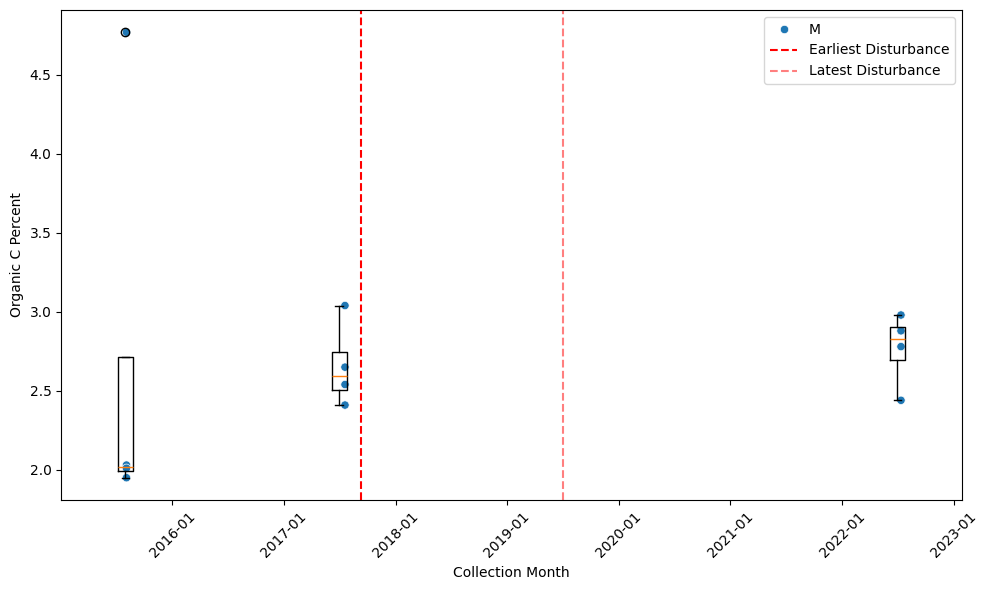

Processing plot: SCBI_008


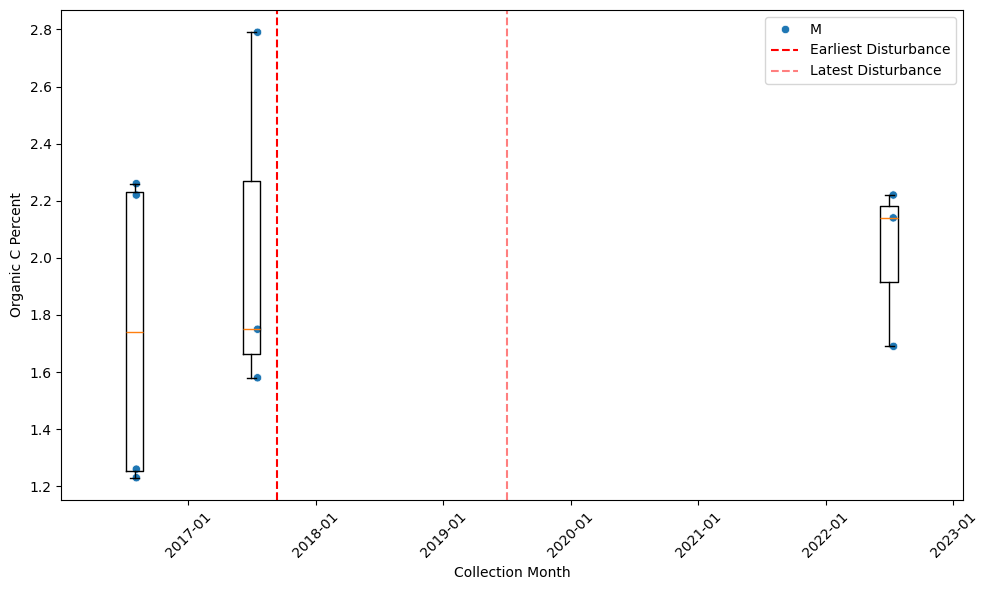

Processing plot: SERC_007


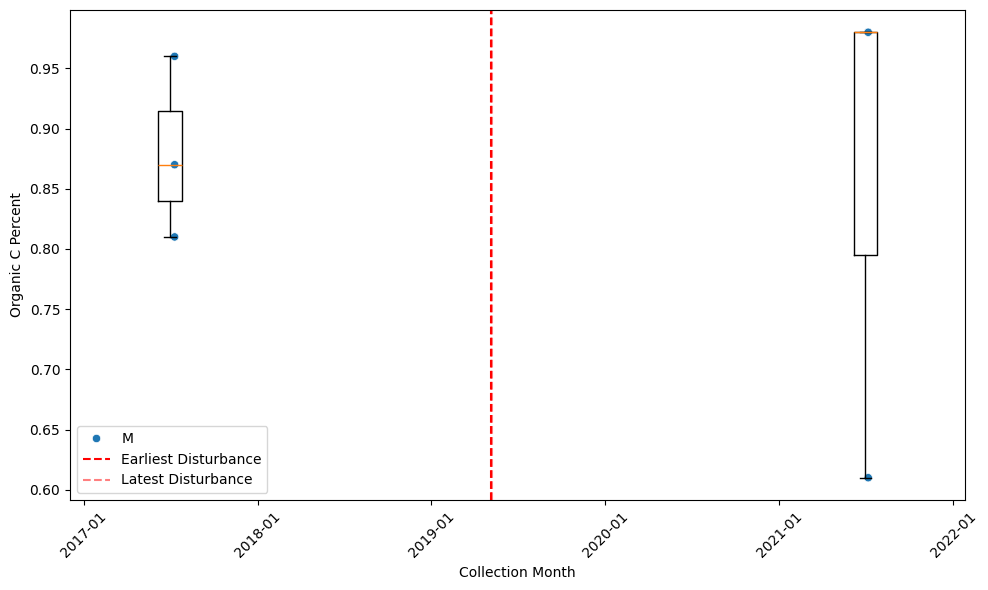

Processing plot: SERC_001


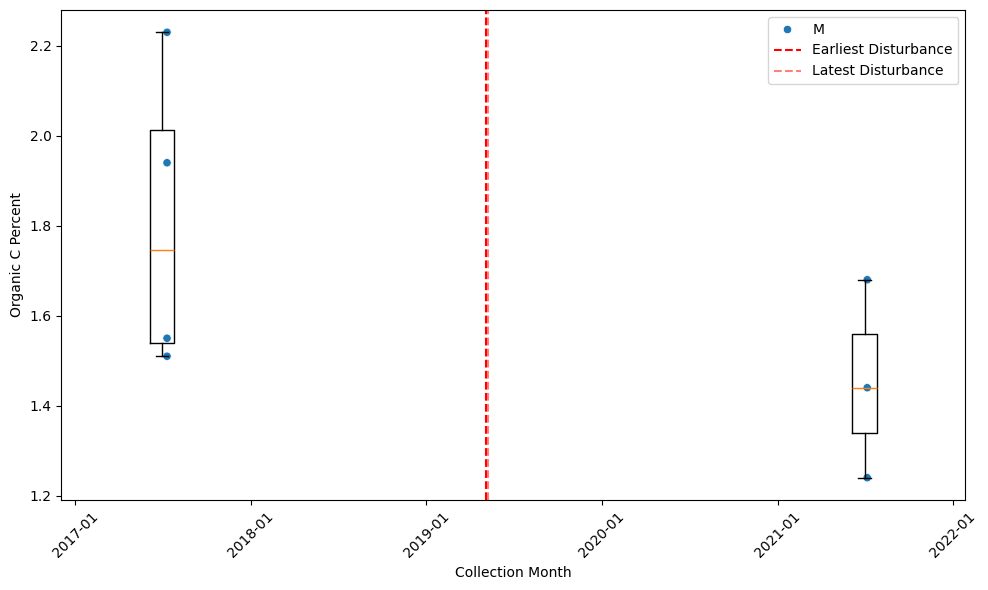

Processing plot: SERC_004


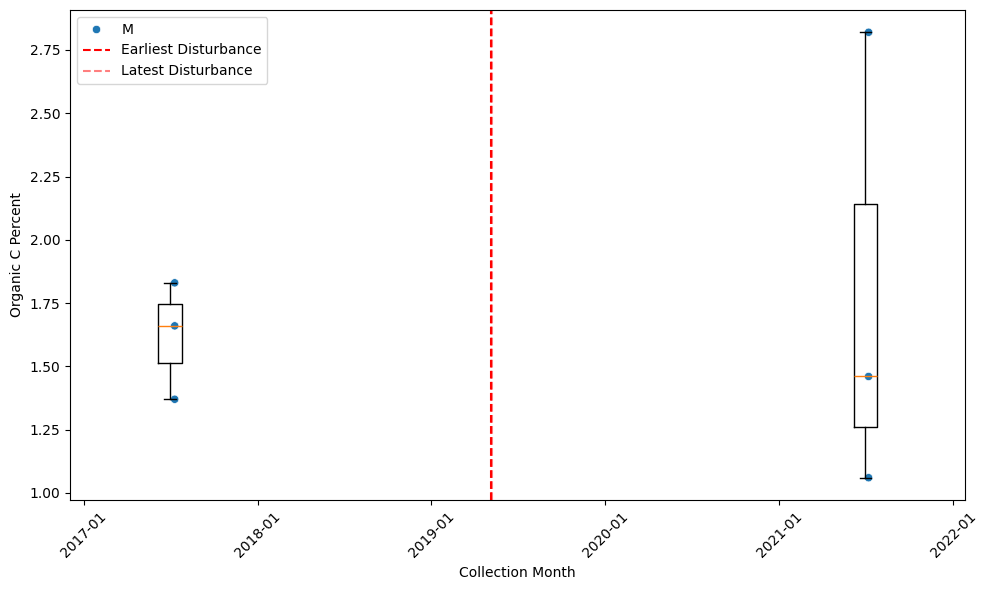

Processing plot: SERC_045


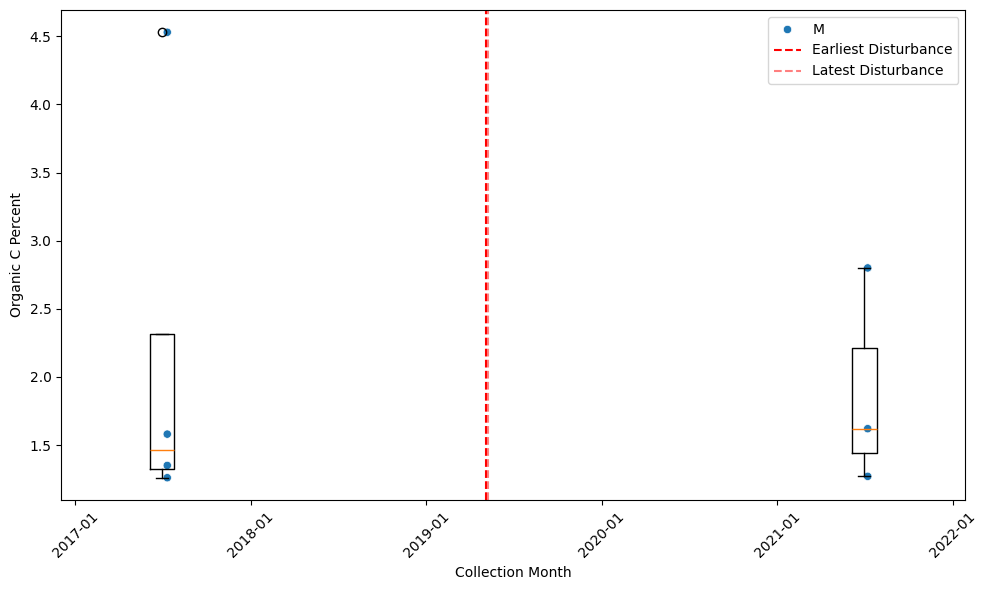

Processing plot: SERC_049


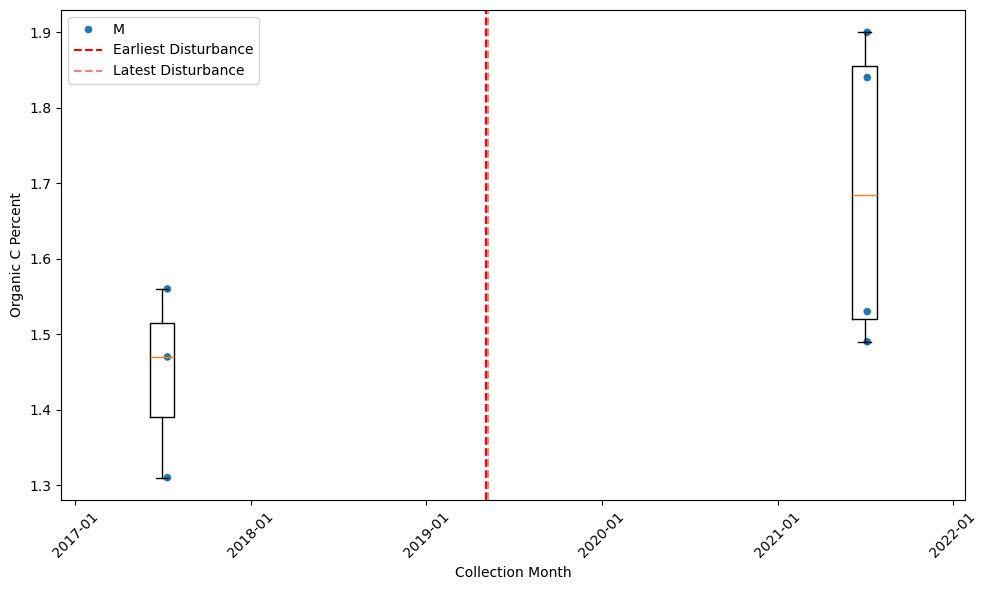

Processing plot: SERC_047


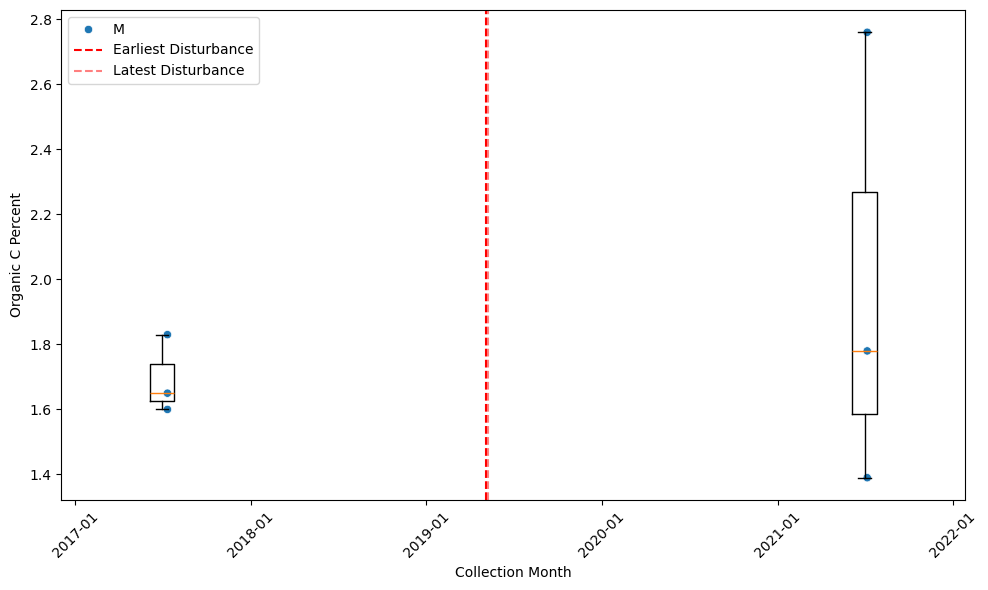

Processing plot: SERC_044


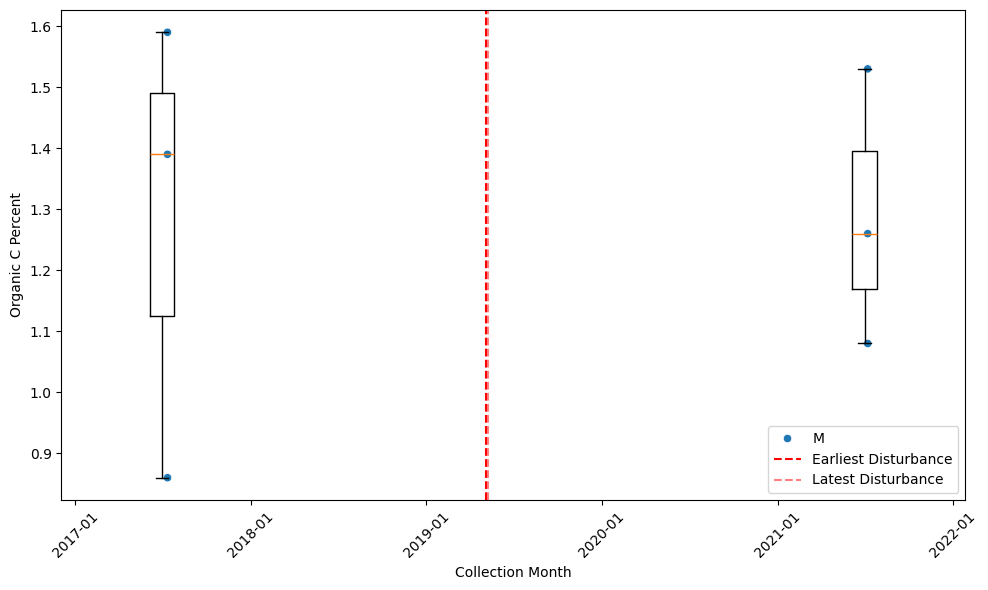

Processing plot: SERC_005


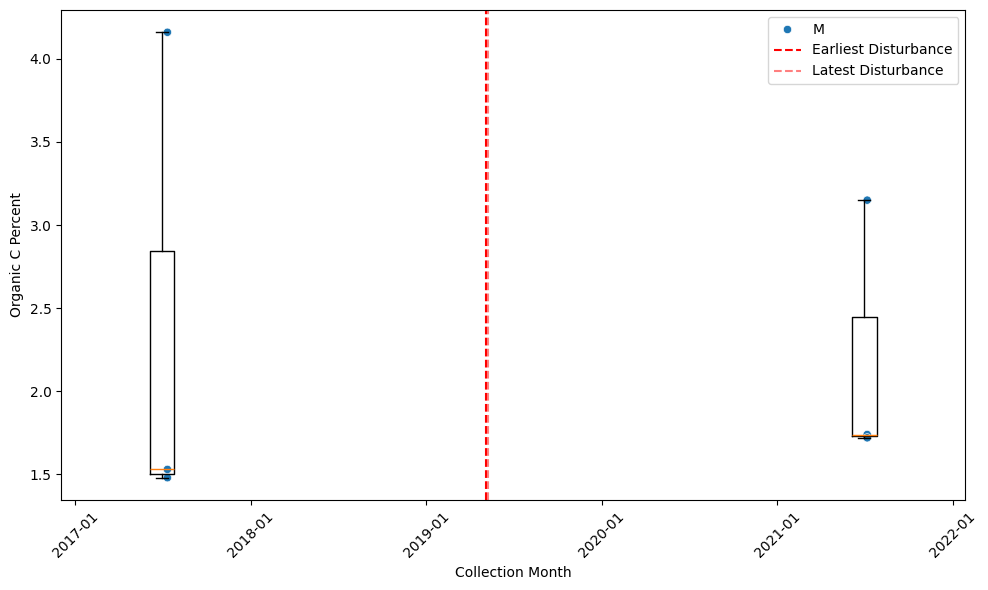

Processing plot: SERC_003


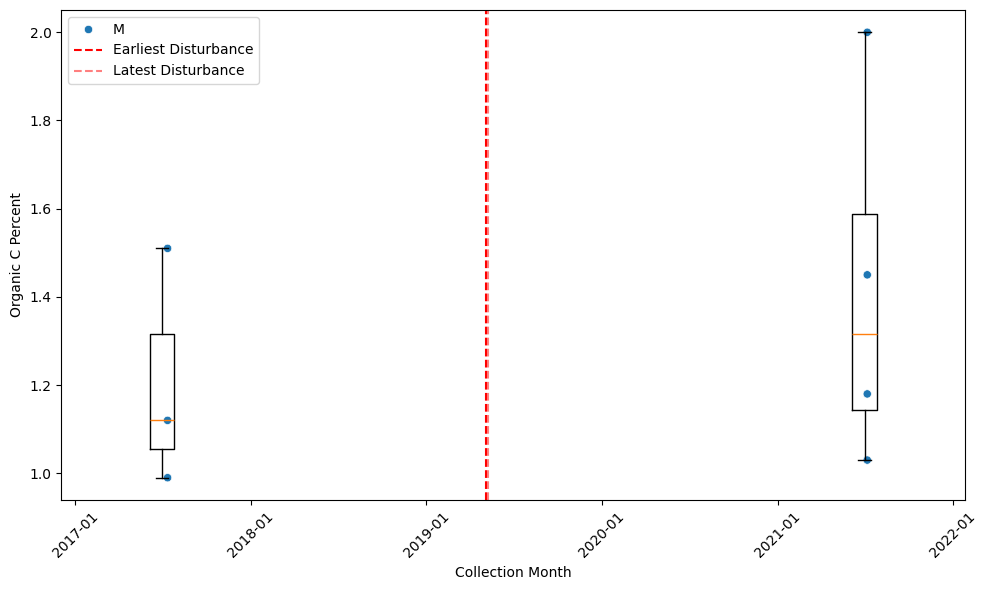

Processing plot: SERC_002


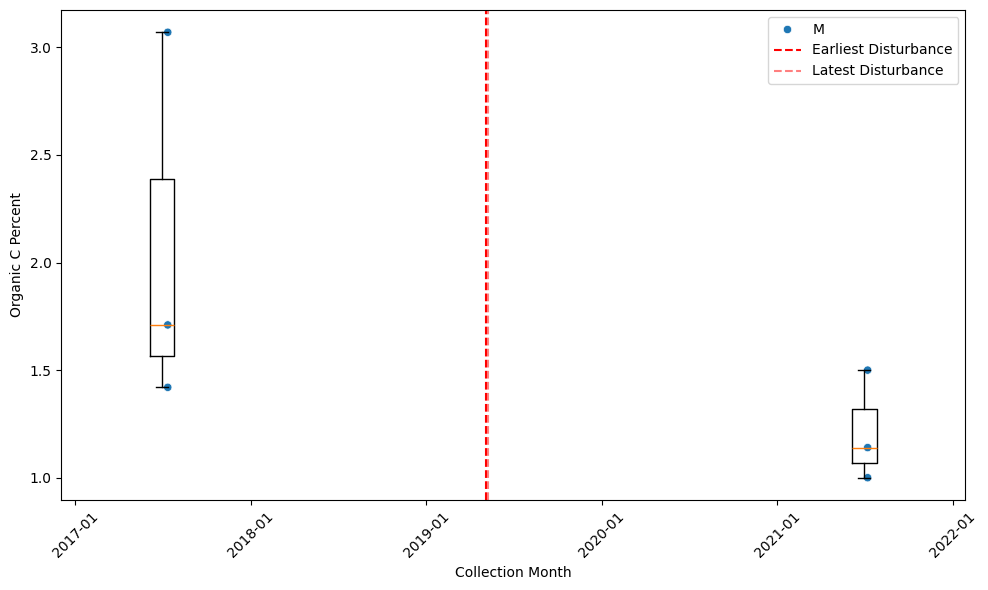

Processing plot: STEI_008


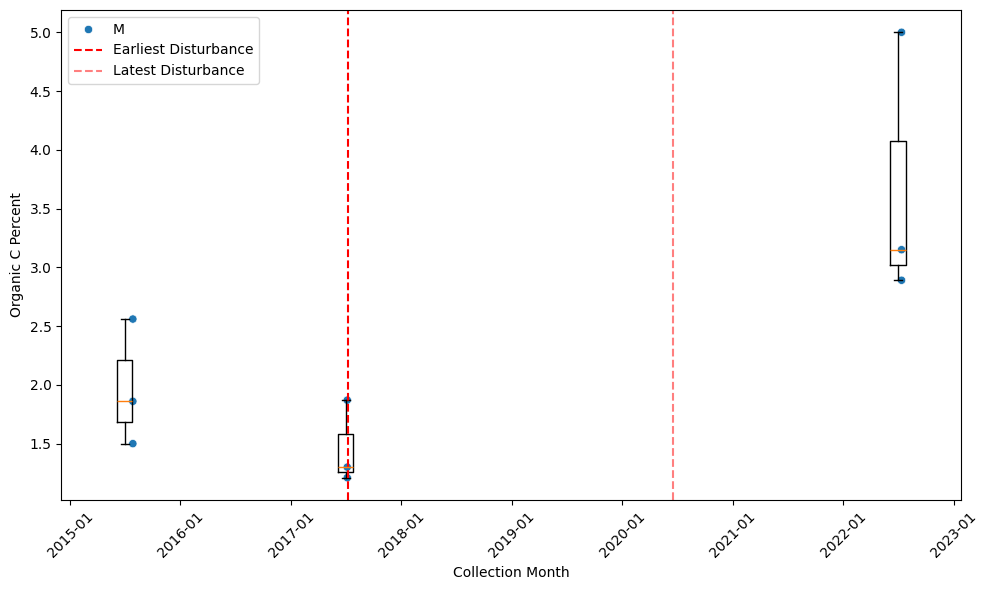

Processing plot: STEI_004


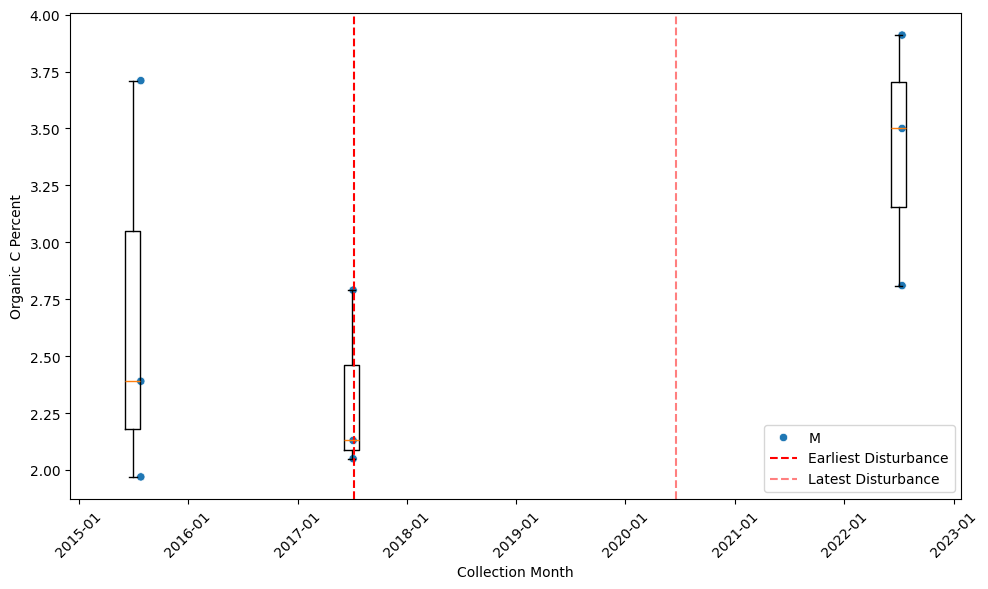

Processing plot: STEI_002


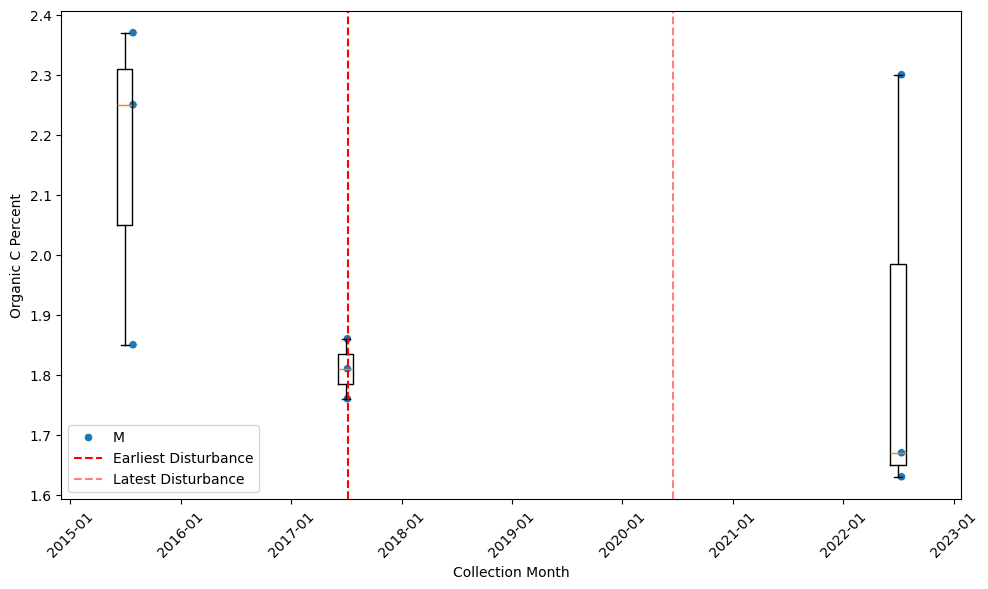

Processing plot: STEI_001


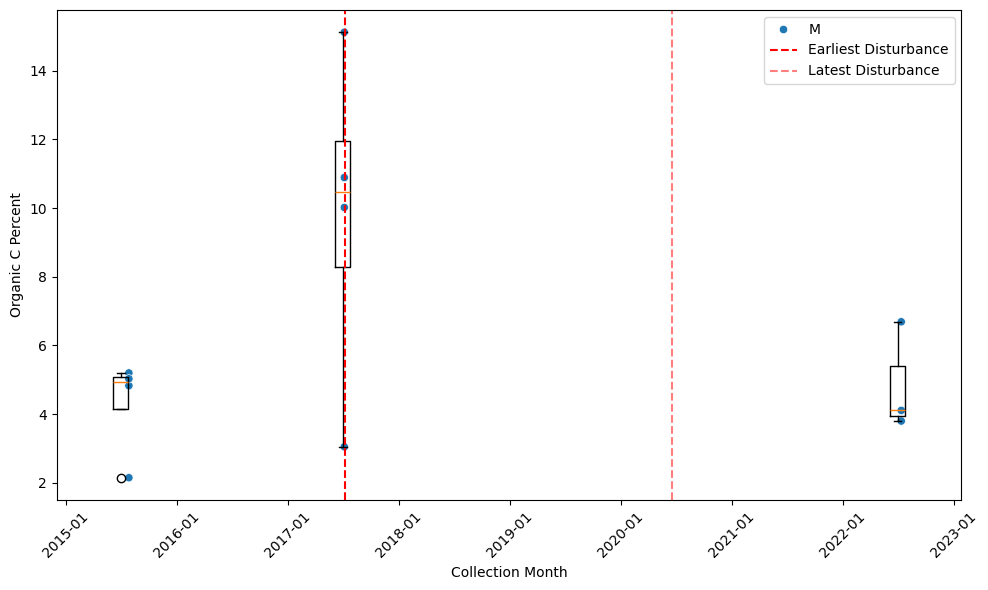

Processing plot: STEI_003


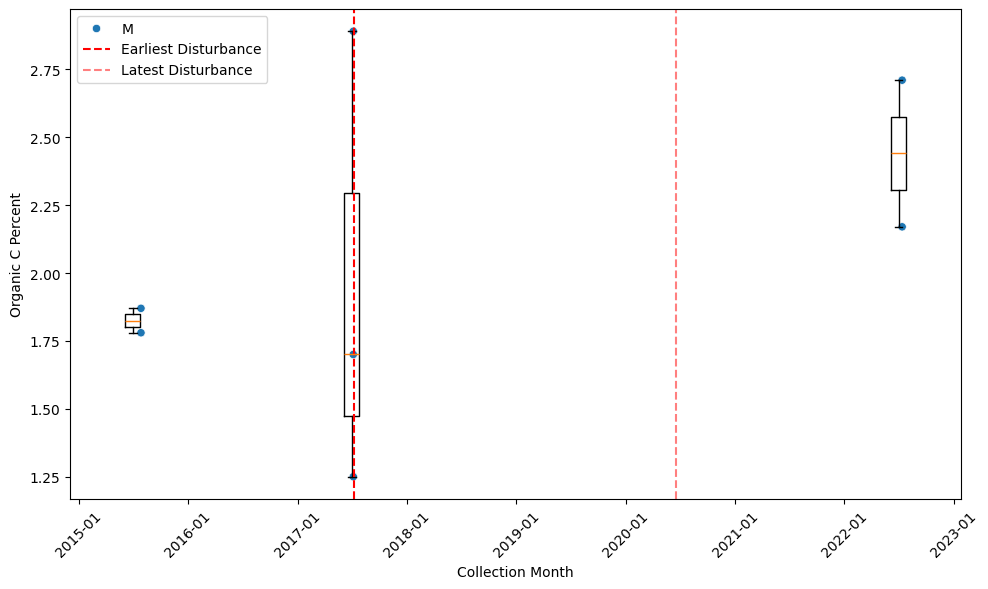

Processing plot: STEI_047


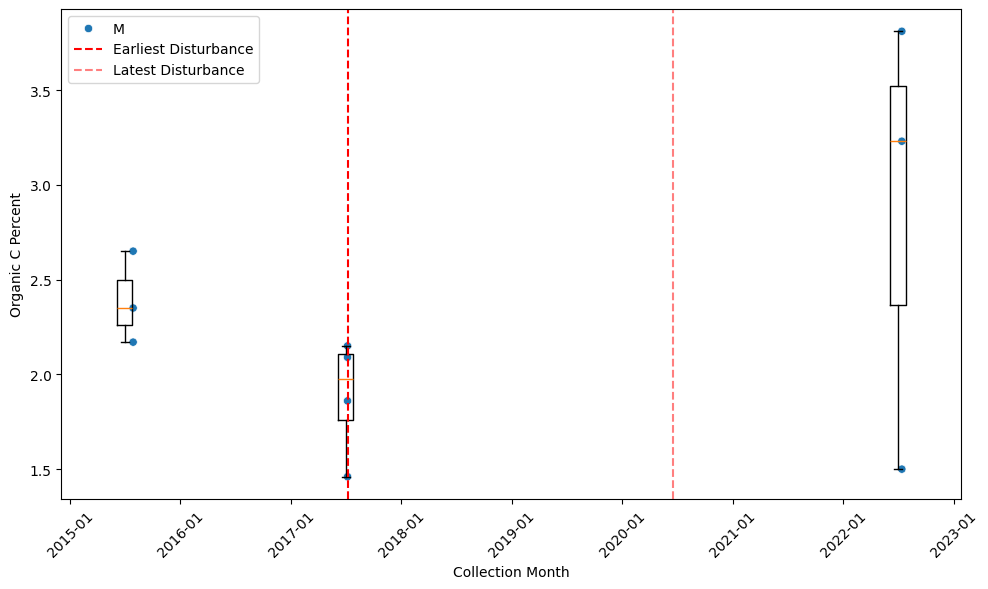

Processing plot: STEI_053


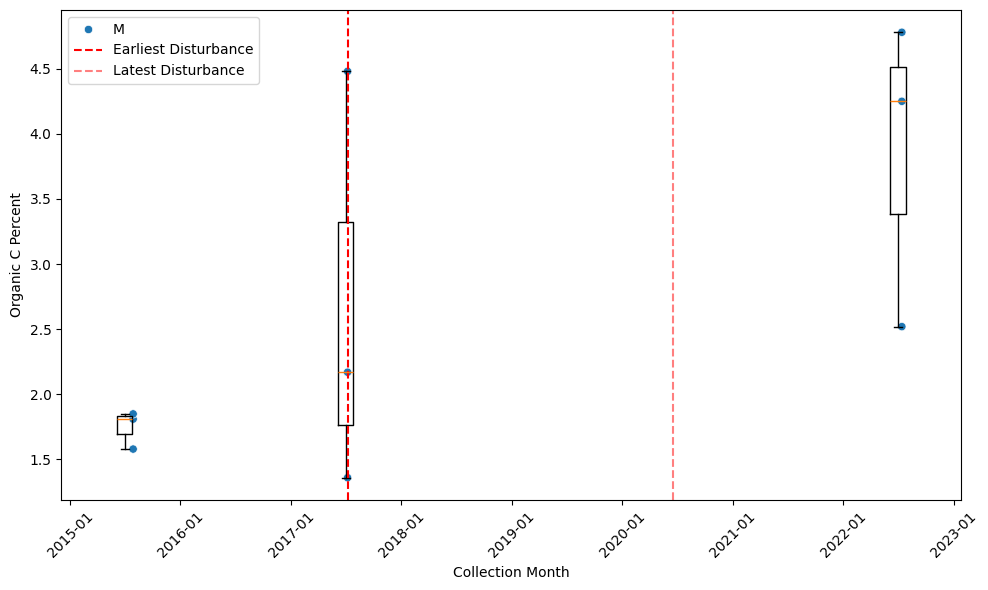

Processing plot: STEI_060


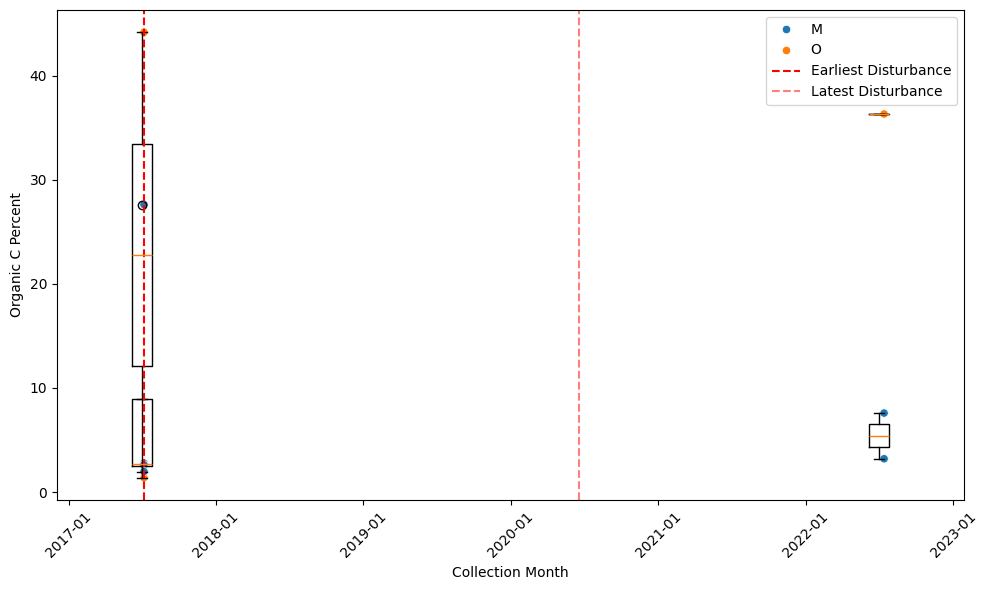

Processing plot: STEI_059


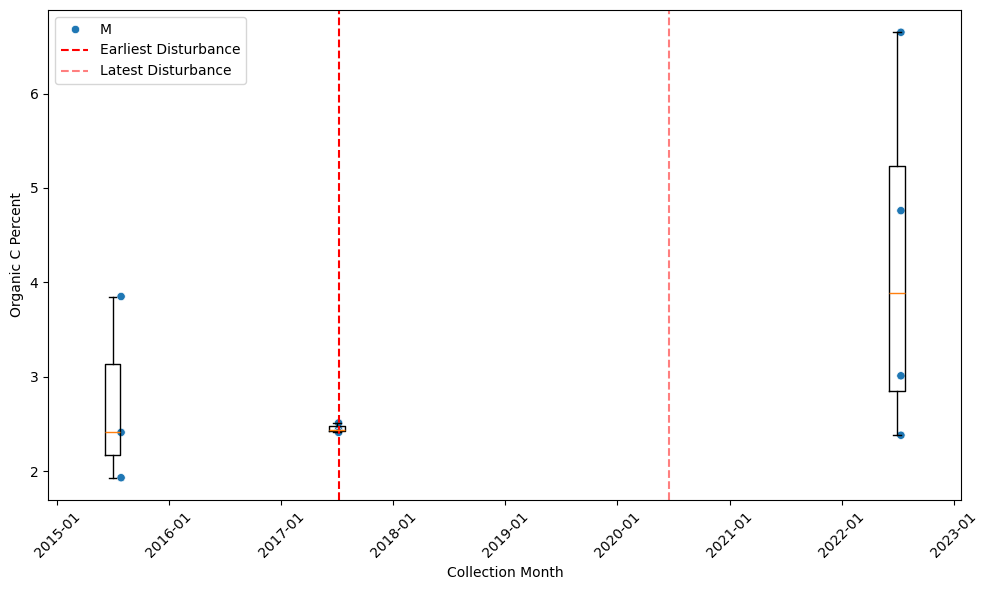

Processing plot: STEI_021


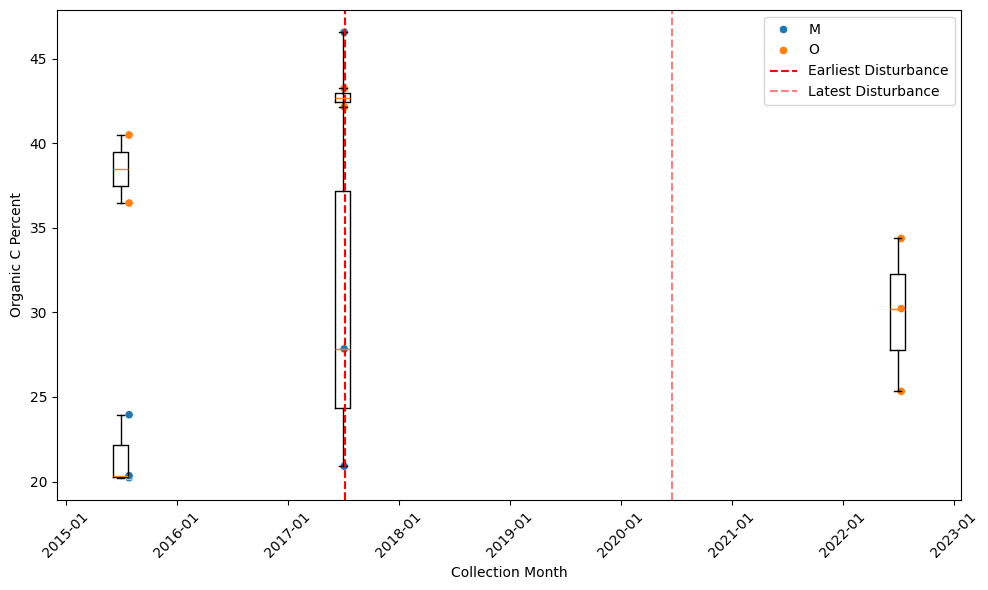

Processing plot: TREE_014


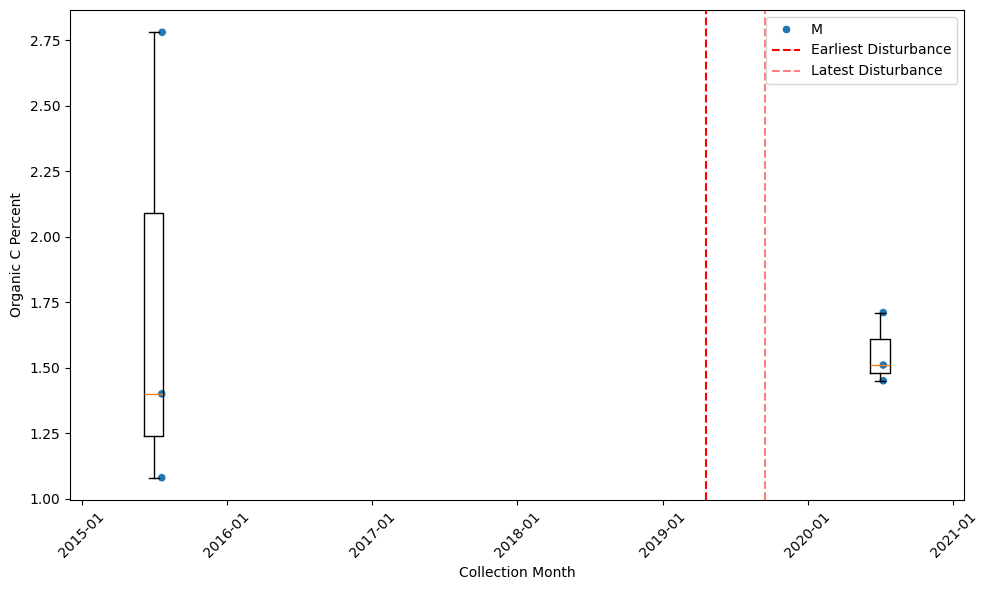

Processing plot: TREE_046


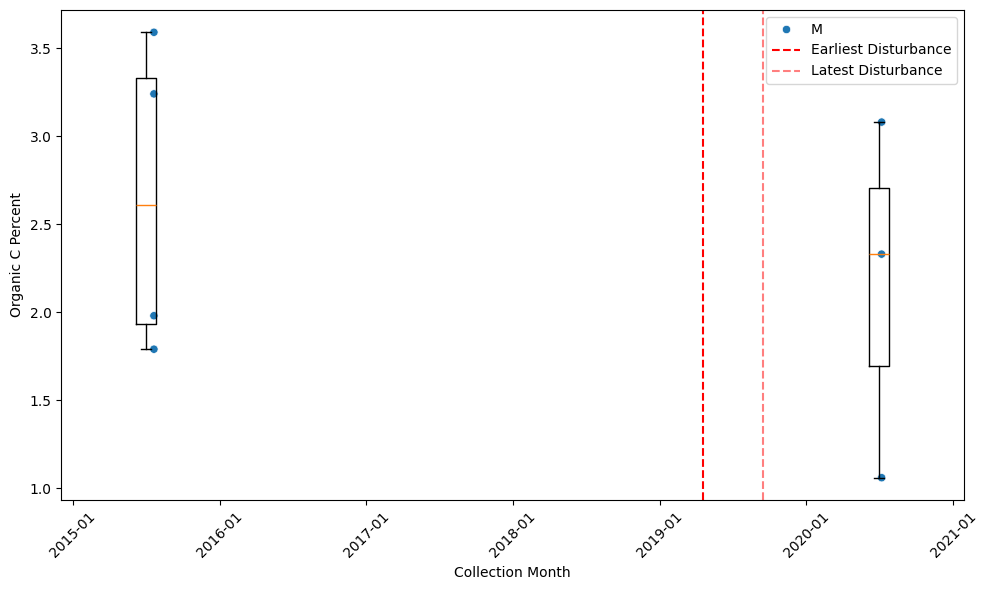

Processing plot: TREE_049


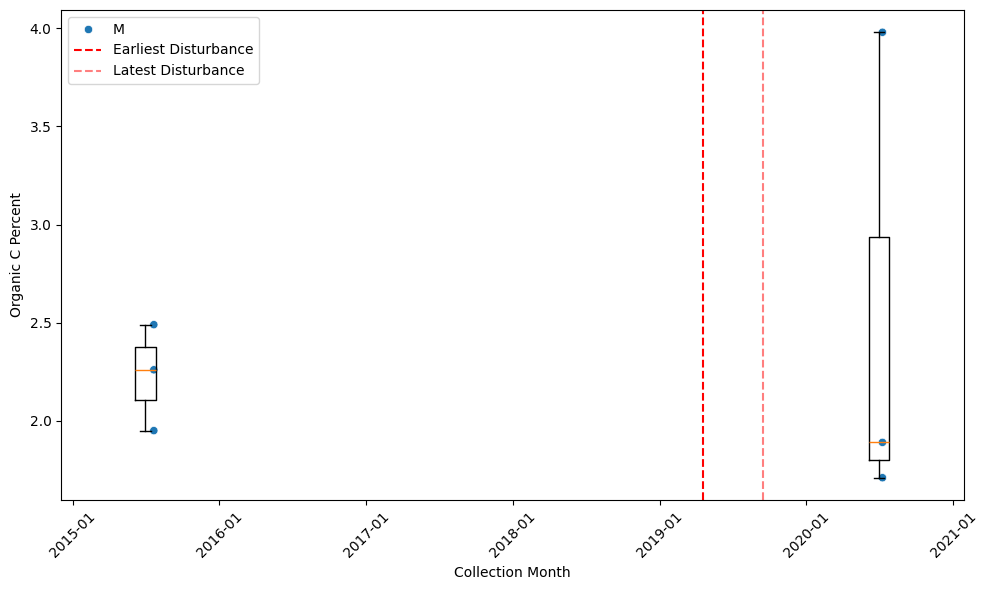

Processing plot: TREE_050


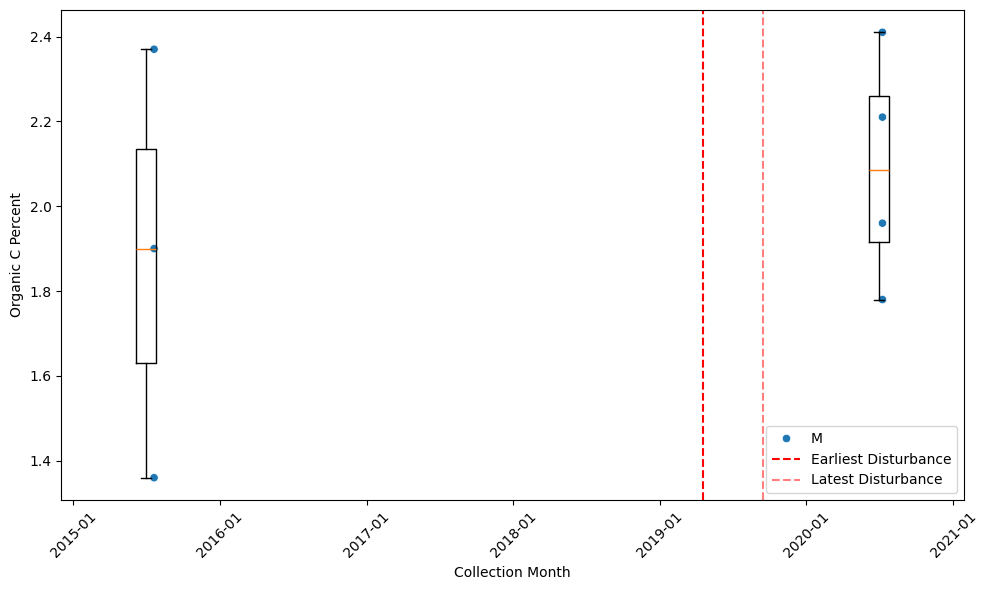

Processing plot: TREE_041


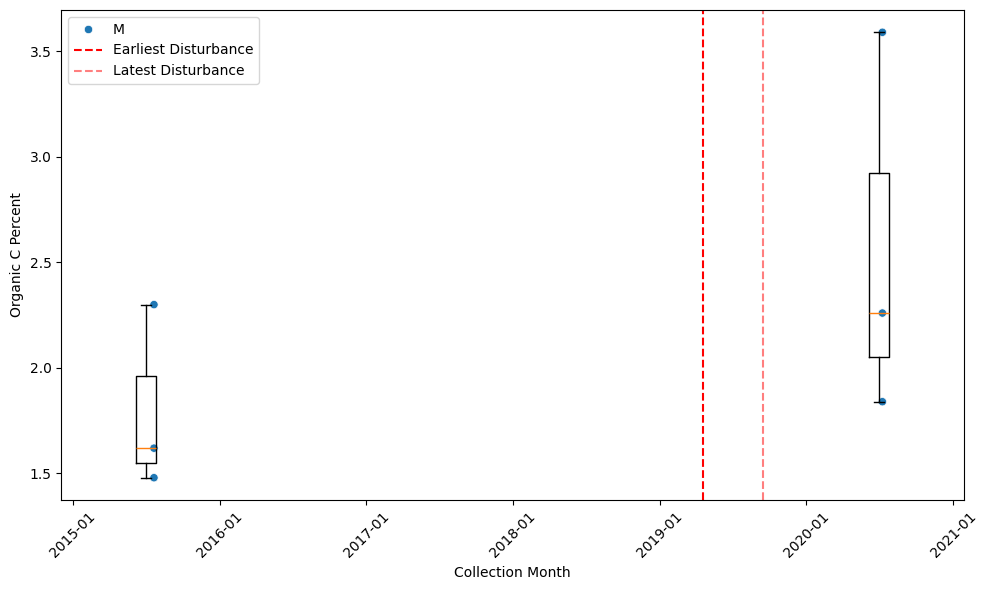

Processing plot: TREE_003


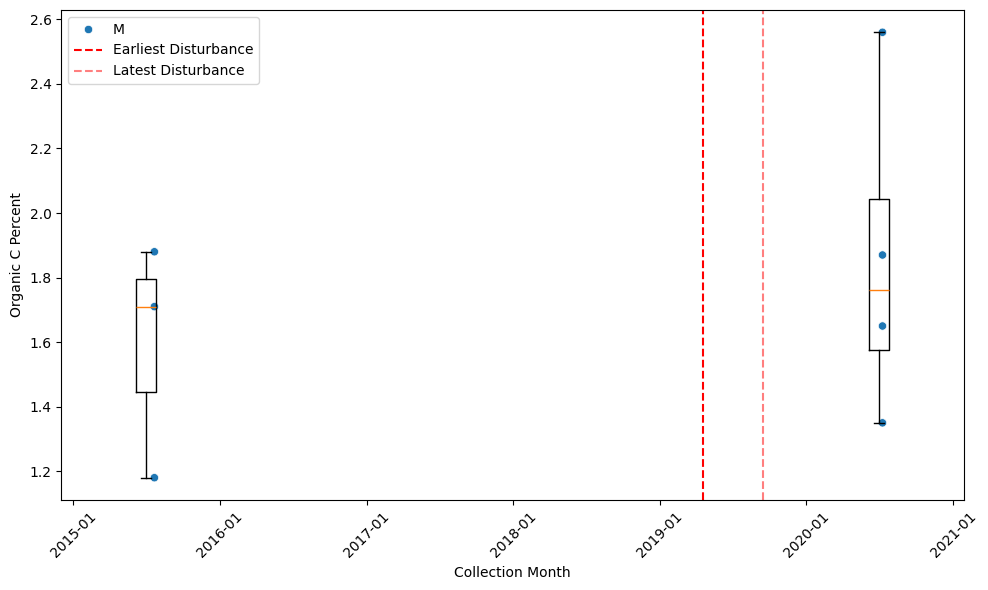

Processing plot: TREE_001


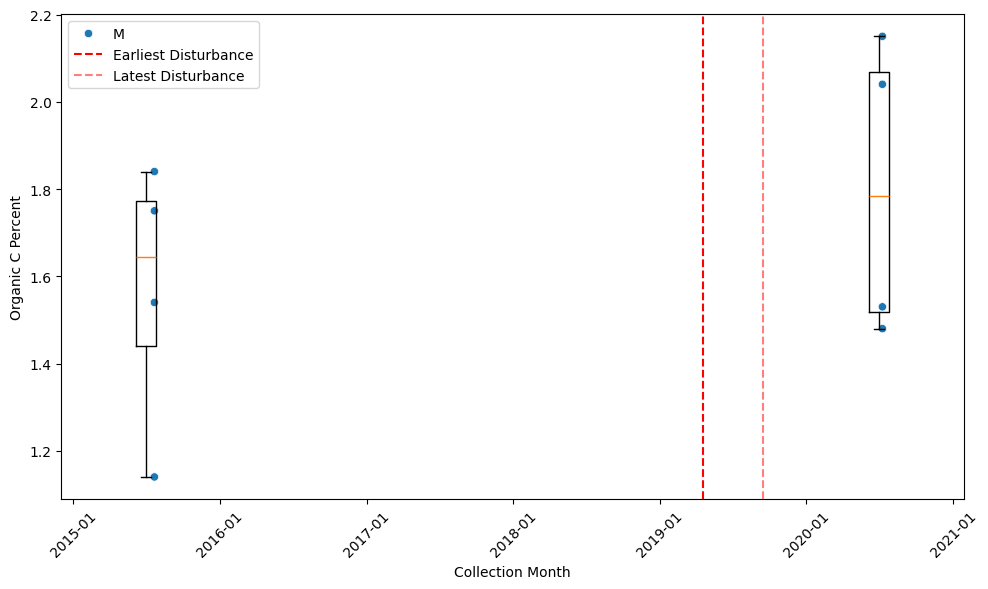

Processing plot: TREE_002


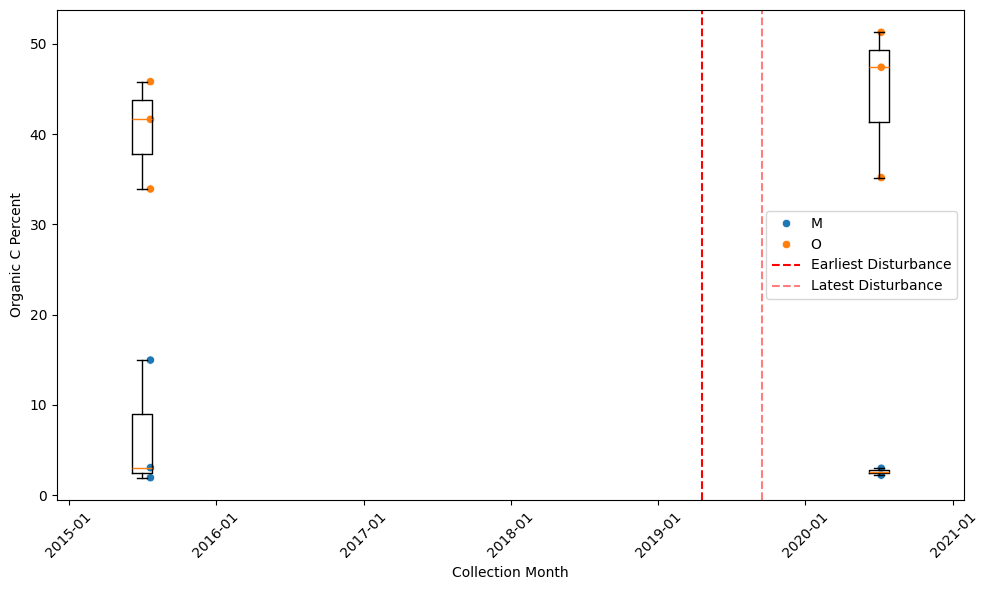

Processing plot: TREE_006


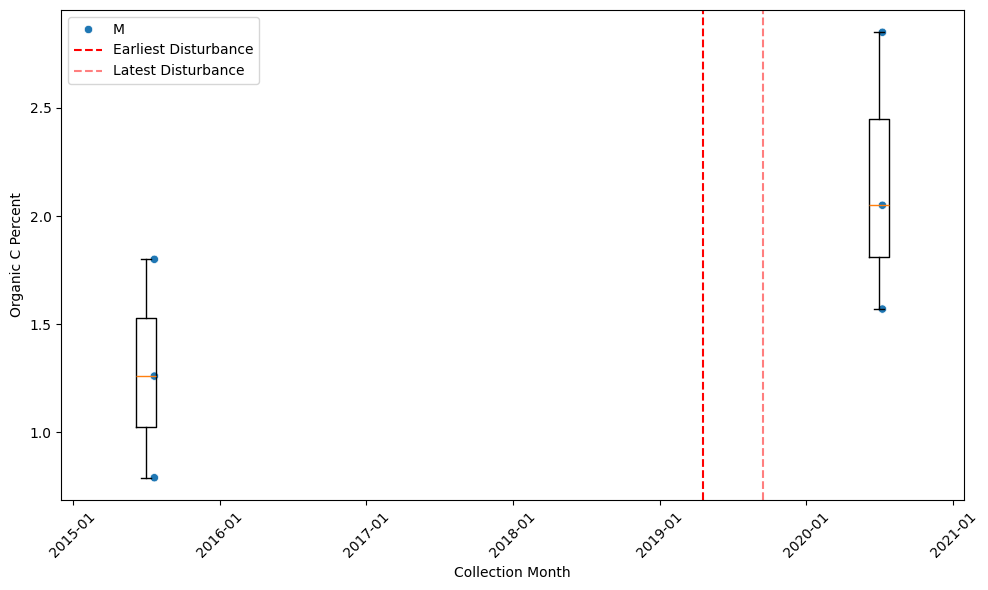

Processing plot: UKFS_044


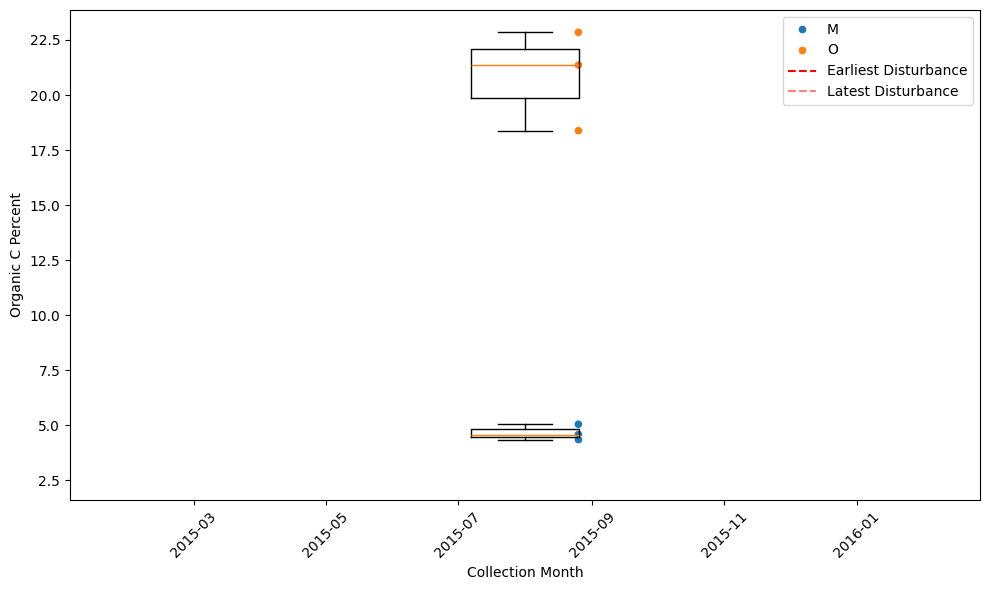

Processing plot: UKFS_031


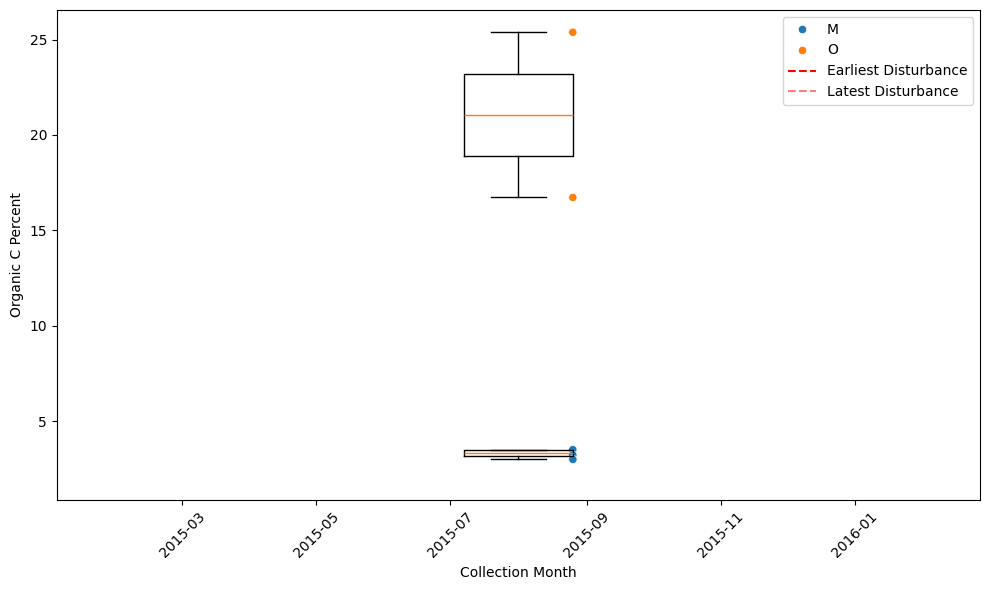

Processing plot: UKFS_043


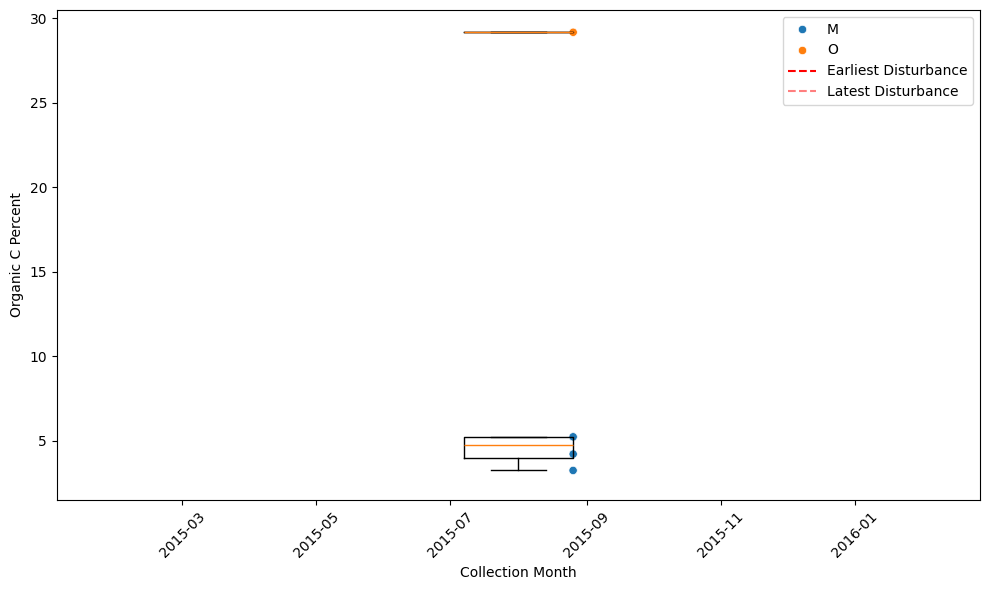

Processing plot: UKFS_001


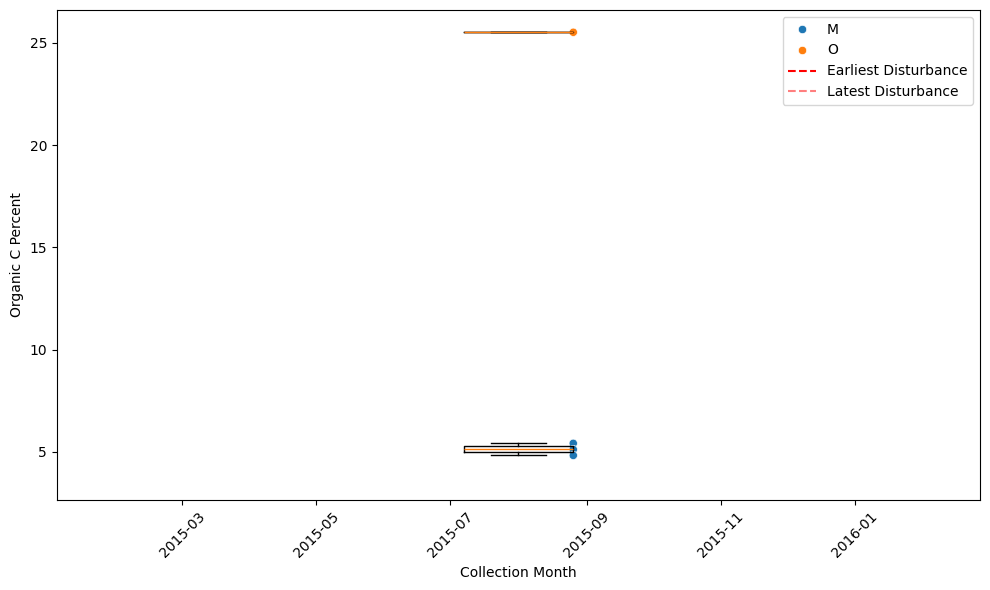

Processing plot: UKFS_002


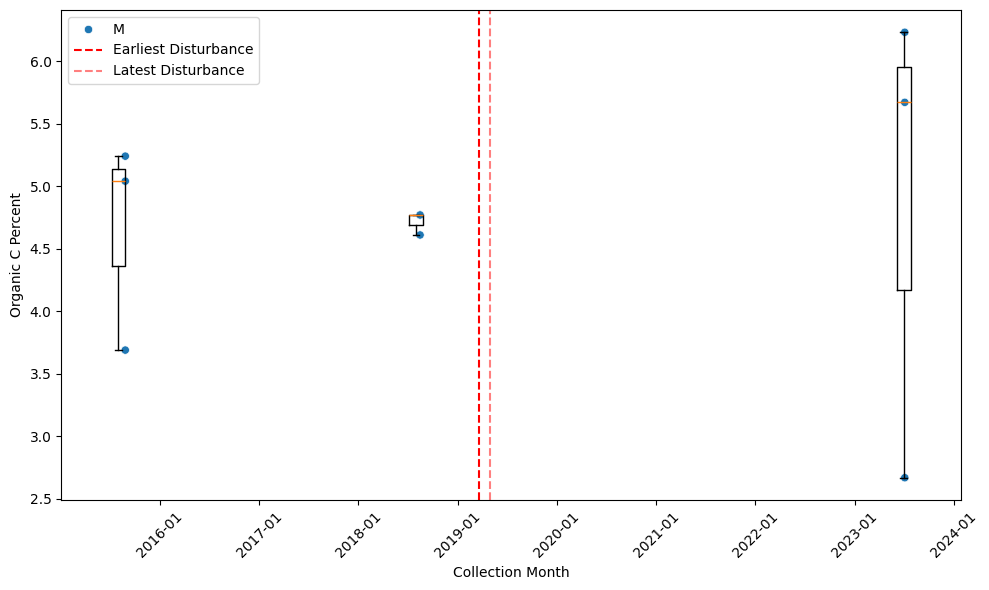

Processing plot: UKFS_009


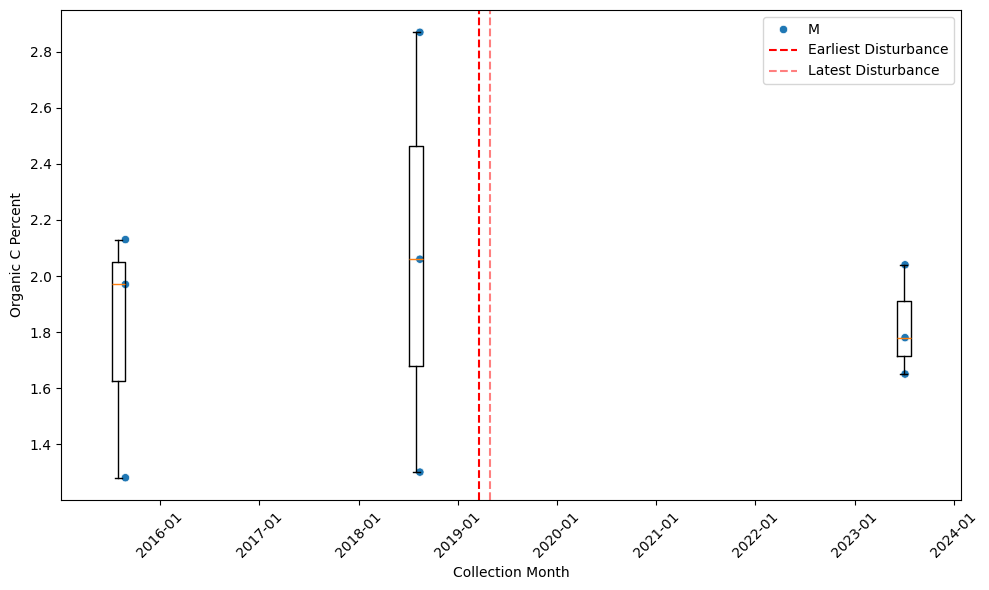

Processing plot: UKFS_004


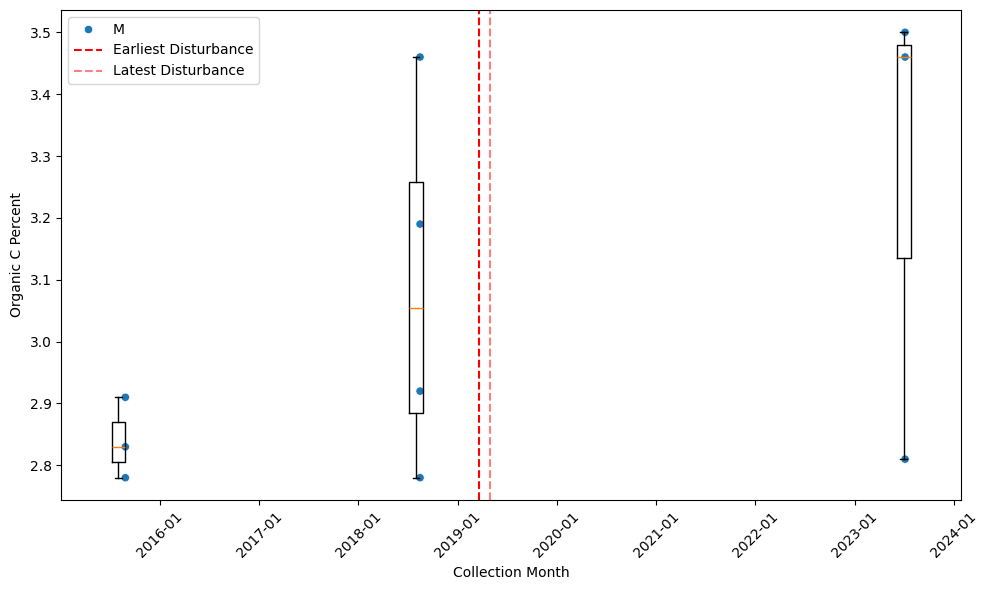

Processing plot: UKFS_032


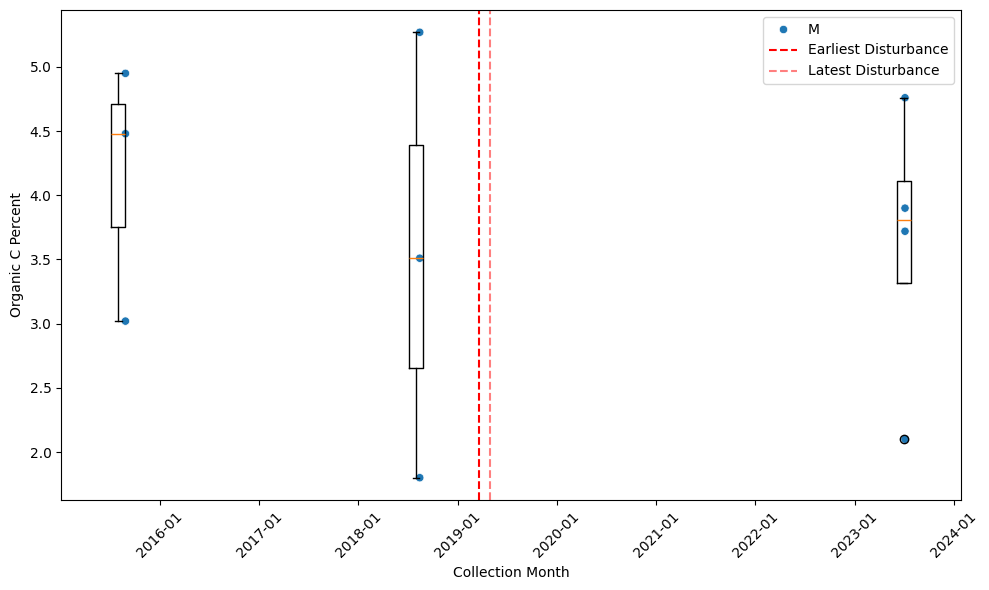

Processing plot: UKFS_005


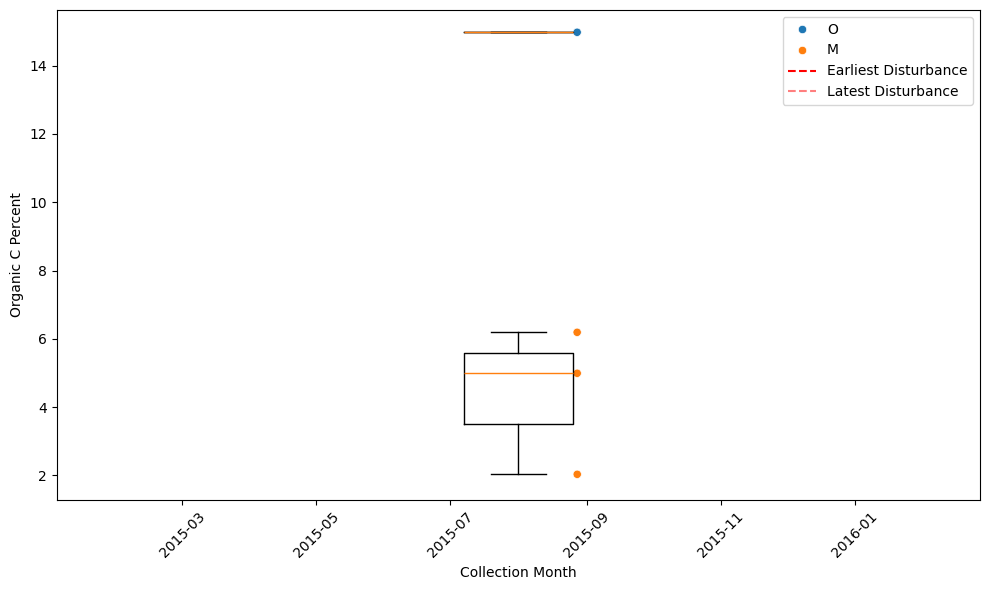

Processing plot: UKFS_003


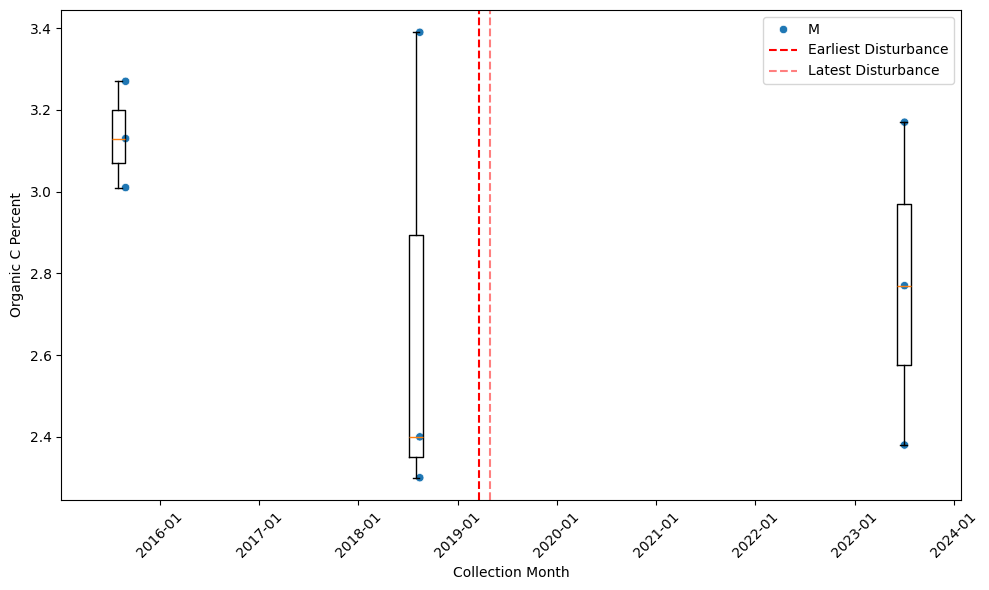

Processing plot: UNDE_006


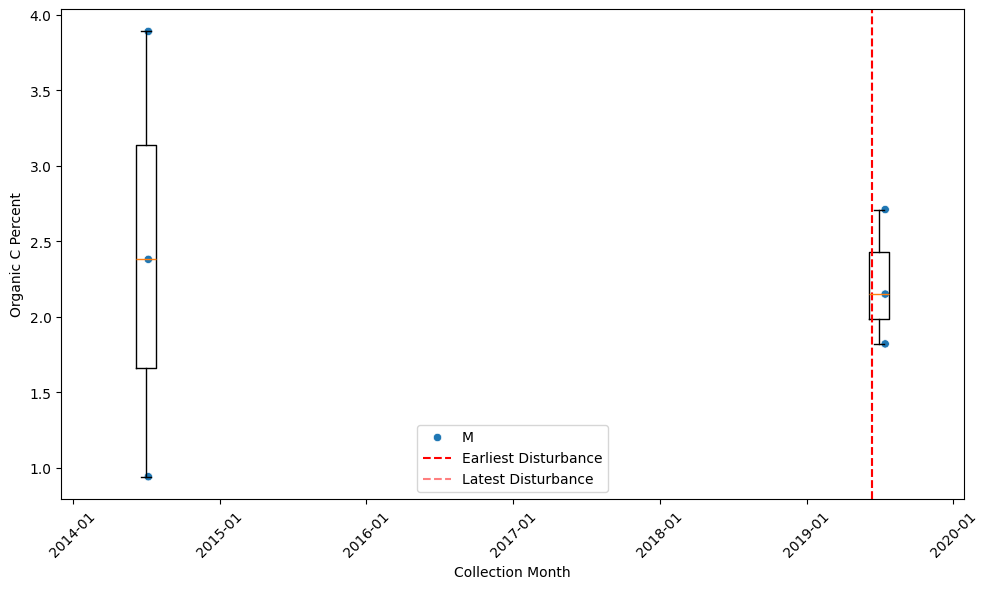

Processing plot: UNDE_008


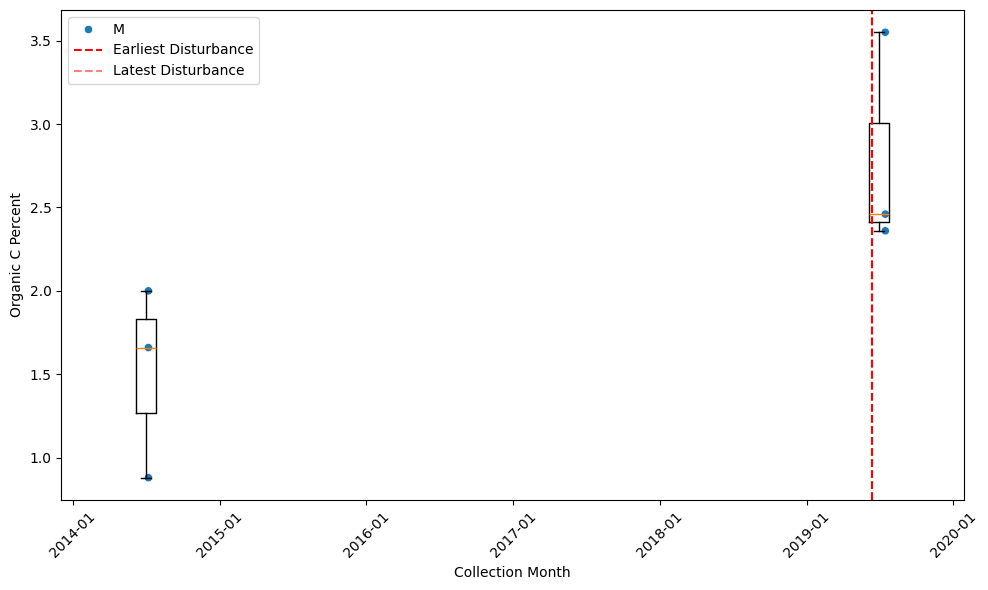

Processing plot: UNDE_001


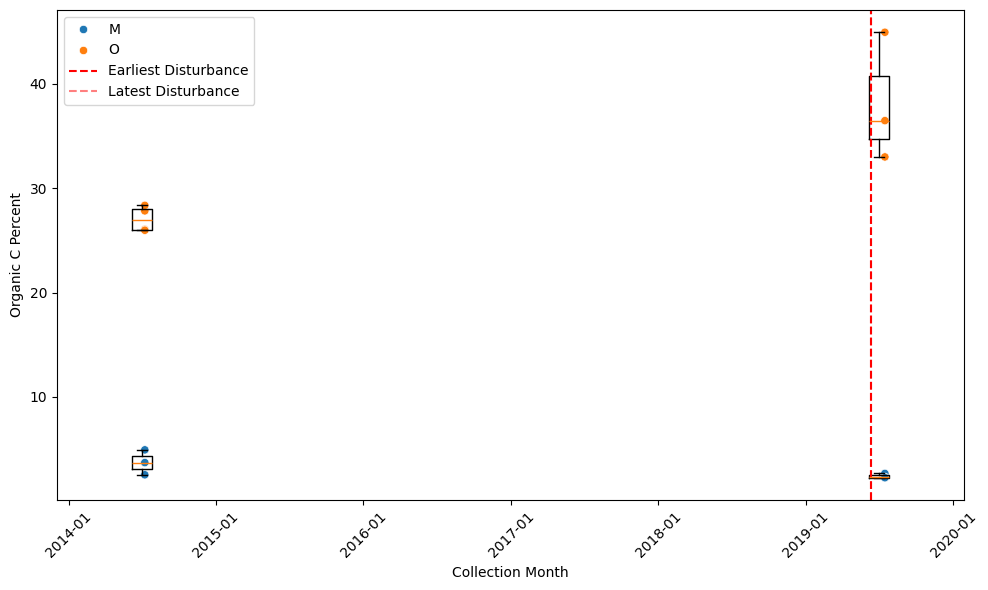

Processing plot: UNDE_043


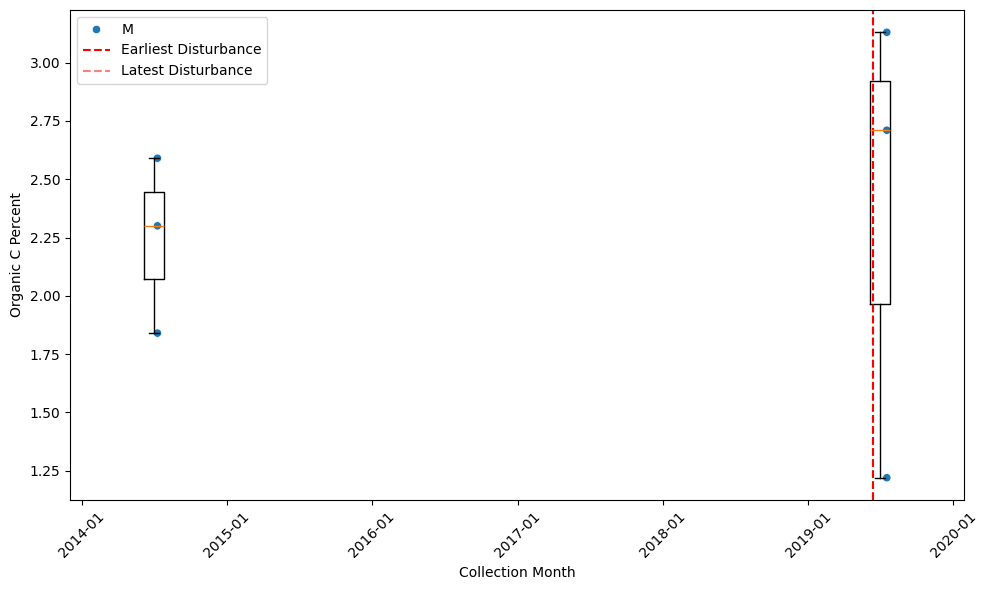

Processing plot: UNDE_037


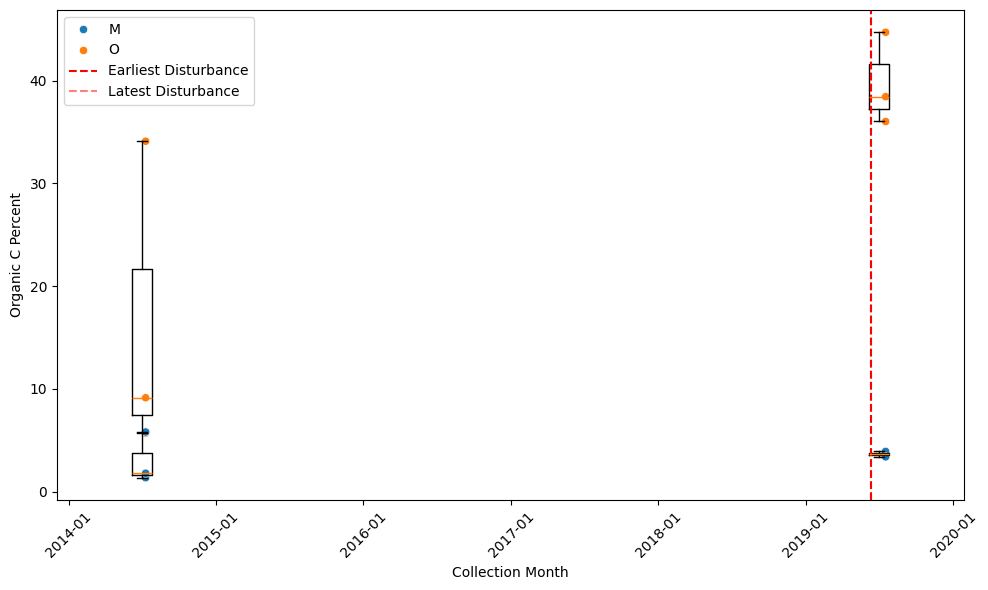

Processing plot: UNDE_044


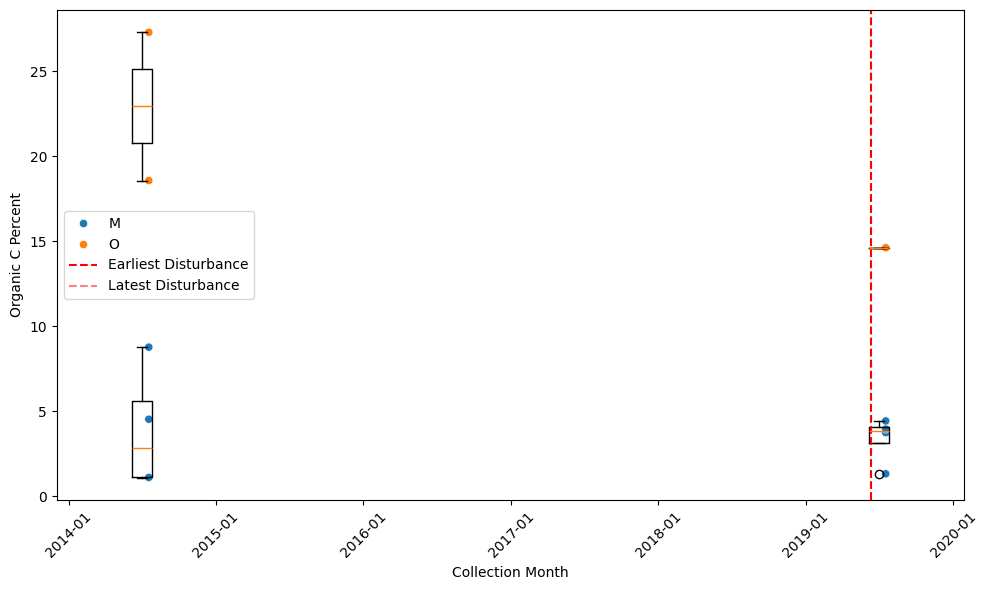

Processing plot: YELL_012


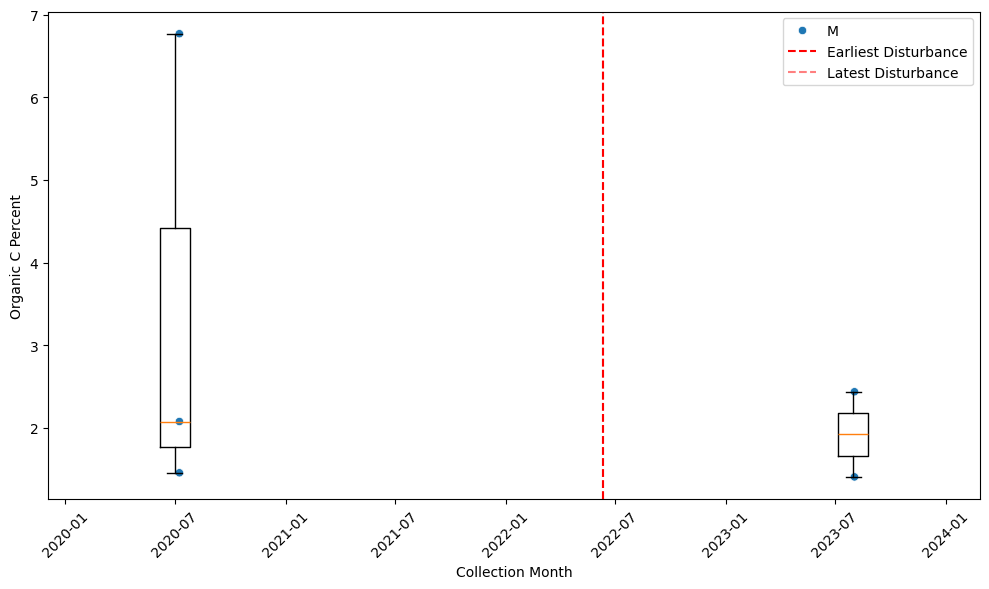

Processing plot: YELL_009


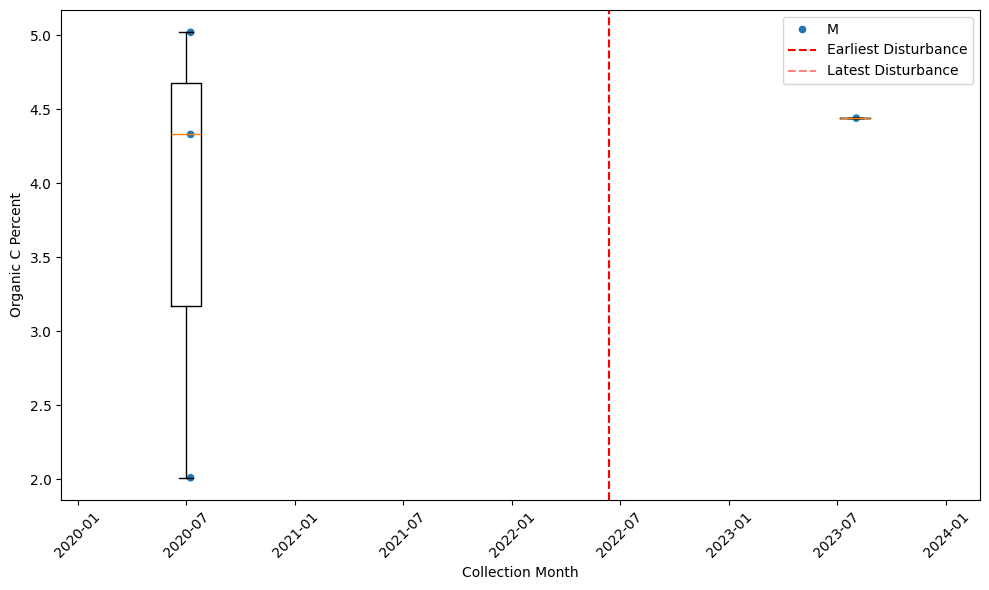

Processing plot: YELL_003


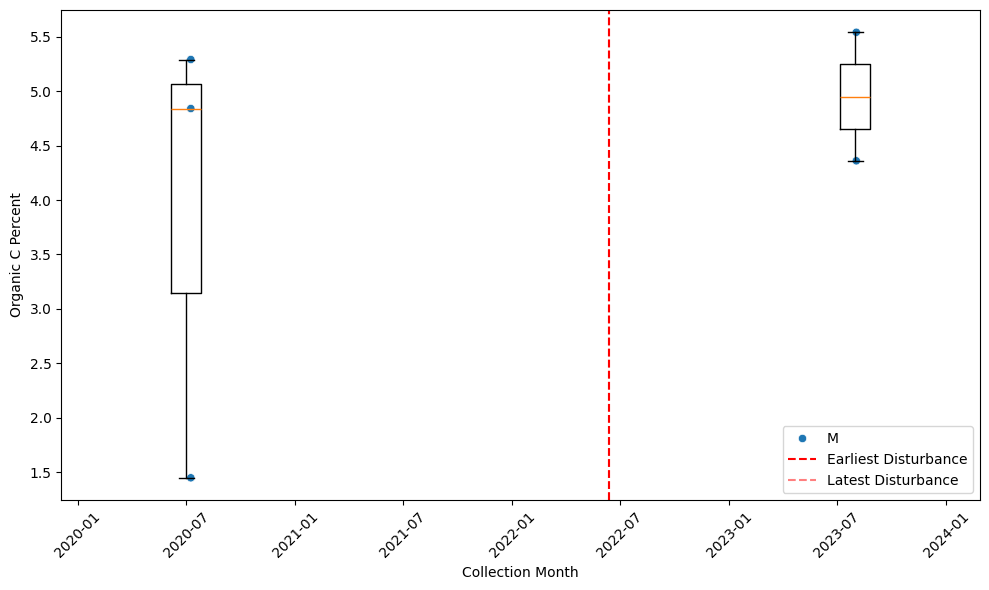

Processing plot: YELL_048


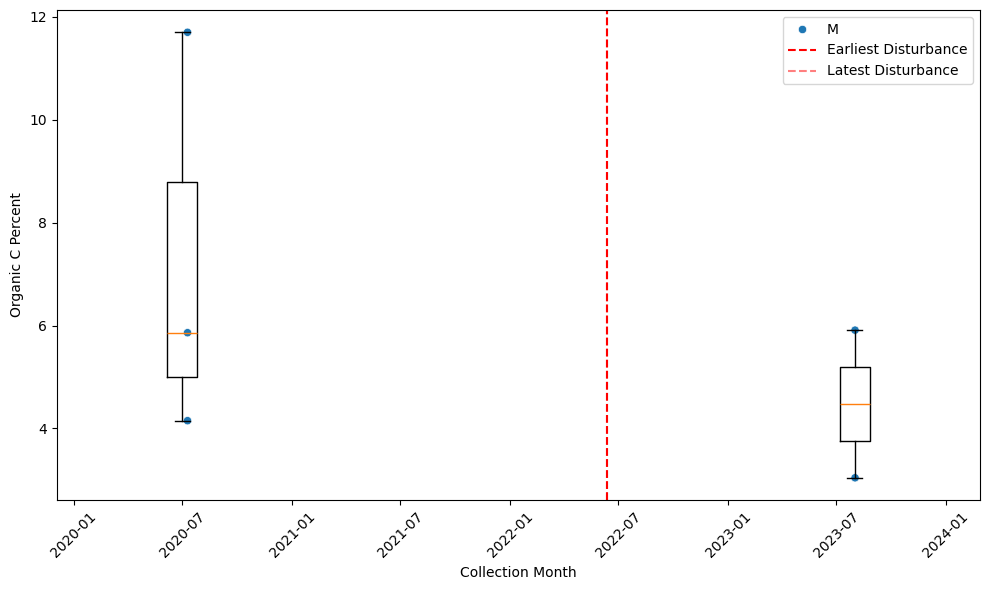

Processing plot: YELL_046


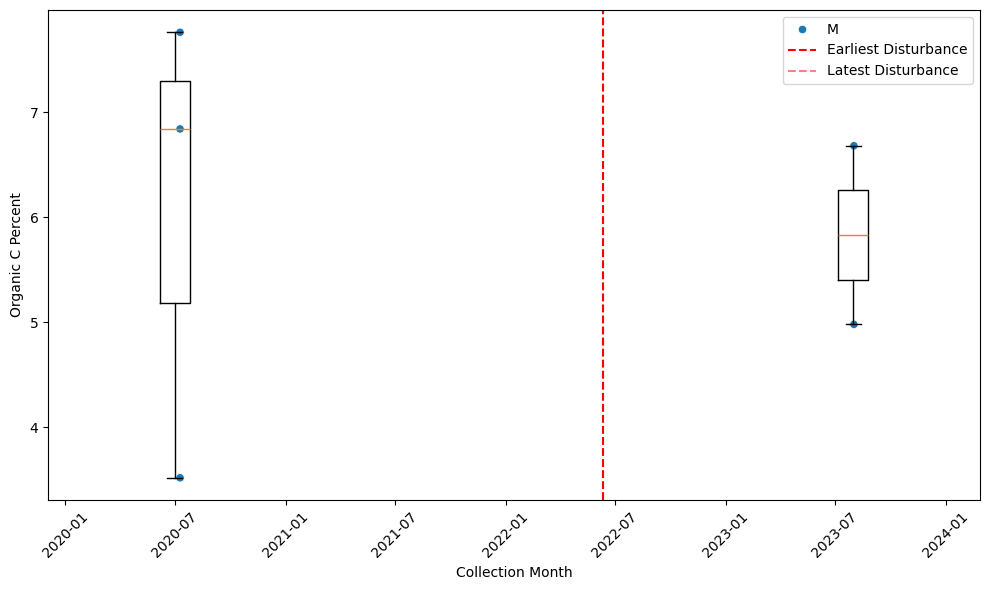

Processing plot: YELL_051


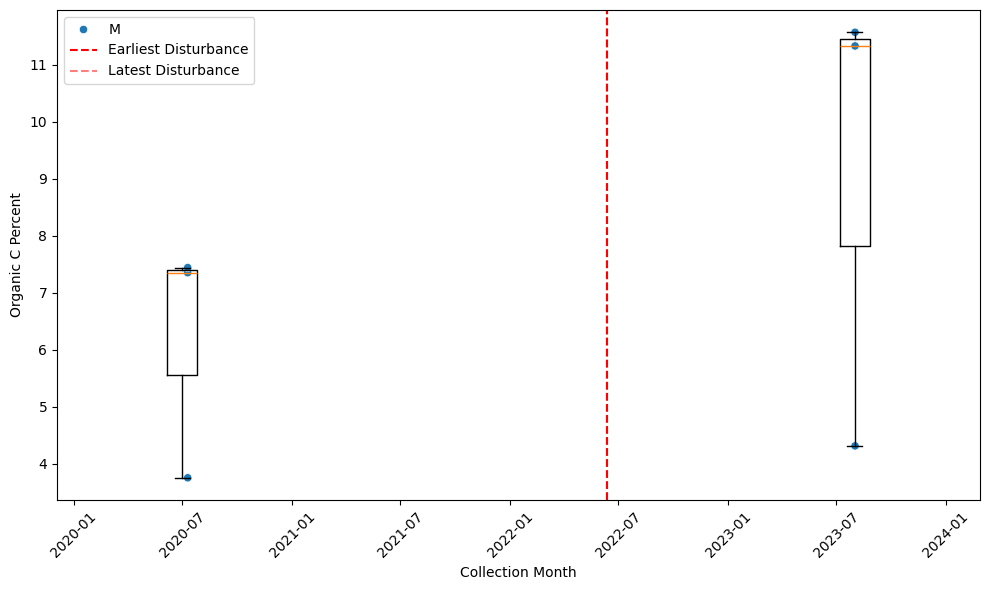

Processing plot: YELL_052


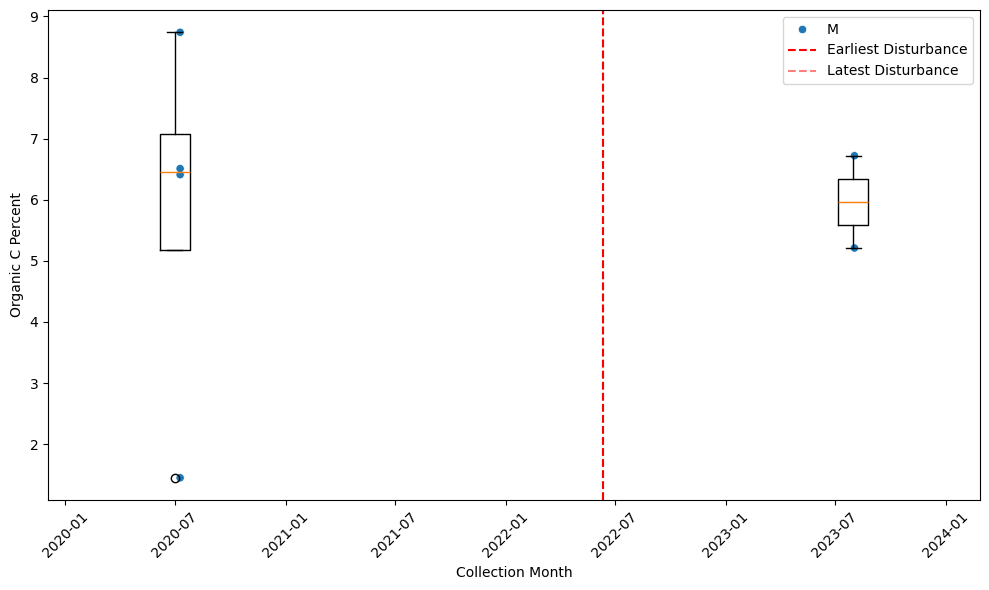

Processing plot: YELL_002


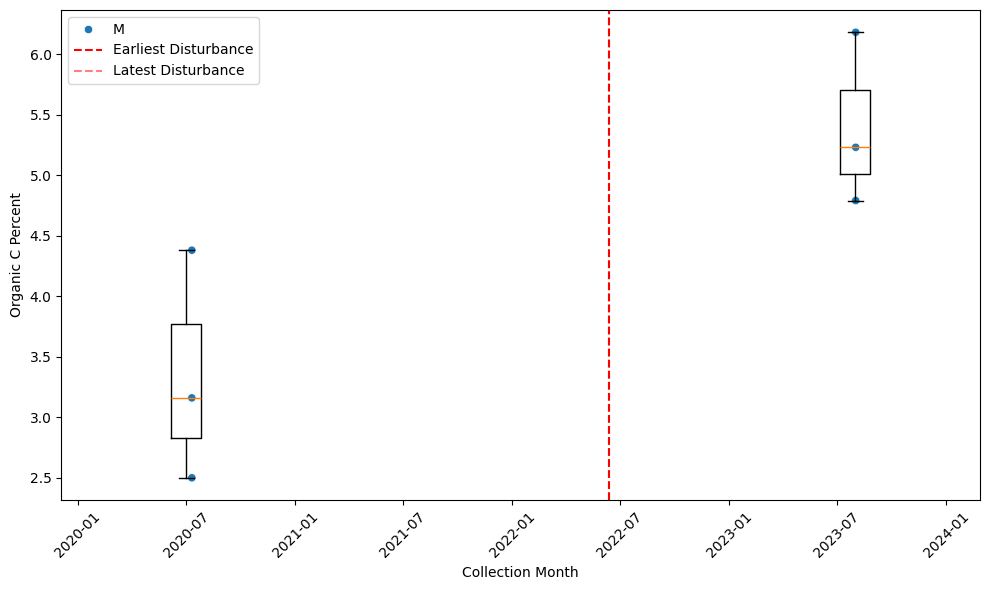

Processing plot: YELL_005


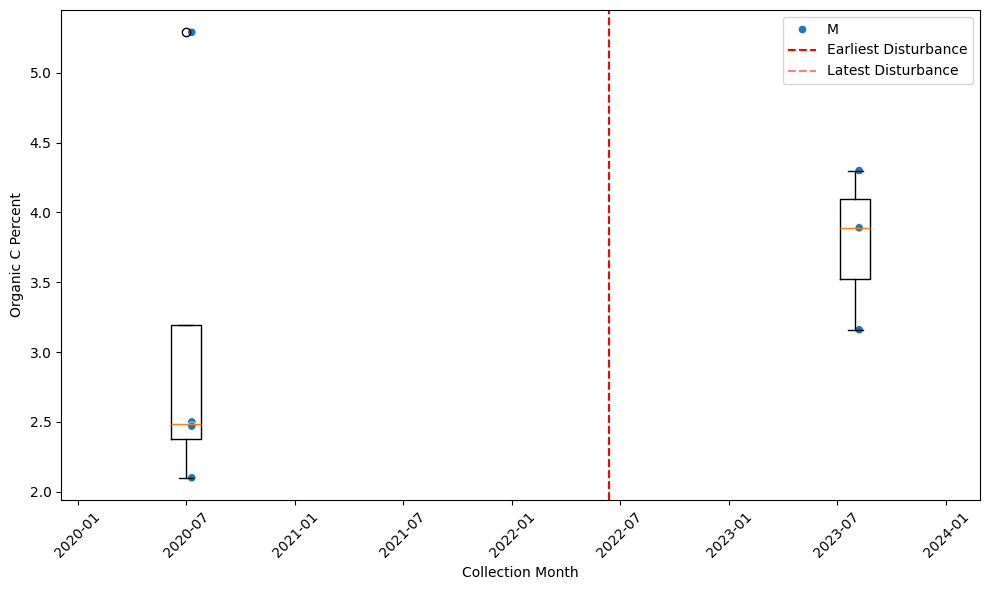

Processing plot: YELL_016


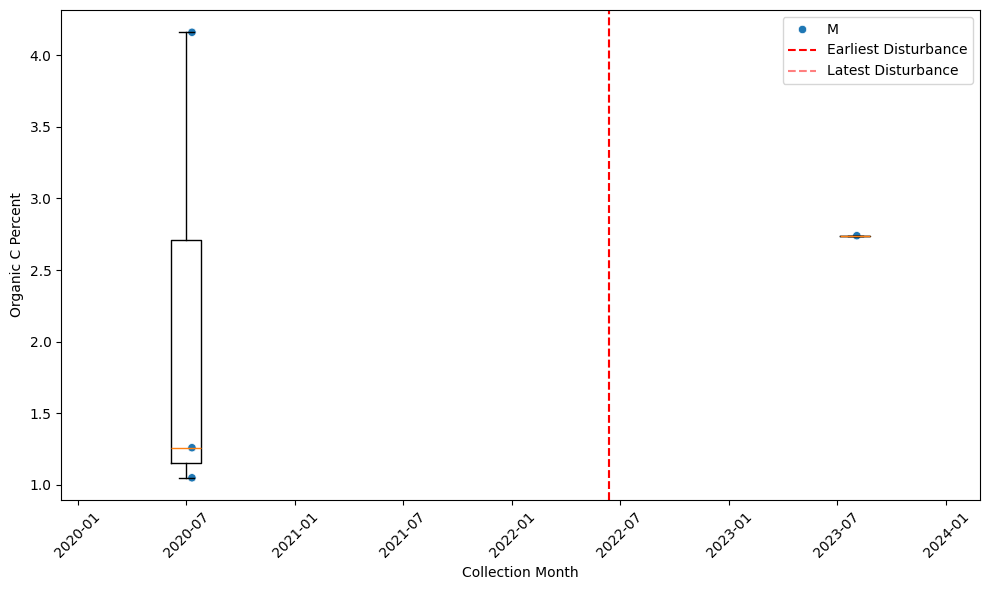

In [23]:
results = []

for plot in valid_plots:
    try:
        print(f"Processing plot: {plot}")
        row = analyze_plot_SOC(plot, chemistry_df, site_disturbance_dates, years_offset=10)
        results.append(row)
    except Exception as e:
        print(f"Failed to process plot {plot}: {e}")

# Convert to DataFrame
final_df = pd.DataFrame(results)
final_df.to_csv("SOC_byPlot_byYear.csv", index=False)
